<a href="https://colab.research.google.com/github/vmainmc/Organelle-Segmentation-with-Detectron2/blob/main/bitirme_detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

**How to Train [Detectron2](https://github.com/facebookresearch/detectron2) Segmentation on a Custom Dataset**

The notebook is based on official Detectron2 [colab notebook](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5) and it covers:
- Python environment setup
- Inference using pre-trained models
- Download, register and visualize COCO Format Dataset
- Configure, train and evaluate model using custom COCO Format Dataset

**Preparing a Custom Dataset**

In this tutorial, we will utilize an open source computer vision dataset from one of the 100,000+ available on [Roboflow Universe](https://universe.roboflow.com).

If you already have your own images (and, optionally, annotations), you can convert your dataset using [Roboflow](https://roboflow.com), a set of tools developers use to build better computer vision models quickly and accurately. 150k+ developers use roboflow for (automatic) annotation, converting dataset formats (like to Detectron2), training, deploying, and improving their datasets/models.

Follow [the getting started guide here](https://docs.roboflow.com/quick-start) to create and prepare your own custom dataset. Make sure to select **Instance Segmentation** Option, If you want to create your own dataset on roboflow

Useful Dataset Links

* [Helmet Instace Segmentation ](https://universe.roboflow.com/computer-vision-hx9i9/helmet_polygon_v2/dataset/4)

* [PCB Board Instance Segmentation](https://universe.roboflow.com/chip/pcb_segmentation_yolov7/dataset/17)

* [Fire Segmentation Instance Segmentation](https://universe.roboflow.com/fire-instance-segmentation/fire-detection-pr6nj/dataset/1)

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator` and set it to `GPU`.

In [ ]:
!nvidia-smi

Tue Jun  6 21:08:20 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install Detectron2 and dependencies

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-usjlf0r_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-usjlf0r_
  Resolved https://github.com/facebookresearch/detectron2.git to commit dd2db71b0f8d855b71cac655186cbddca1bfda93
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filena

Now is a good time to confirm that we have the right versions of the libraries at our disposal.

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [ ]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

## COCO Format Dataset

### Download

We use `football-pitch-segmentation` dataset as example. Feel free to visit [Roboflow Universe](https://universe.roboflow.com/), and select any other Instance Segmentation dataset. Make sure to download the dataset in correct - `COCO Segmentation` format. 

Structure of your dataset should look like this:

```
dataset-directory/
├─ README.dataset.txt
├─ README.roboflow.txt
├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="qGpUodzfLs5ylMRPd4VV")
project = rf.workspace("bitirme-aevnz").project("bitirme-lo0qk")
dataset = project.version(2).download("coco-segmentation")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.5 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=9436a85ce4e883ee5f3188d7c475c9d0bc8934a915c3e3c4e869cd40e877f3e8
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to bitirme-2 in coco-segmentation:: 100%|██████████| 365/365 [00:00<00:00, 1181.80it/s]


### Register

When you use Detectron2, before you actually train the model you need to [register it](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#register-a-coco-format-dataset).

In [ ]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [ ]:
# TRAIN SET
train_df = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=train_df, 
    metadata={}, 
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
test_df = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=test_df, 
    metadata={}, 
    json_file=TEST_DATA_SET_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
valid_df = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=valid_df, 
    metadata={}, 
    json_file=VALID_DATA_SET_ANN_FILE_PATH, 
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

We can now confirm that our custom dataset was correctly registered using [MetadataCatalog](https://detectron2.readthedocs.io/en/latest/modules/data.html#detectron2.data.MetadataCatalog).

In [ ]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['bitirme-train', 'bitirme-test', 'bitirme-valid']

### Visualize

Let's take a look at single entry from out train dataset.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



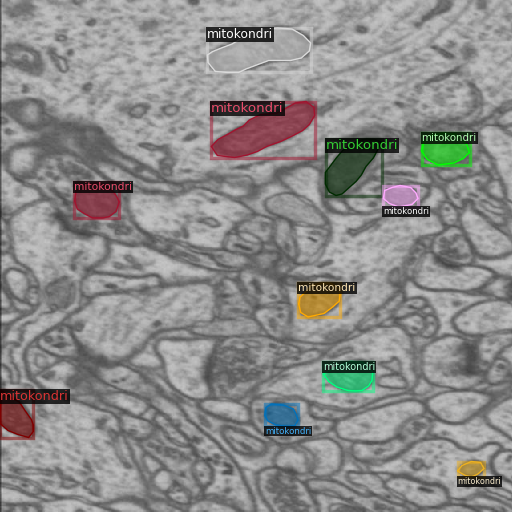

In [ ]:
metadata = MetadataCatalog.get(train_df)
dataset_train = DatasetCatalog.get(train_df)

dataset_entry = dataset_train[0]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

## Train Model Using Custom COCO Format Dataset 

### Configuration

In [ ]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 2000
EVAL_PERIOD = 300
BASE_LR = 0.001
NUM_CLASSES = 3

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (train_df,)
cfg.DATASETS.TEST = (test_df,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

### Training

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/06 21:13:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:01, 171MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[06/06 21:13:39 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[06/06 21:13:56 d2.utils.events]:  eta: 0:18:53  iter: 19  total_loss: 4.257  loss_cls: 1.318  loss_box_reg: 0.7141  loss_mask: 0.6906  loss_rpn_cls: 1.434  loss_rpn_loc: 0.1055    time: 0.6285  last_time: 0.6731  data_time: 0.0604  last_data_time: 0.0301   lr: 1.9981e-05  max_mem: 2412M
[06/06 21:14:18 d2.utils.events]:  eta: 0:18:33  iter: 39  total_loss: 2.582  loss_cls: 1.004  loss_box_reg: 0.6165  loss_mask: 0.6356  loss_rpn_cls: 0.2587  loss_rpn_loc: 0.08151    time: 0.6222  last_time: 0.6526  data_time: 0.0340  last_data_time: 0.0239   lr: 3.9961e-05  max_mem: 2416M
[06/06 21:14:29 d2.utils.events]:  eta: 0:17:45  iter: 59  total_loss: 2.129  loss_cls: 0.6237  loss_box_reg: 0.6949  loss_mask: 0.5372  loss_rpn_cls: 0.1276  loss_rpn_loc: 0.06697    time: 0.5900  last_time: 0.4481  data_time: 0.0264  last_data_time: 0.0091   lr: 5.9941e-05  max_mem: 2416M
[06/06 21:14:39 d2.utils.events]:  eta: 0:16:40  iter: 79  total_loss: 1.802  loss_cls: 0.4637  loss_box_reg: 0.7385  loss_mask:

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

### Evaluation

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[06/06 21:30:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from bitirme/mask_rcnn_R_101_FPN_3x/2023-06-06-21-13-34/model_final.pth ...


WARNING [06/06 21:30:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/06 21:30:57 d2.data.datasets.coco]: Loaded 14 images in COCO format from /content/bitirme-2/test/_annotations.coco.json


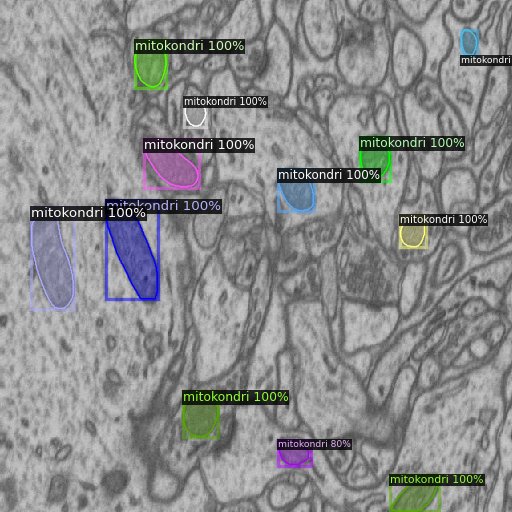

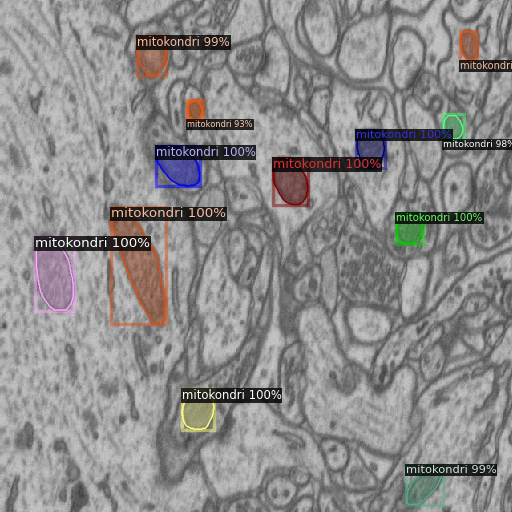

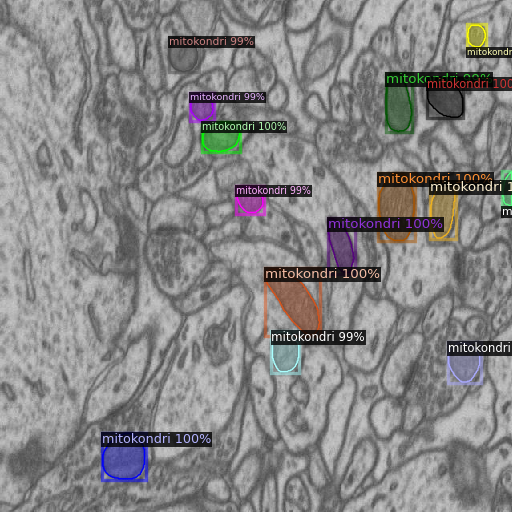

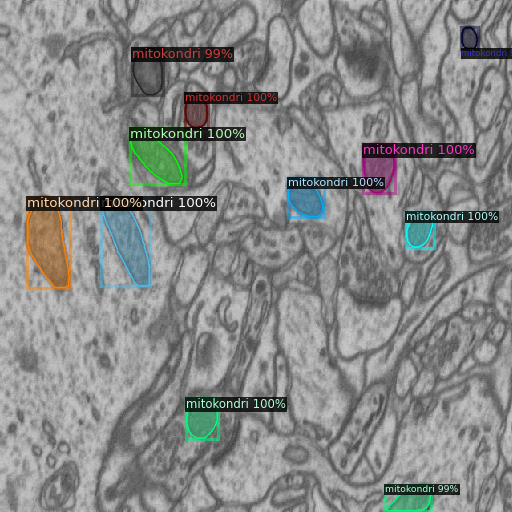

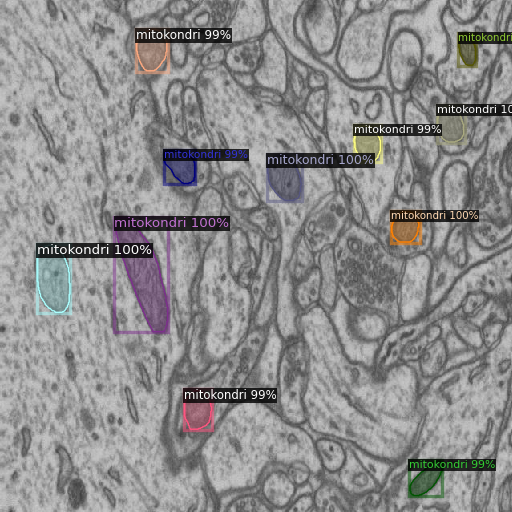

...

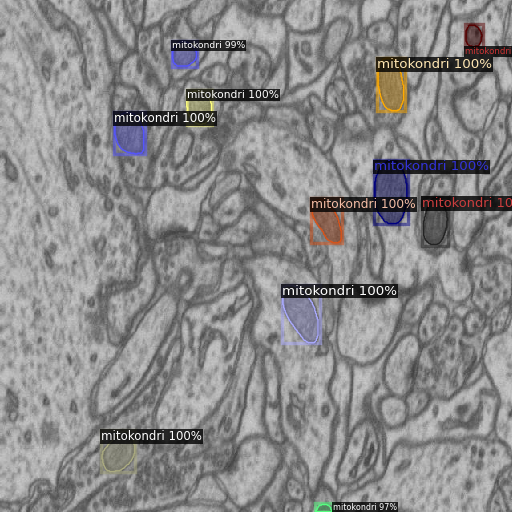

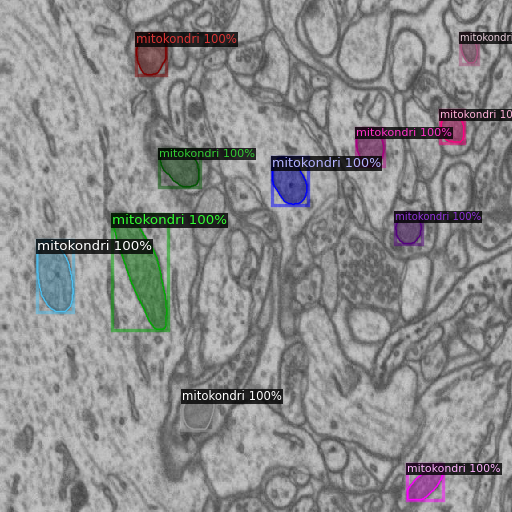

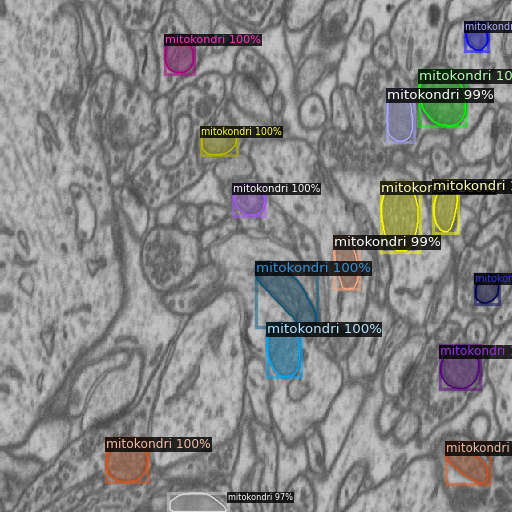

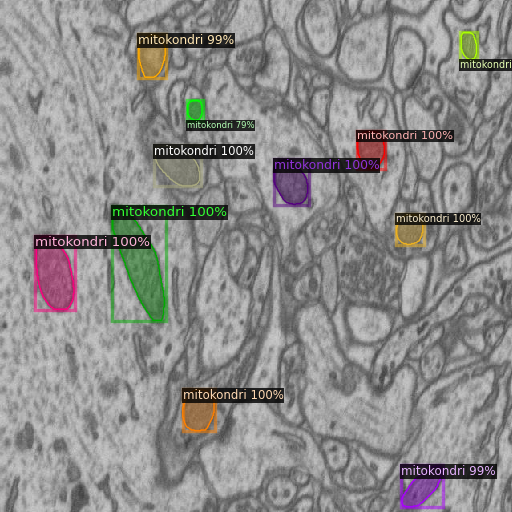

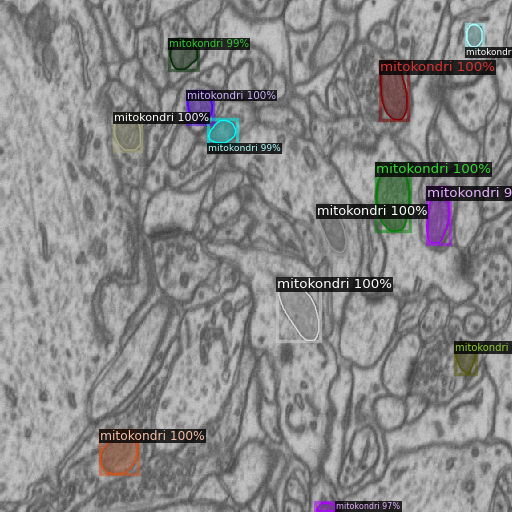

In [ ]:
dataset_test = DatasetCatalog.get(test_df)

for d in dataset_test:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata, 
        scale=0.8, 
        instance_mode=ColorMode.IMAGE_BW
    )
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from google.colab.patches import cv2_imshow
from PIL import Image

In [ ]:
import pandas as pd
from detectron2.structures import BoxMode

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import numpy as np
file_dict = {}


In [ ]:
import json
from pycocotools import mask
with open('/content/bitirme-2/test/_annotations.coco.json', 'r') as f:
    annotations = json.load(f)
count=0
image_data = {}
new_list = []
for annotation in annotations.values():
  if count < 4:
    count += 1
    pass
  if count % 4 == 0:
    count+=1
    for data in annotation:
      image_data[data['id']] = data['file_name']
count=0
for annotation2 in annotations.values():
  if count < 5:
    count += 1
    pass
  if count % 5 == 0:
    for annotation in annotation2:
      image_id = annotation['image_id']
      if image_id in image_data:
          new_annotation = {
              'file_name': image_data[image_id],
              'segmentation': annotation['segmentation']
          }
          new_list.append(new_annotation)
print(new_list)

[{'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[68.125, 259.167, 61.25, 255.833, 53.75, 261.667, 46.875, 268.333, 39.375, 275, 36.25, 285.833, 37.5, 302.5, 40, 321.667, 45, 338.333, 50, 353.333, 57.5, 370.833, 66.25, 387.5, 76.25, 387.5, 86.25, 380, 91.25, 369.167, 91.875, 353.333, 89.375, 335, 85, 323.333, 78.75, 310.833, 73.75, 295, 75, 280.833, 73.125, 270, 68.125, 259.167]]}, {'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[156.875, 335.833, 163.125, 349.167, 172.5, 363.333, 180.625, 376.667, 190.625, 378.333, 195, 370.833, 196.875, 356.667, 197.5, 345, 194.375, 326.667, 190, 316.667, 183.75, 301.667, 177.5, 285, 171.25, 269.167, 161.875, 259.167, 153.125, 251.667, 142.5, 247.5, 133.125, 251.667, 131.25, 264.167, 135.625, 284.167, 142.5, 299.167, 145, 312.5, 149.375, 325, 156.875, 335.833]]}, {'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[174.375, 100

In [ ]:
for d in new_list:
    file_name = d['file_name']
    if file_name not in file_dict:
        file_dict[file_name] = [d]
    else:
        file_dict[file_name].append(d)
print(file_dict)

{'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg': [{'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[68.125, 259.167, 61.25, 255.833, 53.75, 261.667, 46.875, 268.333, 39.375, 275, 36.25, 285.833, 37.5, 302.5, 40, 321.667, 45, 338.333, 50, 353.333, 57.5, 370.833, 66.25, 387.5, 76.25, 387.5, 86.25, 380, 91.25, 369.167, 91.875, 353.333, 89.375, 335, 85, 323.333, 78.75, 310.833, 73.75, 295, 75, 280.833, 73.125, 270, 68.125, 259.167]]}, {'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[156.875, 335.833, 163.125, 349.167, 172.5, 363.333, 180.625, 376.667, 190.625, 378.333, 195, 370.833, 196.875, 356.667, 197.5, 345, 194.375, 326.667, 190, 316.667, 183.75, 301.667, 177.5, 285, 171.25, 269.167, 161.875, 259.167, 153.125, 251.667, 142.5, 247.5, 133.125, 251.667, 131.25, 264.167, 135.625, 284.167, 142.5, 299.167, 145, 312.5, 149.375, 325, 156.875, 335.833]]}, {'file_name': 'training-141_jpg.rf.18dfe17b

/content/bitirme-2/test/training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg


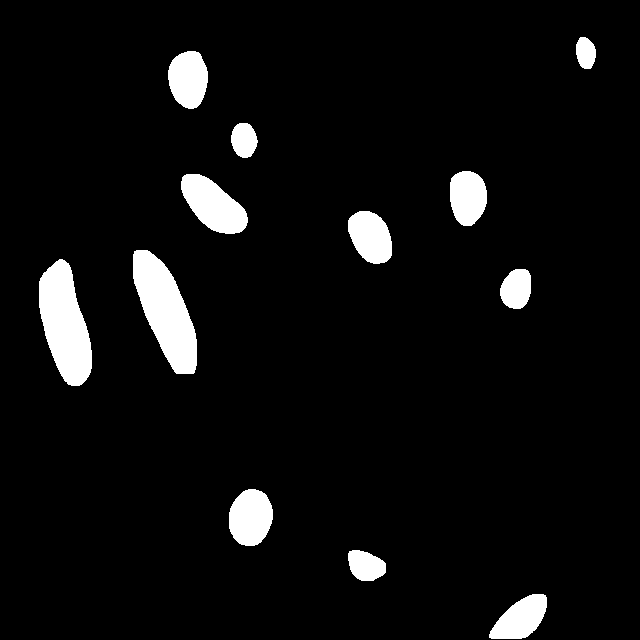

/content/bitirme-2/test/training-152_jpg.rf.7d97c4c0cede9847c381434fd5b3acd6.jpg


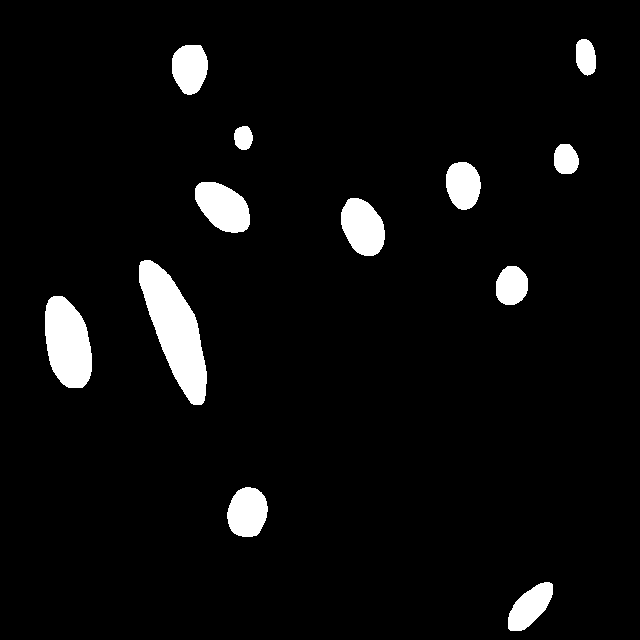

/content/bitirme-2/test/training-072_jpg.rf.a042f366d687840722dfc67ef59b8d97.jpg


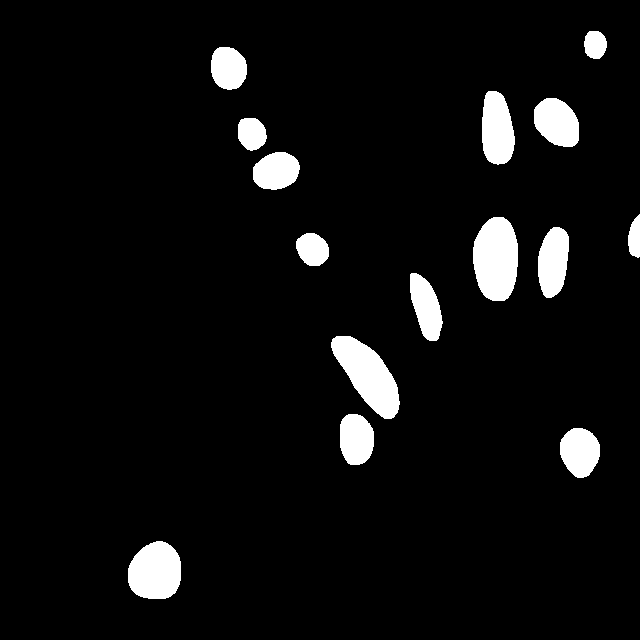

/content/bitirme-2/test/training-127_jpg.rf.041df53f0bb3cff0f28d86b21c9a2f6b.jpg


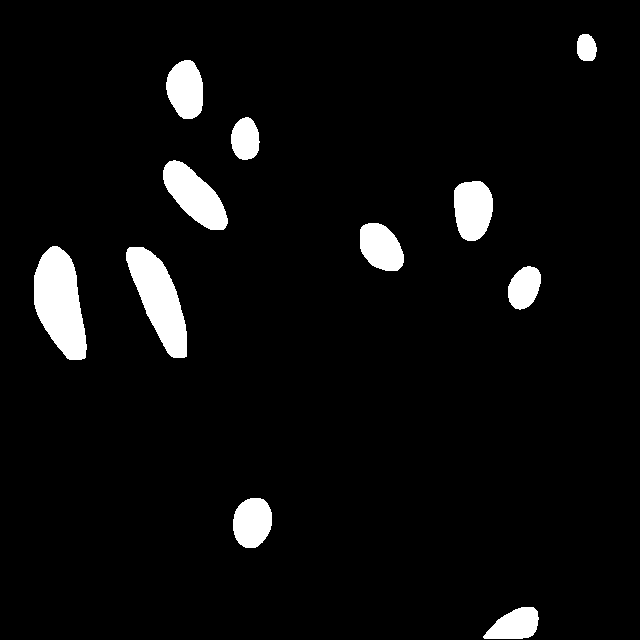

/content/bitirme-2/test/training-160_jpg.rf.0b41a3bed9801f12ad88a601a0934276.jpg


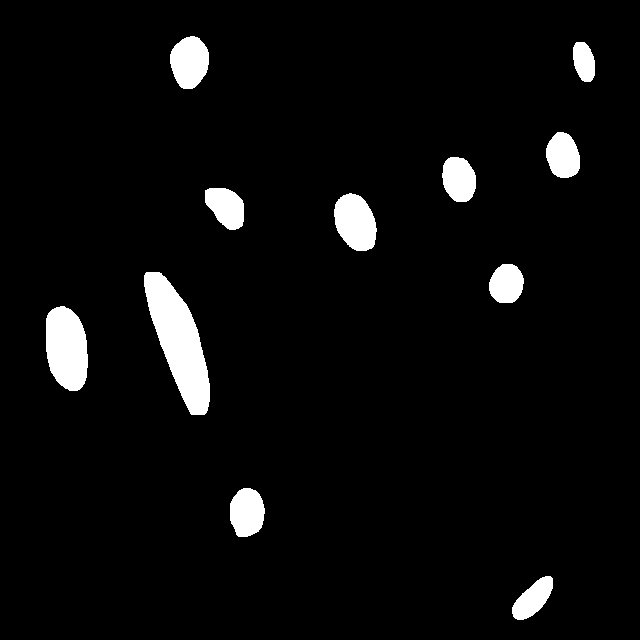

/content/bitirme-2/test/training-089_jpg.rf.658e54943df0138e8aed7fcdbb8fec55.jpg


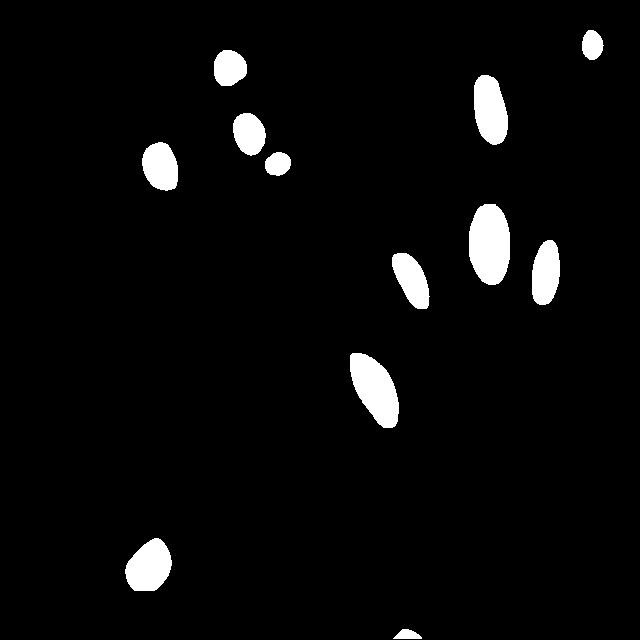

/content/bitirme-2/test/training-046_jpg.rf.63abae95aae9462b3e67bcf84ad2fd42.jpg


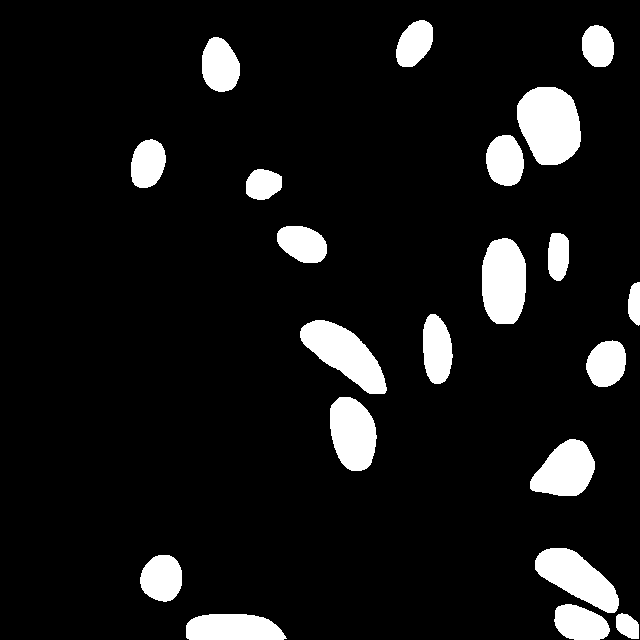

/content/bitirme-2/test/training-036_jpg.rf.3ab9d817d7cd0b5442d5005c1253e17c.jpg


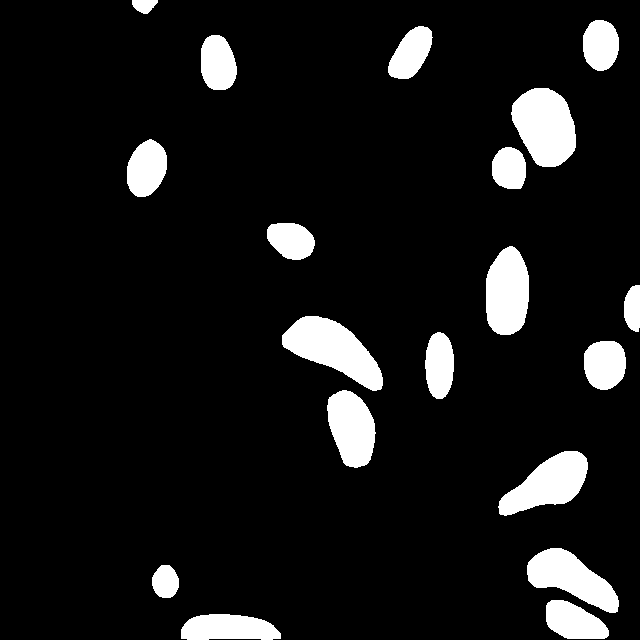

/content/bitirme-2/test/training-075_jpg.rf.94510589cc403821e533d51aa9765ad1.jpg


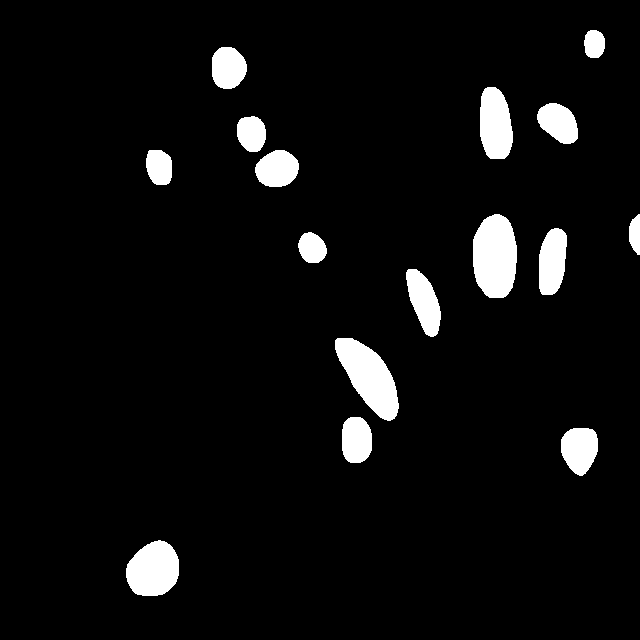

/content/bitirme-2/test/training-093_jpg.rf.de2d138ab171bb3363951c6b74e07075.jpg


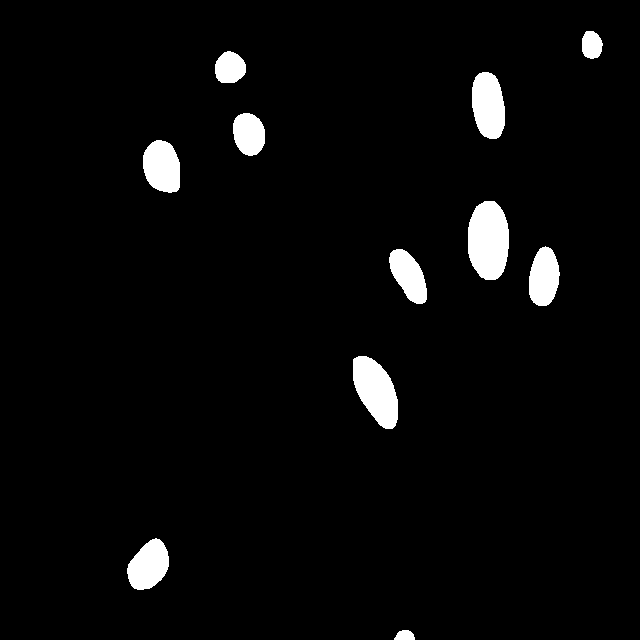

/content/bitirme-2/test/training-155_jpg.rf.a52fbee5f763e51d18fb933f2eb8b276.jpg


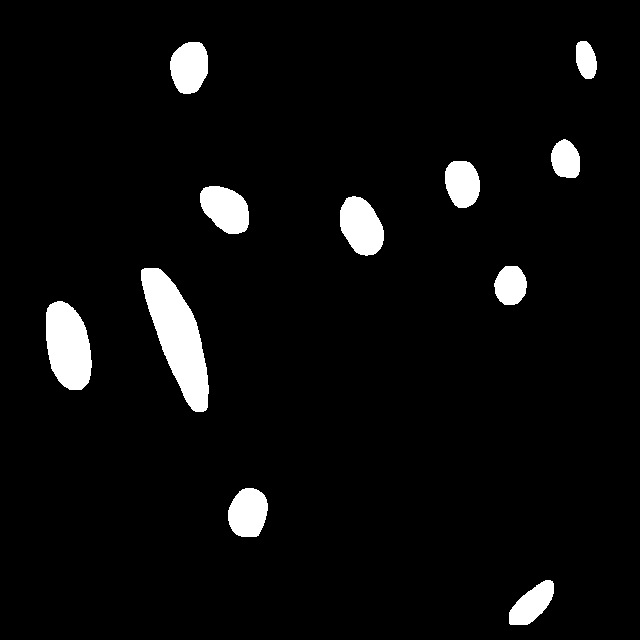

/content/bitirme-2/test/training-060_jpg.rf.f8fe2e68e856033570dfb9a48cd46023.jpg


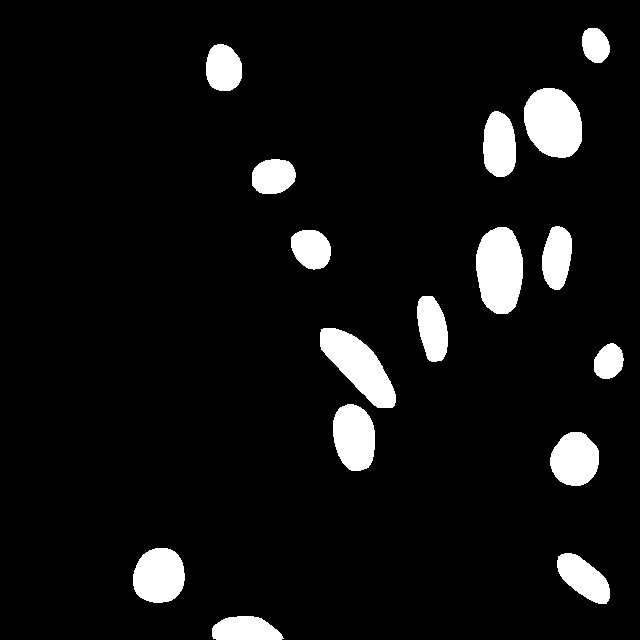

/content/bitirme-2/test/training-151_jpg.rf.adc48b79e697b162c52bbfc413721ac9.jpg


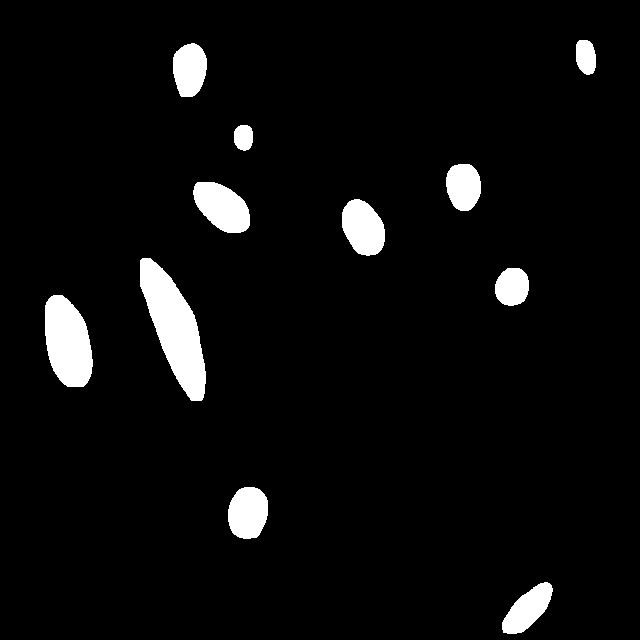

/content/bitirme-2/test/training-085_jpg.rf.cf79eced71926f0bf3a20d39be2e6141.jpg


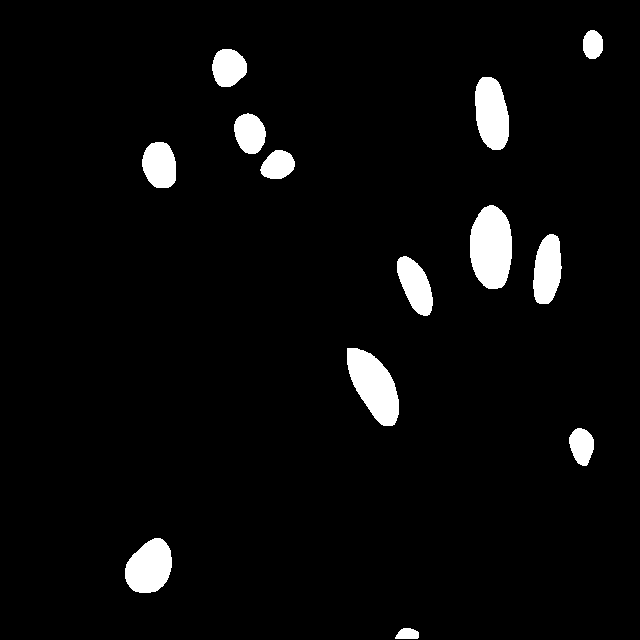

In [ ]:
predicted_mask = np.zeros_like(img)  # Boş bir maske oluştur
pd_mask_list=[]

for d in dataset_test:
  
    img = cv2.imread(d["file_name"])
    predicted_mask = np.zeros_like(img[:, :, 0])  # img ile aynı boyutta bir dizi oluştur

    outputs = predictor(img)
    instances = outputs["instances"]
    masks = instances.pred_masks.cpu().numpy()
    combined_mask = np.logical_or.reduce(masks).astype(np.uint8) * 255
    print(d["file_name"])
    pd_mask_list.append(combined_mask)
    cv2_imshow(combined_mask)
    # Her bir maskeyi birleştir
    





training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg


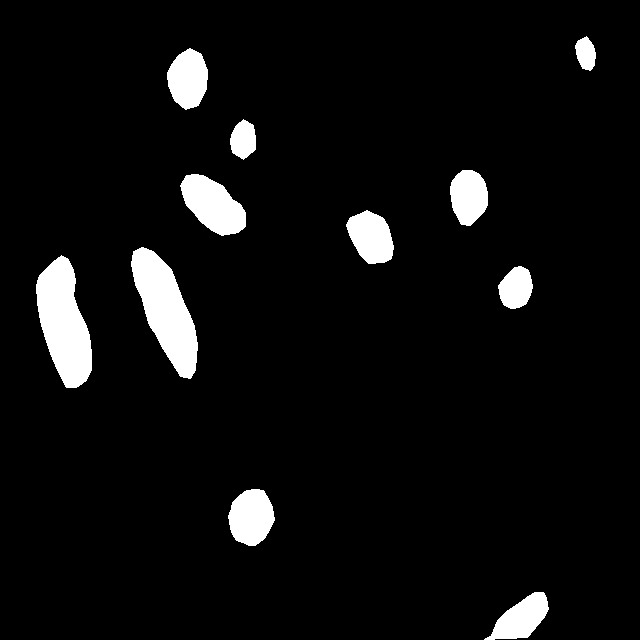

training-152_jpg.rf.7d97c4c0cede9847c381434fd5b3acd6.jpg


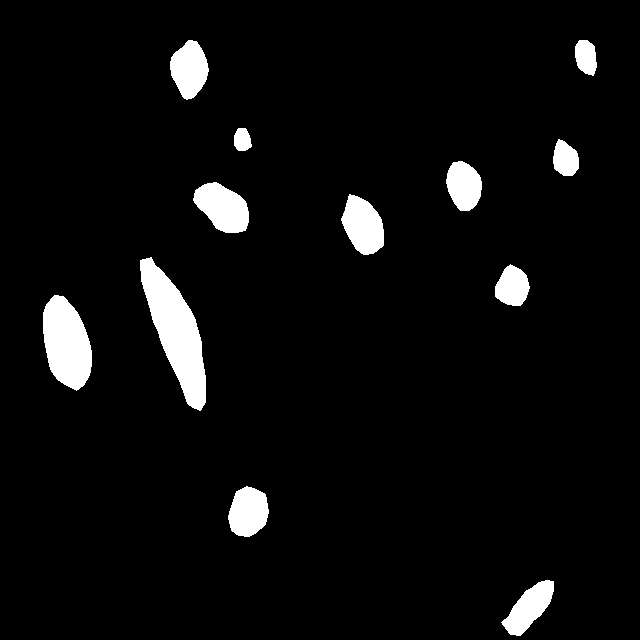

training-072_jpg.rf.a042f366d687840722dfc67ef59b8d97.jpg


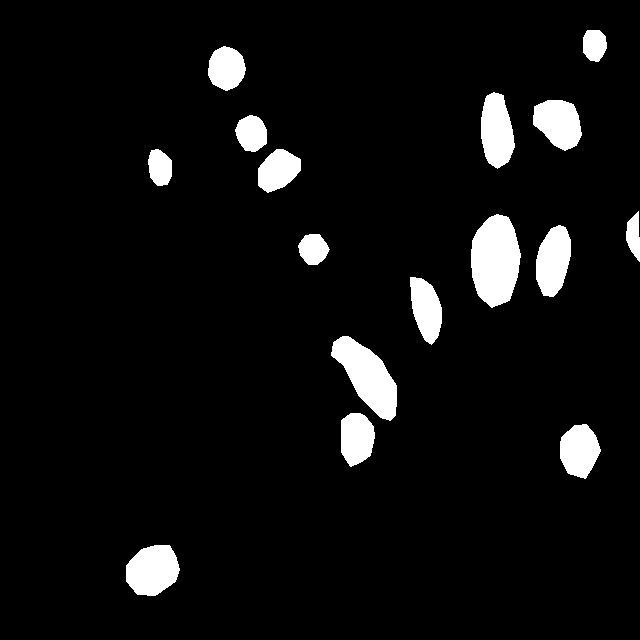

training-127_jpg.rf.041df53f0bb3cff0f28d86b21c9a2f6b.jpg


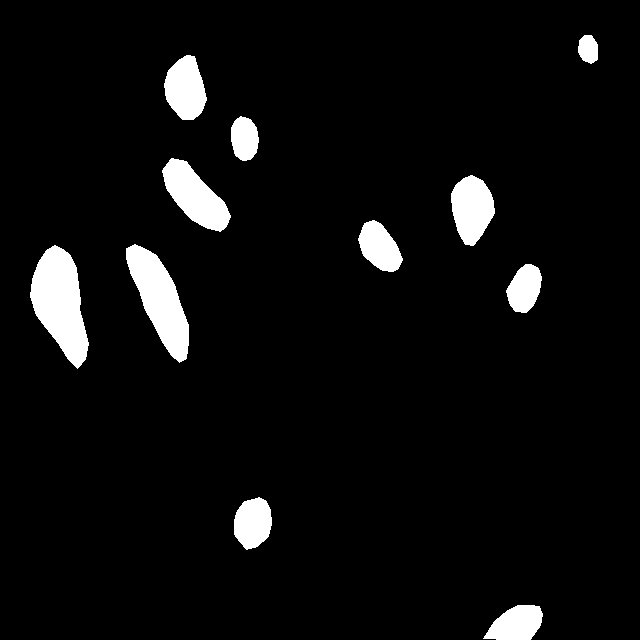

training-160_jpg.rf.0b41a3bed9801f12ad88a601a0934276.jpg


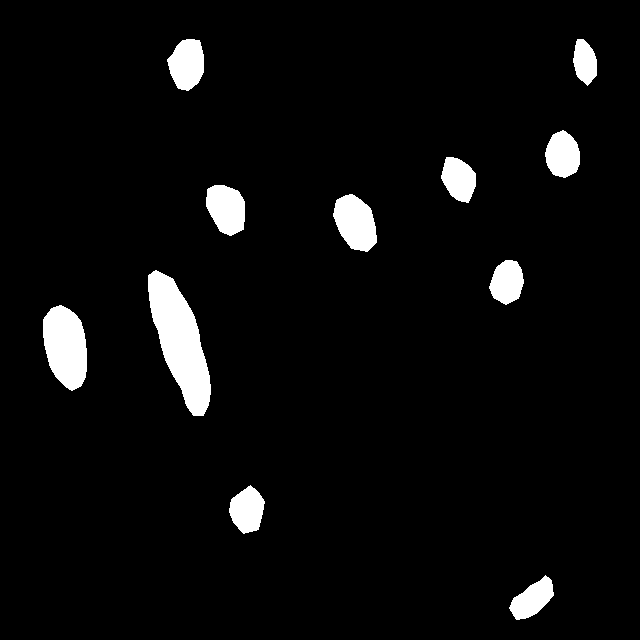

training-089_jpg.rf.658e54943df0138e8aed7fcdbb8fec55.jpg


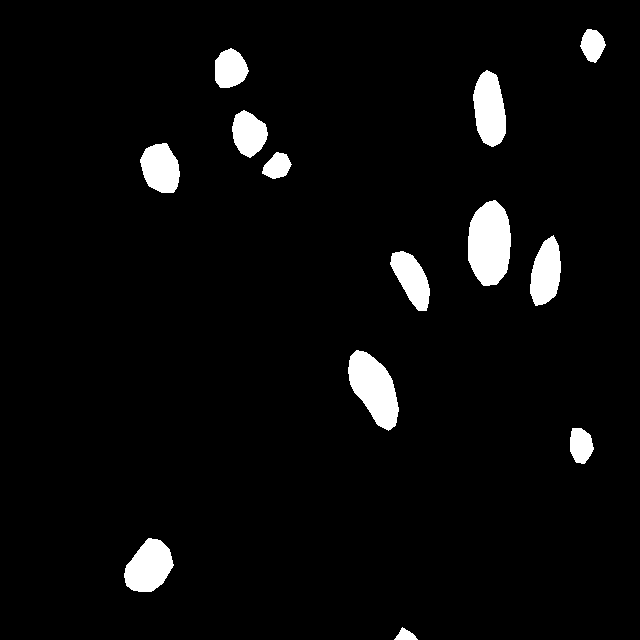

training-046_jpg.rf.63abae95aae9462b3e67bcf84ad2fd42.jpg


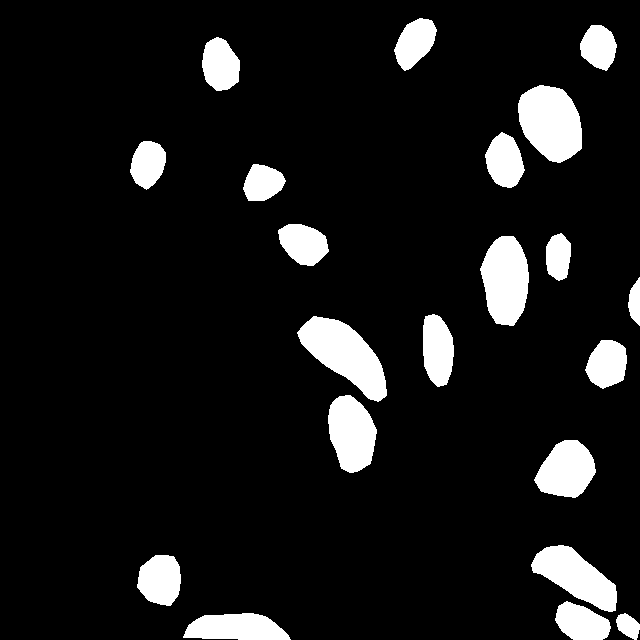

training-036_jpg.rf.3ab9d817d7cd0b5442d5005c1253e17c.jpg


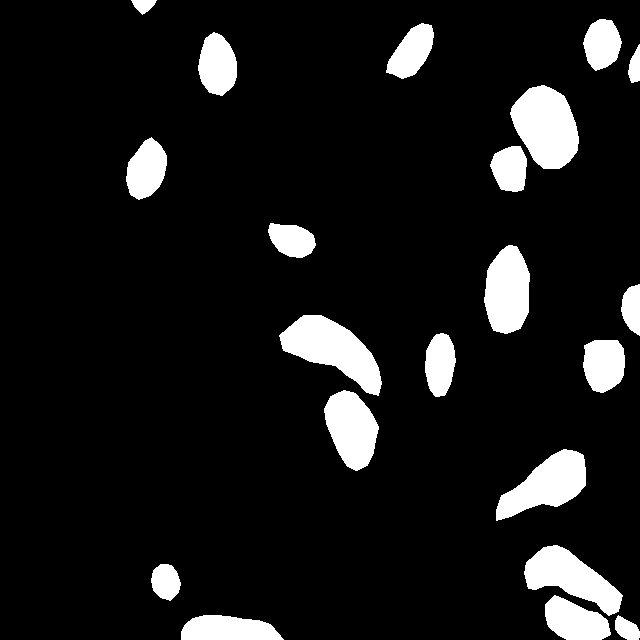

training-075_jpg.rf.94510589cc403821e533d51aa9765ad1.jpg


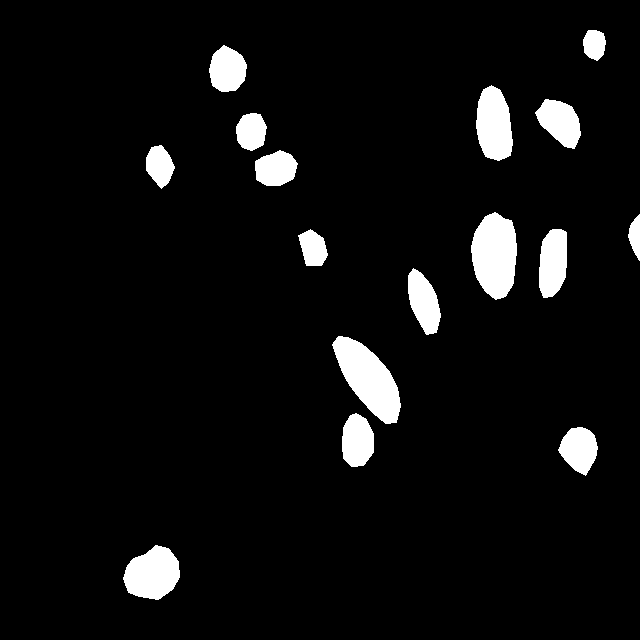

training-093_jpg.rf.de2d138ab171bb3363951c6b74e07075.jpg


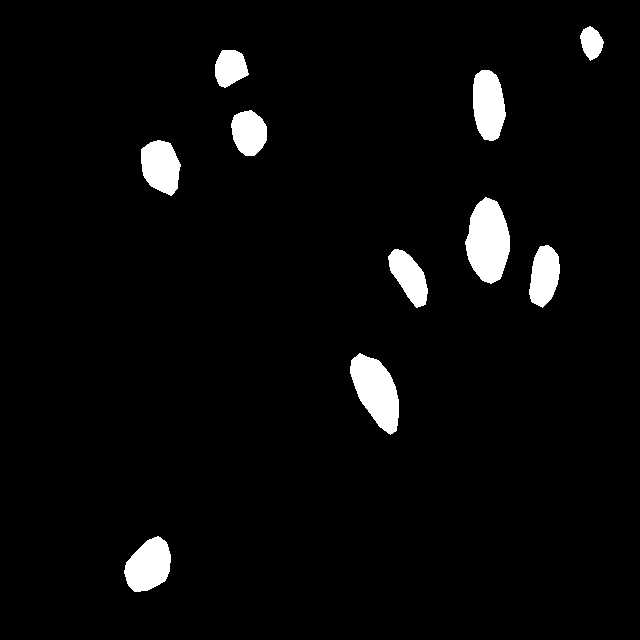

training-155_jpg.rf.a52fbee5f763e51d18fb933f2eb8b276.jpg


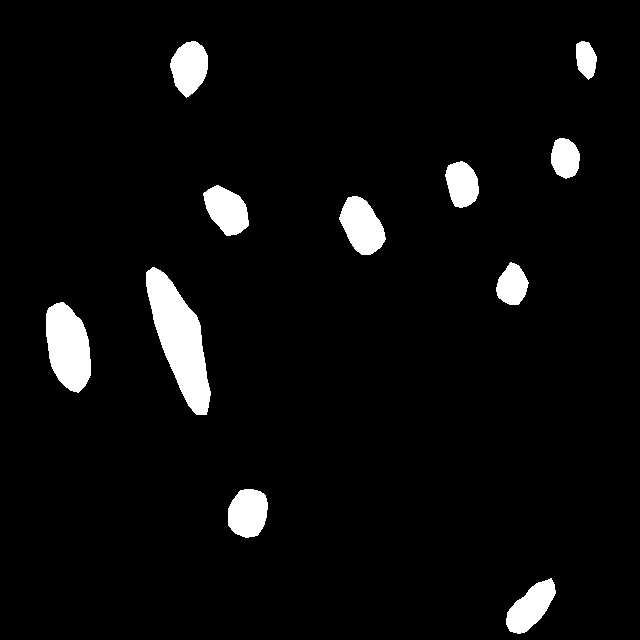

training-060_jpg.rf.f8fe2e68e856033570dfb9a48cd46023.jpg


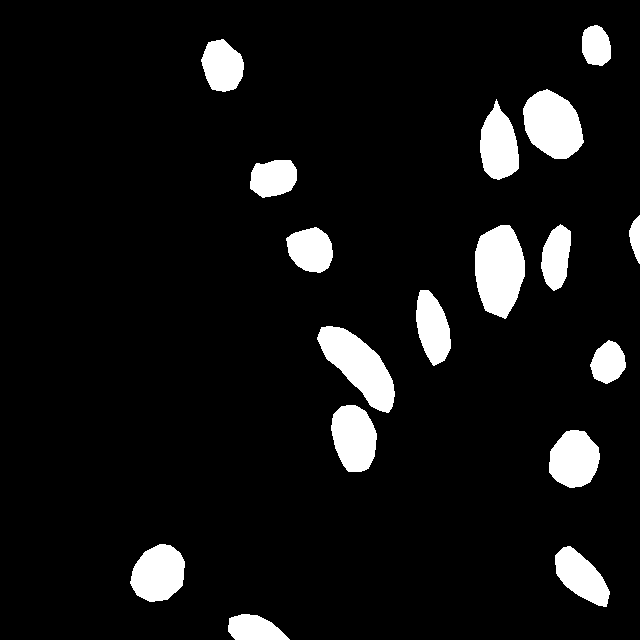

training-151_jpg.rf.adc48b79e697b162c52bbfc413721ac9.jpg


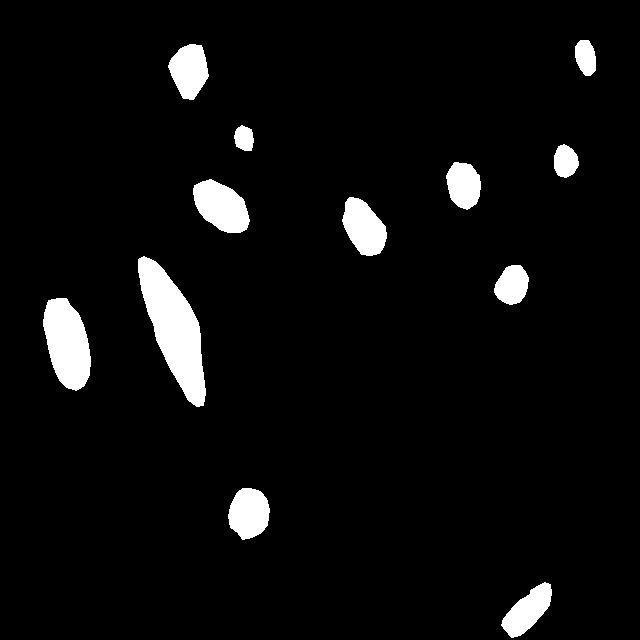

training-085_jpg.rf.cf79eced71926f0bf3a20d39be2e6141.jpg


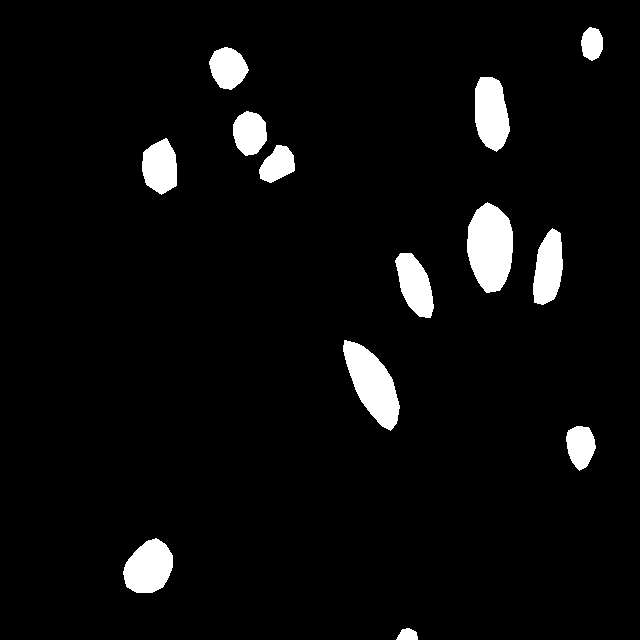

In [ ]:
gt_mask_list = []
for file_name in file_dict:
    # ilgili sözlük listesini al
    dict_list = file_dict[file_name]
    mask_shape = (640, 640)  # Maske boyutunu belirtin
    ground_truth_mask = np.zeros(mask_shape, dtype=np.uint8)
    
    # her sözlükteki segmentasyon verilerini al ve plot et
    for d in dict_list:
        segmentation = d['segmentation'][0]
        x = segmentation[0::2]
        y = segmentation[1::2]
        points = list(zip(x, y))
        polygon_points = np.array(points, np.int32)
        polygon_points = polygon_points.reshape((-1, 1, 2))
        cv2.fillPoly(ground_truth_mask, [polygon_points], 255) 
    gt_mask_list.append(ground_truth_mask)  
    print(file_name)
    cv2_imshow( ground_truth_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
       
        
    
    # görselleştirme   


In [ ]:
toplam=0
sayac=0
for gt_mask, pd_mask in zip(gt_mask_list, pd_mask_list):
  intersection = np.logical_and(gt_mask, pd_mask)
  union = np.logical_or(gt_mask, pd_mask)
  iou = np.sum(intersection) / np.sum(union)
  toplam=toplam+iou
  sayac=sayac+1
sonuc=toplam/sayac
print("Train verisinden alınan verilerle ortalama jaccard değeri:",sonuc)

Train verisinden alınan verilerle ortalama jaccard değeri: 0.8753896407683472


In [ ]:
rf = Roboflow(api_key="dhNkBoh6HWJmqWm3D9W5")
project = rf.workspace("cellsegmentation").project("gh-n4jgw")
real_test = project.version(1).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to gh-1 in coco-segmentation:: 100%|██████████| 169/169 [00:00<00:00, 1277.31it/s]


In [ ]:
NEW_DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
test_df_new = f"{NEW_DATA_SET_NAME}-yenitest"
TEST_DATA_SET_NEW_IMAGES_DIR_PATH = "/content/gh-1/test"
TEST_DATA_SET_NEW_ANN_FILE_PATH = "/content/gh-1/test/_annotations.coco.json"

register_coco_instances(
    name=test_df_new,
    metadata={}, 
    json_file=TEST_DATA_SET_NEW_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_NEW_IMAGES_DIR_PATH
)
cfg.DATASETS.TEST = (test_df_new,)

In [ ]:
new_dataset_test = DatasetCatalog.get(test_df_new)


WARNING [06/06 21:31:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/06 21:31:21 d2.data.datasets.coco]: Loaded 165 images in COCO format from /content/gh-1/test/_annotations.coco.json


In [ ]:
with open('/content/gh-1/test/_annotations.coco.json', 'r') as f:
    annotations = json.load(f)
count=0
image_data = {}
new_list_test = []
for annotation in annotations.values():
  if count < 4:
    count += 1
    pass
  if count % 4 == 0:
    count+=1
    for data in annotation:
      image_data[data['id']] = data['file_name']
count=0
for annotation2 in annotations.values():
  if count < 5:
    count += 1
    pass
  if count % 5 == 0:
    for annotation in annotation2:
      image_id = annotation['image_id']
      if image_id in image_data:
          new_annotation = {
              'file_name': image_data[image_id],
              'segmentation': annotation['segmentation']
          }
          new_list_test.append(new_annotation)
print(new_list_test)

[{'file_name': 'testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg', 'segmentation': [[99.306, 535.185, 97.917, 528.704, 82.639, 527.778, 66.667, 542.593, 56.944, 551.852, 54.861, 577.778, 52.083, 600, 48.611, 621.296, 52.778, 636.111, 63.194, 637.037, 77.083, 627.778, 83.333, 605.556, 81.25, 587.963, 94.444, 555.556, 99.306, 535.185]]}, {'file_name': 'testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg', 'segmentation': [[400, 512.963, 403.472, 528.704, 420.139, 537.963, 443.75, 528.704, 454.861, 507.407, 448.611, 483.333, 434.722, 469.444, 415.278, 467.593, 404.861, 481.481, 400.694, 495.37, 400, 512.963]]}, {'file_name': 'testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg', 'segmentation': [[498.611, 590.741, 509.722, 595.37, 521.528, 586.111, 521.528, 574.074, 519.444, 564.815, 513.889, 556.481, 502.083, 558.333, 493.75, 570.37, 494.444, 578.704, 498.611, 590.741]]}, {'file_name': 'testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg', 'segmentation': [[579.861, 61

In [ ]:
new_file_dict={}
for d in new_list_test:
    file_name = d['file_name']
    if file_name not in new_file_dict:
        new_file_dict[file_name] = [d]
    else:
        new_file_dict[file_name].append(d)
print(file_dict)

{'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg': [{'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[68.125, 259.167, 61.25, 255.833, 53.75, 261.667, 46.875, 268.333, 39.375, 275, 36.25, 285.833, 37.5, 302.5, 40, 321.667, 45, 338.333, 50, 353.333, 57.5, 370.833, 66.25, 387.5, 76.25, 387.5, 86.25, 380, 91.25, 369.167, 91.875, 353.333, 89.375, 335, 85, 323.333, 78.75, 310.833, 73.75, 295, 75, 280.833, 73.125, 270, 68.125, 259.167]]}, {'file_name': 'training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg', 'segmentation': [[156.875, 335.833, 163.125, 349.167, 172.5, 363.333, 180.625, 376.667, 190.625, 378.333, 195, 370.833, 196.875, 356.667, 197.5, 345, 194.375, 326.667, 190, 316.667, 183.75, 301.667, 177.5, 285, 171.25, 269.167, 161.875, 259.167, 153.125, 251.667, 142.5, 247.5, 133.125, 251.667, 131.25, 264.167, 135.625, 284.167, 142.5, 299.167, 145, 312.5, 149.375, 325, 156.875, 335.833]]}, {'file_name': 'training-141_jpg.rf.18dfe17b

testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg


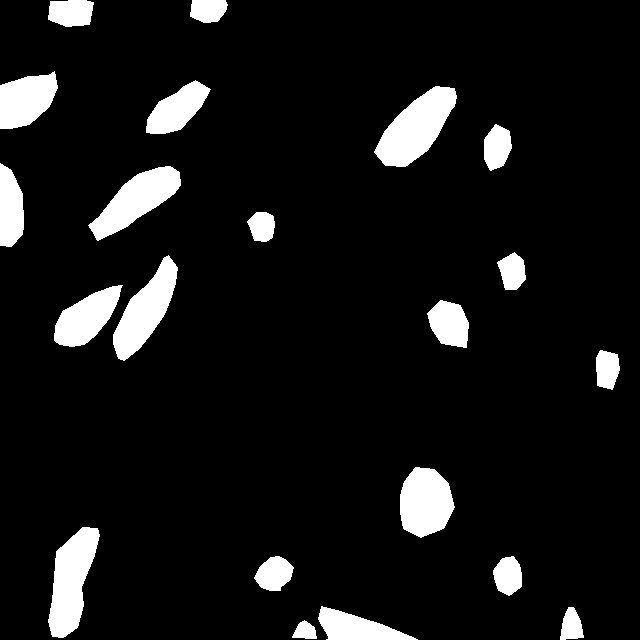

testing-076_jpg.rf.0fa1a1e00d572e0f7b6ed8cf3d2d7c07.jpg


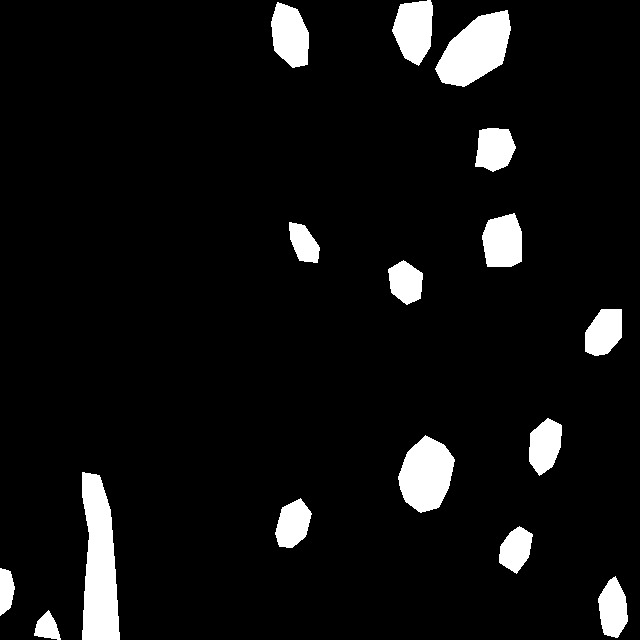

testing-066_jpg.rf.12173dd89ba244b137b9d7acfea87d79.jpg


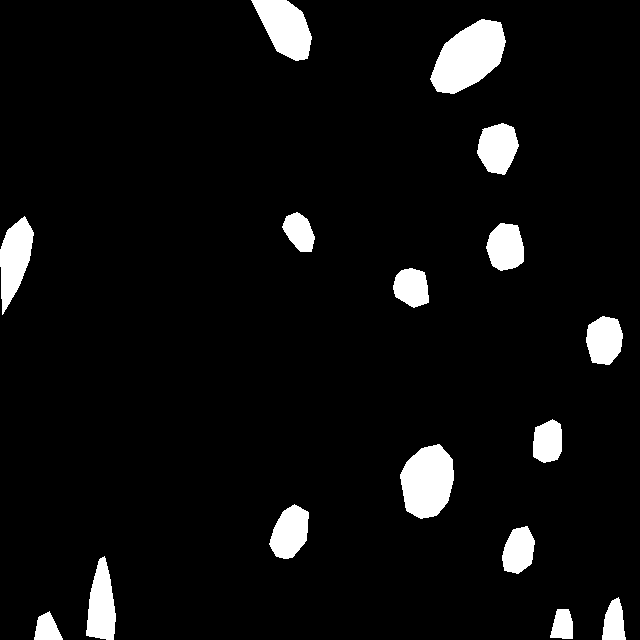

testing-011_jpg.rf.09f33e11df379955e8f33ee29e4f5eb1.jpg


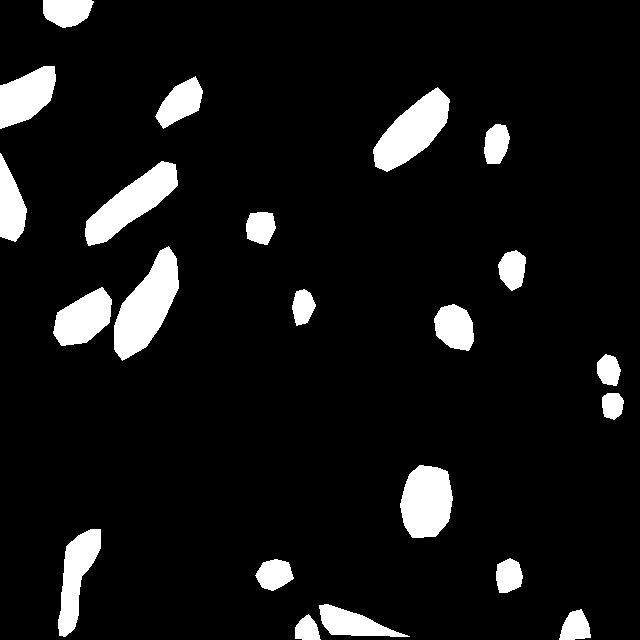

testing-010_jpg.rf.09a2efe9e64a6318b69704b06ed022f2.jpg


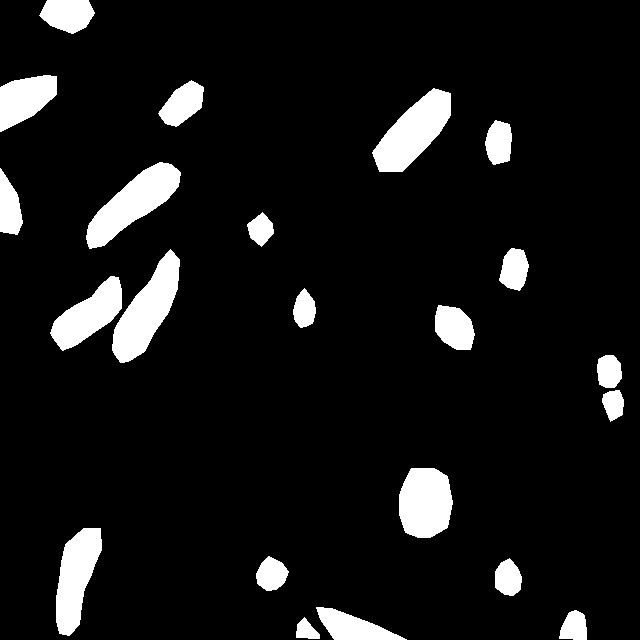

testing-128_jpg.rf.16ed26ff435cee10b283652c90b110b1.jpg


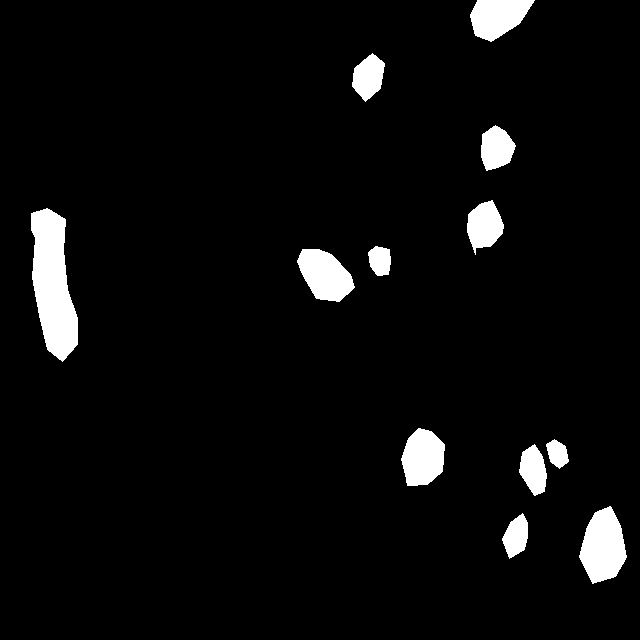

testing-159_jpg.rf.02f3ba74f4c8956b05aade1a2e5ef737.jpg


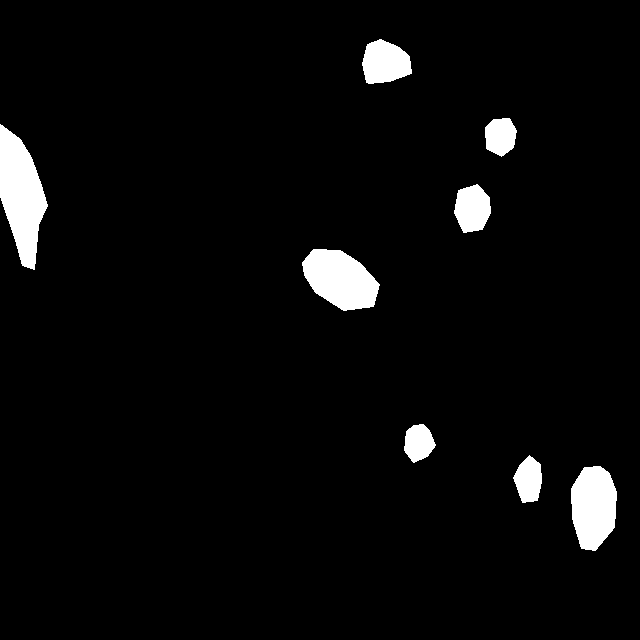

testing-150_jpg.rf.175324bbaf5e119ce06547ea883e93f5.jpg


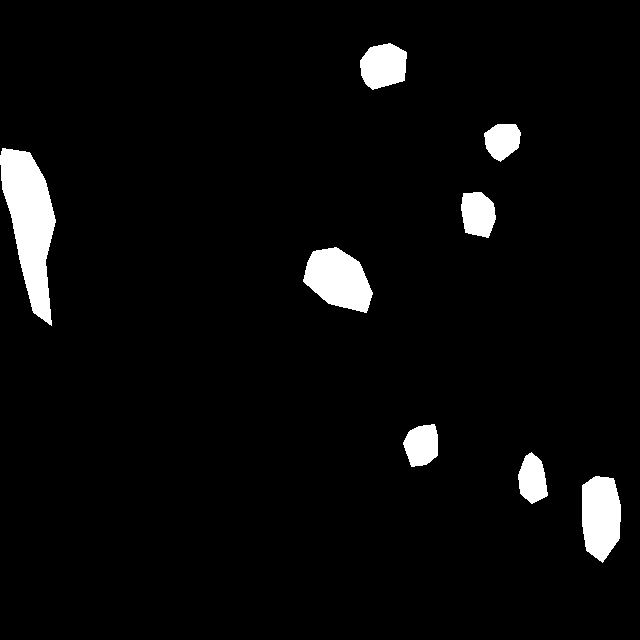

testing-068_jpg.rf.1620c50e745456e61f59fdaad6b87a88.jpg


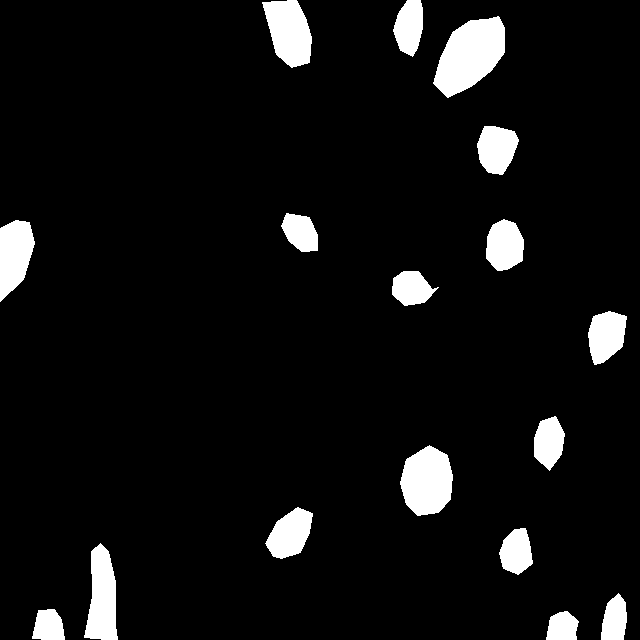

testing-038_jpg.rf.07cebbbe014b3d8be80f750b117440ff.jpg


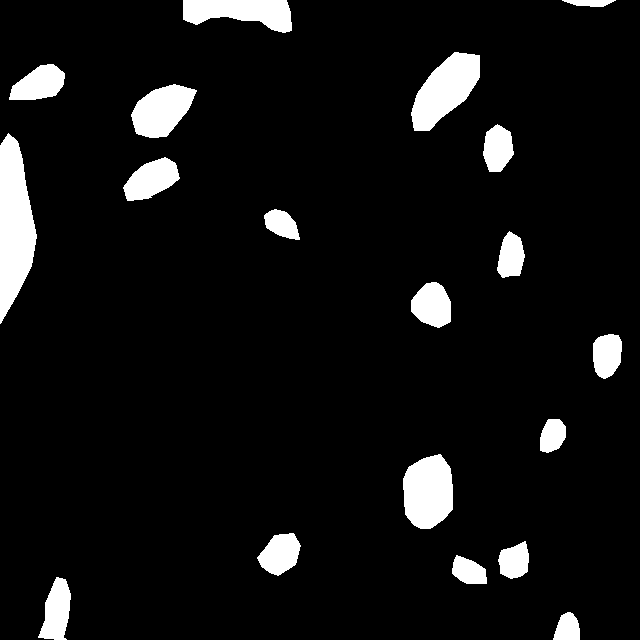

testing-120_jpg.rf.1d2570d6bee8eca2e8273c785119243e.jpg


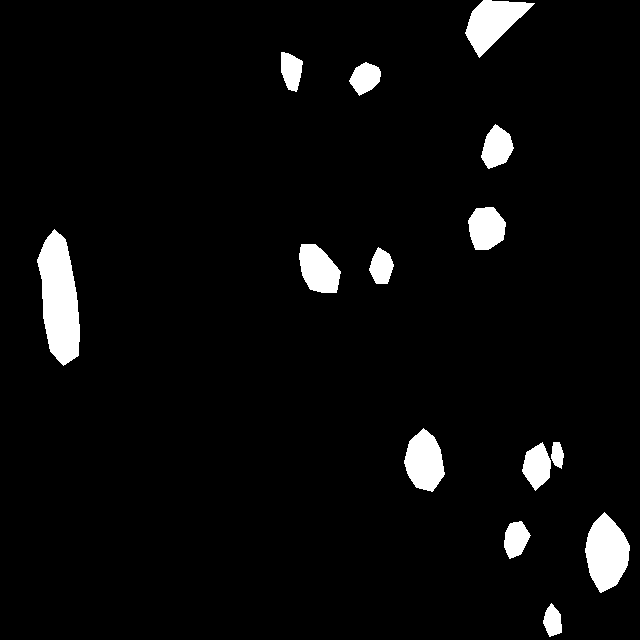

testing-062_jpg.rf.1ad1b49802c8695b1e2537aabb293b36.jpg


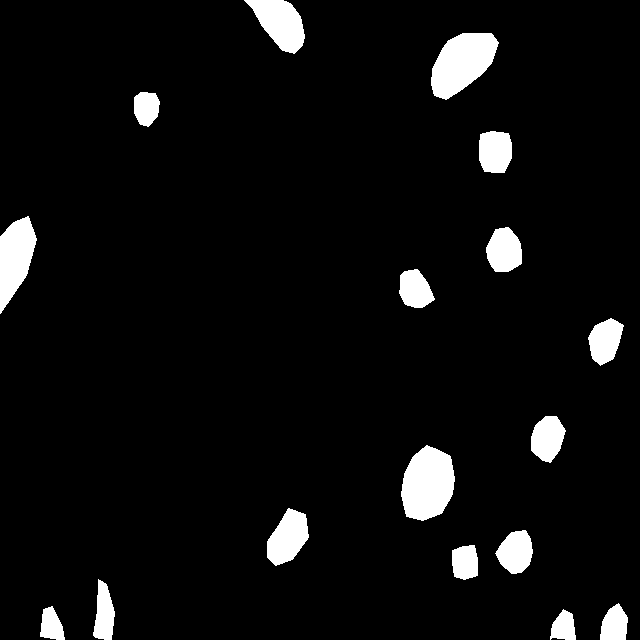

testing-064_jpg.rf.0a9a22e39639131dea49572c253be153.jpg


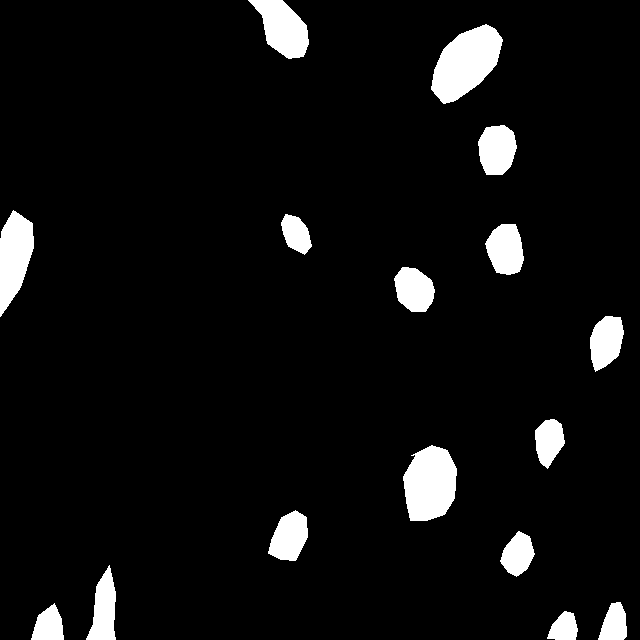

testing-007_jpg.rf.176053aac700dab730bdba482dc1fe15.jpg


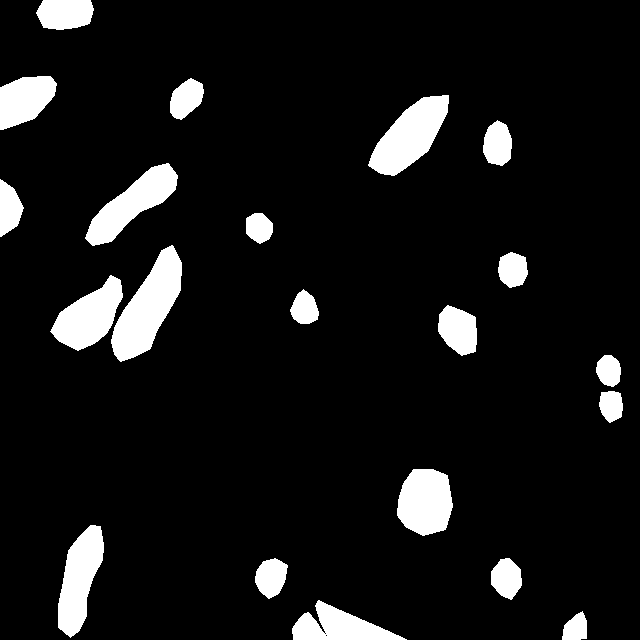

testing-033_jpg.rf.1e5c128672700f3078834cf61e9d5b3a.jpg


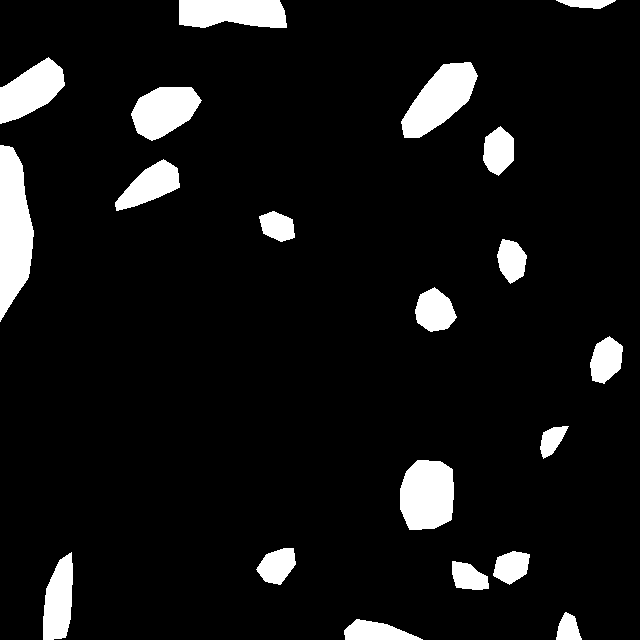

testing-113_jpg.rf.16841e53a19812a5daf90e9fb67b1ff1.jpg


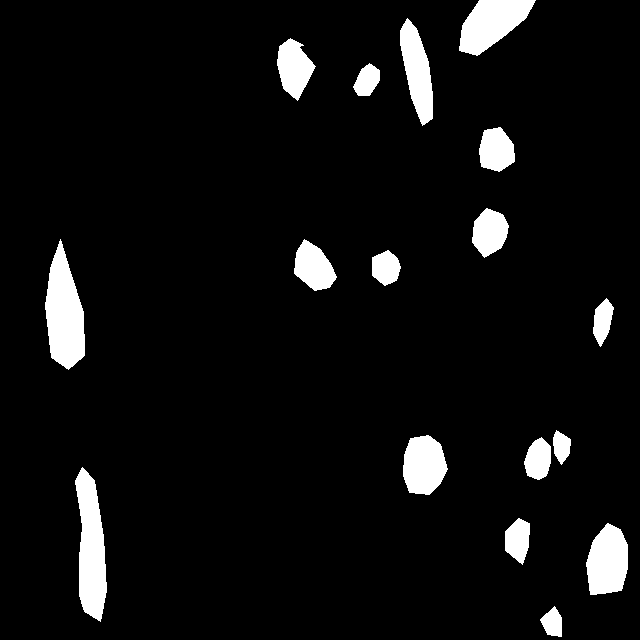

testing-043_jpg.rf.1f32f99b6e9801e94cf84447e15ad2e2.jpg


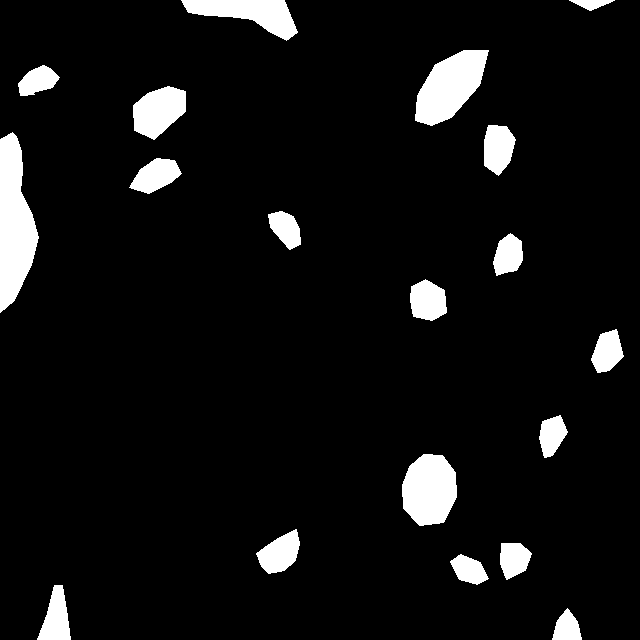

testing-148_jpg.rf.06211958c7f48b3c3db864bcd9365d5c.jpg


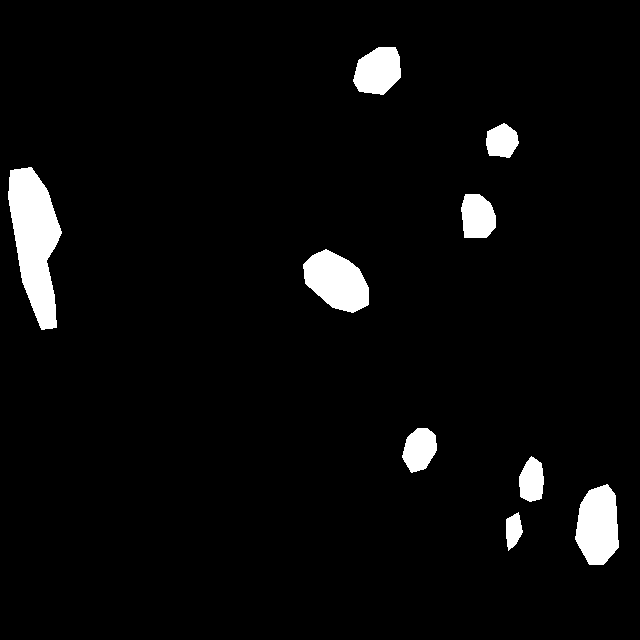

testing-024_jpg.rf.1bc5152df60afb8baf35d61c67ebec5b.jpg


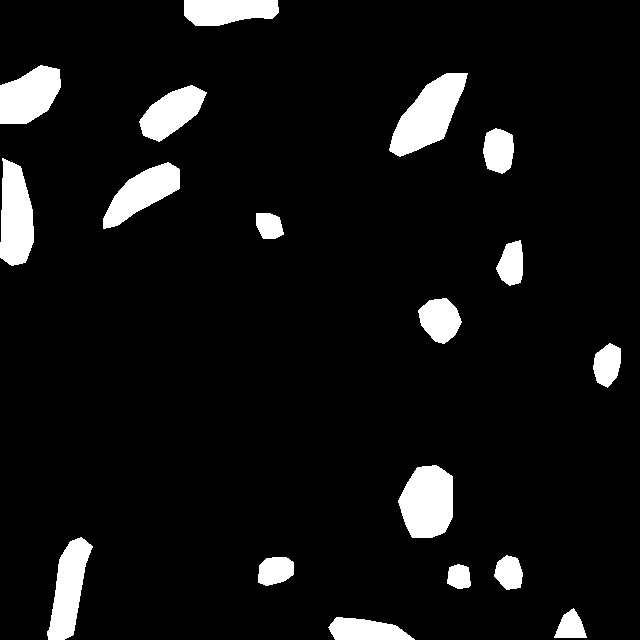

testing-117_jpg.rf.24d84e624b0b48041c9f26d66432b1b7.jpg


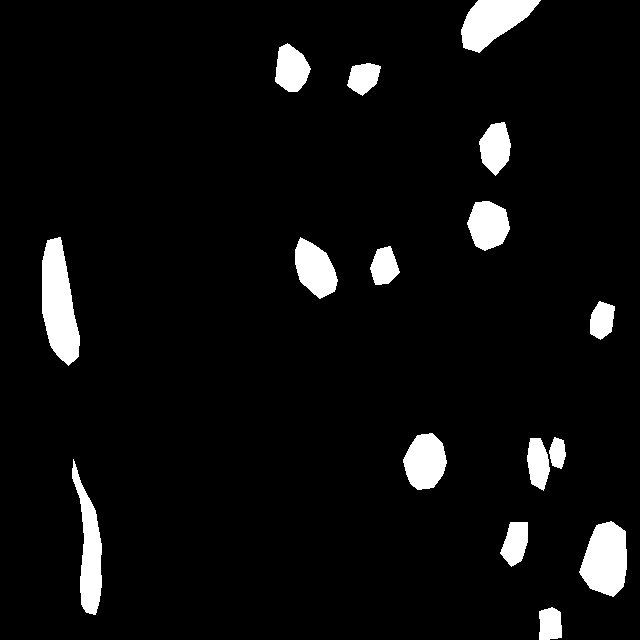

testing-122_jpg.rf.1fac3b1db3a2d14fff6edcd40b74c324.jpg


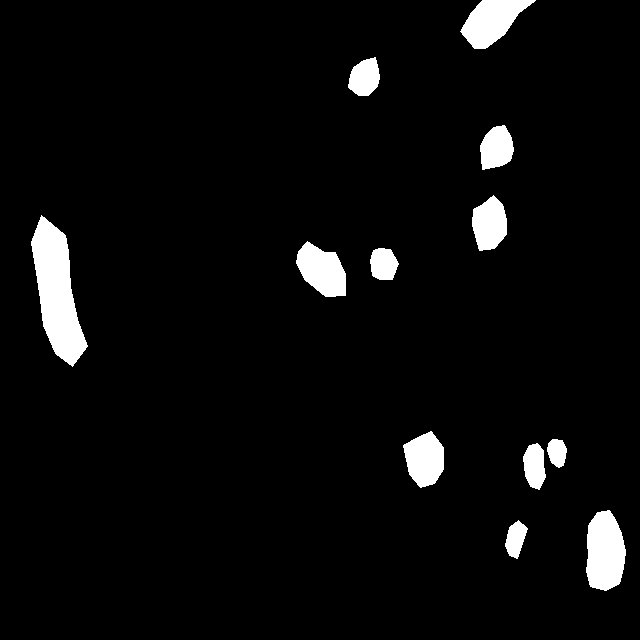

testing-127_jpg.rf.23561bd40f5911a5a07bce44cfdb926d.jpg


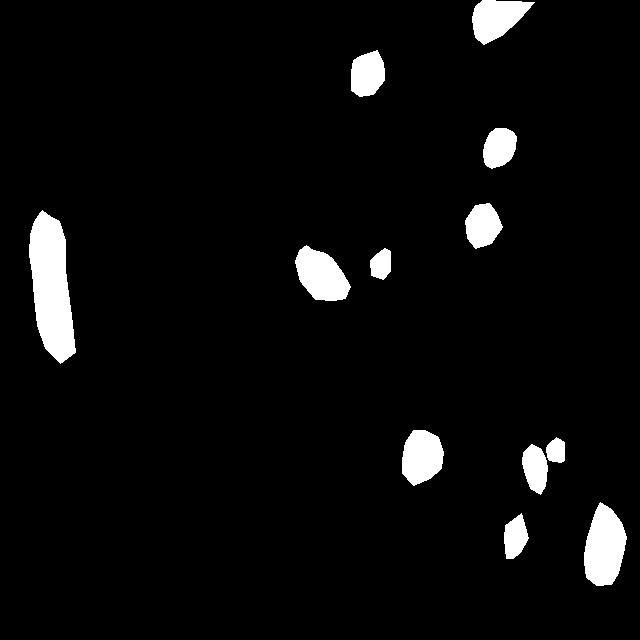

testing-082_jpg.rf.1d9e99e1f68a34d49425bb144aeec9d0.jpg


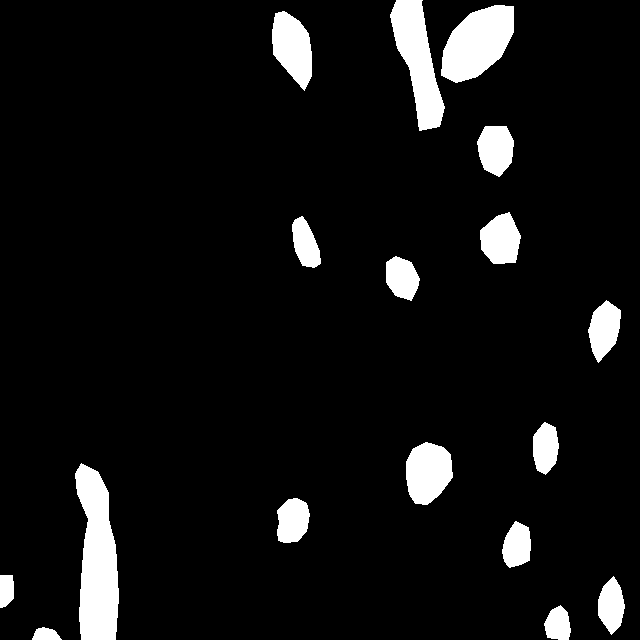

testing-063_jpg.rf.1c5f751cc9576f06ba091ff50d90dd5c.jpg


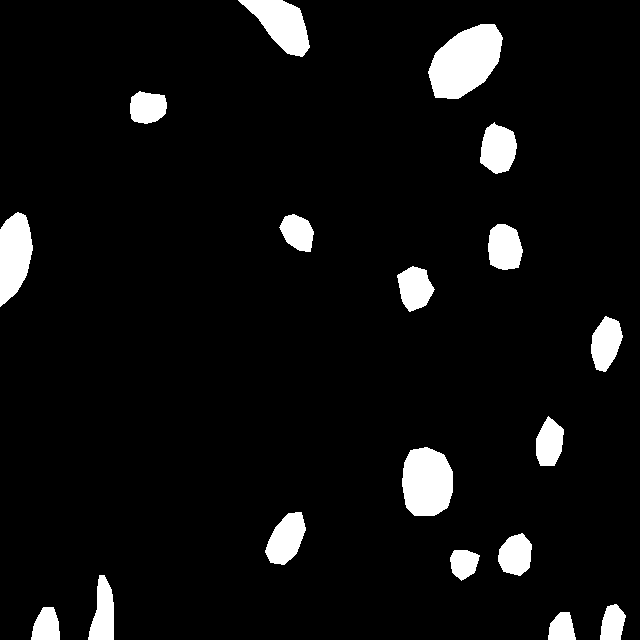

testing-041_jpg.rf.228479efc3f1f0402fb7bb9ffa7ab9a9.jpg


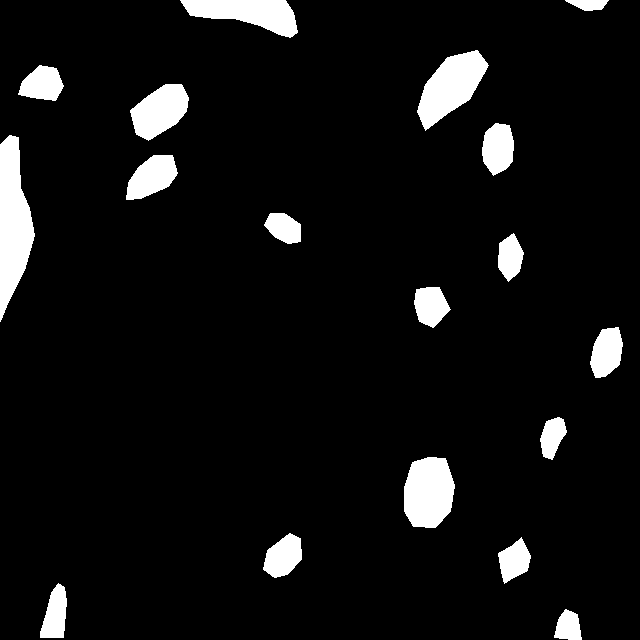

testing-071_jpg.rf.204ad983c72a0852abe69a54aae011be.jpg


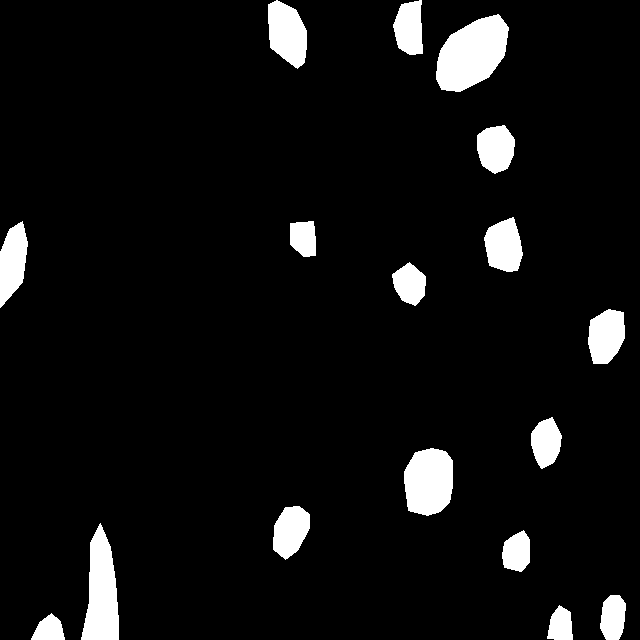

testing-115_jpg.rf.218c0eb02826e3a88962dbca2b32f9e4.jpg


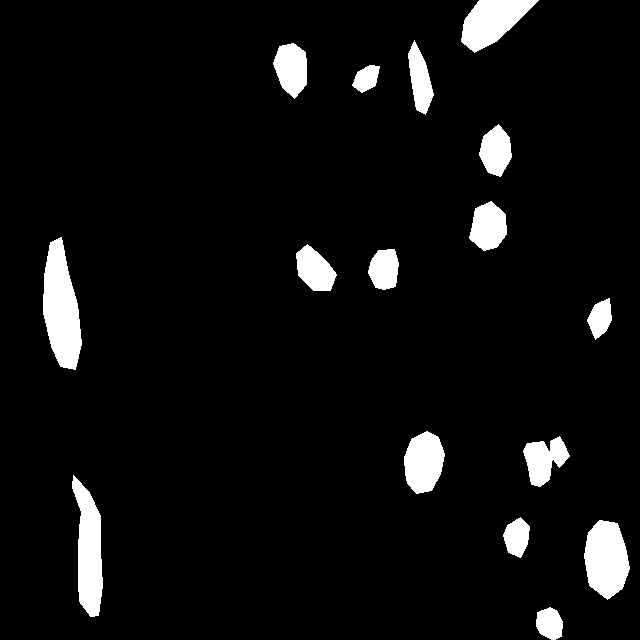

testing-095_jpg.rf.2ac9654abd4611875dc3891114039102.jpg


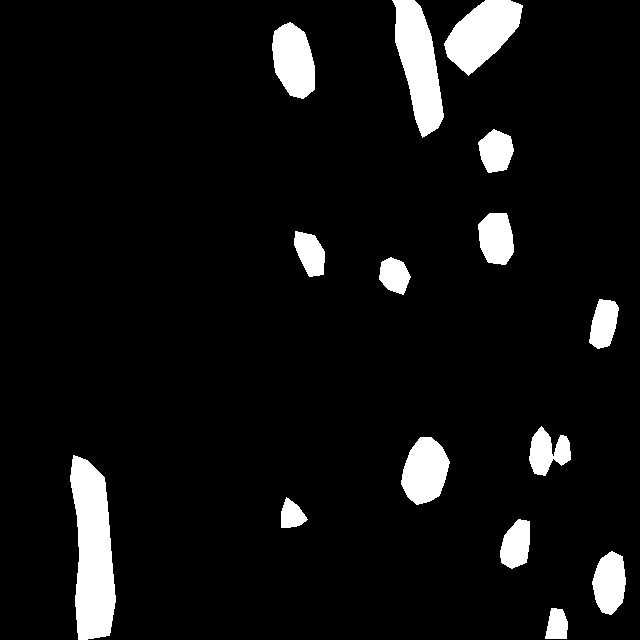

testing-046_jpg.rf.25afca8abe9306f3e6a7e702aa3467b4.jpg


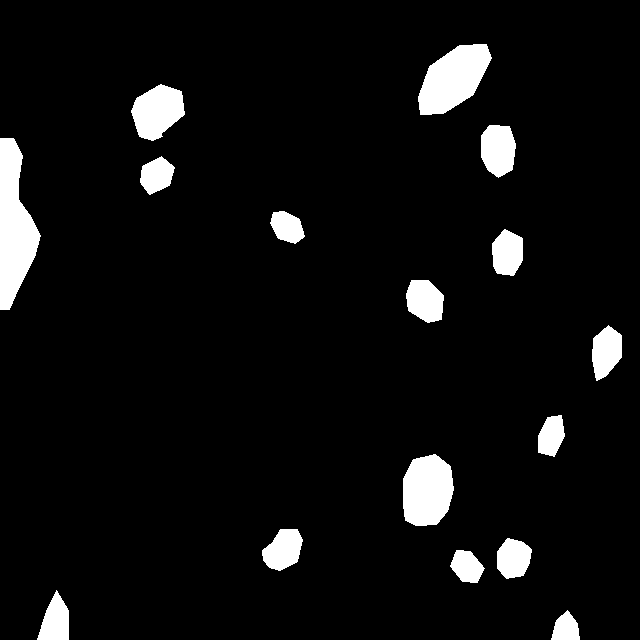

testing-006_jpg.rf.31a045e8d65c5a200086751d580d6f9c.jpg


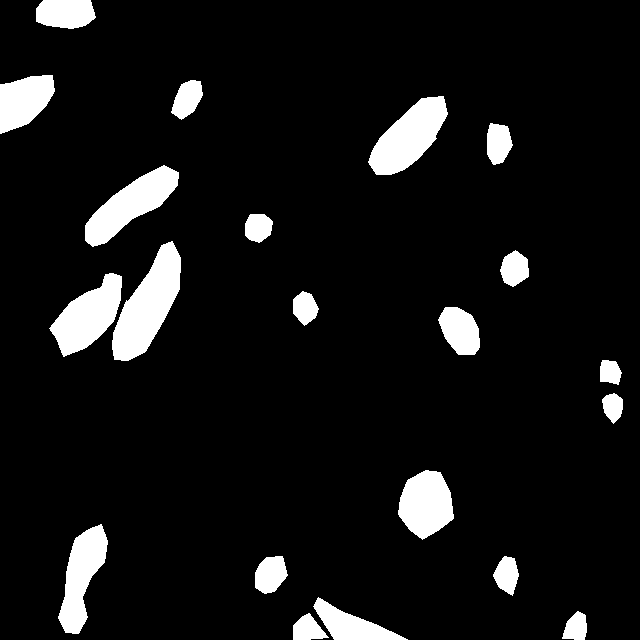

testing-140_jpg.rf.38061d80fb7c4129efedf25102d1b5e3.jpg


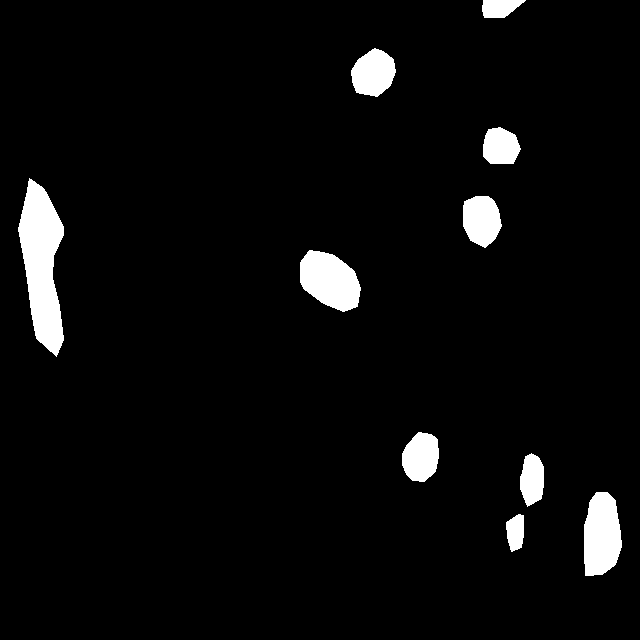

testing-102_jpg.rf.27497b8589d25da34db4cc44f0685ad8.jpg


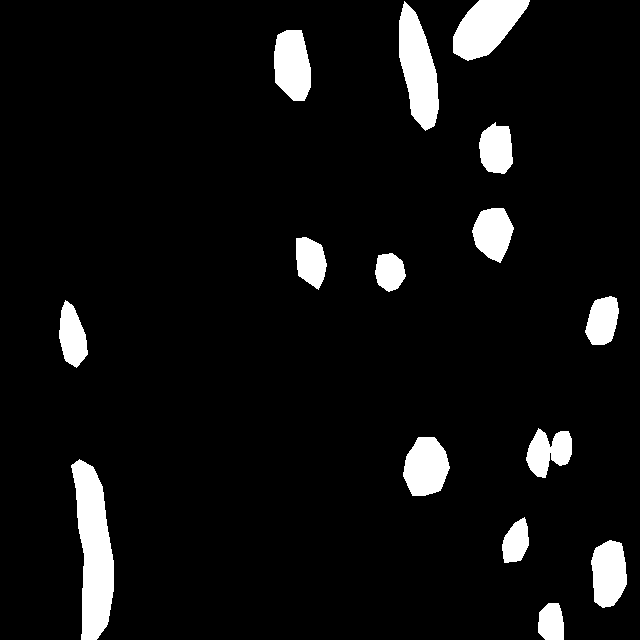

testing-005_jpg.rf.307e4554f175211881ae56fbe5c0d255.jpg


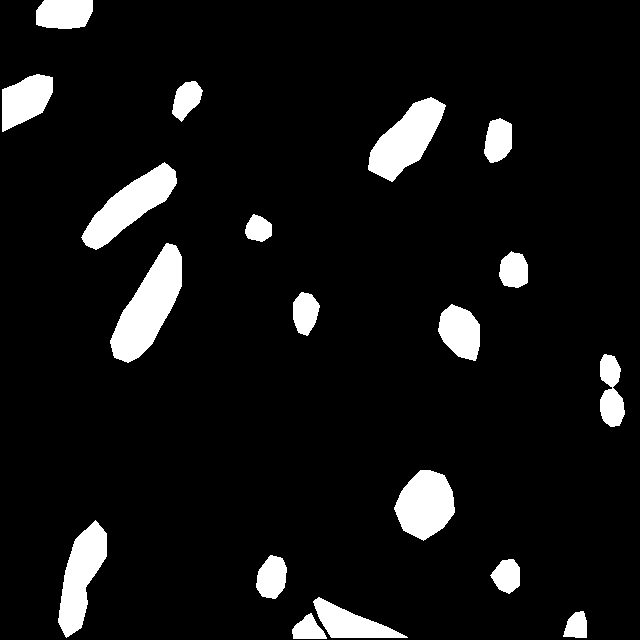

testing-078_jpg.rf.3f52efe7f2d947e5adb21ad3be135fa0.jpg


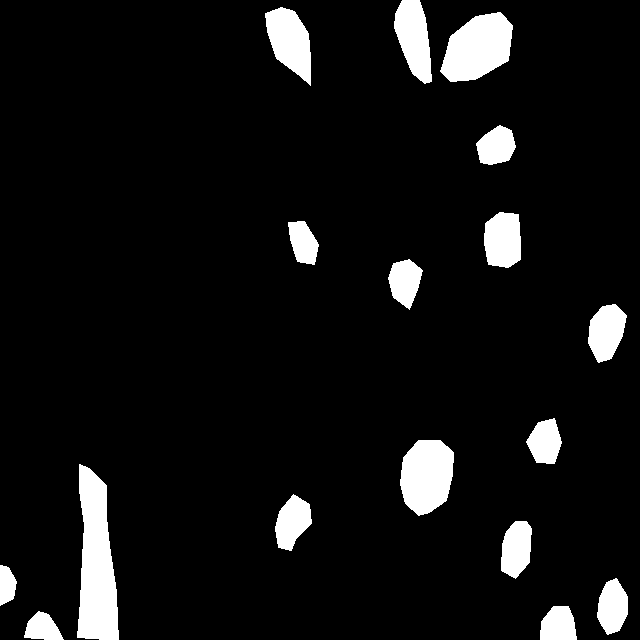

testing-069_jpg.rf.44273b303235e0085d0fd0d2b5dcc444.jpg


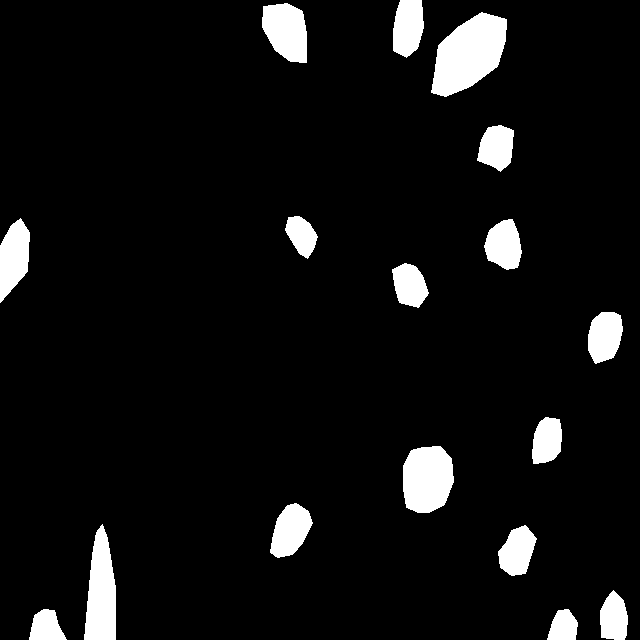

testing-070_jpg.rf.35bcec34ae1fe26920f95cb05ded9ac5.jpg


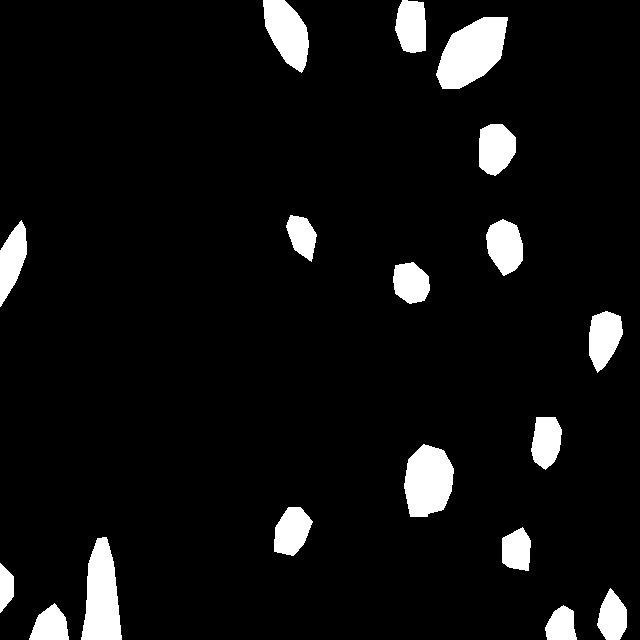

testing-026_jpg.rf.2e2c37982a8af4b89078c29f6dca7122.jpg


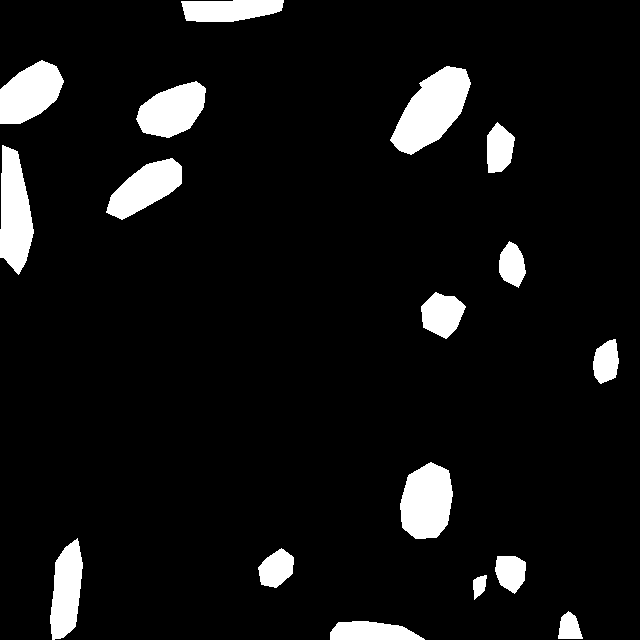

testing-099_jpg.rf.51882034ad6cd78c6e24d8651ad50c09.jpg


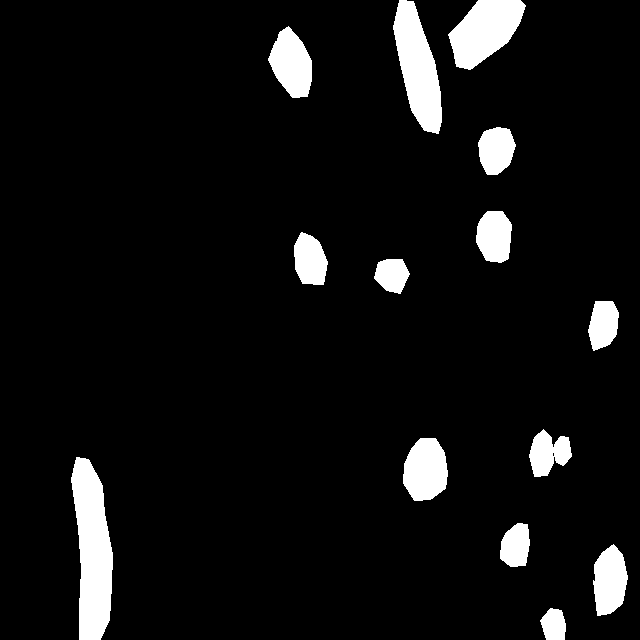

testing-008_jpg.rf.4907483bd081e0964849248345c97178.jpg


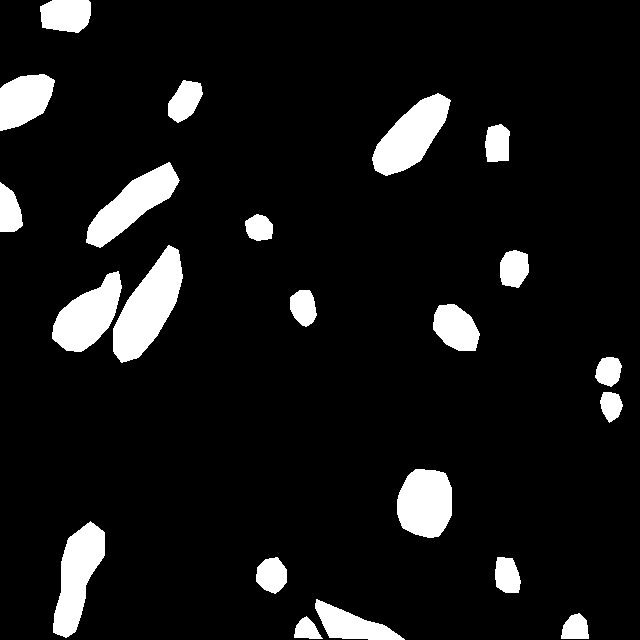

testing-040_jpg.rf.487e7458dfb8f647c994301503036824.jpg


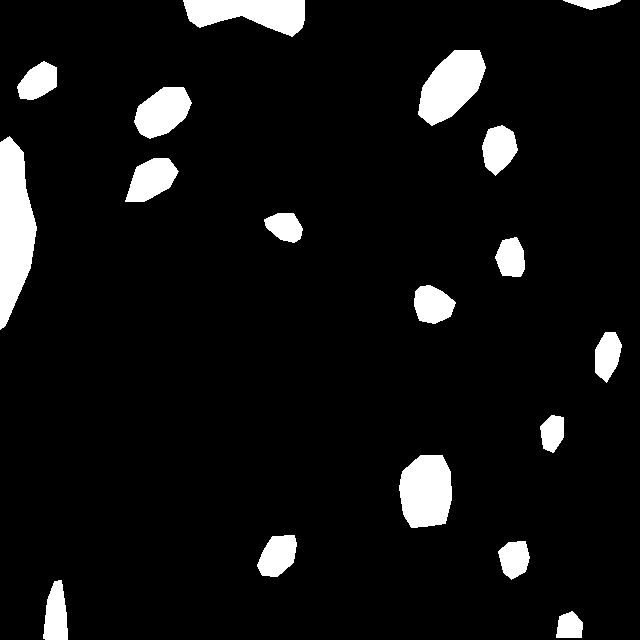

testing-136_jpg.rf.50d0b0c55d61f5025e5148884bfeb296.jpg


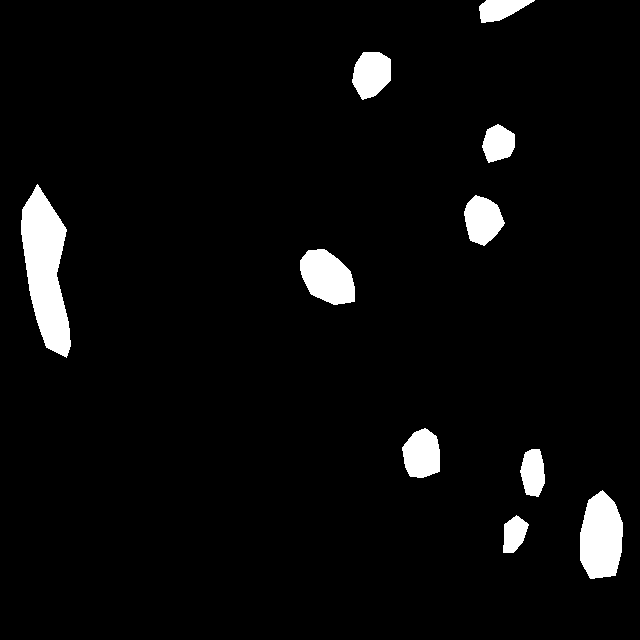

testing-009_jpg.rf.44c6498c1277144392fcb3c018428934.jpg


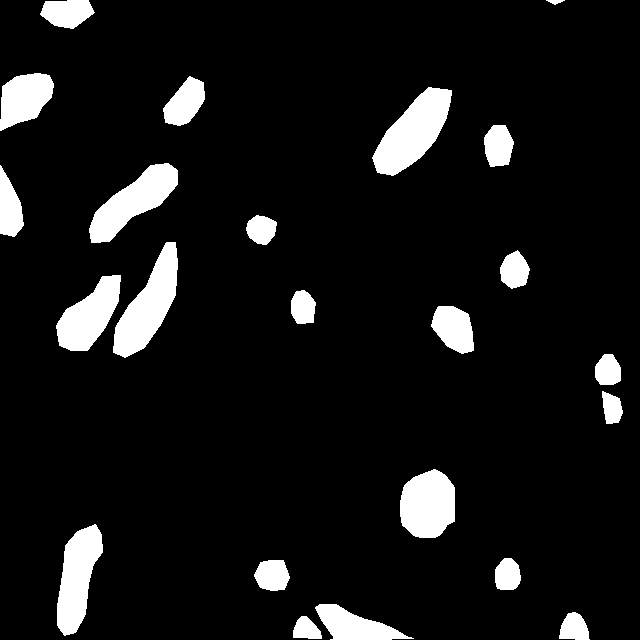

testing-142_jpg.rf.47c9d4a6b096033585b687697b9ed8aa.jpg


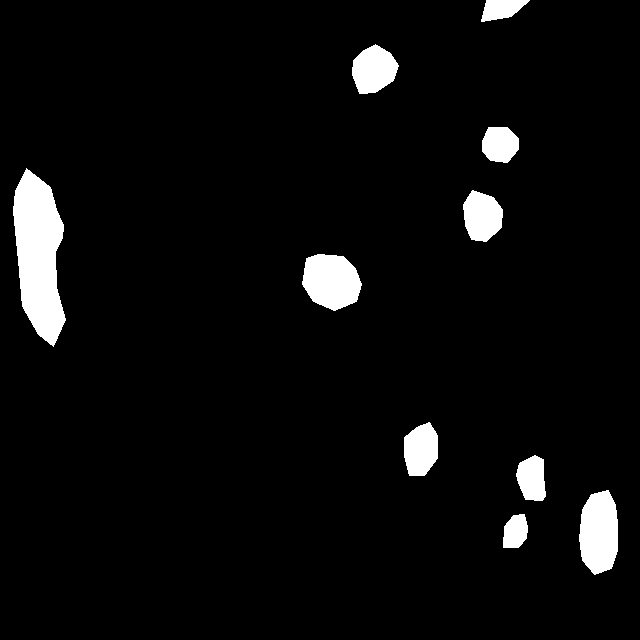

testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg


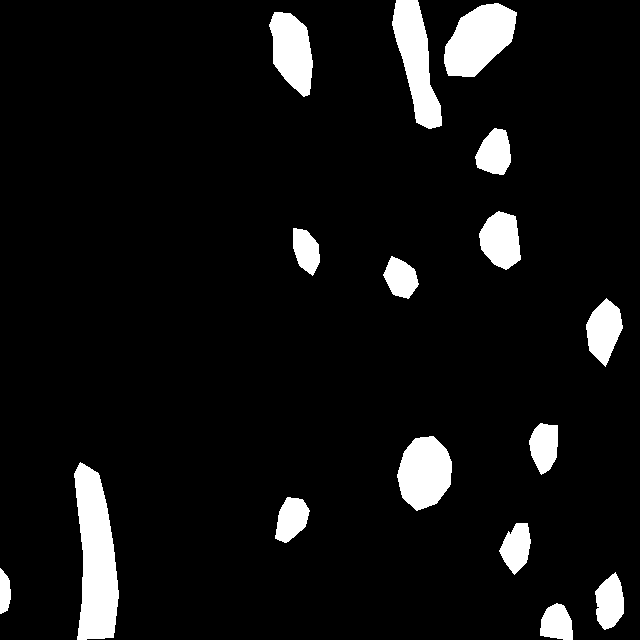

testing-002_jpg.rf.501d1cf77652a65b6b6ed907e8d93ebe.jpg


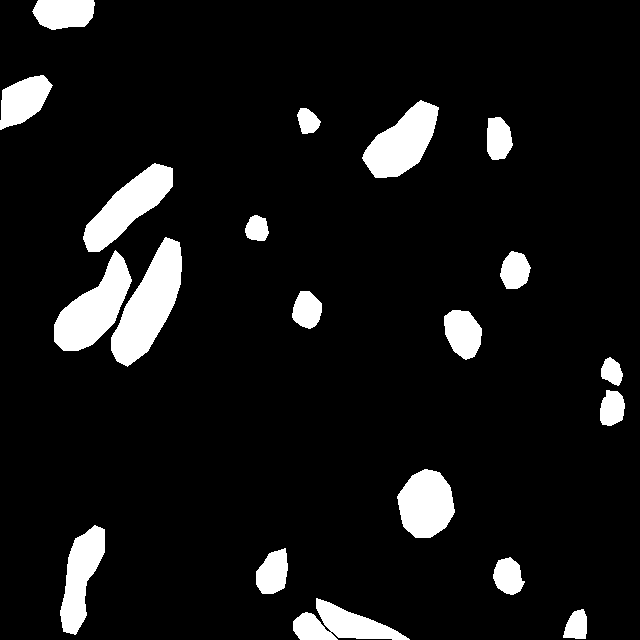

testing-004_jpg.rf.53b83771f4fa33df85e327af85bbcd74.jpg


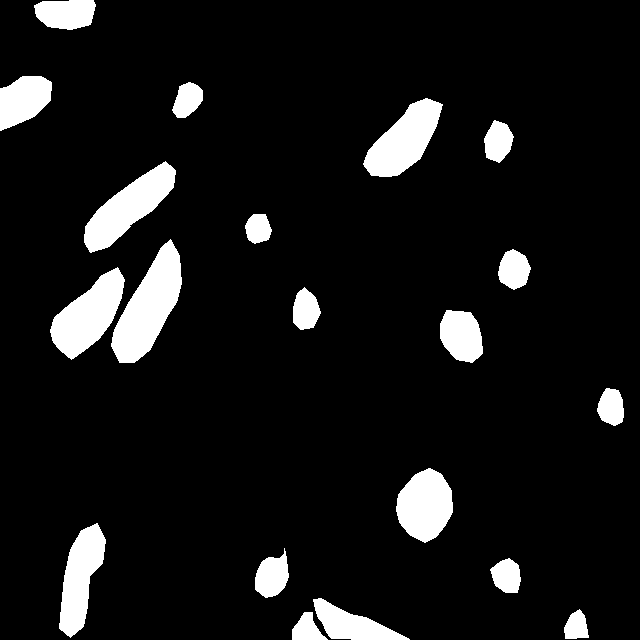

testing-091_jpg.rf.49751aaf120808fc516fd943e0962005.jpg


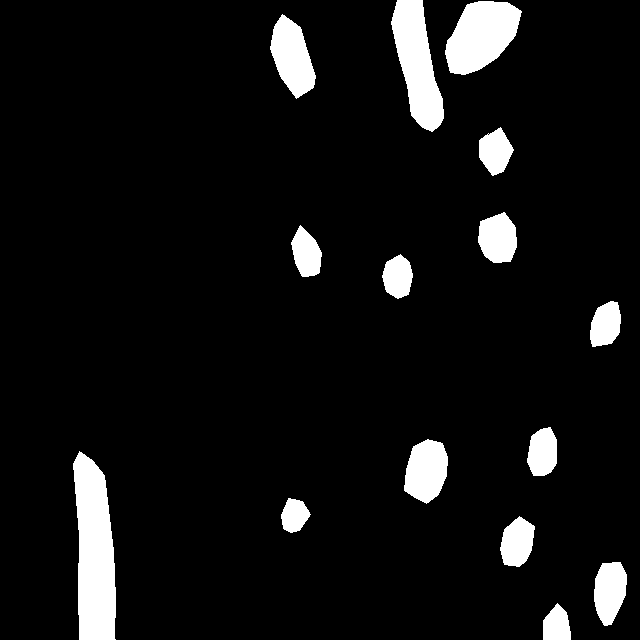

testing-081_jpg.rf.59576f4811721faff38c1ce9fa887feb.jpg


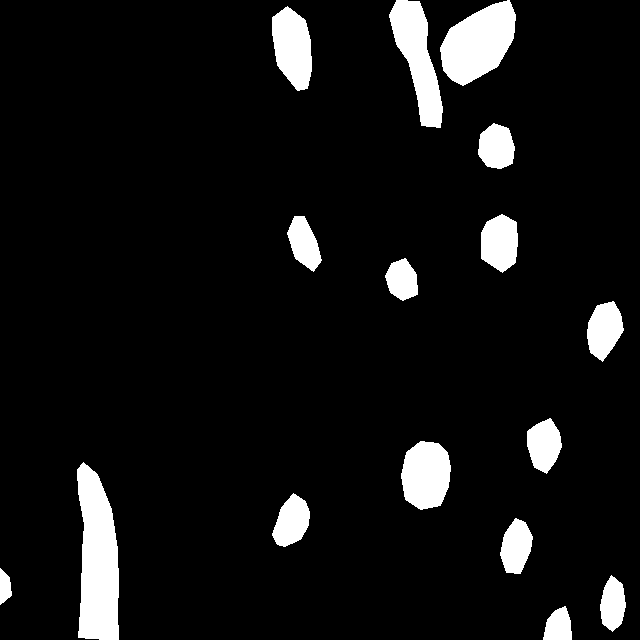

testing-107_jpg.rf.549633ea253046c12a70d8caffc16dc0.jpg


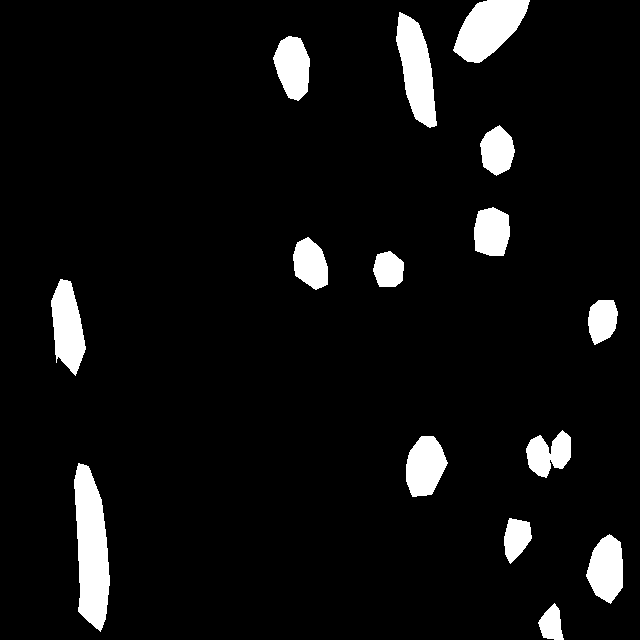

testing-057_jpg.rf.5af73ea3a0aa4b4be15f5e21f1c0d7db.jpg


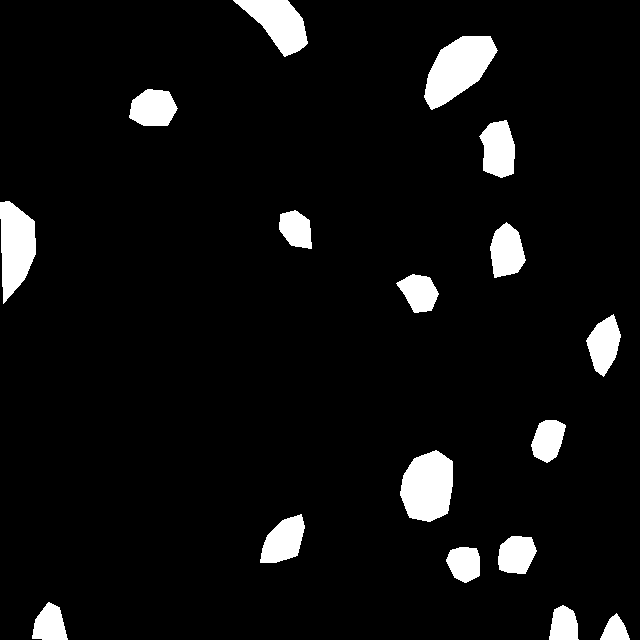

testing-106_jpg.rf.3d6ccd52fe92a28959775f85d64eed43.jpg


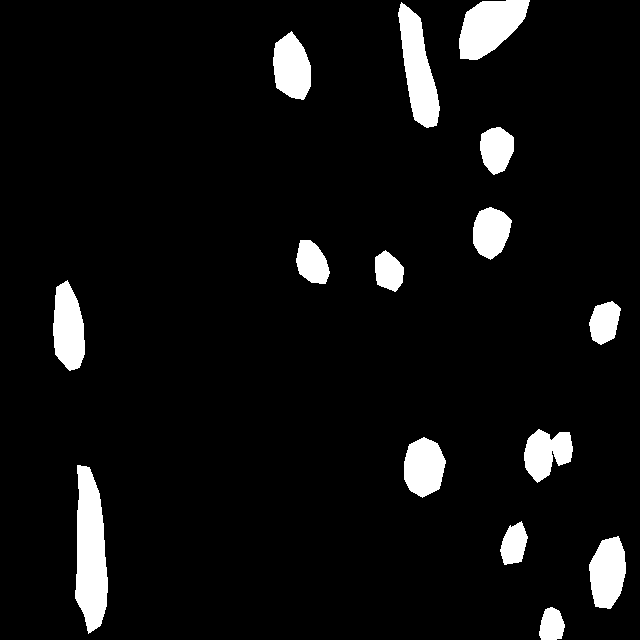

testing-015_jpg.rf.66075ac81a9be1e3b0f6388d3a27825f.jpg


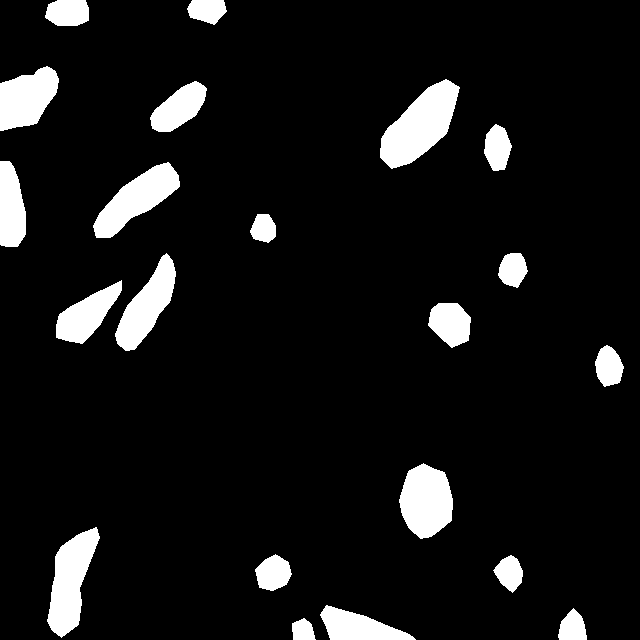

testing-101_jpg.rf.647de03f07d0ab2ce916994a7732a475.jpg


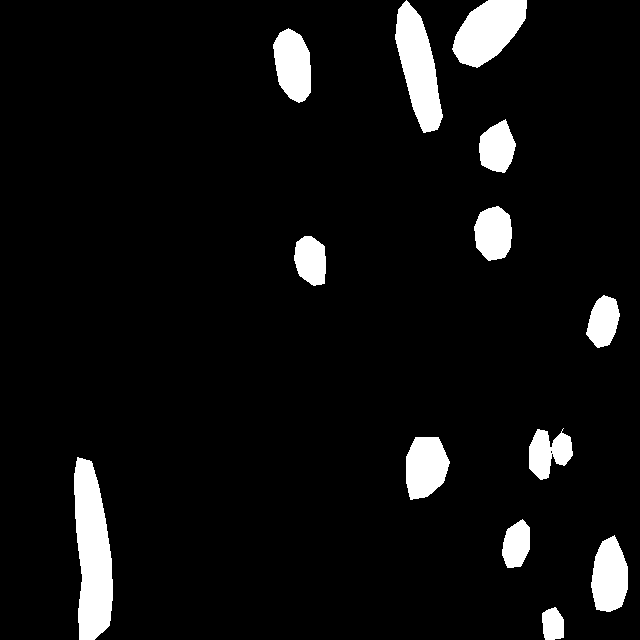

testing-164_jpg.rf.463f52dab00636f2747326b631223808.jpg


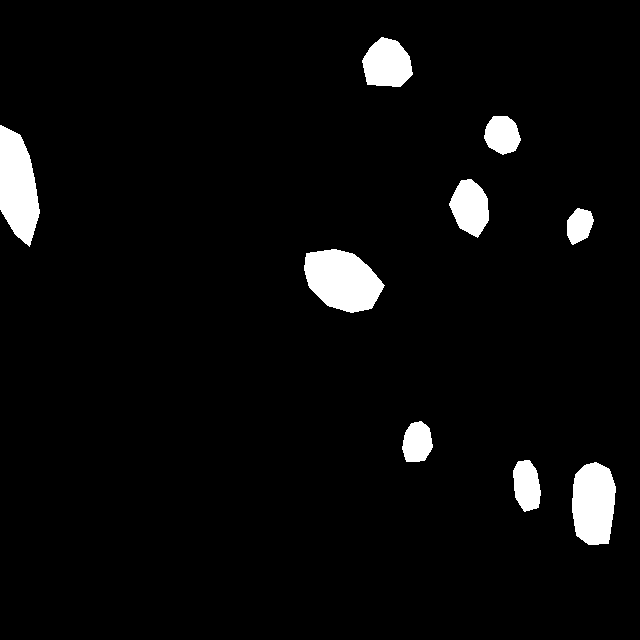

testing-119_jpg.rf.353dc0e54ee7a2876b1b240b27f80d98.jpg


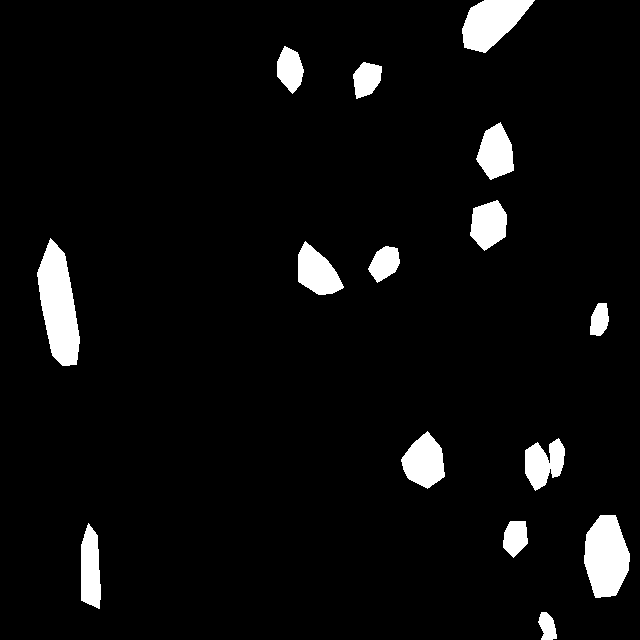

testing-029_jpg.rf.6650970335773cc82b5c0a029e6dcd29.jpg


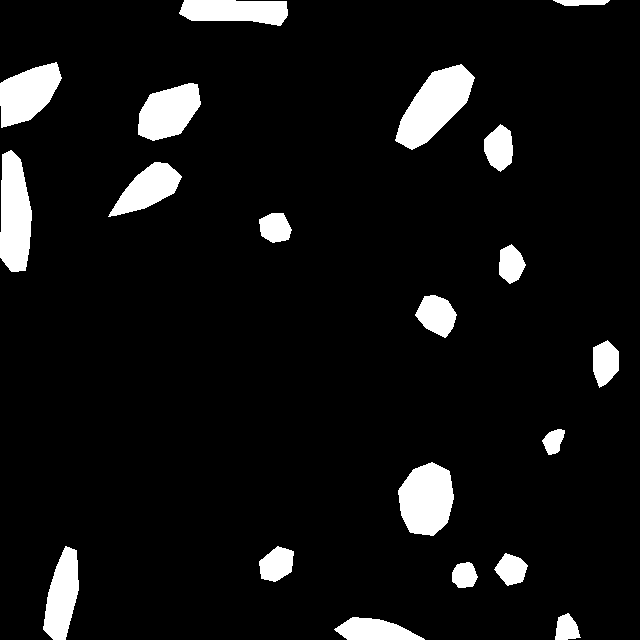

testing-147_jpg.rf.59f0c141a6c26a3775049d2521b85bbd.jpg


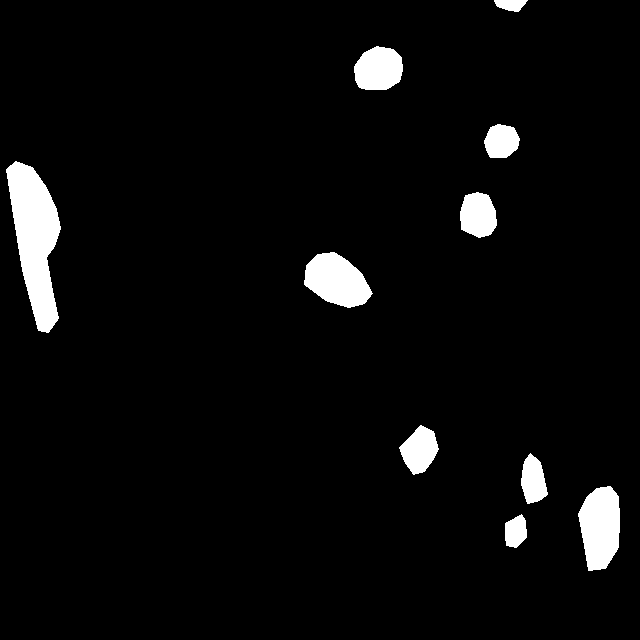

testing-019_jpg.rf.62eccfc1d07b32ddf2d672689ac9db1a.jpg


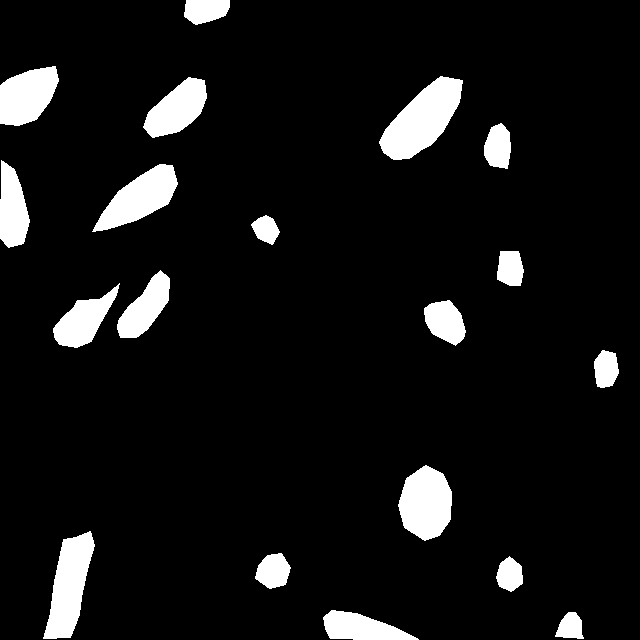

testing-022_jpg.rf.67d61a55755ce7aadae689e4591cd5c5.jpg


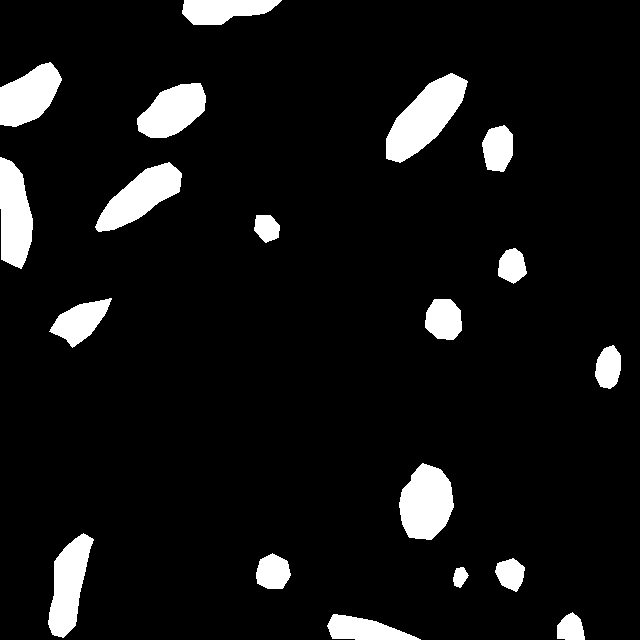

testing-018_jpg.rf.6b29c67a426ff96a4b05f980b3ac969e.jpg


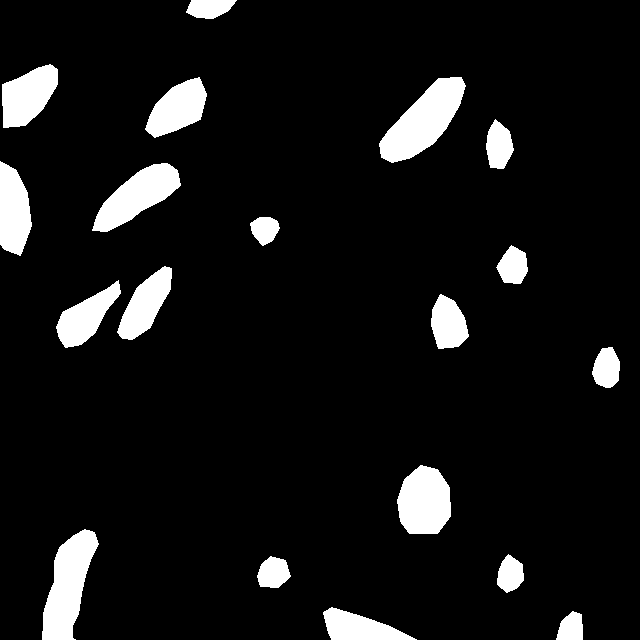

testing-013_jpg.rf.6d522cc0482f2154efea9c747f5a365f.jpg


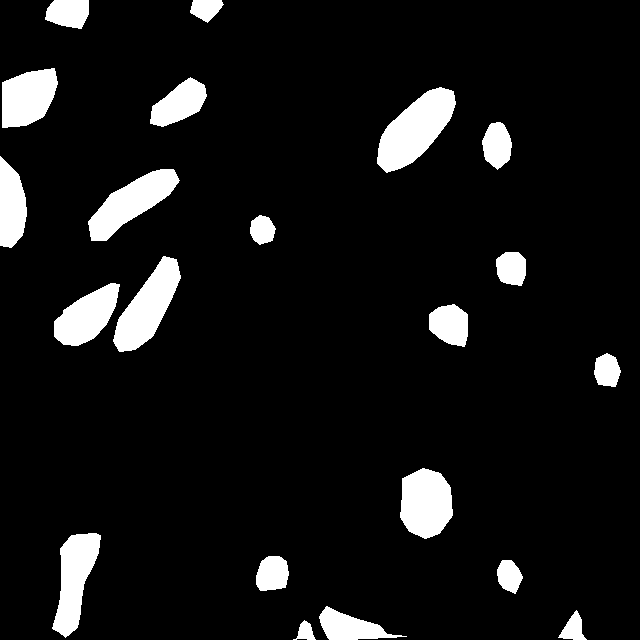

testing-096_jpg.rf.63da06b5c676b0869be8d0d23a6b369b.jpg


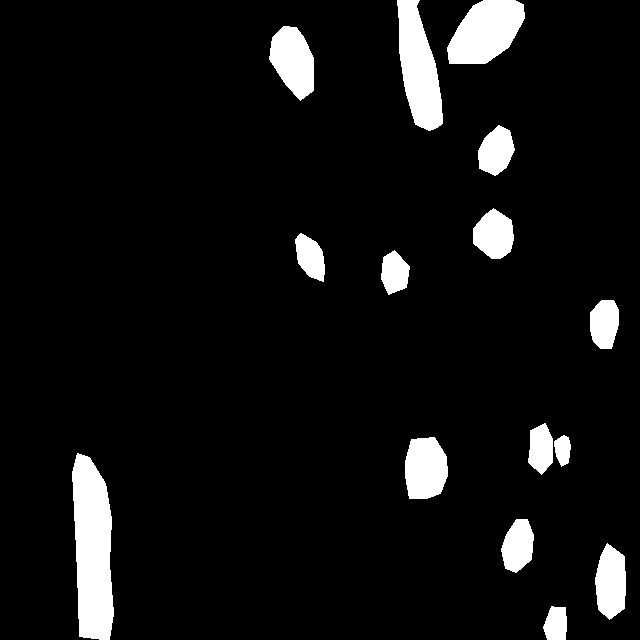

testing-073_jpg.rf.6d0030c998600a8402bcf9fbff84fd99.jpg


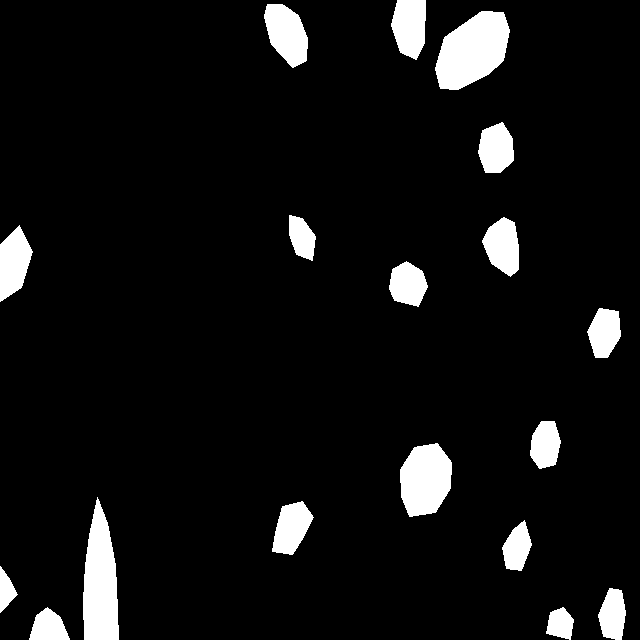

testing-112_jpg.rf.5a0bd04ba9aeaf34fec0309dbe702866.jpg


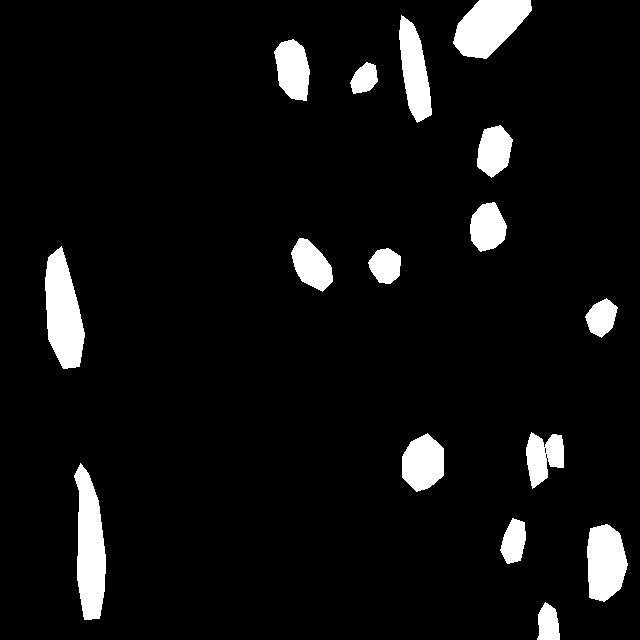

testing-049_jpg.rf.4bde6e50cc9b18184a2843304158531a.jpg


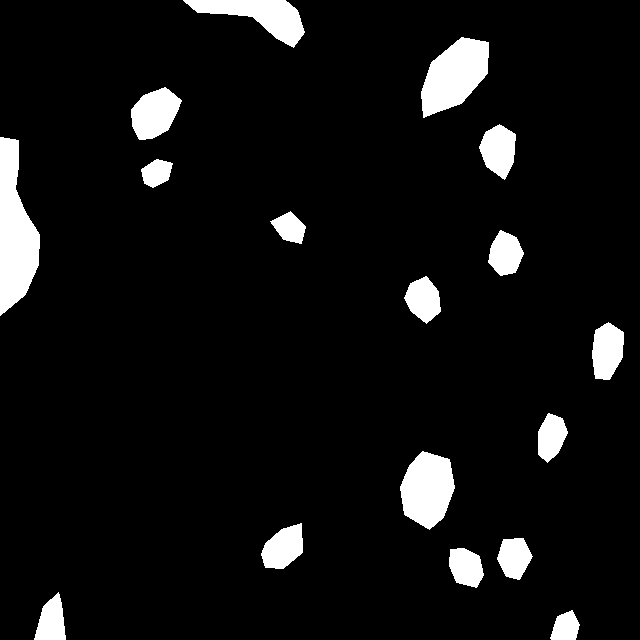

testing-134_jpg.rf.6d6b5bdc875cf5bba859362dd3190098.jpg


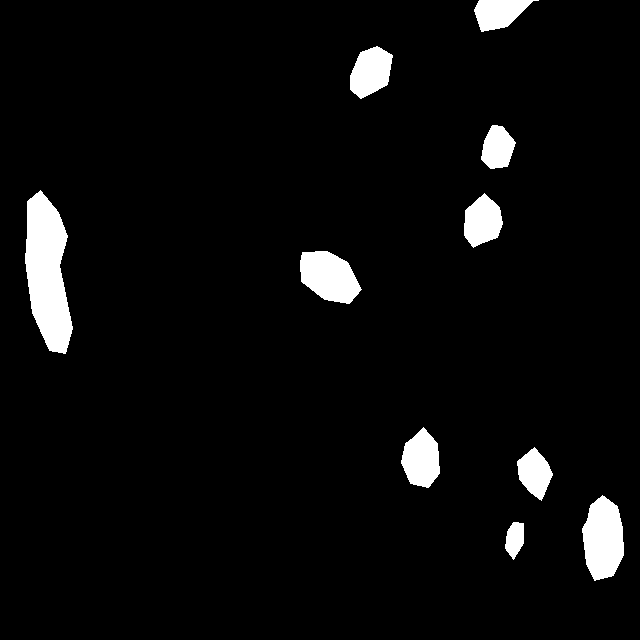

testing-135_jpg.rf.65613f5acf1c2b0e613b27380521d4c8.jpg


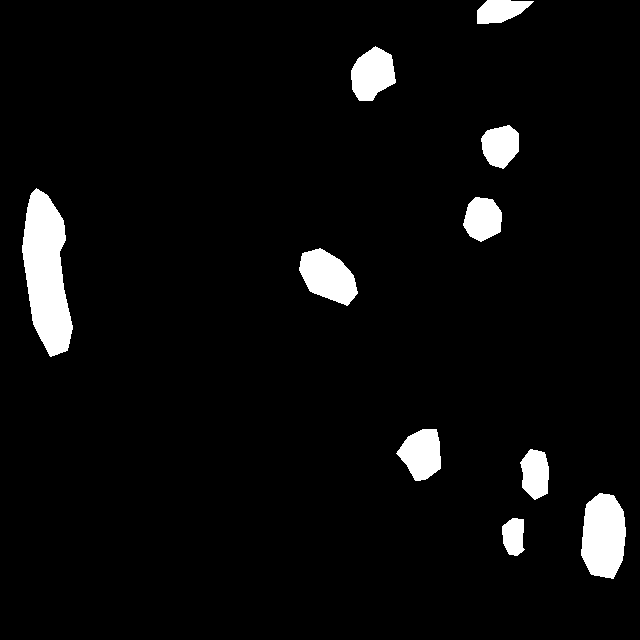

testing-163_jpg.rf.7d95c99444faa66e6d7a2556b2215338.jpg


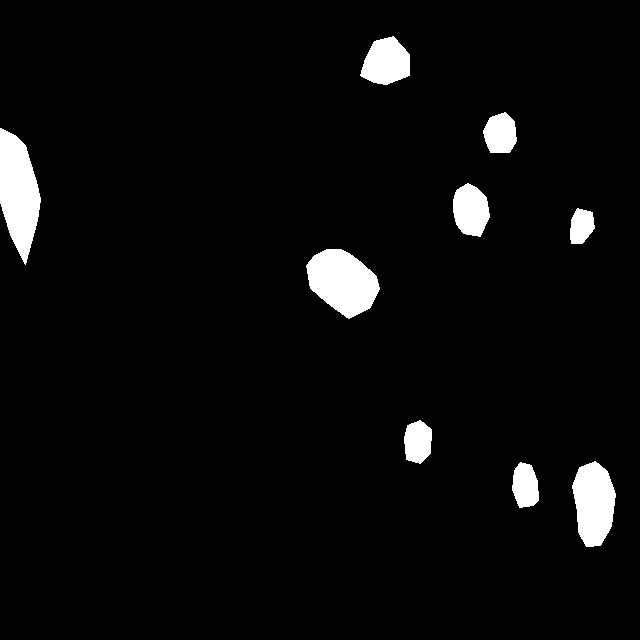

testing-130_jpg.rf.77adf7eb0f569fe67a3a9ae68dd9b645.jpg


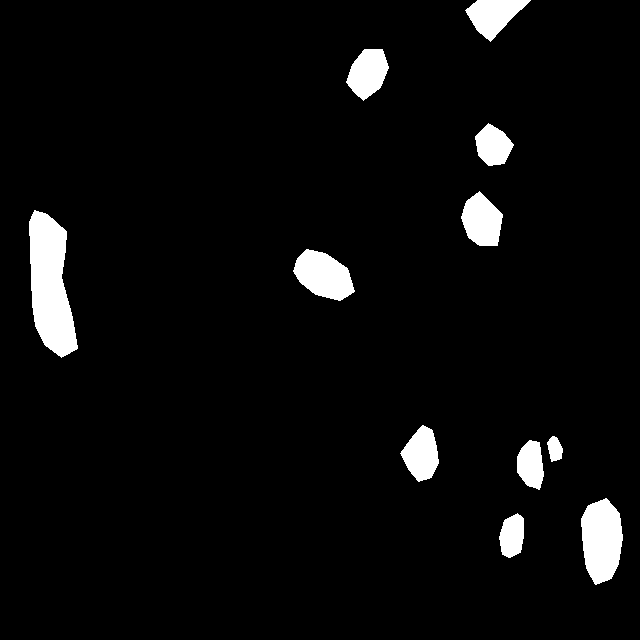

testing-104_jpg.rf.6ab8589112e6bf972b7f1c68d077755c.jpg


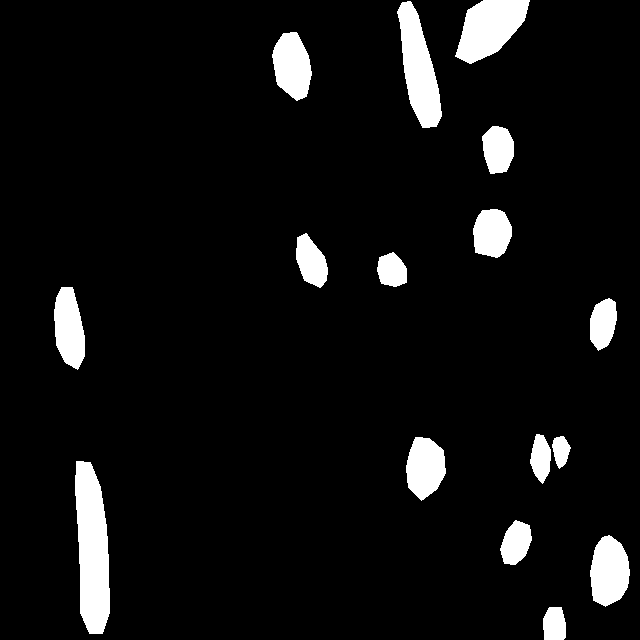

testing-058_jpg.rf.7bcff8fe3069aa378e955e1a95ee6028.jpg


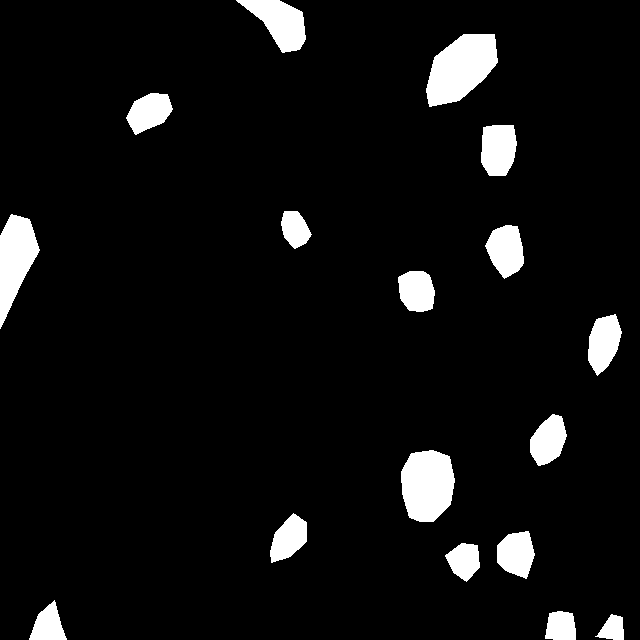

testing-052_jpg.rf.7dc5fc5d3581916a8404212cae1807fe.jpg


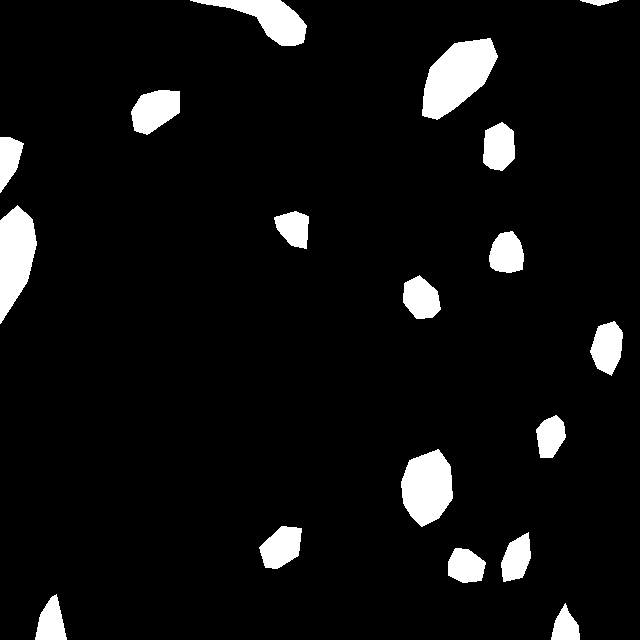

testing-060_jpg.rf.5bdd3d08187e3012155fab08bf588ca2.jpg


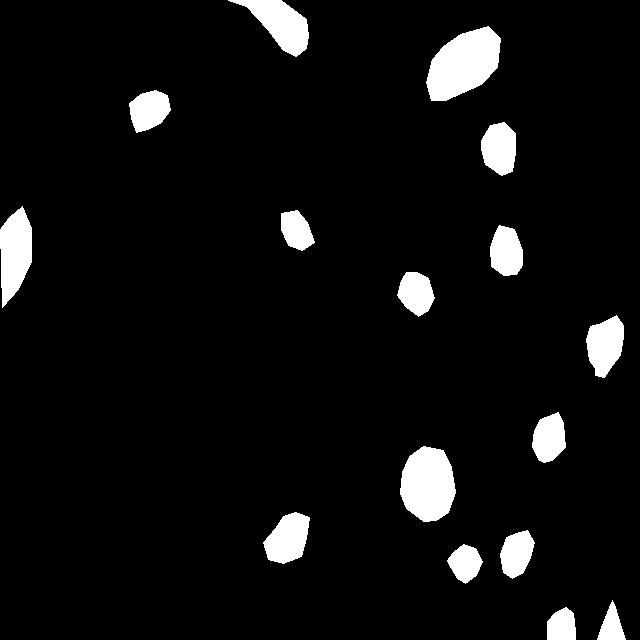

testing-137_jpg.rf.7f82804ad3bdcfe80a66afab5f816c12.jpg


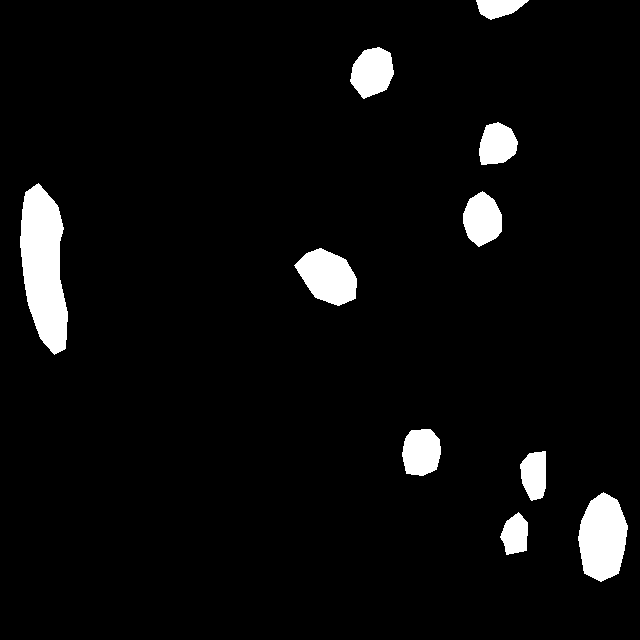

testing-138_jpg.rf.789c48bd9e9b587d788511395ea70ff0.jpg


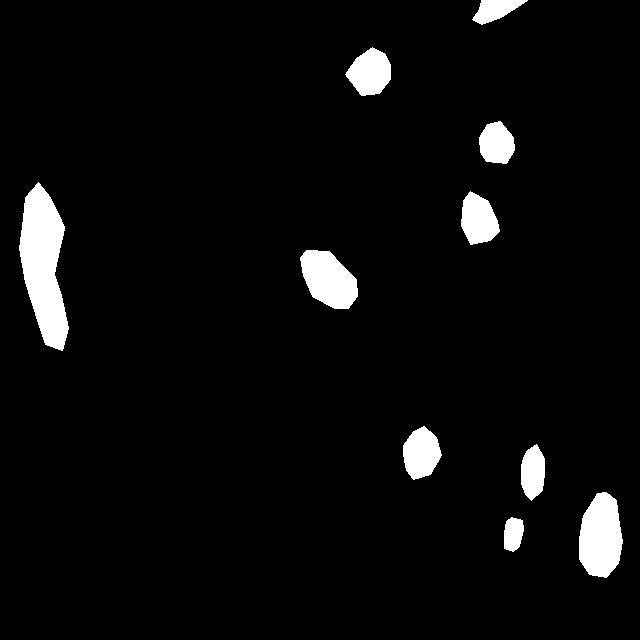

testing-035_jpg.rf.8a52c409da0d2d9866bc2b60d507fa5d.jpg


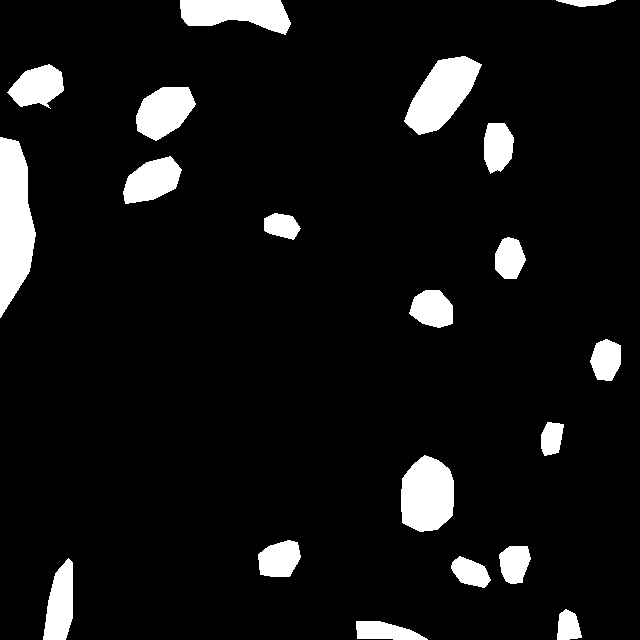

testing-132_jpg.rf.7843a9f8a2dd1db6548e2868ef76e758.jpg


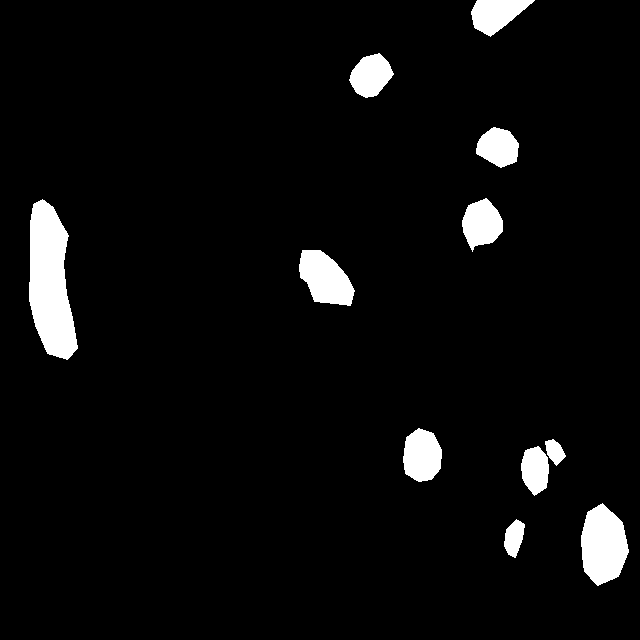

testing-108_jpg.rf.748aa76313b0e6b9e2c3c47a95293bc1.jpg


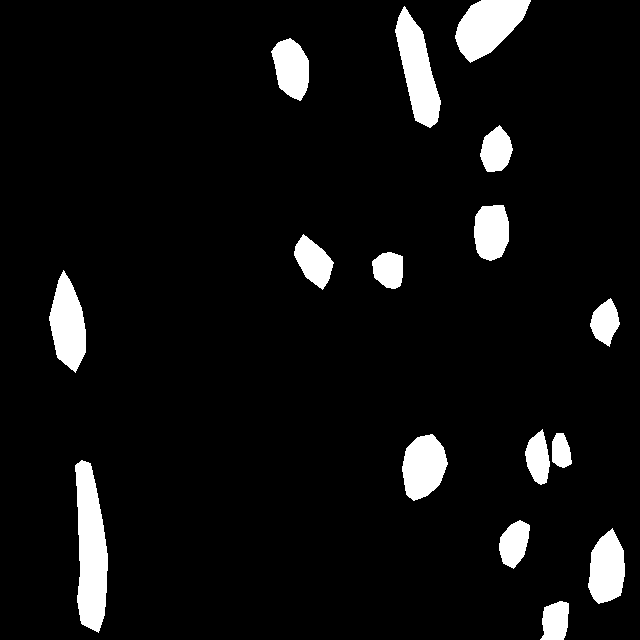

testing-017_jpg.rf.9160d7dac9a7a084f2e0b434074d049a.jpg


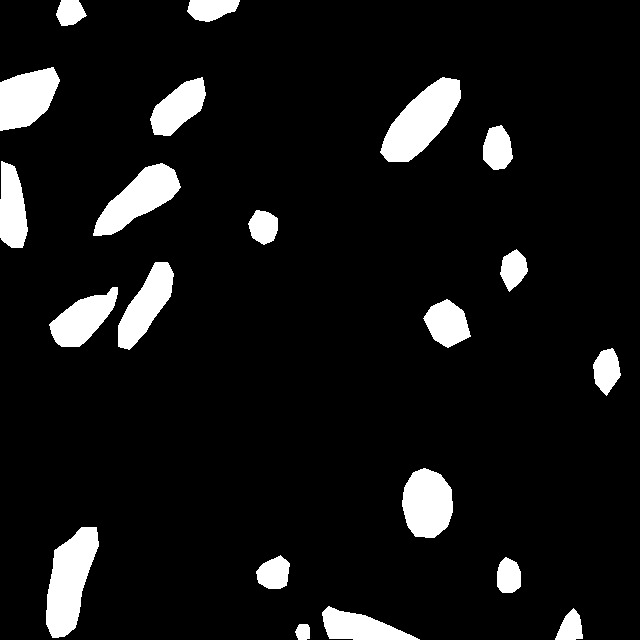

testing-036_jpg.rf.849c561135cb990d7f2b12fedf4cd081.jpg


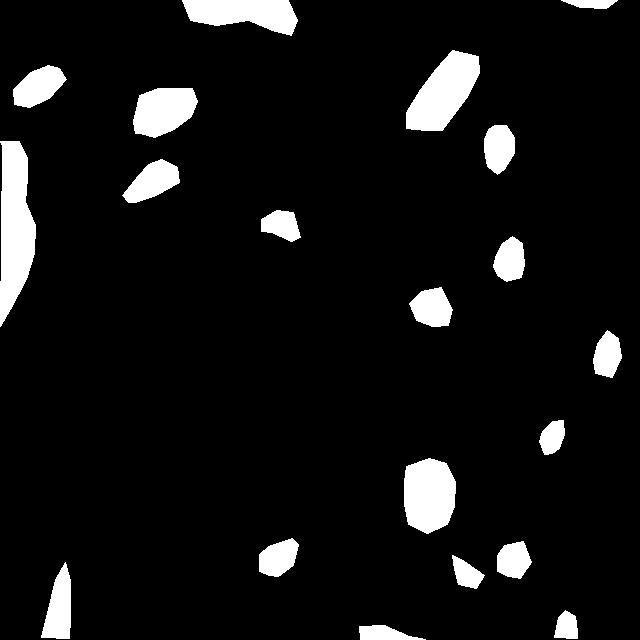

testing-097_jpg.rf.8468887e81de65fca5d6e5b4cccbd620.jpg


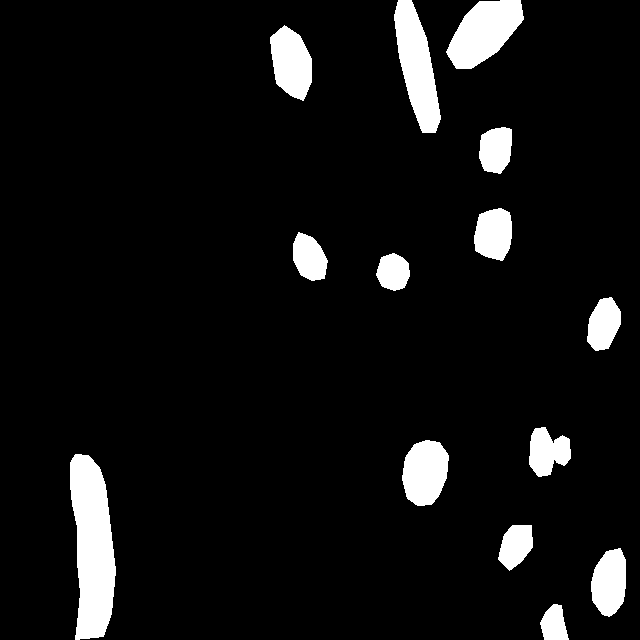

testing-131_jpg.rf.7df9a2688fd5d6fa282892878c748596.jpg


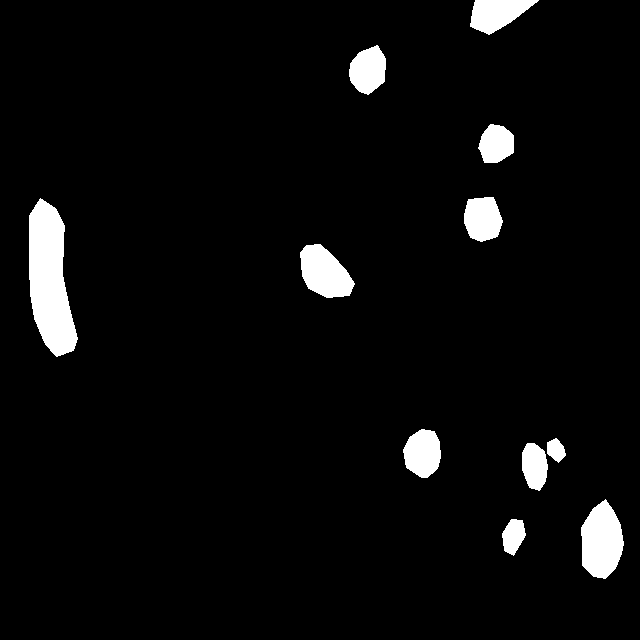

testing-050_jpg.rf.81903db665ba5d4e5dad387b3a0588a6.jpg


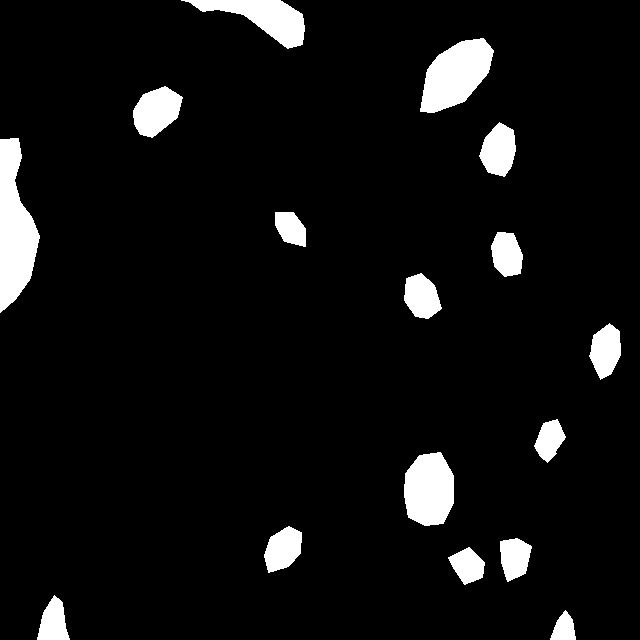

testing-151_jpg.rf.88860ddaafb4ac39ebc22d9b5a4042c3.jpg


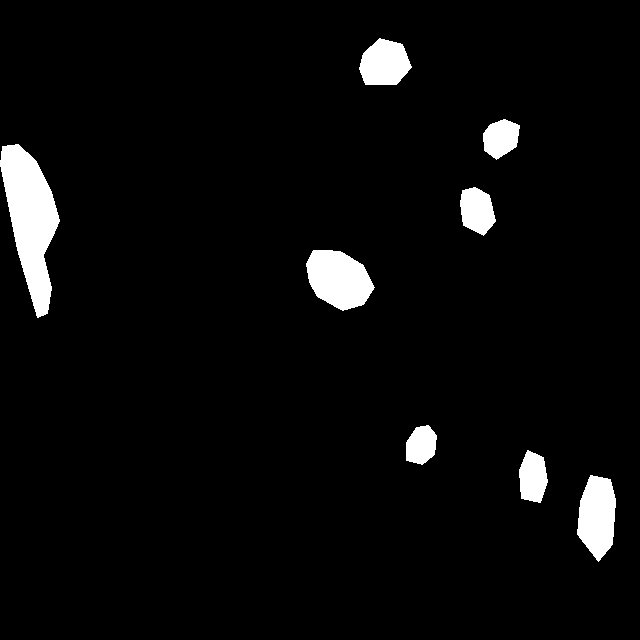

testing-093_jpg.rf.8f6a2c2fc48e526c268565c0600734c3.jpg


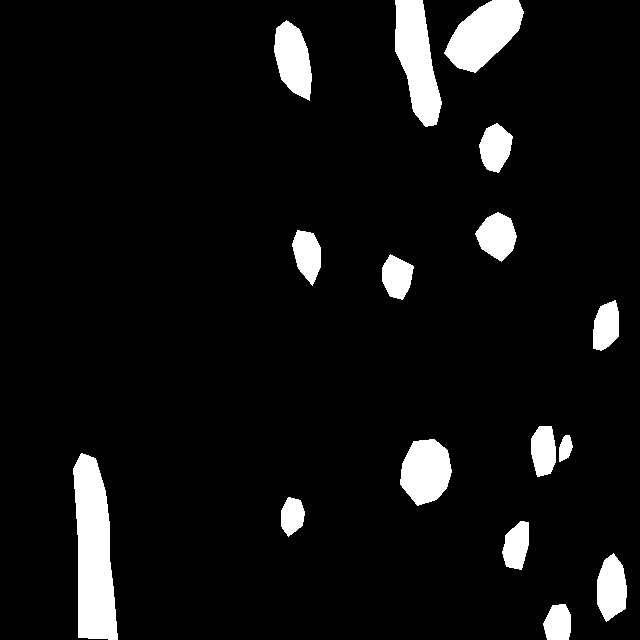

testing-072_jpg.rf.89eef6065db8f47d10a51ac7201250f8.jpg


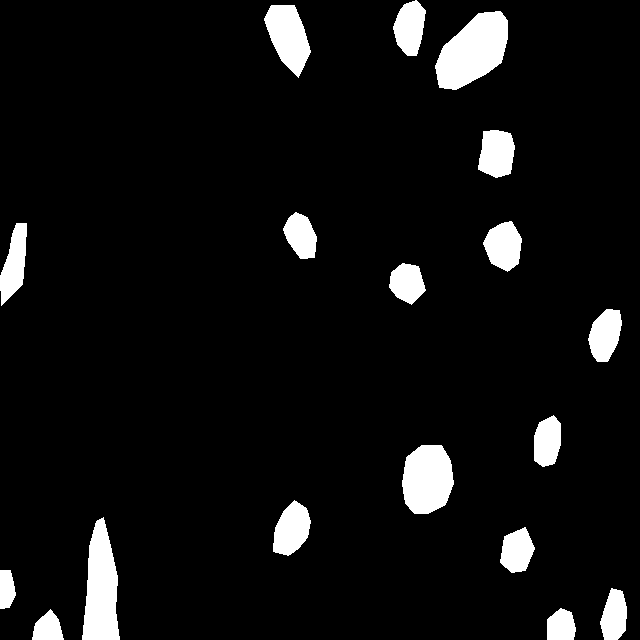

testing-067_jpg.rf.8335c9a21e91bab430c46acf09bb8987.jpg


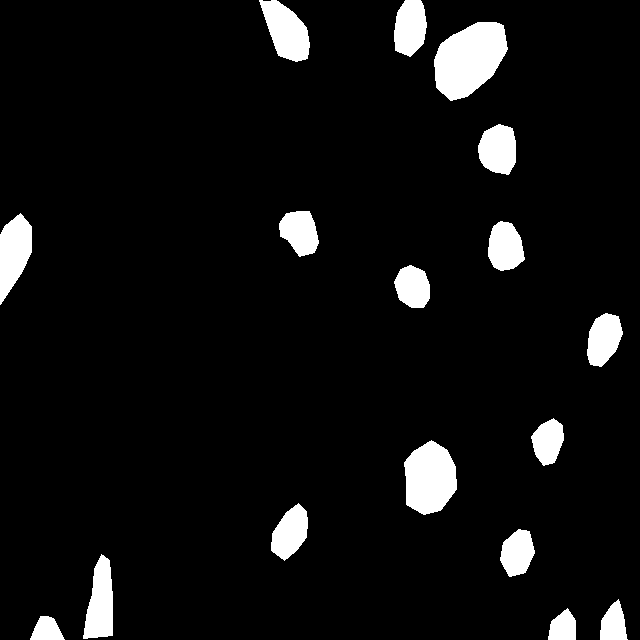

testing-080_jpg.rf.7f51bc38fbf7f81daea8a990fb038711.jpg


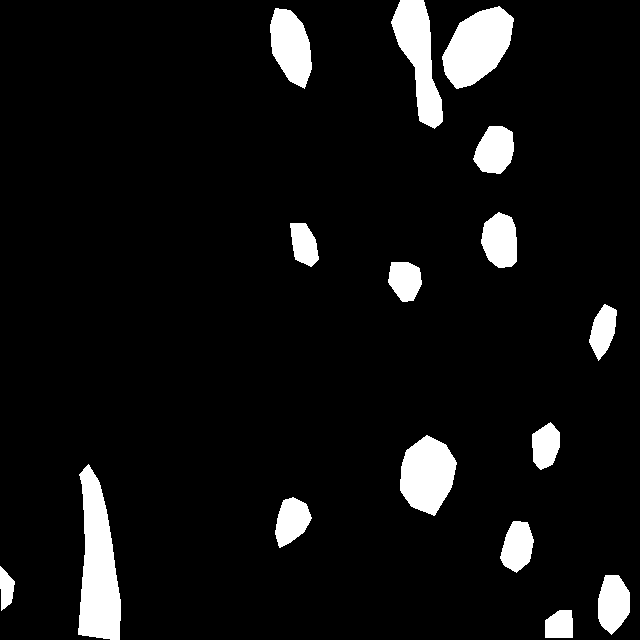

testing-034_jpg.rf.8a40fad78391c7a74aabe8818311b75a.jpg


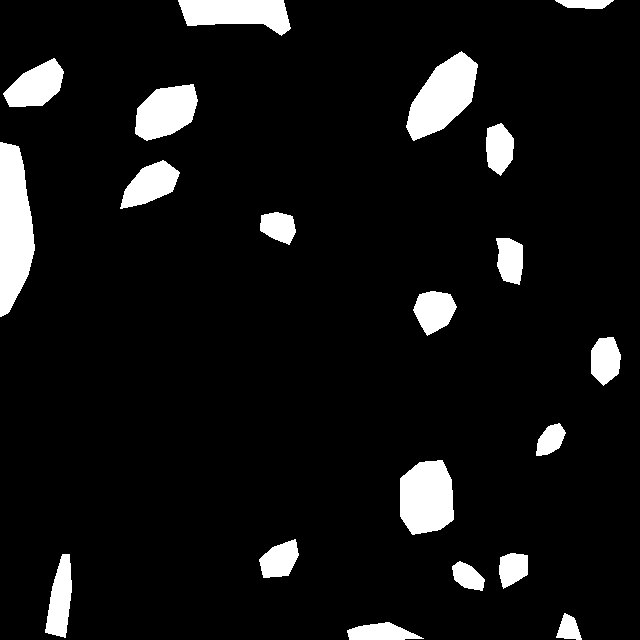

testing-028_jpg.rf.7b80742e98c2e359a1d60576c3a435f9.jpg


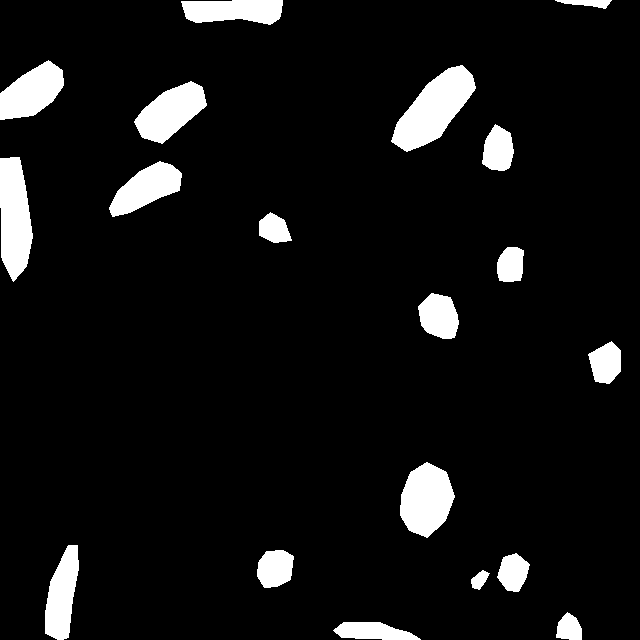

testing-146_jpg.rf.83c82417720e60d792b1100f68562a4e.jpg


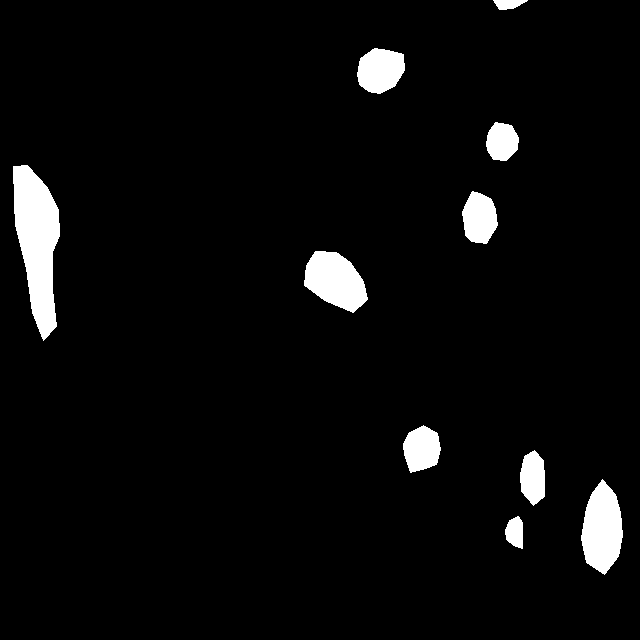

testing-162_jpg.rf.87fa0b4dcecf8fc9c049fa5b719c9839.jpg


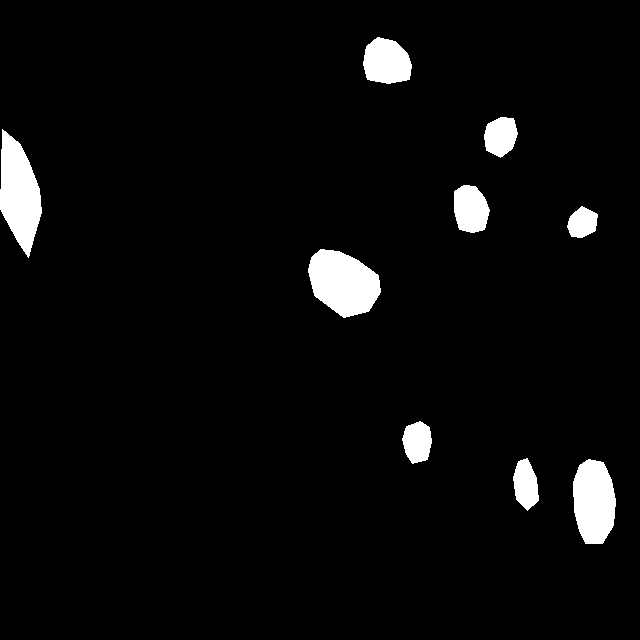

testing-016_jpg.rf.937e8980b1605808d931f0393f7099e3.jpg


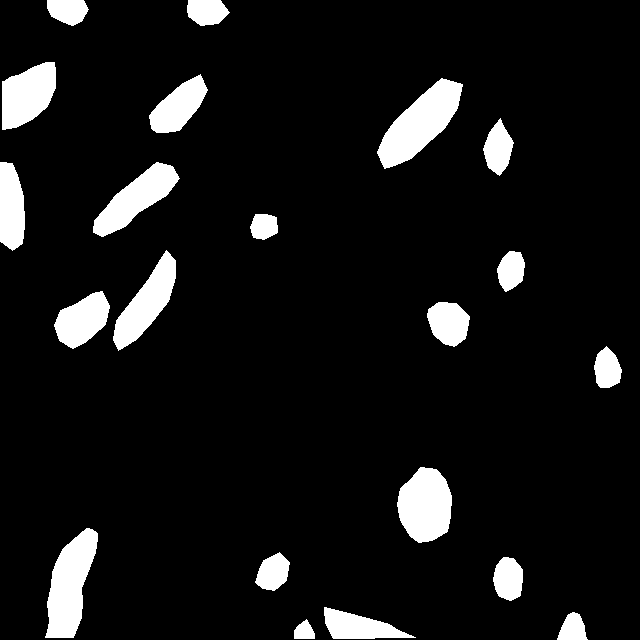

testing-042_jpg.rf.93704b89a367403e9cceb7c77e3939b3.jpg


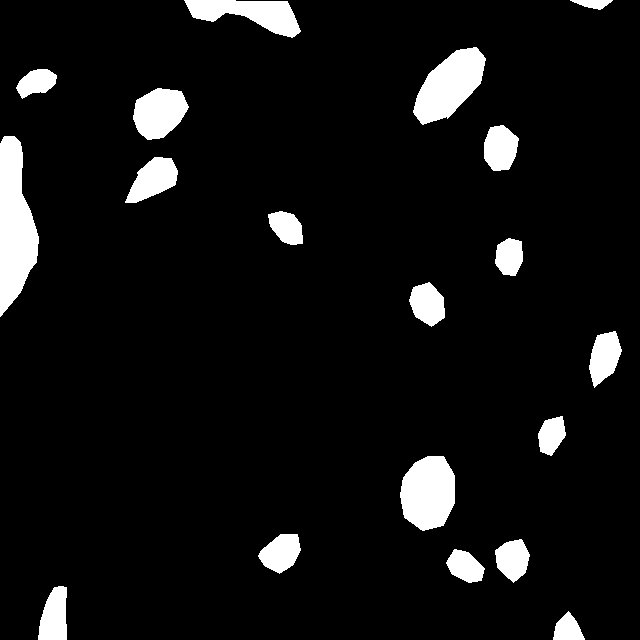

testing-103_jpg.rf.95289396ad0027324b552b29e8967918.jpg


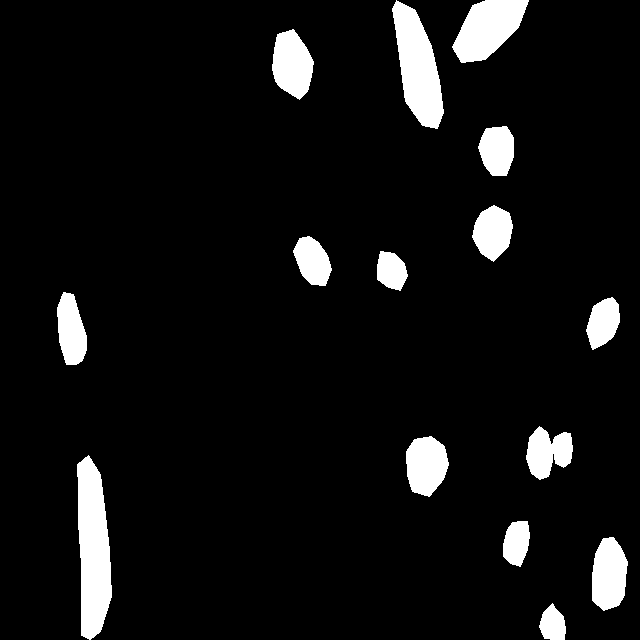

testing-083_jpg.rf.a4cfb7f1e4862a88aeed2982ced4392b.jpg


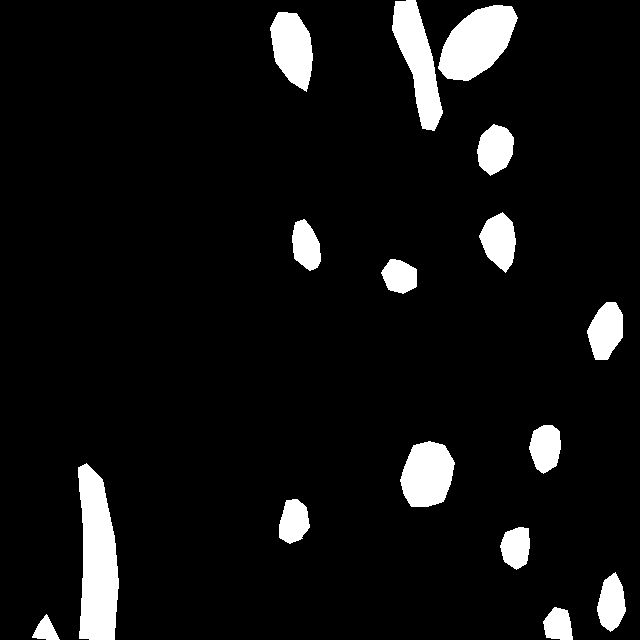

testing-025_jpg.rf.93a1fb45696c264f68b56caa305f684e.jpg


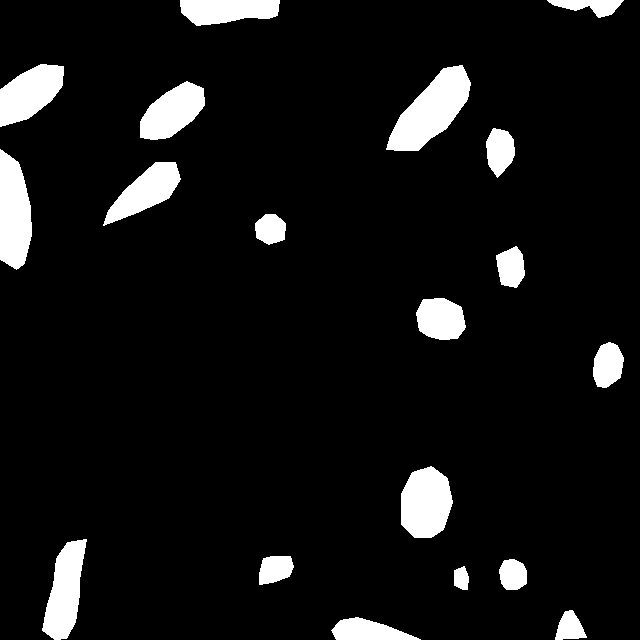

testing-092_jpg.rf.a9146079f19049fbe428de1e879a3ca0.jpg


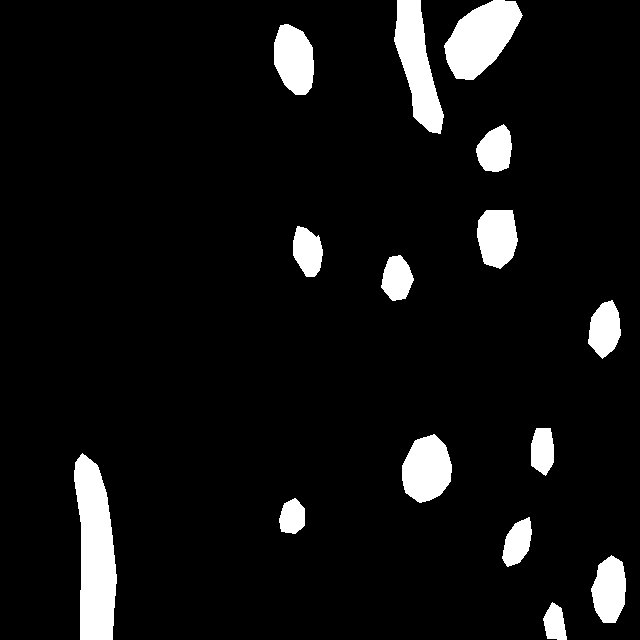

testing-048_jpg.rf.a2ae7d423ee3980416794517447b1a4b.jpg


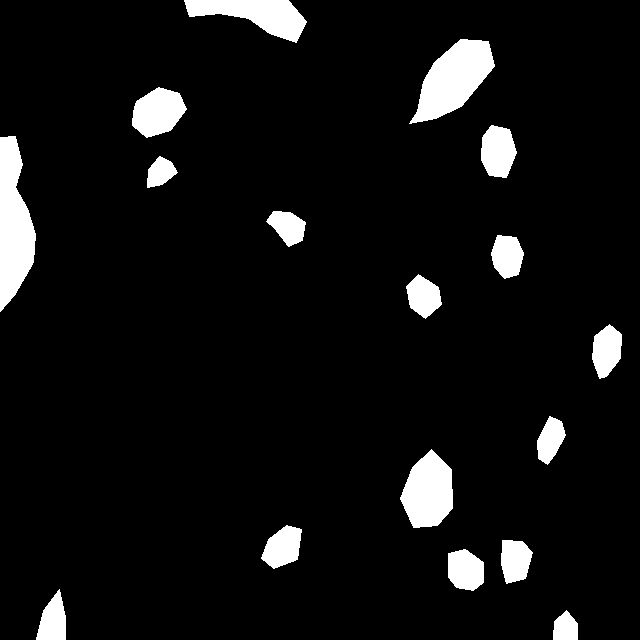

testing-126_jpg.rf.9bdedb6c8acc03c68c1fce5848ec7316.jpg


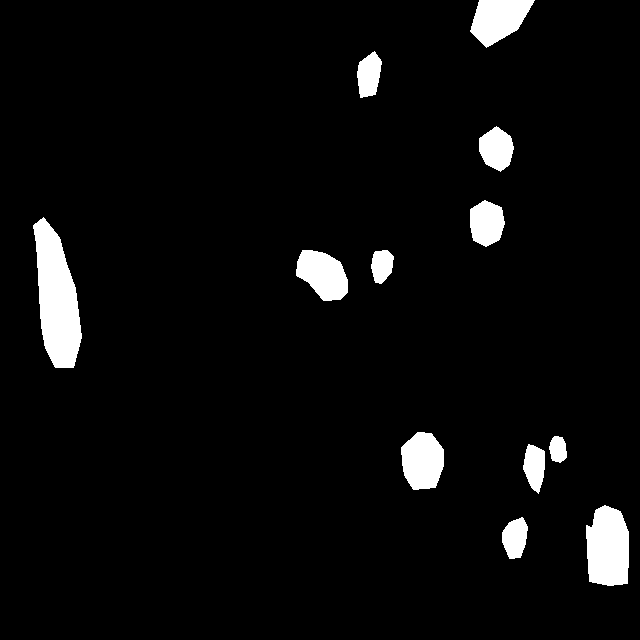

testing-054_jpg.rf.95a047d1190b37b412180c606b4e477e.jpg


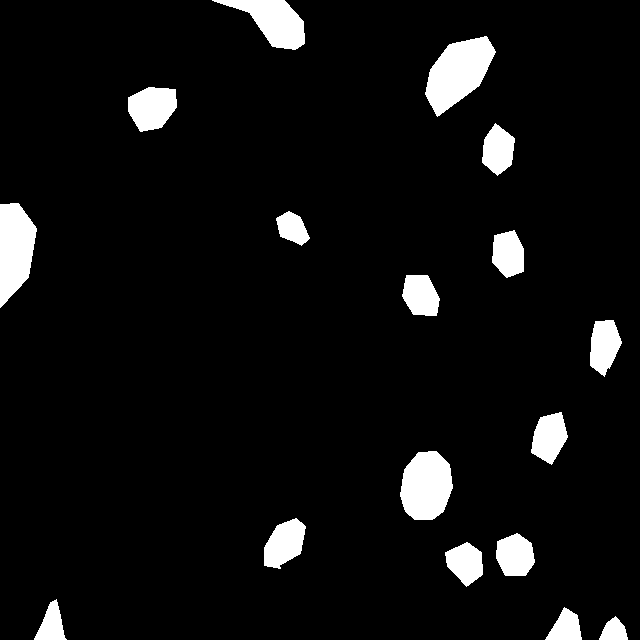

testing-030_jpg.rf.a64d11c045d834993c0fb74f11aaf79a.jpg


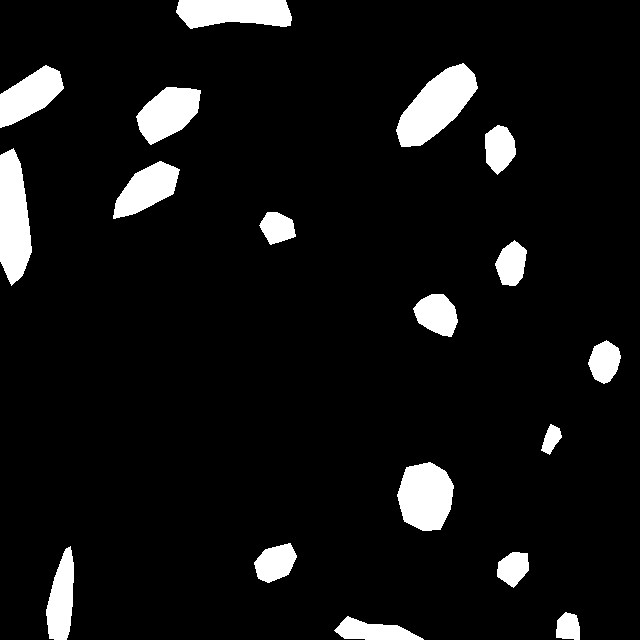

testing-165_jpg.rf.a37a63bd3d9d66ea6bc32b5040a91701.jpg


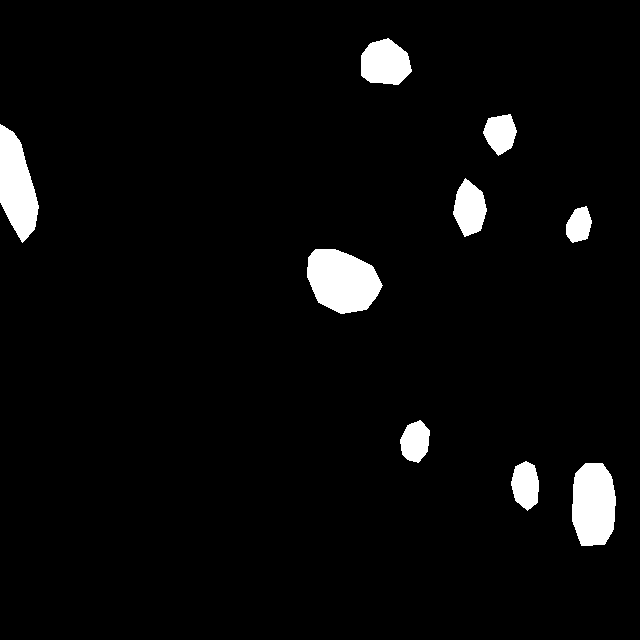

testing-109_jpg.rf.a371a42aed854661d0ddd98cff34d03f.jpg


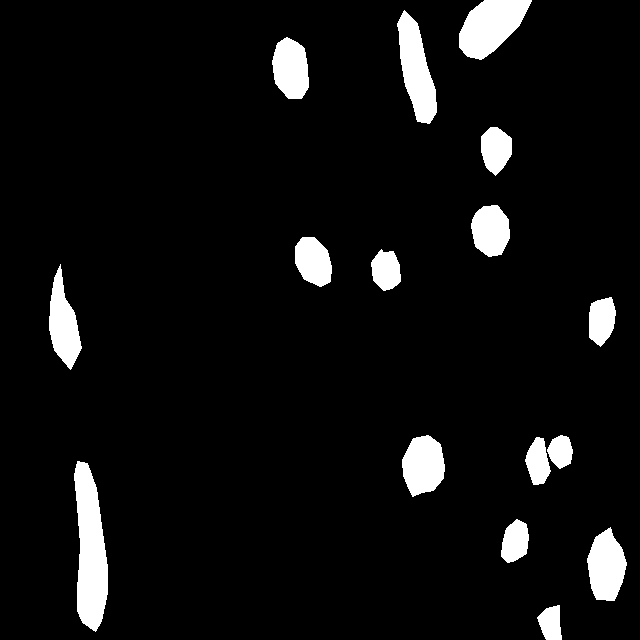

testing-139_jpg.rf.a84917e91c2c998ab6646643aefb4429.jpg


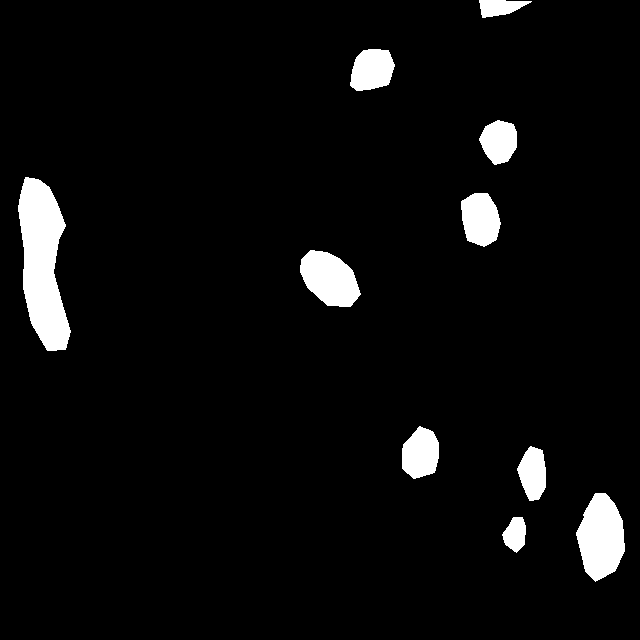

testing-161_jpg.rf.a7d3d4936db19175d561651da48d194b.jpg


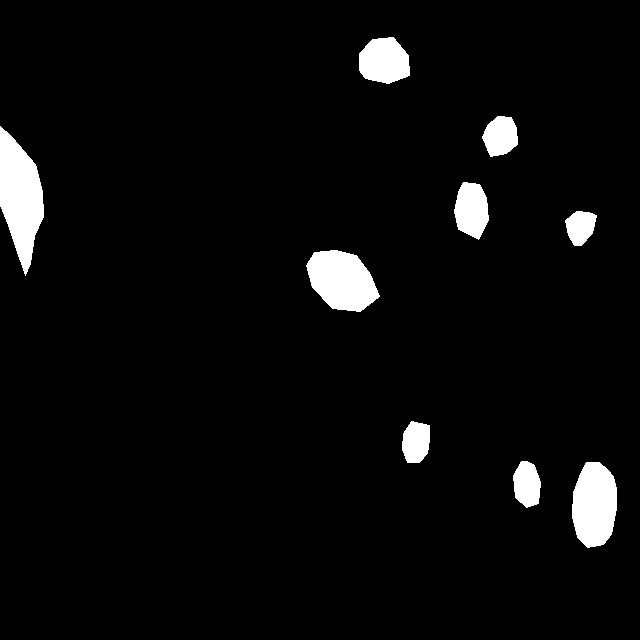

testing-059_jpg.rf.a896394c21879ebbc912d85f2e755bca.jpg


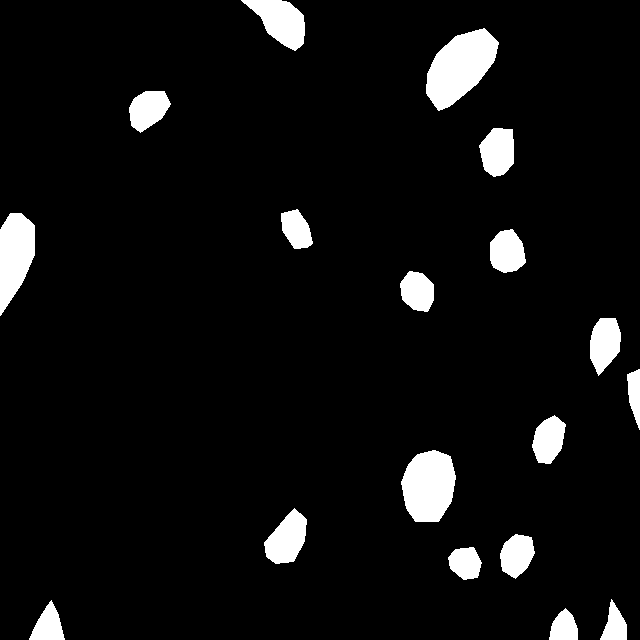

testing-098_jpg.rf.a61c343c18e7e2396ca9ccbbc5d70073.jpg


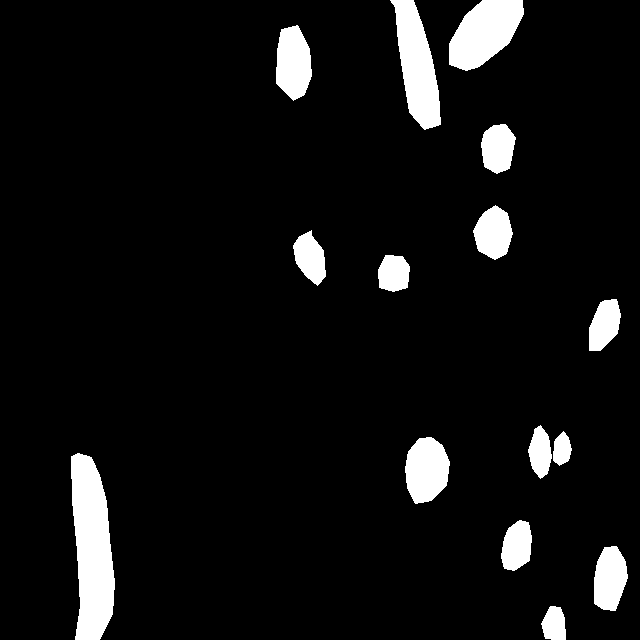

testing-051_jpg.rf.9cedf12d85e828f67728192854d2088c.jpg


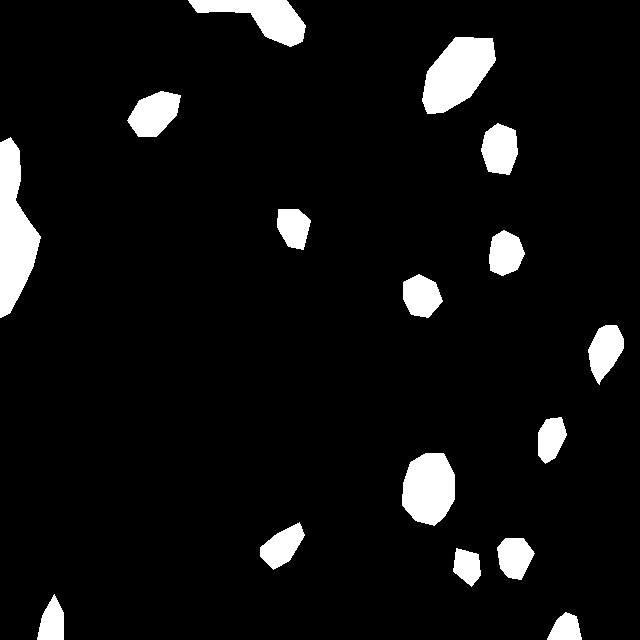

testing-027_jpg.rf.a05bb6c19d3a332134e88572374e8fa9.jpg


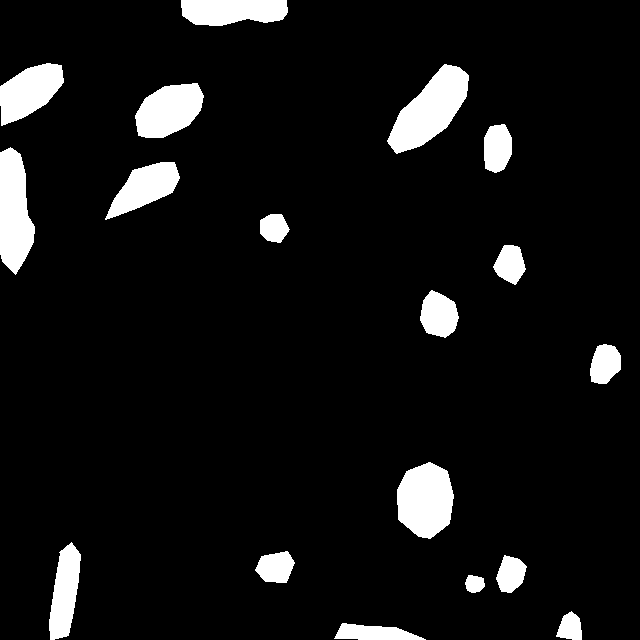

testing-087_jpg.rf.9f622ac10c903a99a7338fe7eb804cb3.jpg


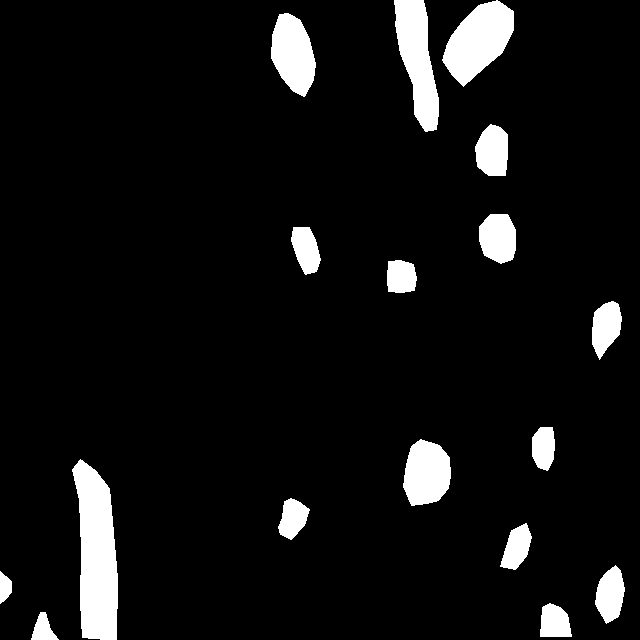

testing-133_jpg.rf.b0c8530c05dee16041839626441e6feb.jpg


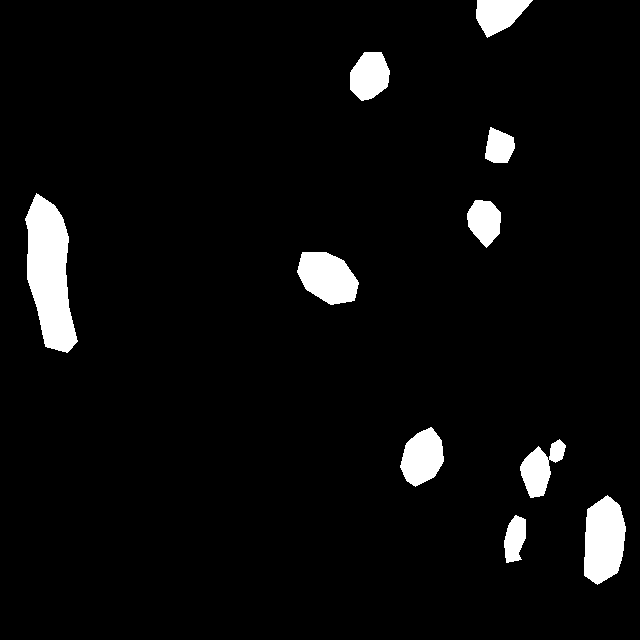

testing-090_jpg.rf.ab3ffd097bc7074cc04ff804b3f2db45.jpg


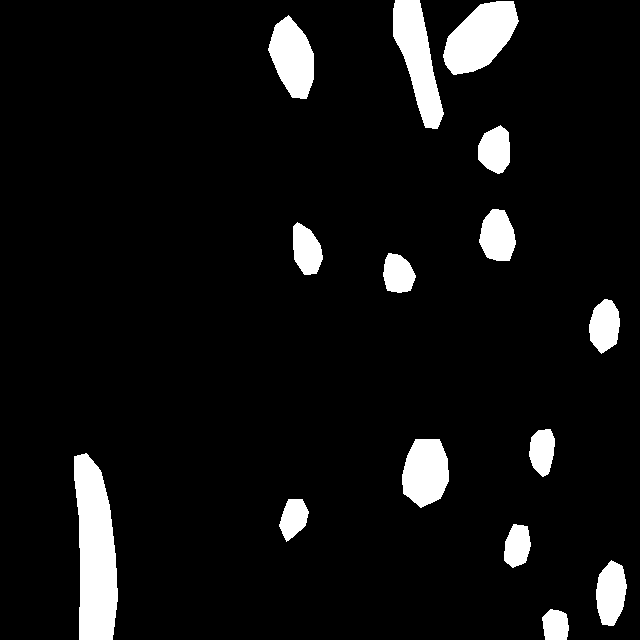

testing-077_jpg.rf.b29db7542e5e2111fffd463c2f3620dd.jpg


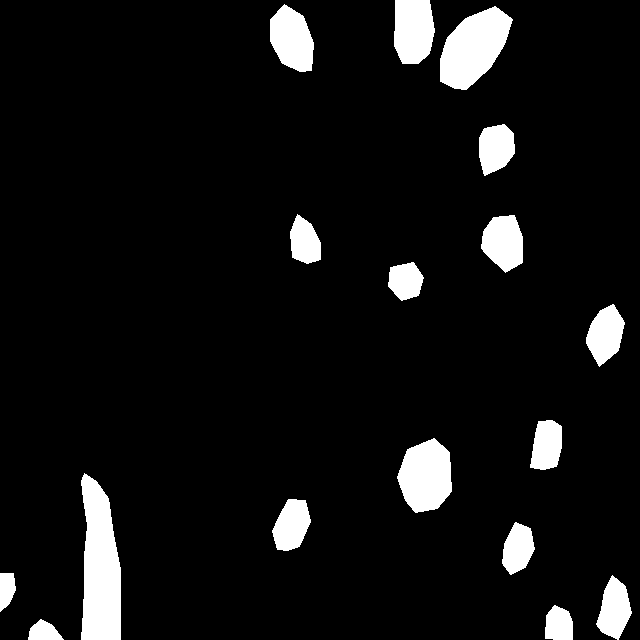

testing-149_jpg.rf.94881b7fbb73959208ea301f70af3b1a.jpg


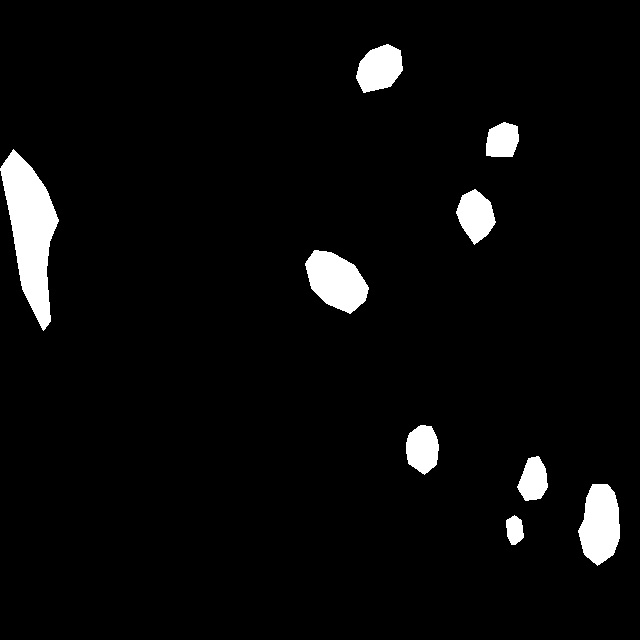

testing-044_jpg.rf.b5014b5870c7d38ccc5d9be7a6121934.jpg


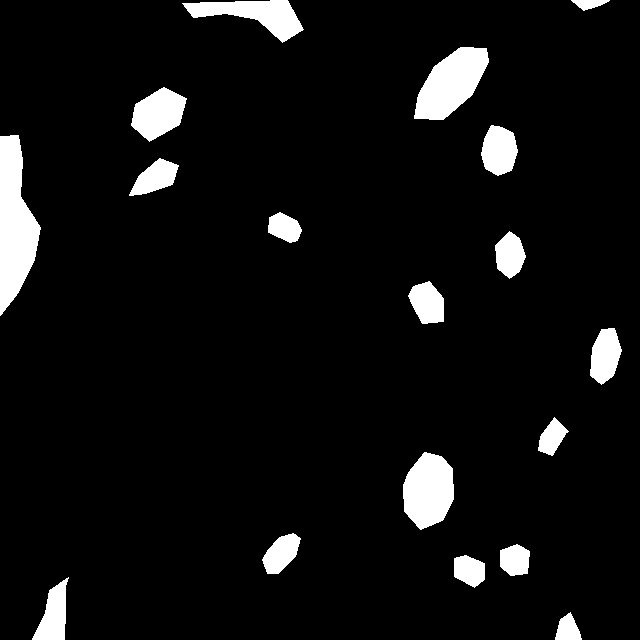

testing-012_jpg.rf.c16e516055fe3eb45a340537ae0d676f.jpg


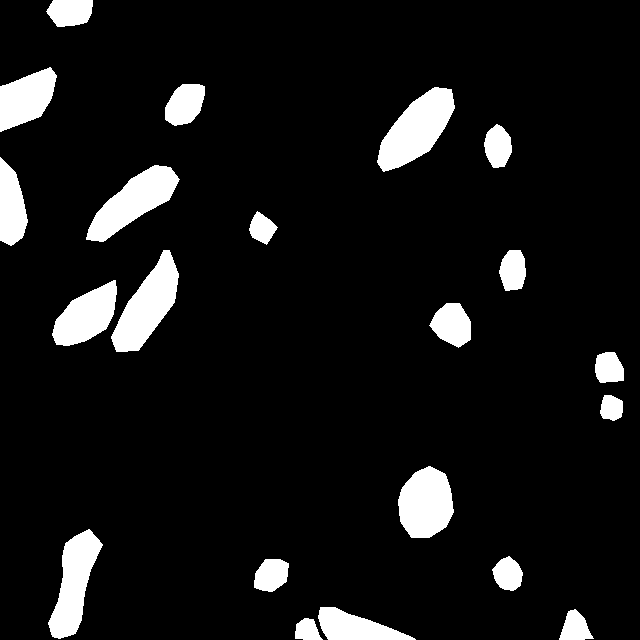

testing-003_jpg.rf.b2c7d03b2d2939a7569139f000c4f14f.jpg


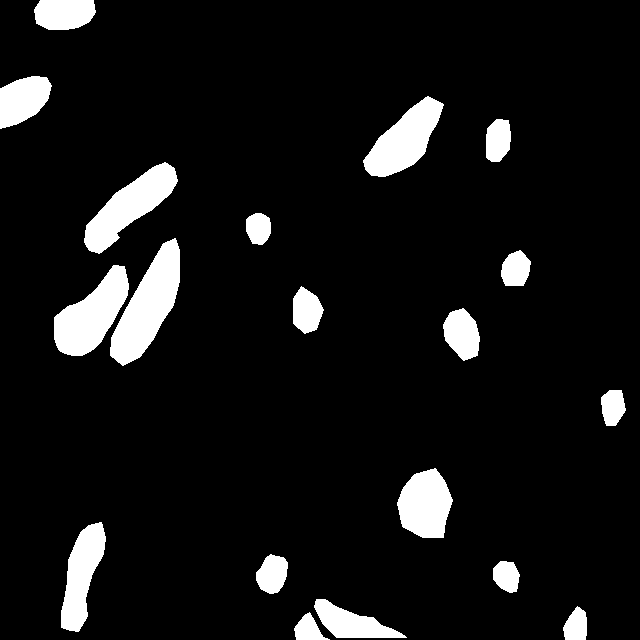

testing-100_jpg.rf.bf5646766735d7c3e28bbf0353656eee.jpg


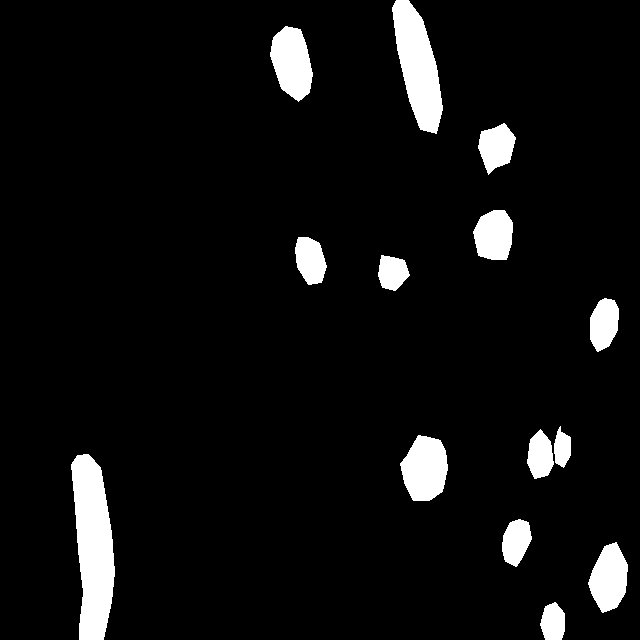

testing-110_jpg.rf.c065be2070462bdd5d2ff9eb296d2ae0.jpg


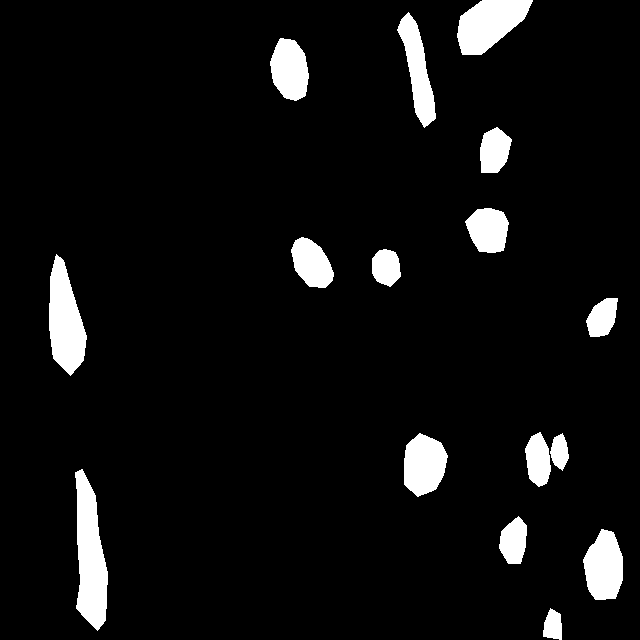

testing-001_jpg.rf.c51de1a41829bc967a28e6b8868aab9b.jpg


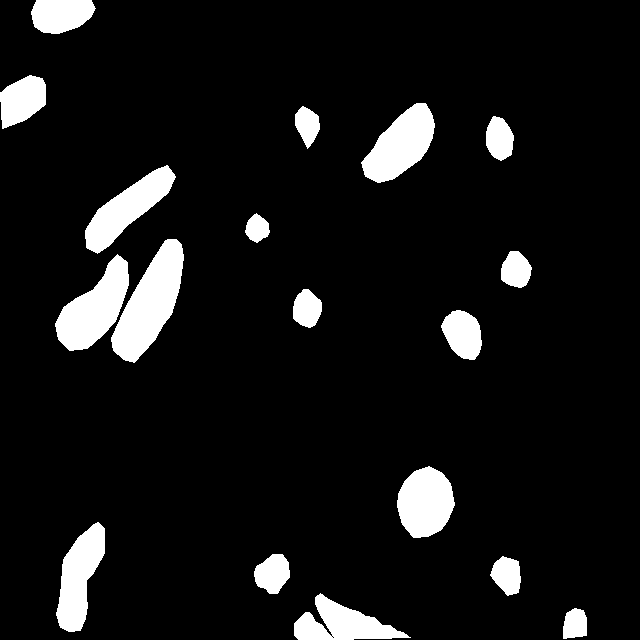

testing-153_jpg.rf.adf38310819e345f8c3e8ba2074544c5.jpg


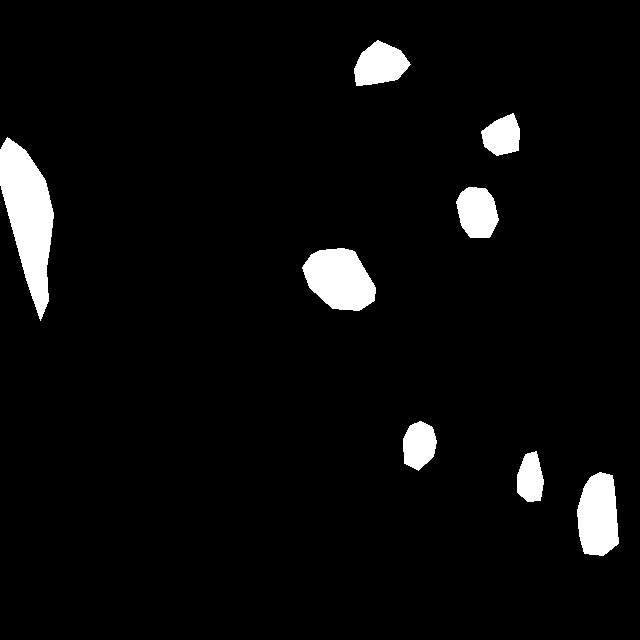

testing-129_jpg.rf.b13e7d64090ee8d1f8d71f4bdc4f1769.jpg


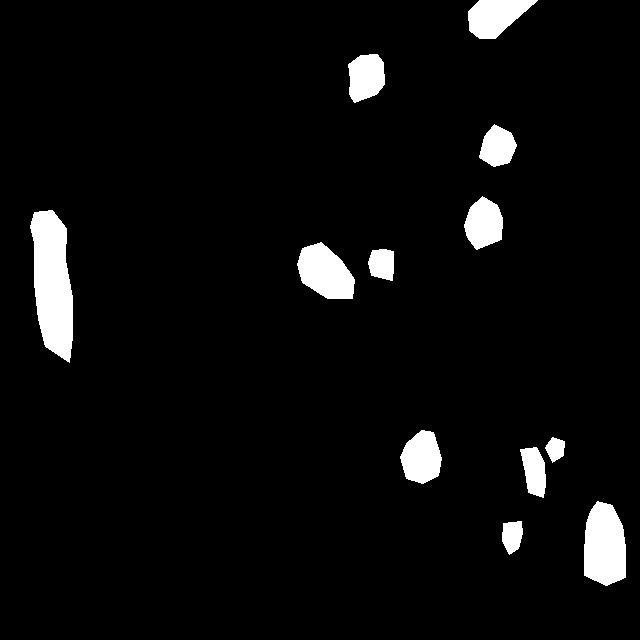

testing-047_jpg.rf.c66fbaed79fef8a8bd911420f0e71314.jpg


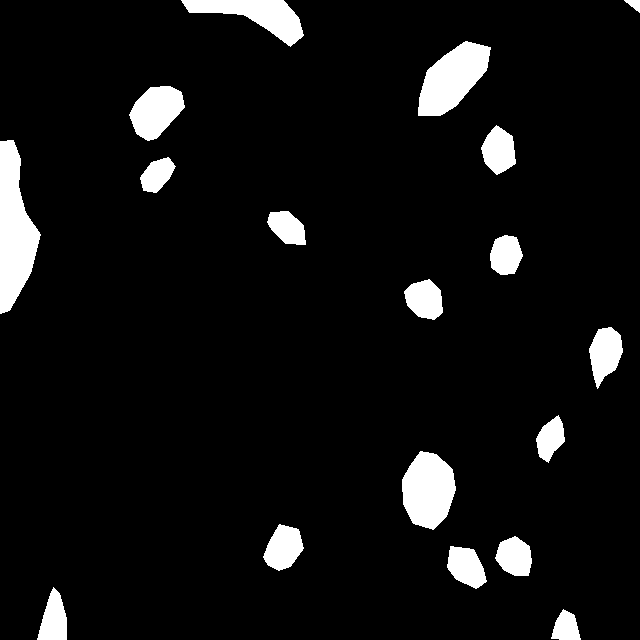

testing-156_jpg.rf.bd0643d7cabfd0592c9c356a86e8ddec.jpg


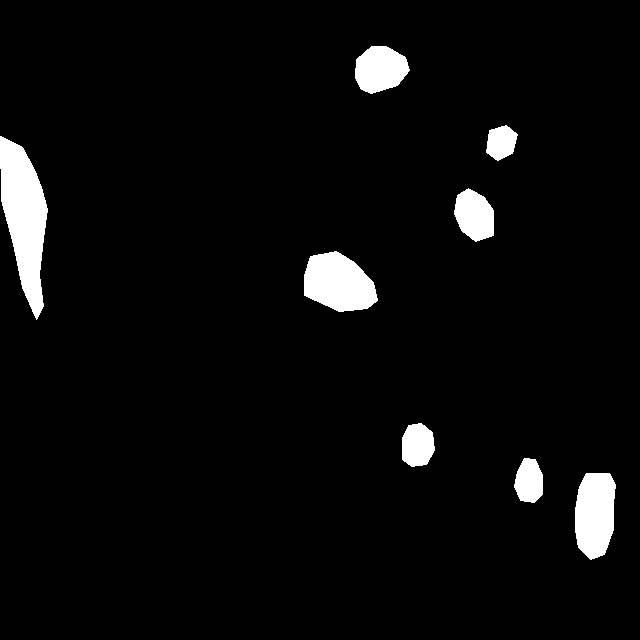

testing-086_jpg.rf.c9812111784fbc3c7ff7da186f52f20f.jpg


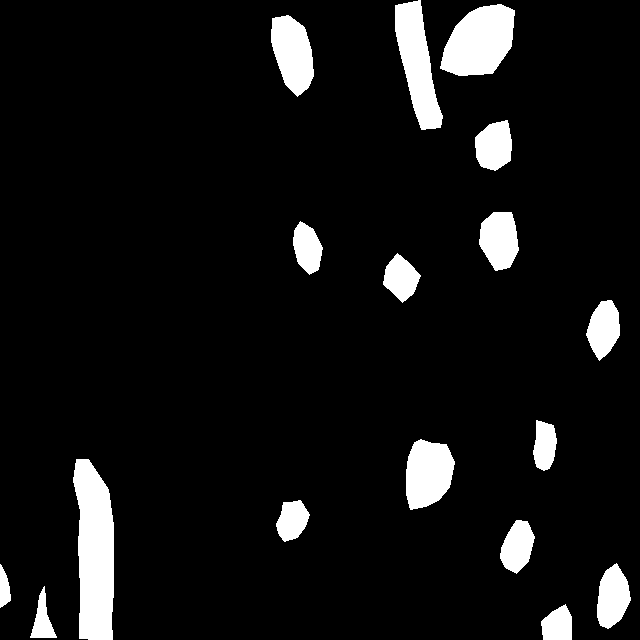

testing-031_jpg.rf.b8596238db82f0ca43aef48e4b2e2138.jpg


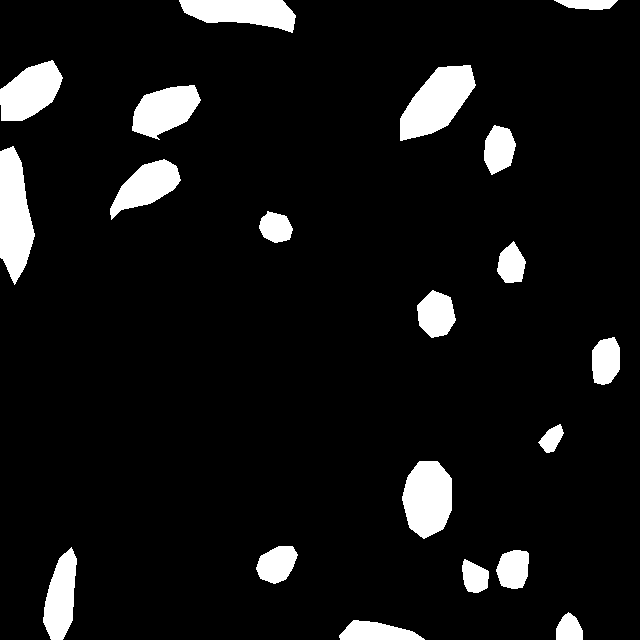

testing-125_jpg.rf.ccb55fe4d9418bce287e55052fe1f8cf.jpg


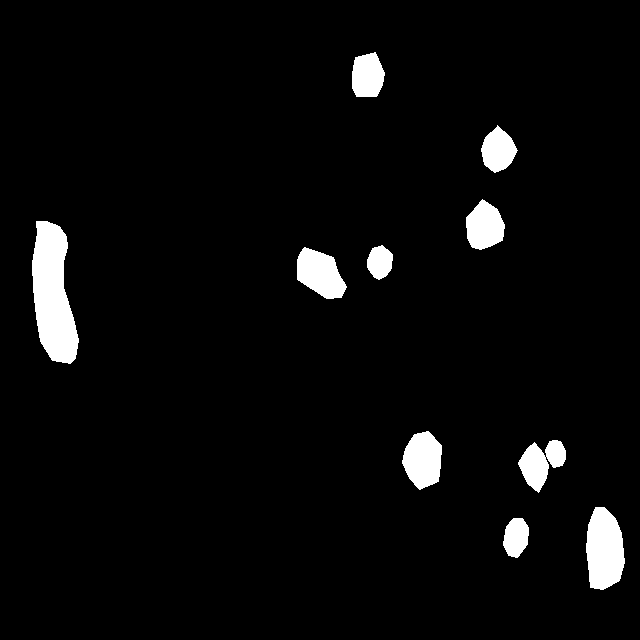

testing-105_jpg.rf.ca036ba50324553cdbc915ed96f38bfd.jpg


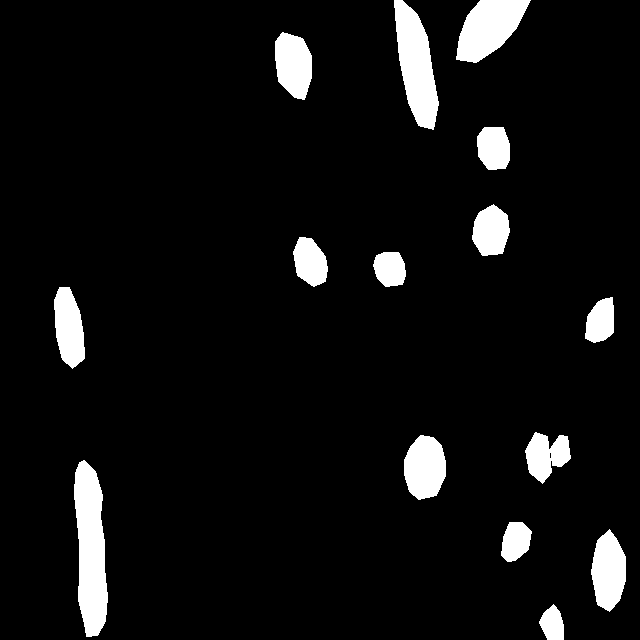

testing-037_jpg.rf.c5281919b7659575c1ed61c06fcfb82e.jpg


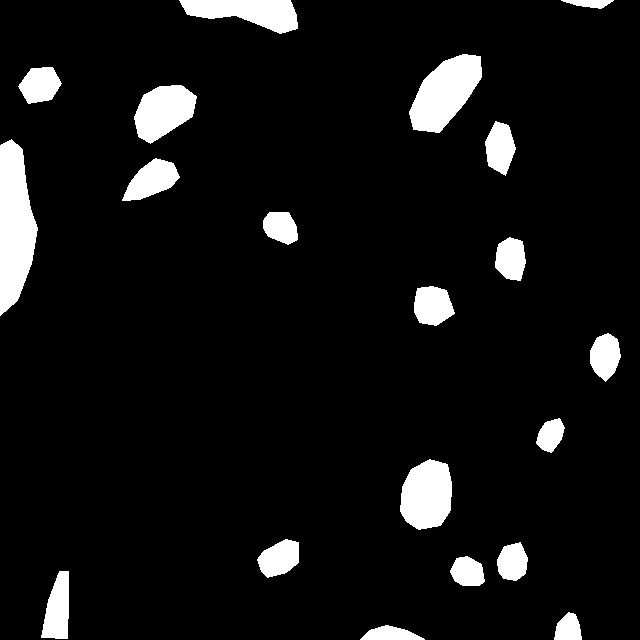

testing-053_jpg.rf.c15b75ad42d6afdf499a6e22742f0856.jpg


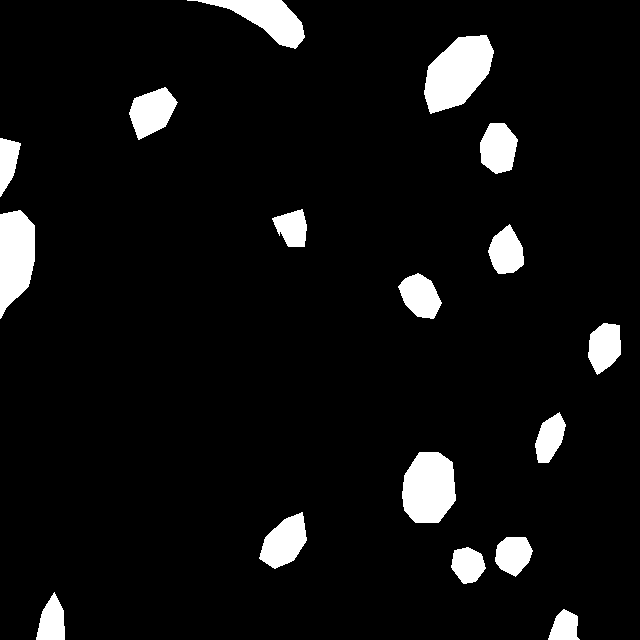

testing-039_jpg.rf.c56d50e41884bd9376089ae5df7a3925.jpg


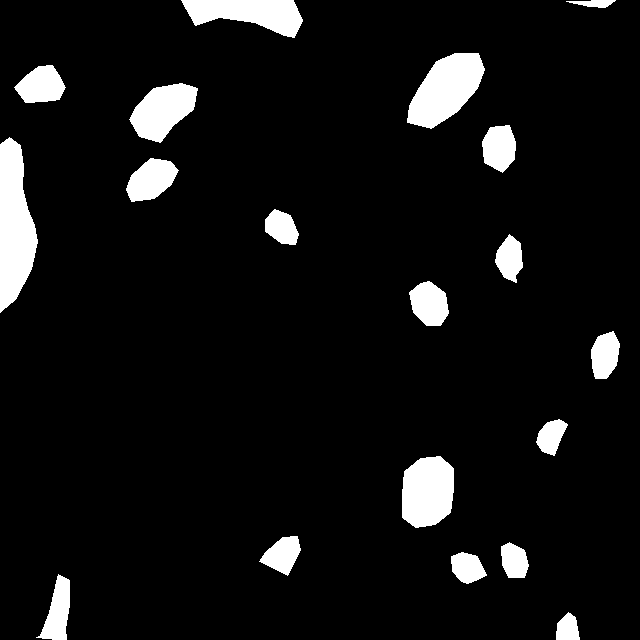

testing-152_jpg.rf.cca491ea8c4c6cfe1b7fbf5eed96ae3e.jpg


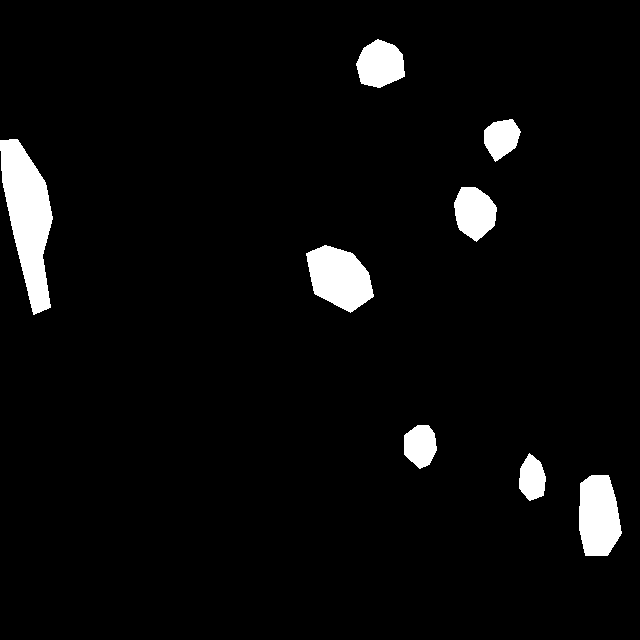

testing-121_jpg.rf.c51ac267dbcd15d1f8179629b12c0681.jpg


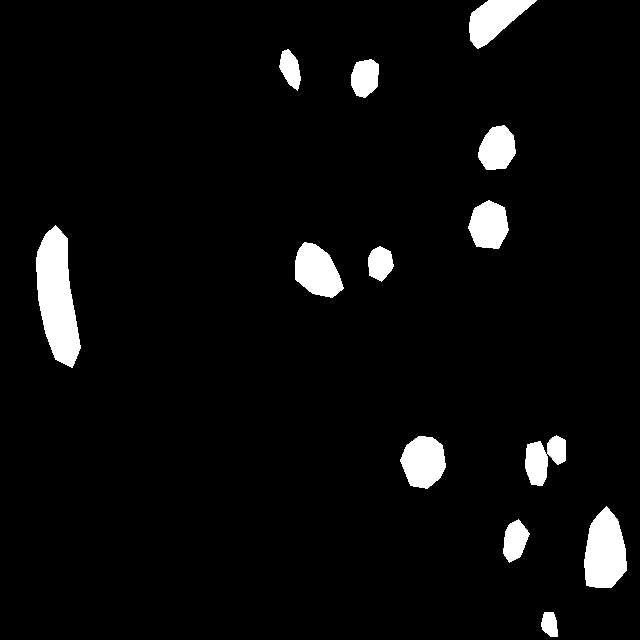

testing-157_jpg.rf.c57348a1333361b9fda9377807cf22b2.jpg


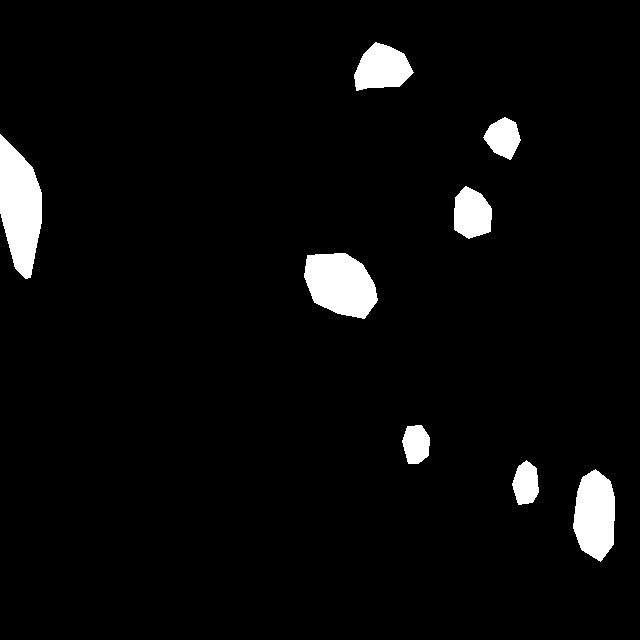

testing-055_jpg.rf.c4a993c091ae5ed2314cd1510c3c471e.jpg


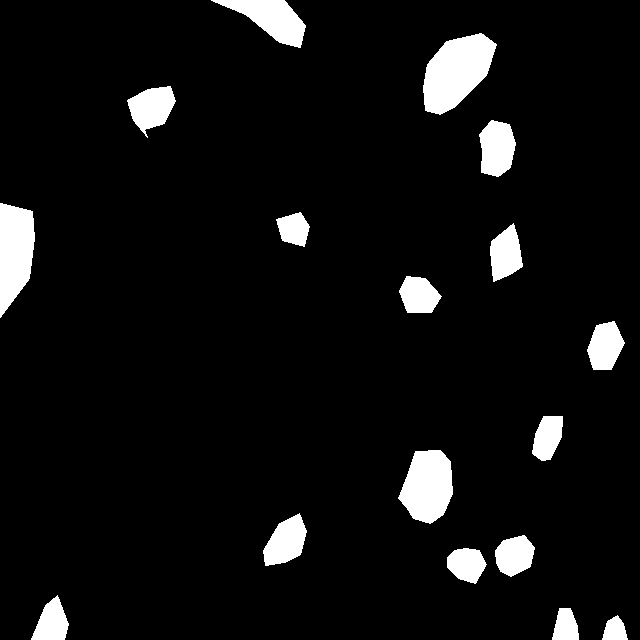

testing-155_jpg.rf.ca8c17b427f18f5d37988776ea185702.jpg


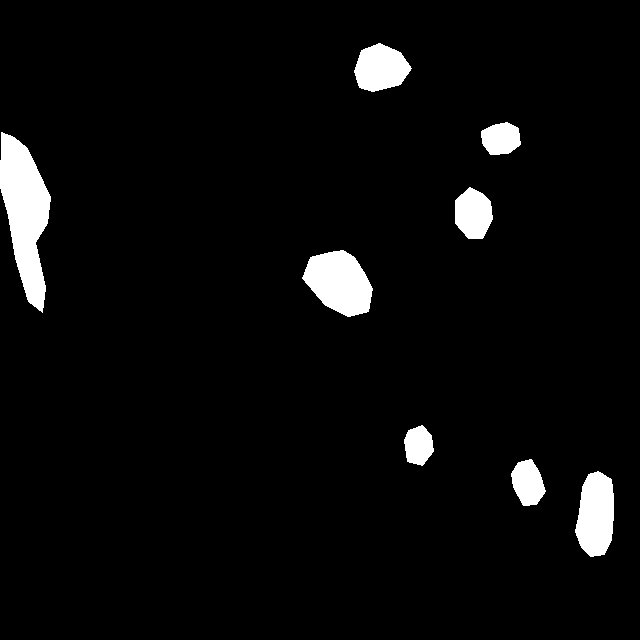

testing-021_jpg.rf.d98e43dfffd4a94396d8e56b5adeceb6.jpg


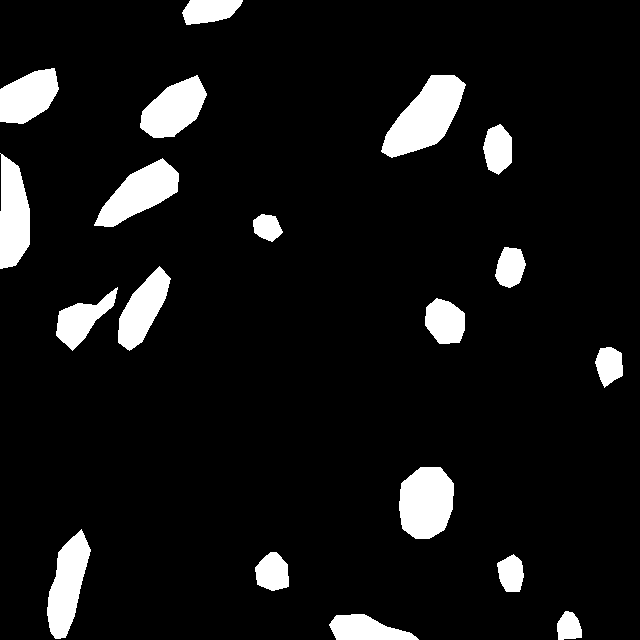

testing-143_jpg.rf.d8edcd310f0ed827f7e82fcaa4350bbc.jpg


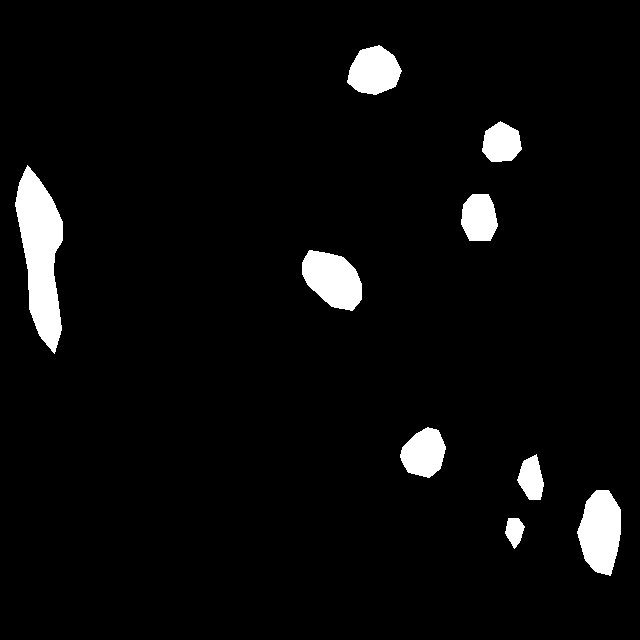

testing-158_jpg.rf.d05ffce9a9f2bdacbf052ad0a0ef18d0.jpg


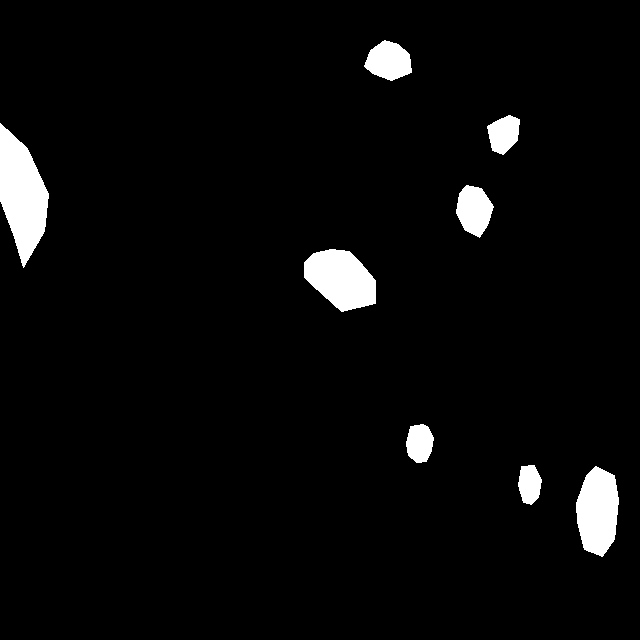

testing-114_jpg.rf.d7572a1372fd780cfaa066f20c38b67d.jpg


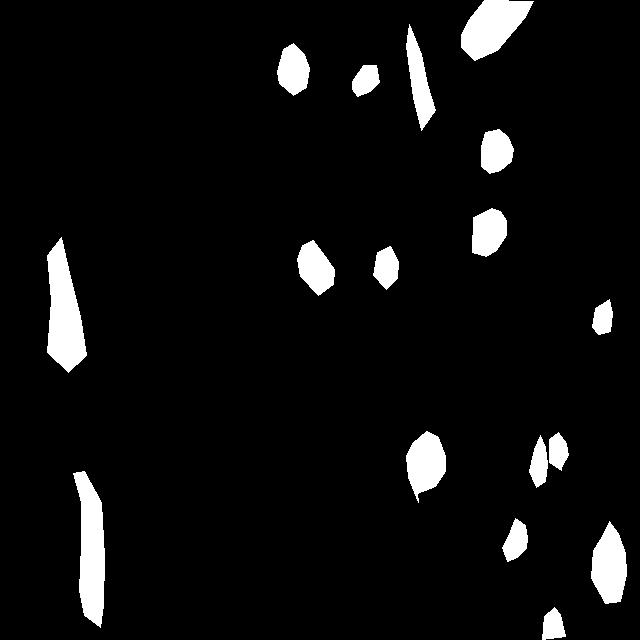

testing-088_jpg.rf.cacf3a68a99616663be5659a50a47c6b.jpg


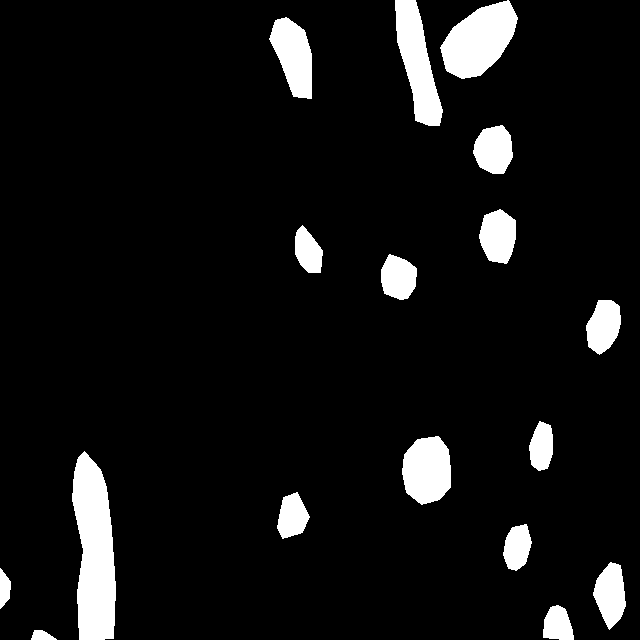

testing-061_jpg.rf.ceadf990a4b80c077451ad47a831326b.jpg


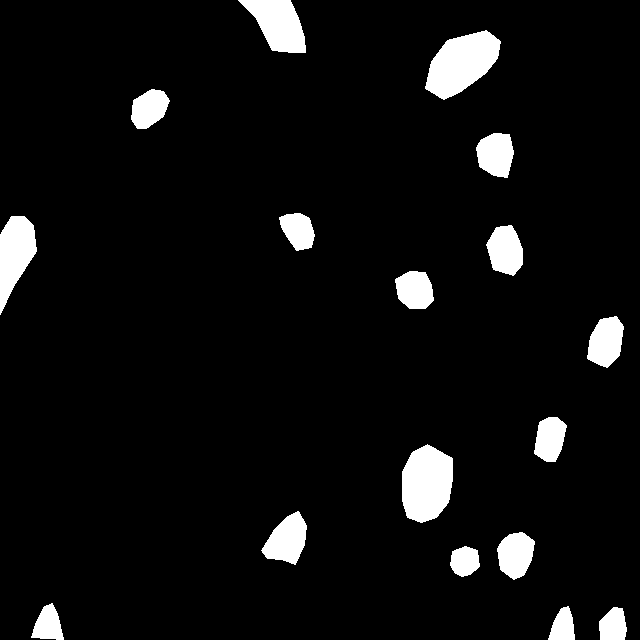

testing-094_jpg.rf.e15e3bbb45fc08528c115f4ff8fbd921.jpg


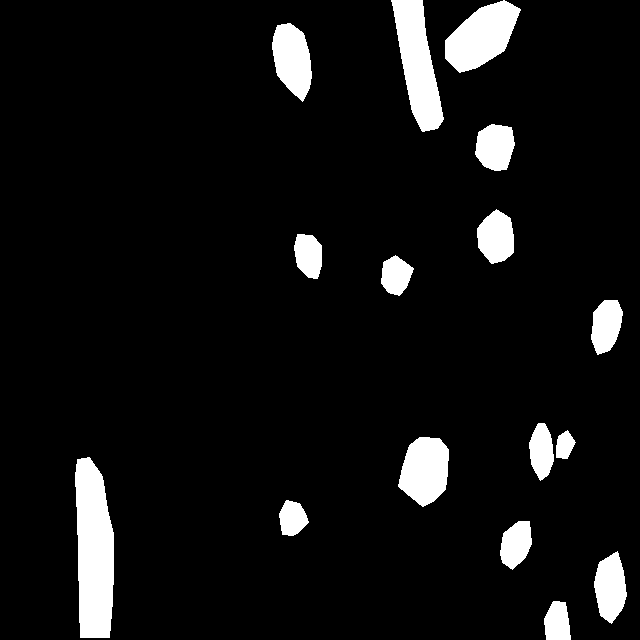

testing-154_jpg.rf.f6f44e5e6e603400810a05e46aa5d047.jpg


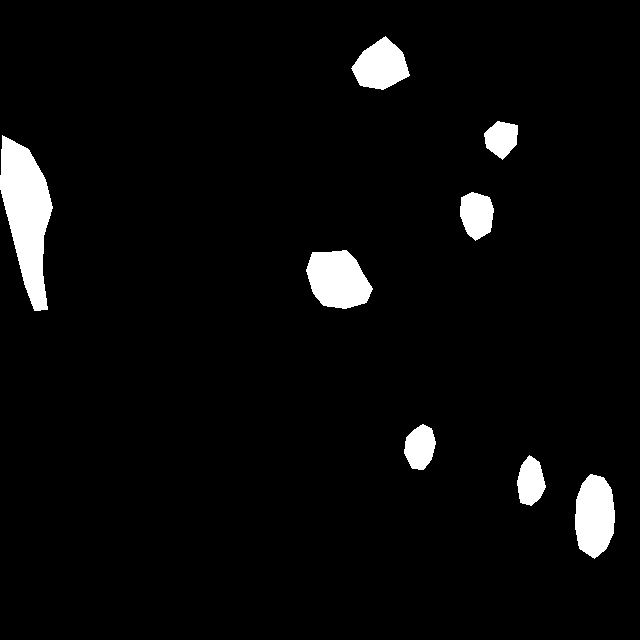

testing-065_jpg.rf.de5357d6f71e939be7a5bf1fddb569bf.jpg


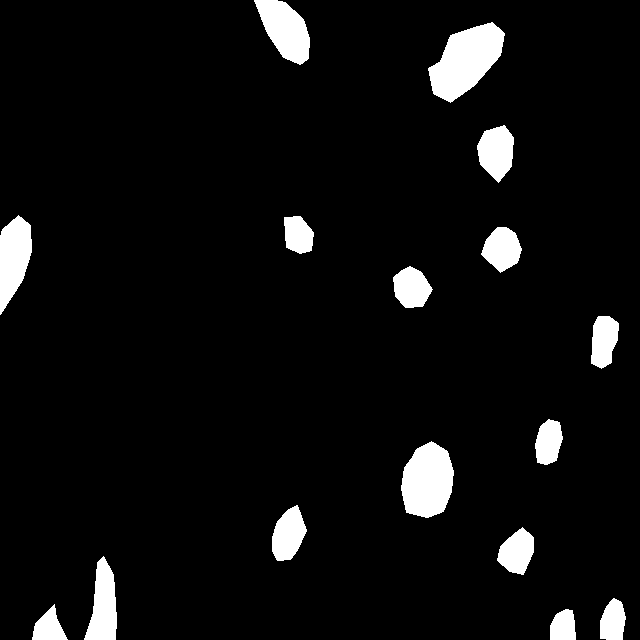

testing-079_jpg.rf.e3f6d2c8804818a5b2199b5003b7814f.jpg


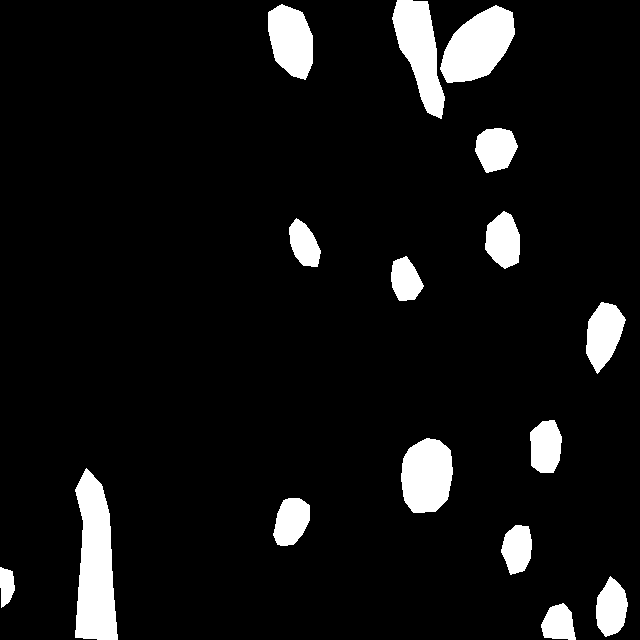

testing-116_jpg.rf.f2f0e78a2e0fc298b853e33192ce70b6.jpg


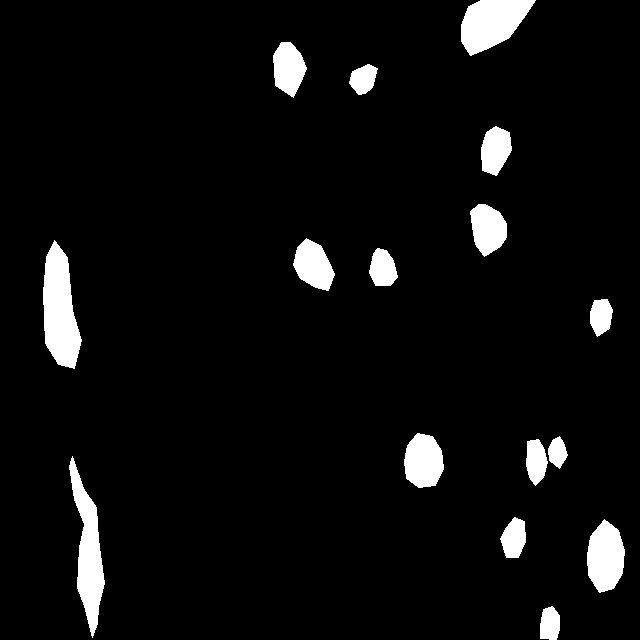

testing-124_jpg.rf.e4cc0eeb31d9d70ce06da524348ccf1e.jpg


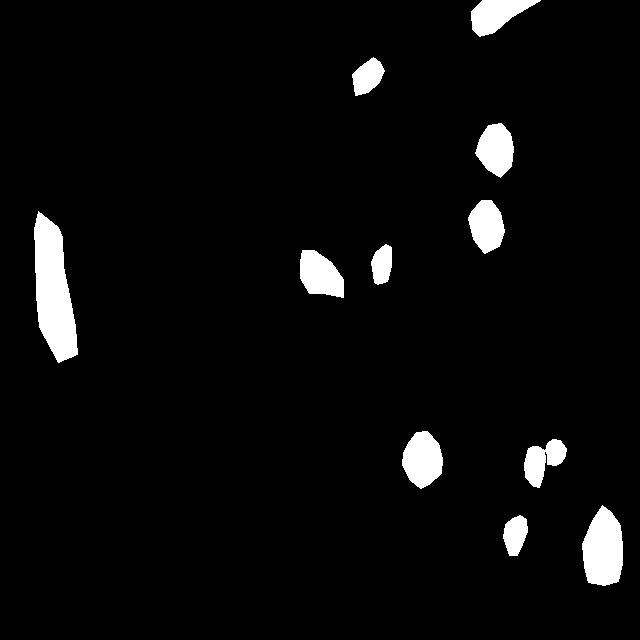

testing-111_jpg.rf.d516aee4d28225a4f40335d5ab23eb0a.jpg


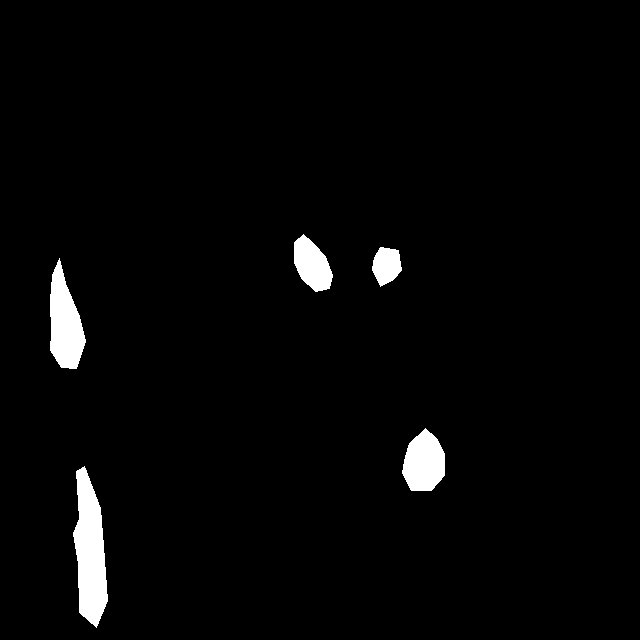

testing-123_jpg.rf.ed0a495bf2da4a520ce5c3b58e682479.jpg


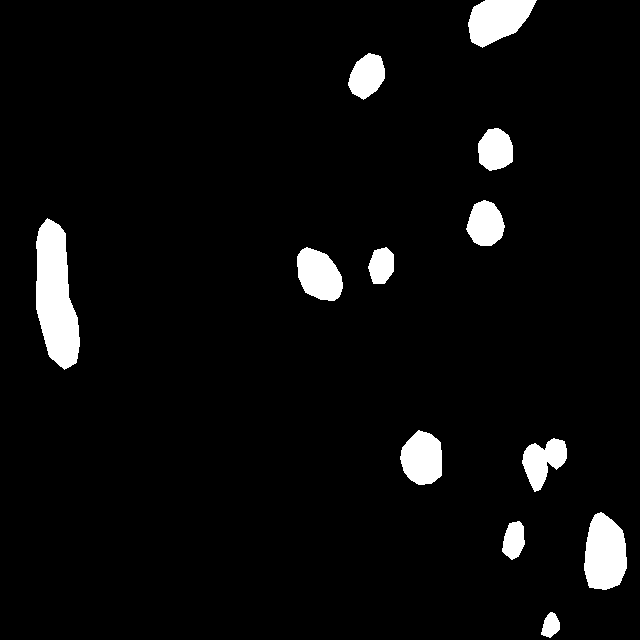

testing-144_jpg.rf.f80a605bdb29a84de1020777429acd09.jpg


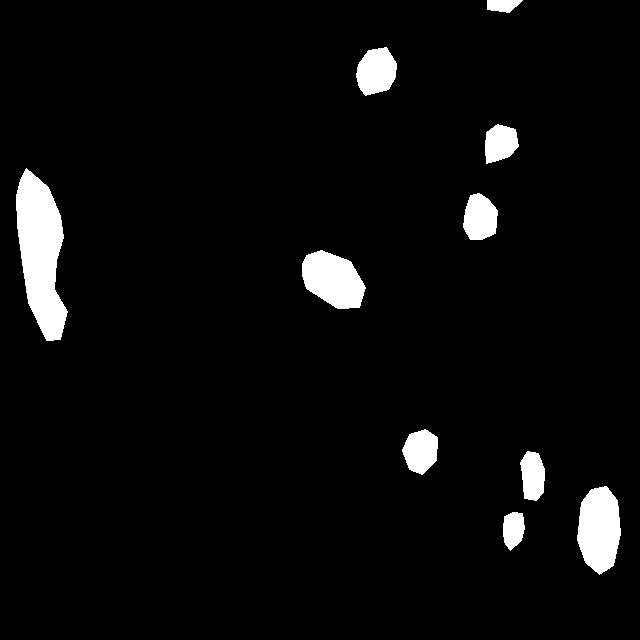

testing-089_jpg.rf.ecfd1a2f71aca3539a5b91a6af21b3fa.jpg


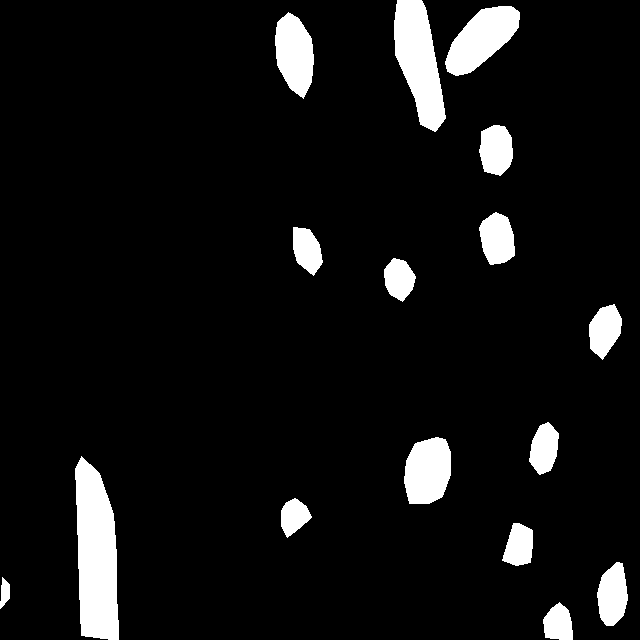

testing-085_jpg.rf.fff437c4be93a5a4fcfe9fd58684634f.jpg


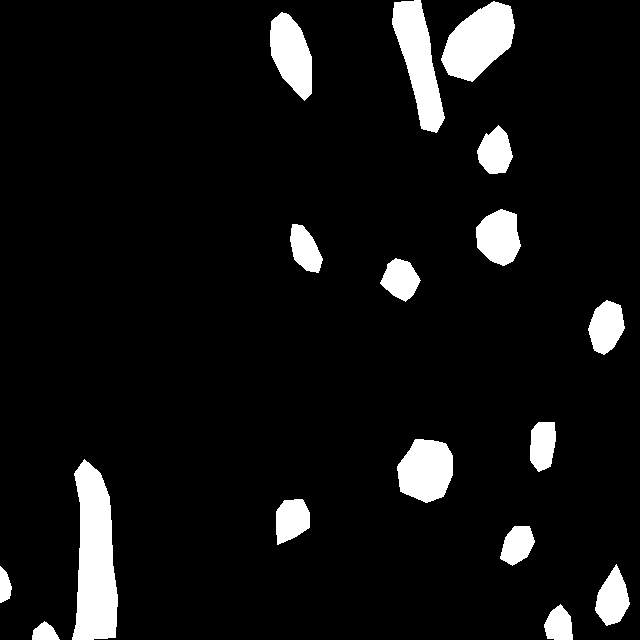

testing-118_jpg.rf.e3aaedda177287a8e4d297342ffc1c94.jpg


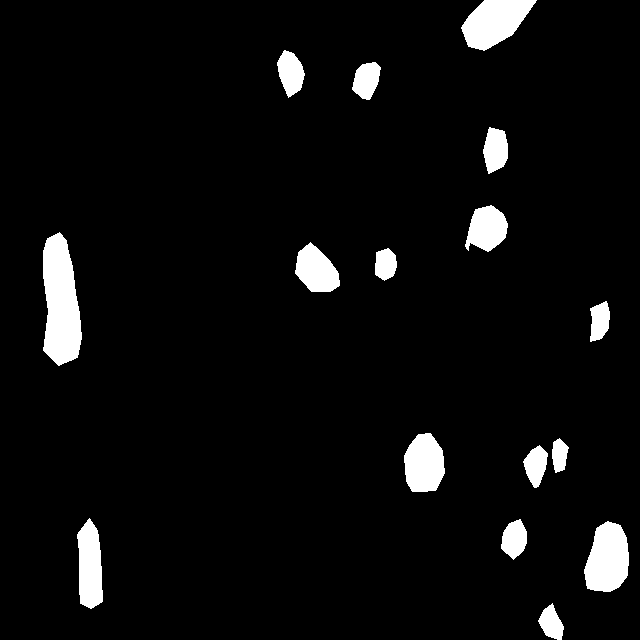

testing-032_jpg.rf.ff39c39124cfffd311e7bb12a40c71e6.jpg


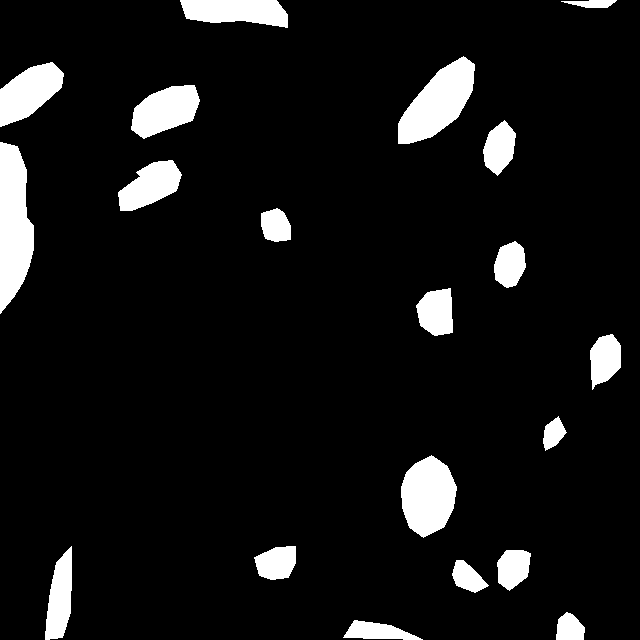

testing-074_jpg.rf.dd5b56b15e4f31be7e450703fc58c750.jpg


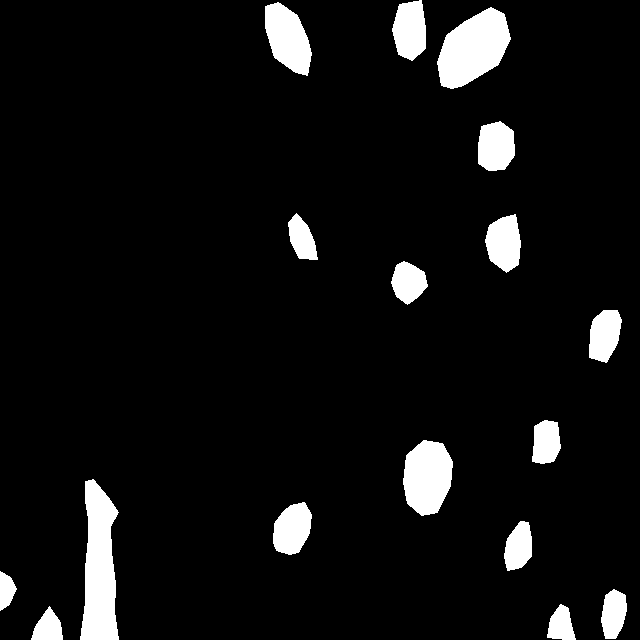

testing-075_jpg.rf.ff91ef1a9bf775c449b4c940def446d8.jpg


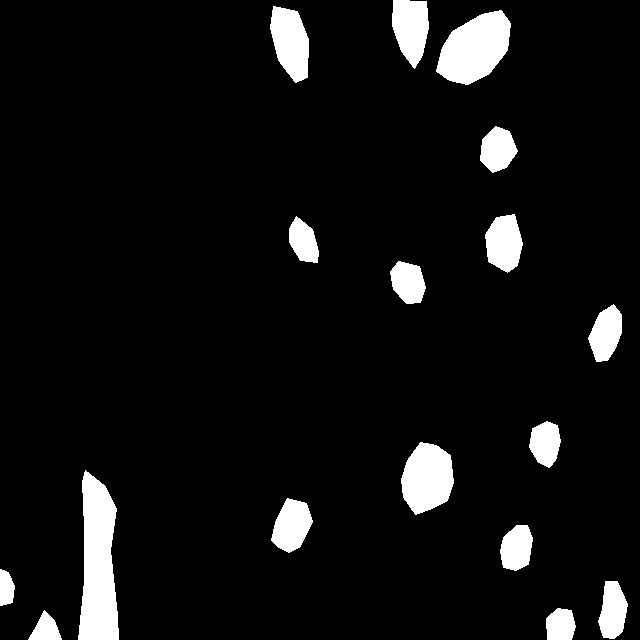

testing-160_jpg.rf.e1cca5382a93fb52ac769aa9b39db6d7.jpg


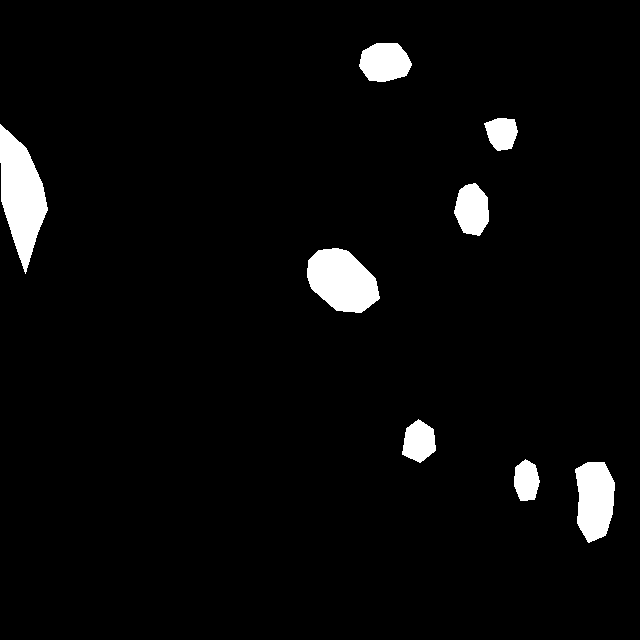

testing-141_jpg.rf.f4fd0a36eb027dba1ef78ae16281fbc5.jpg


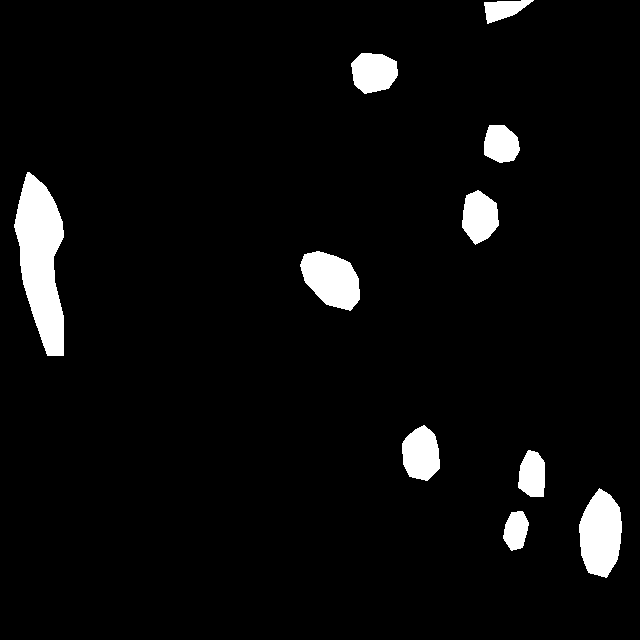

testing-045_jpg.rf.cdca01ffa0410cc253561b46ef65d173.jpg


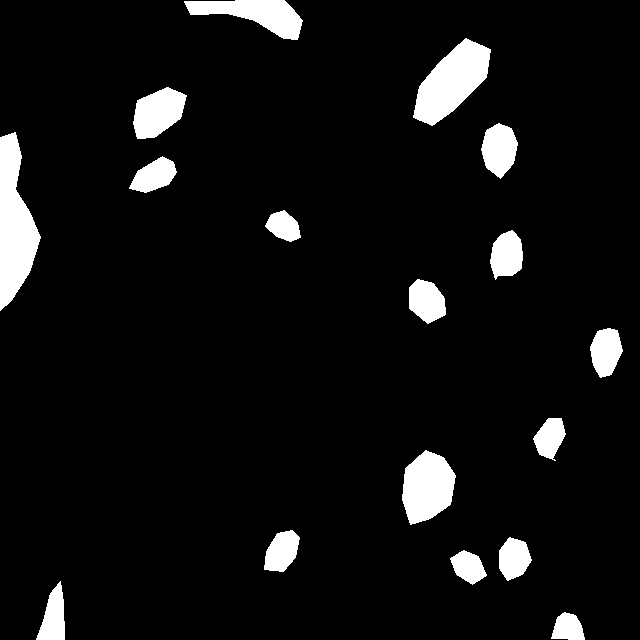

testing-020_jpg.rf.d2199d65743f85000f17031bed0f68fc.jpg


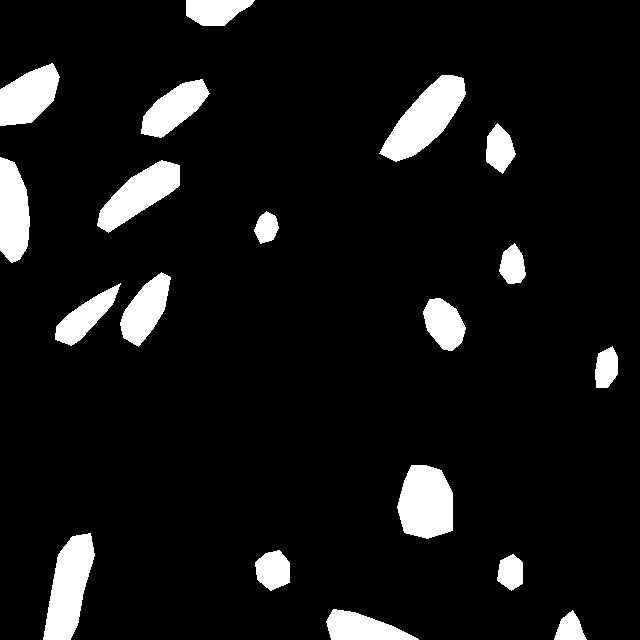

testing-023_jpg.rf.fd64c556d0a54eefce8a116acef0e031.jpg


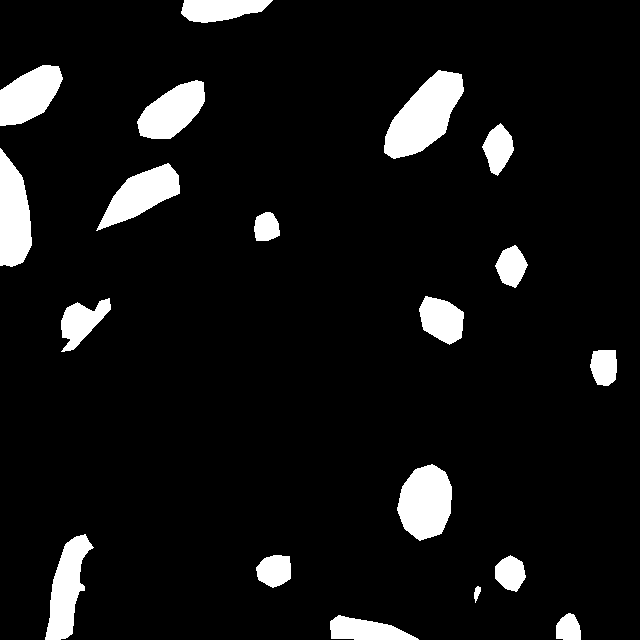

testing-145_jpg.rf.eacba5c596b1ba61f703c7326b3d5857.jpg


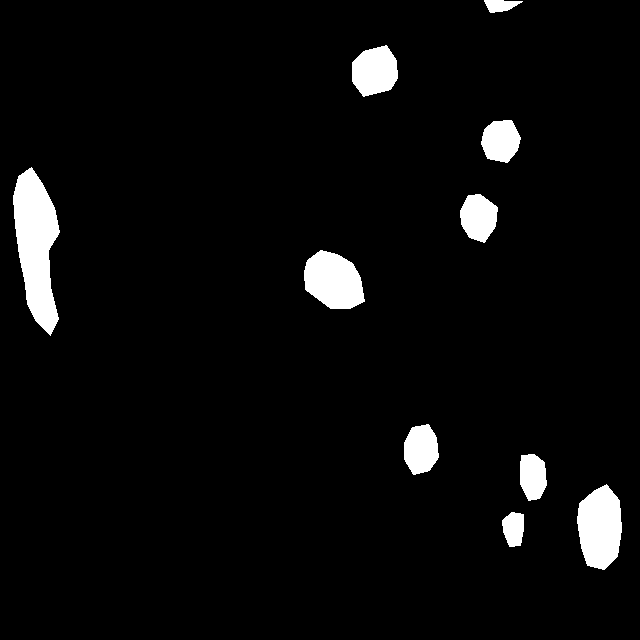

testing-056_jpg.rf.e97399df4c20881d1ba798e35bb46f56.jpg


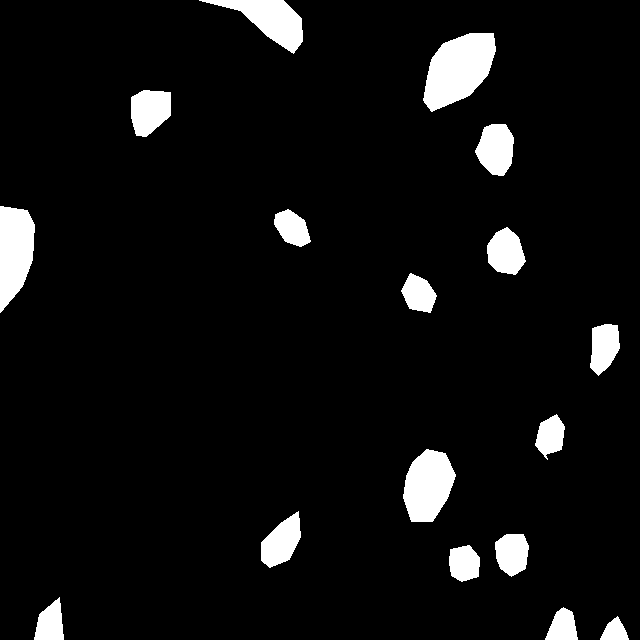

In [ ]:
new_gt_mask_list = []
for file_name in new_file_dict:
    # ilgili sözlük listesini al
    dict_list = new_file_dict[file_name]
    mask_shape = (640, 640)  # Maske boyutunu belirtin
    ground_truth_mask = np.zeros(mask_shape, dtype=np.uint8)
    
    # her sözlükteki segmentasyon verilerini al ve plot et
    for d in dict_list:
        segmentation = d['segmentation'][0]
        x = segmentation[0::2]
        y = segmentation[1::2]
        points = list(zip(x, y))
        polygon_points = np.array(points, np.int32)
        polygon_points = polygon_points.reshape((-1, 1, 2))
        cv2.fillPoly(ground_truth_mask, [polygon_points], 255) 
    new_gt_mask_list.append(ground_truth_mask)  
    print(file_name)
    cv2_imshow( ground_truth_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

/content/gh-1/test/testing-014_jpg.rf.08c6197b2eafce359d8cb38bdbb2a16a.jpg


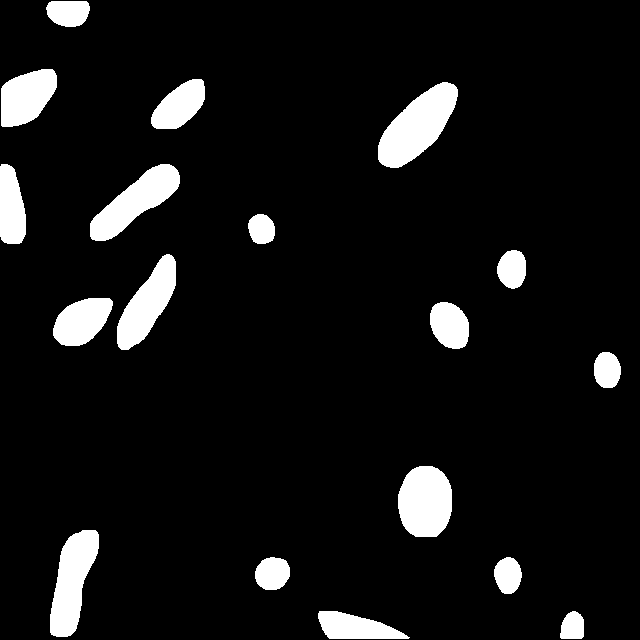

/content/gh-1/test/testing-076_jpg.rf.0fa1a1e00d572e0f7b6ed8cf3d2d7c07.jpg


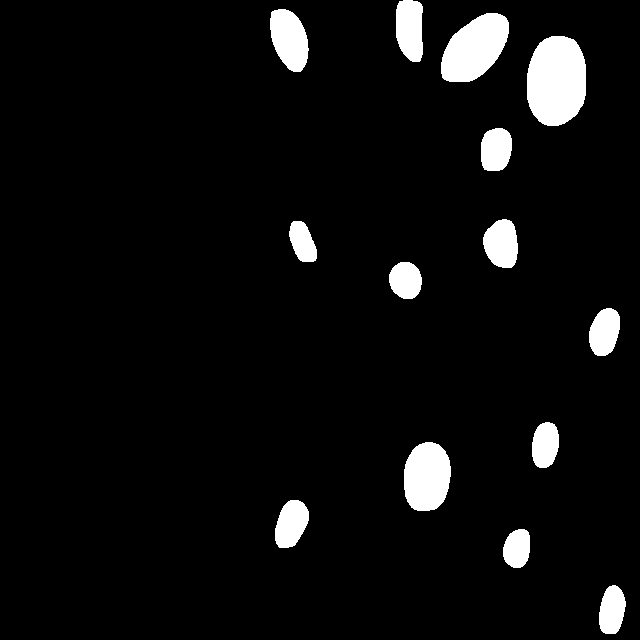

/content/gh-1/test/testing-066_jpg.rf.12173dd89ba244b137b9d7acfea87d79.jpg


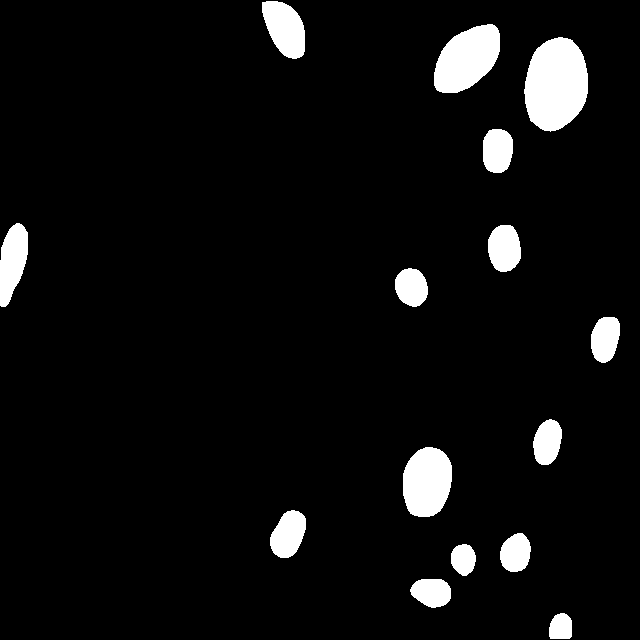

/content/gh-1/test/testing-011_jpg.rf.09f33e11df379955e8f33ee29e4f5eb1.jpg


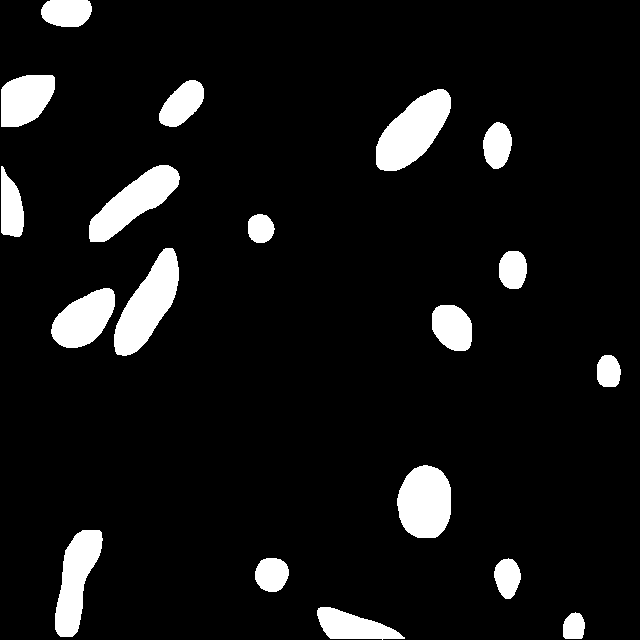

/content/gh-1/test/testing-010_jpg.rf.09a2efe9e64a6318b69704b06ed022f2.jpg


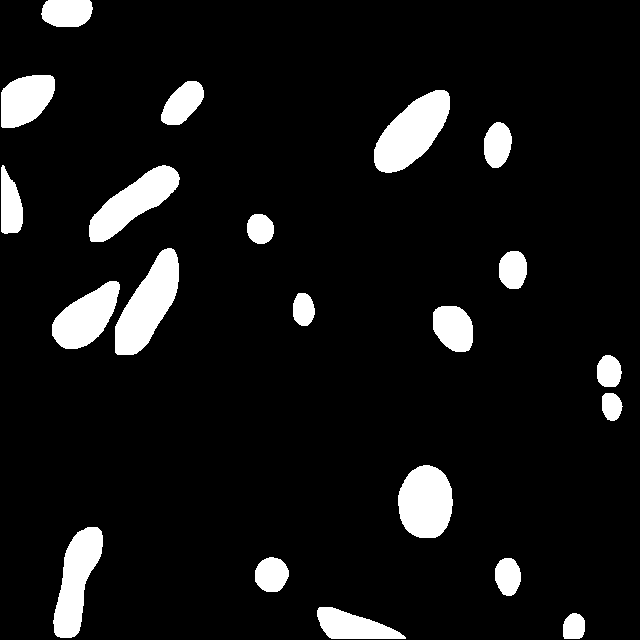

/content/gh-1/test/testing-128_jpg.rf.16ed26ff435cee10b283652c90b110b1.jpg


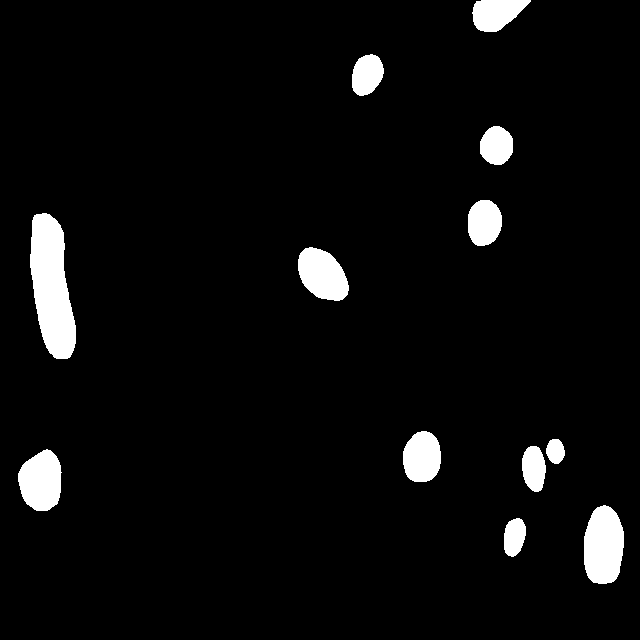

/content/gh-1/test/testing-159_jpg.rf.02f3ba74f4c8956b05aade1a2e5ef737.jpg


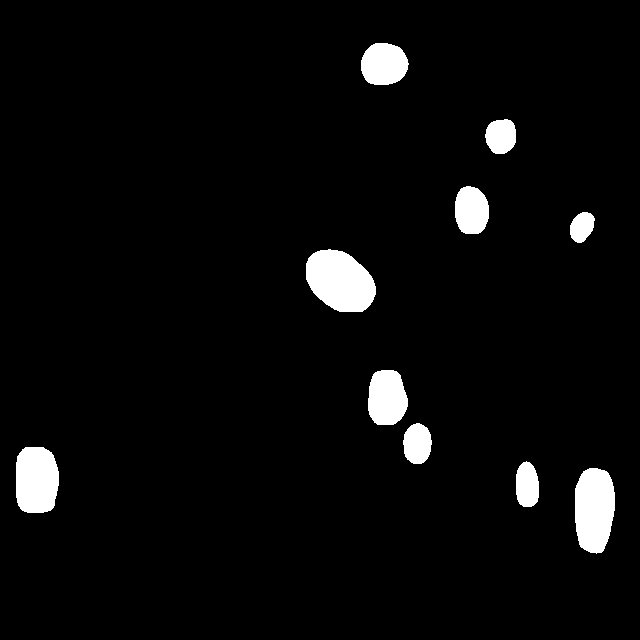

/content/gh-1/test/testing-150_jpg.rf.175324bbaf5e119ce06547ea883e93f5.jpg


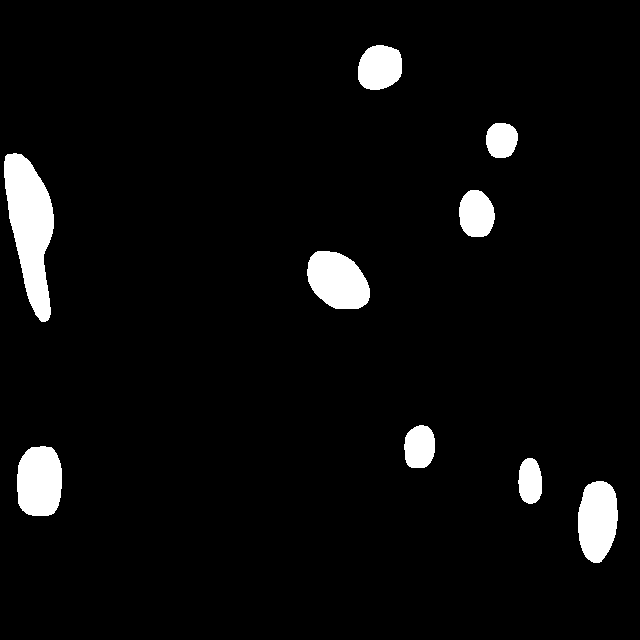

/content/gh-1/test/testing-068_jpg.rf.1620c50e745456e61f59fdaad6b87a88.jpg


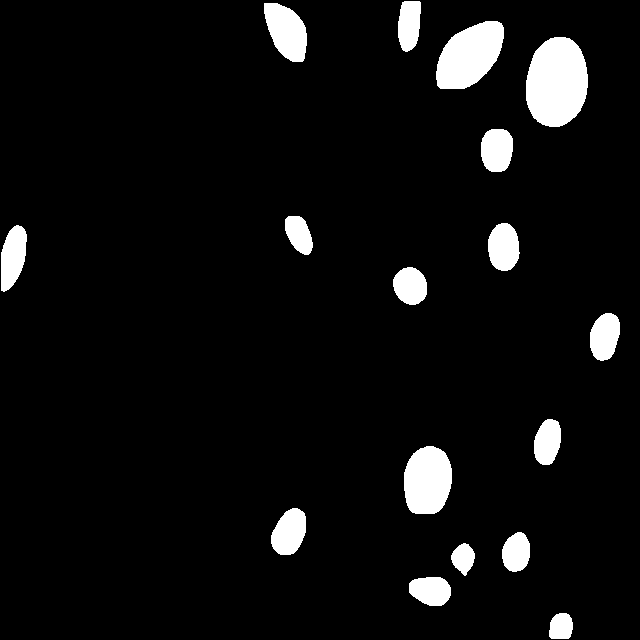

/content/gh-1/test/testing-038_jpg.rf.07cebbbe014b3d8be80f750b117440ff.jpg


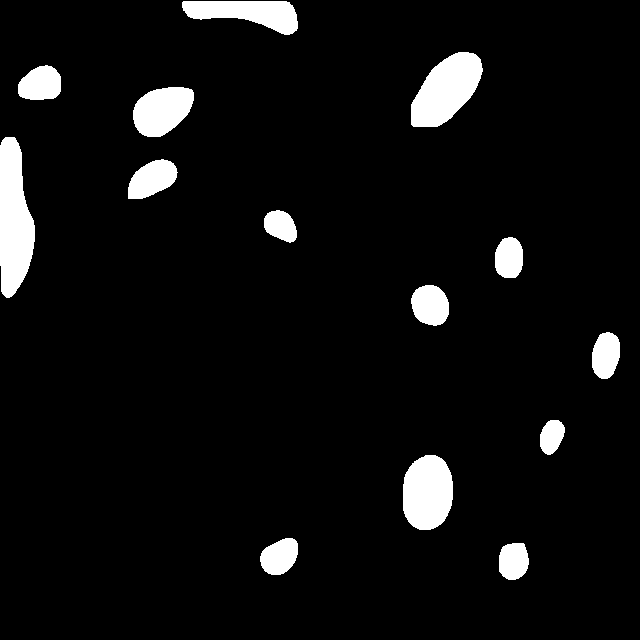

/content/gh-1/test/testing-120_jpg.rf.1d2570d6bee8eca2e8273c785119243e.jpg


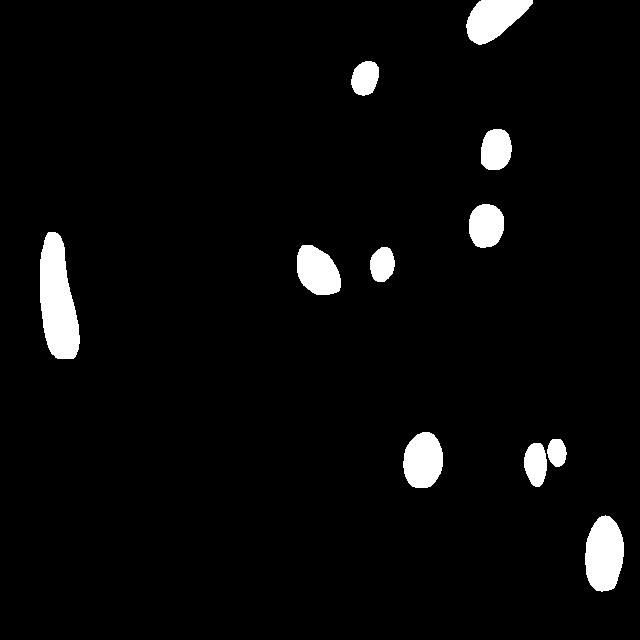

/content/gh-1/test/testing-062_jpg.rf.1ad1b49802c8695b1e2537aabb293b36.jpg


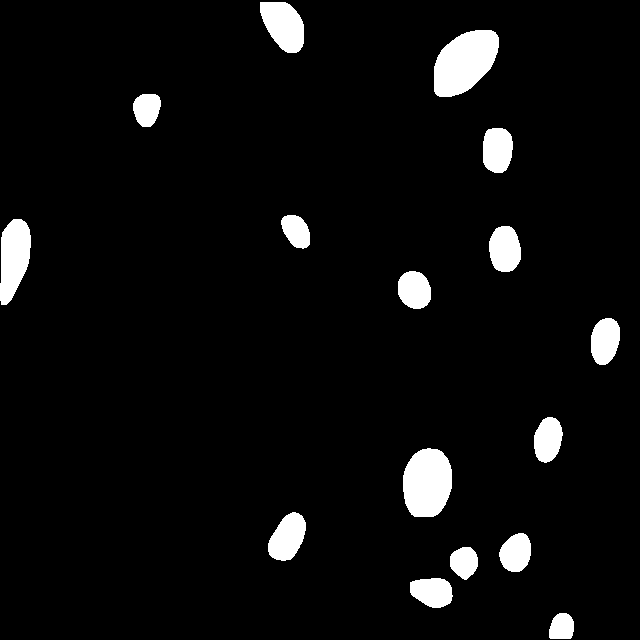

/content/gh-1/test/testing-064_jpg.rf.0a9a22e39639131dea49572c253be153.jpg


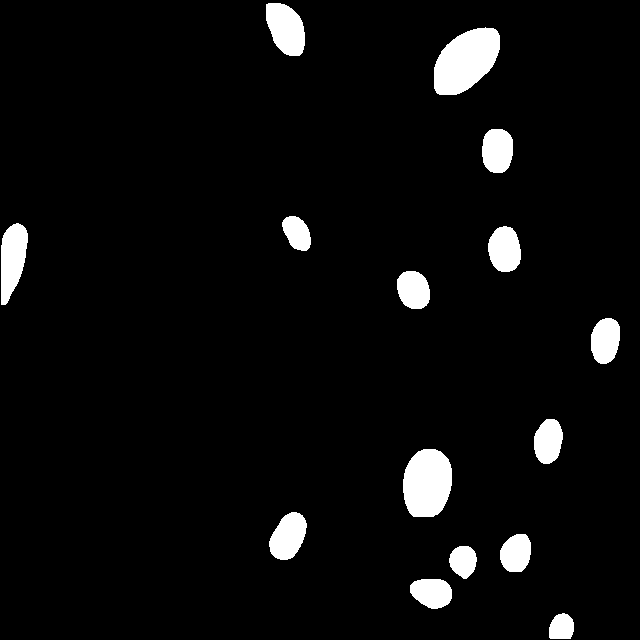

/content/gh-1/test/testing-007_jpg.rf.176053aac700dab730bdba482dc1fe15.jpg


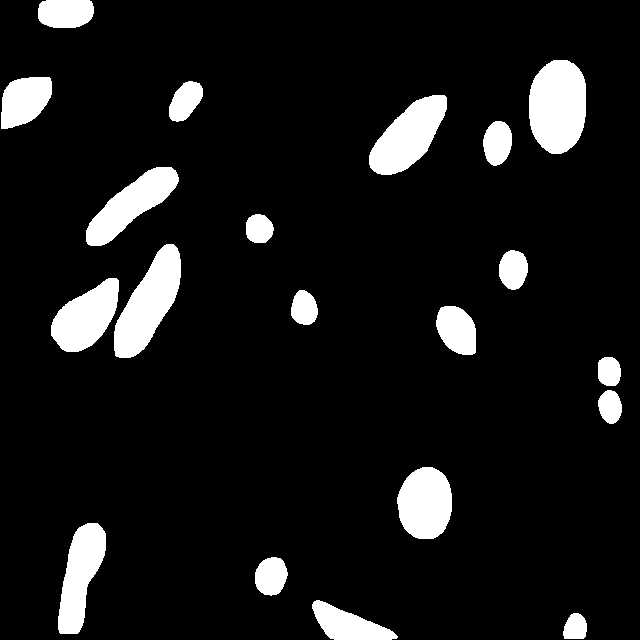

/content/gh-1/test/testing-033_jpg.rf.1e5c128672700f3078834cf61e9d5b3a.jpg


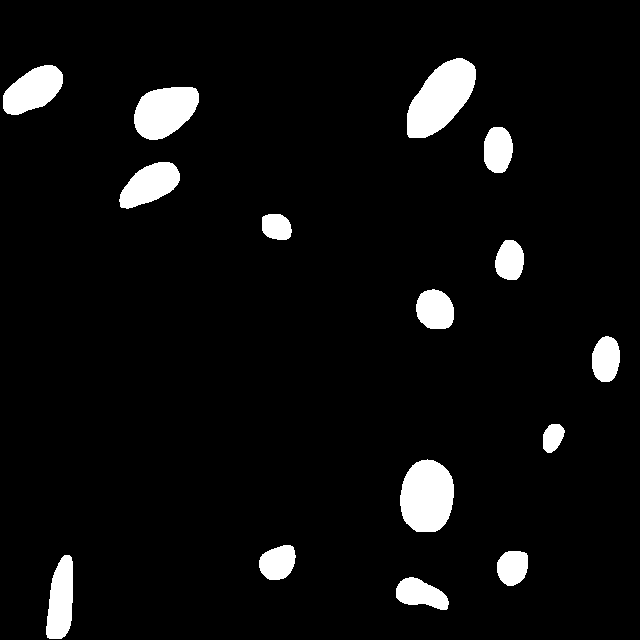

/content/gh-1/test/testing-113_jpg.rf.16841e53a19812a5daf90e9fb67b1ff1.jpg


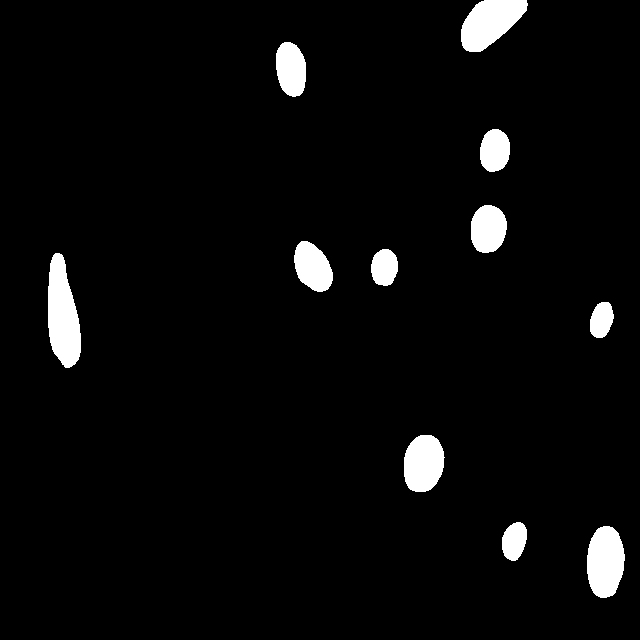

/content/gh-1/test/testing-043_jpg.rf.1f32f99b6e9801e94cf84447e15ad2e2.jpg


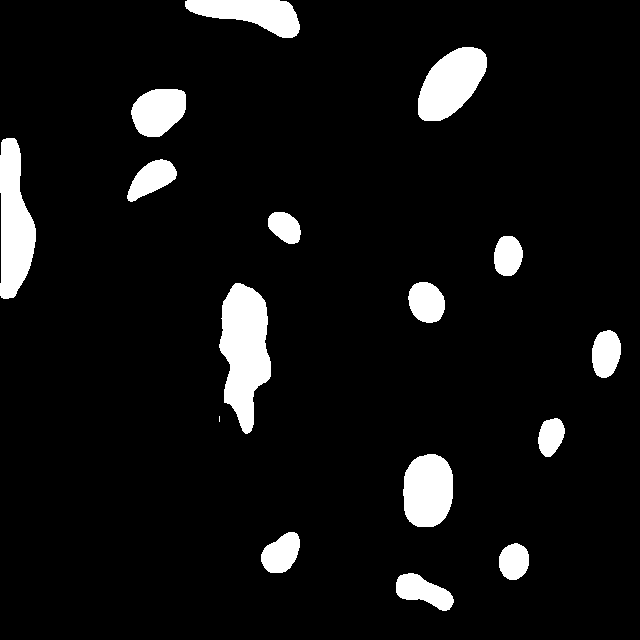

/content/gh-1/test/testing-148_jpg.rf.06211958c7f48b3c3db864bcd9365d5c.jpg


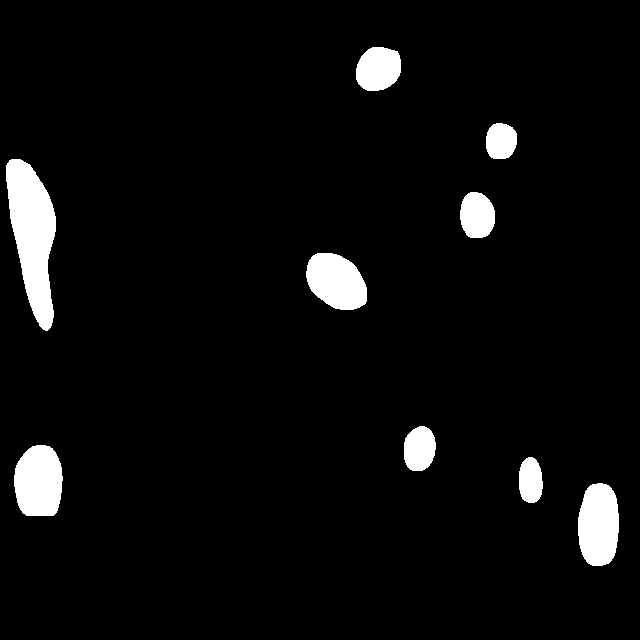

/content/gh-1/test/testing-024_jpg.rf.1bc5152df60afb8baf35d61c67ebec5b.jpg


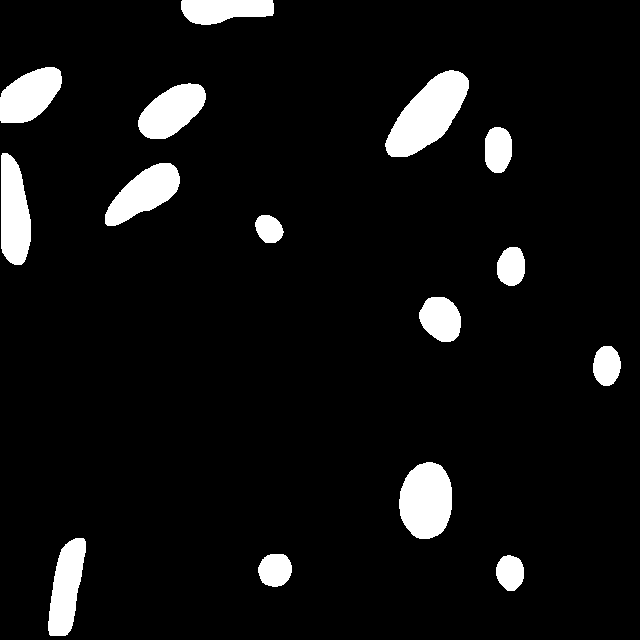

/content/gh-1/test/testing-117_jpg.rf.24d84e624b0b48041c9f26d66432b1b7.jpg


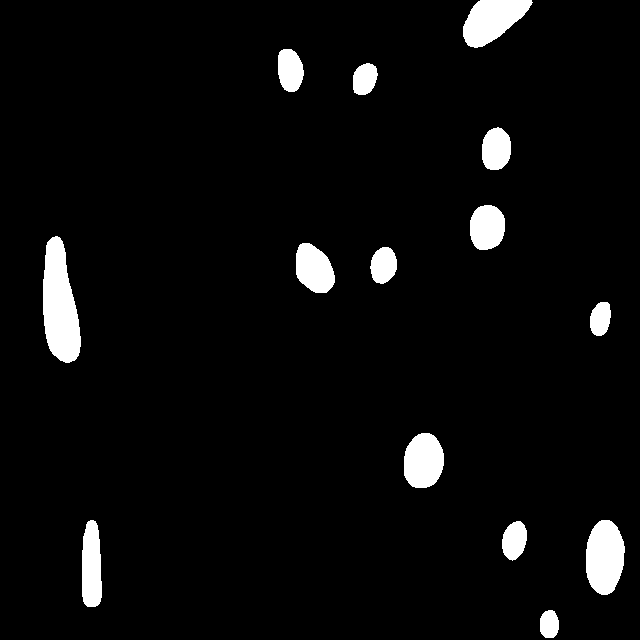

/content/gh-1/test/testing-122_jpg.rf.1fac3b1db3a2d14fff6edcd40b74c324.jpg


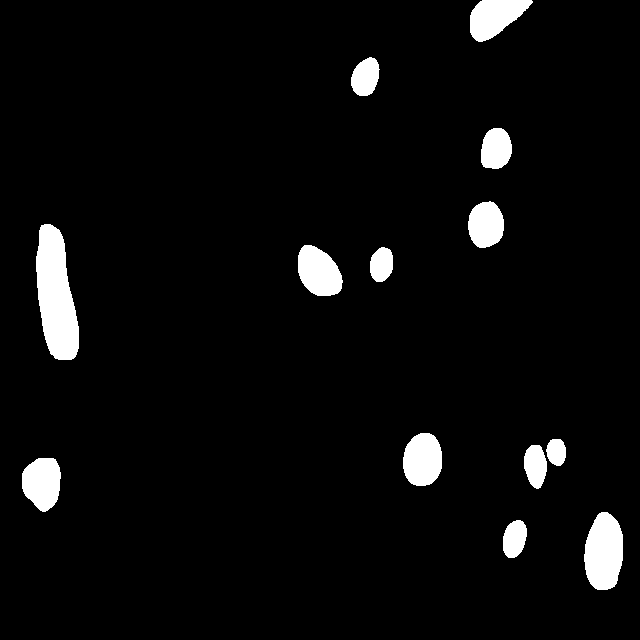

/content/gh-1/test/testing-127_jpg.rf.23561bd40f5911a5a07bce44cfdb926d.jpg


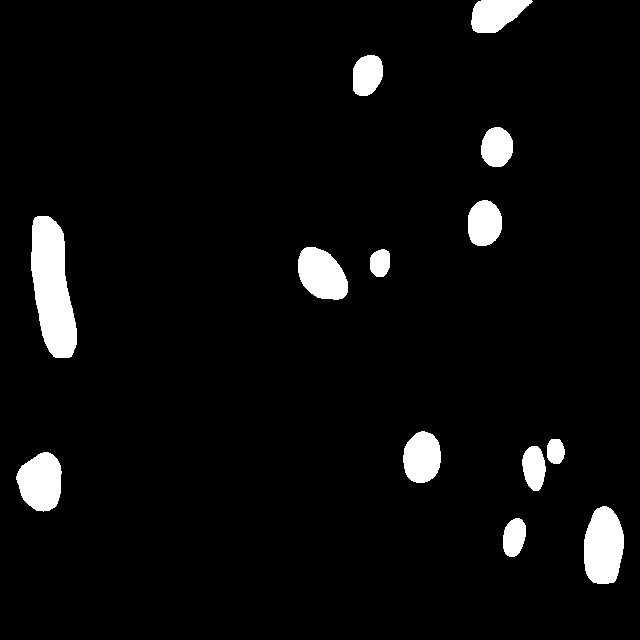

/content/gh-1/test/testing-082_jpg.rf.1d9e99e1f68a34d49425bb144aeec9d0.jpg


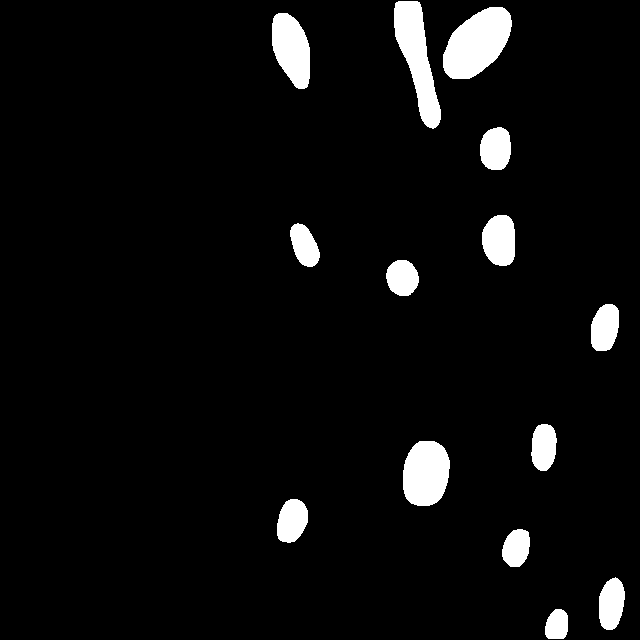

/content/gh-1/test/testing-063_jpg.rf.1c5f751cc9576f06ba091ff50d90dd5c.jpg


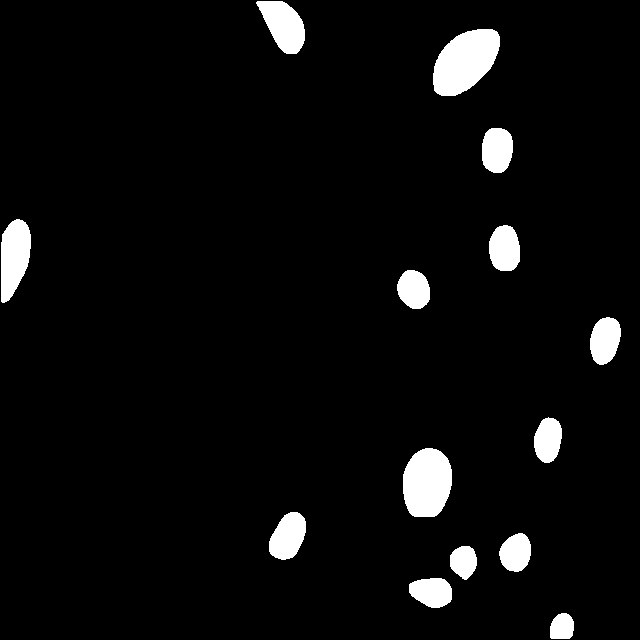

/content/gh-1/test/testing-041_jpg.rf.228479efc3f1f0402fb7bb9ffa7ab9a9.jpg


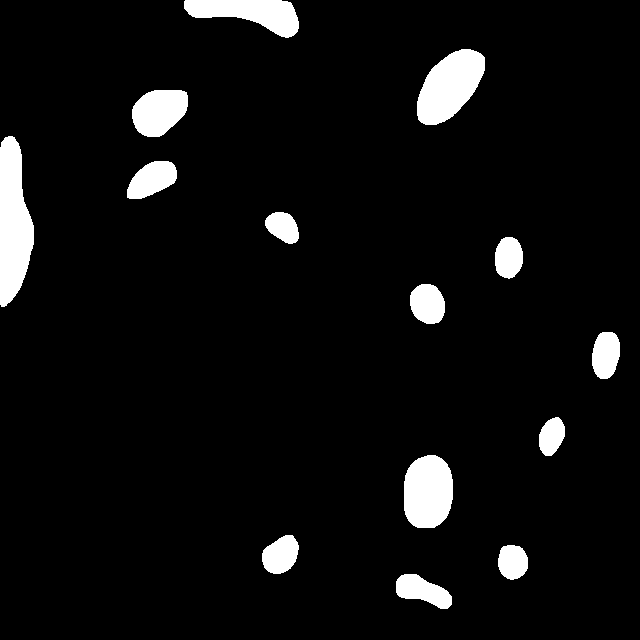

/content/gh-1/test/testing-071_jpg.rf.204ad983c72a0852abe69a54aae011be.jpg


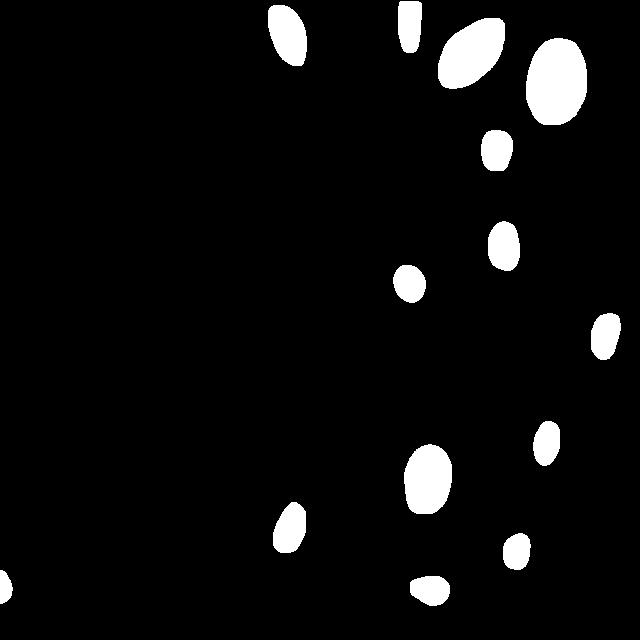

/content/gh-1/test/testing-115_jpg.rf.218c0eb02826e3a88962dbca2b32f9e4.jpg


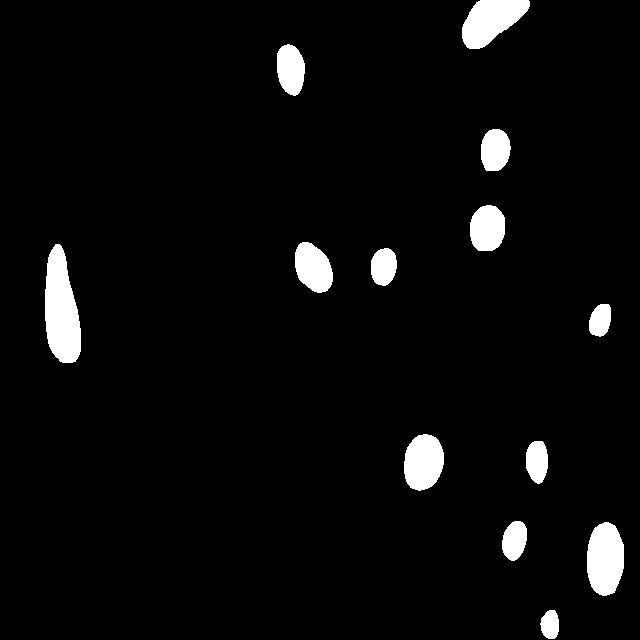

/content/gh-1/test/testing-095_jpg.rf.2ac9654abd4611875dc3891114039102.jpg


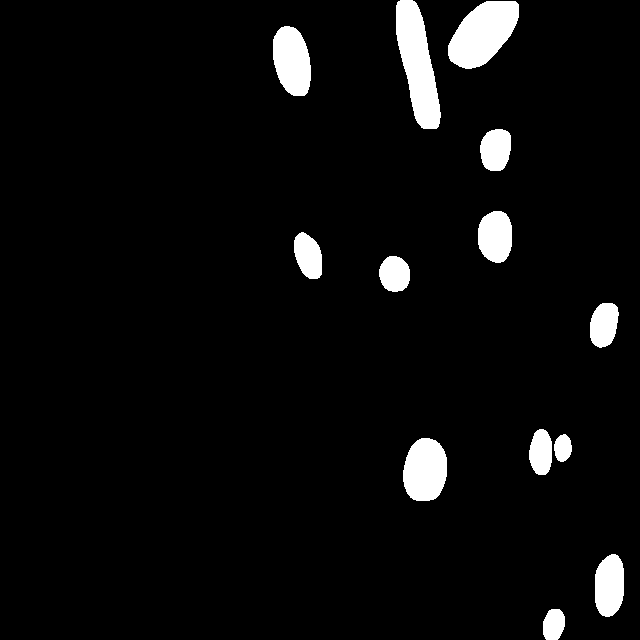

/content/gh-1/test/testing-046_jpg.rf.25afca8abe9306f3e6a7e702aa3467b4.jpg


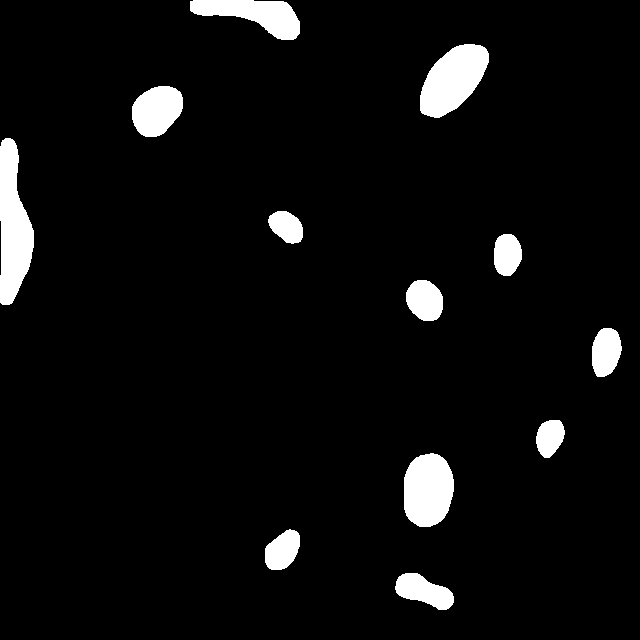

/content/gh-1/test/testing-006_jpg.rf.31a045e8d65c5a200086751d580d6f9c.jpg


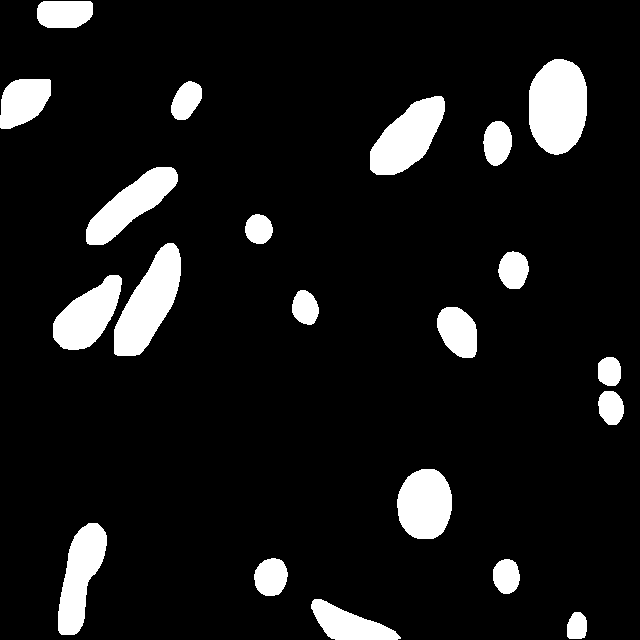

/content/gh-1/test/testing-140_jpg.rf.38061d80fb7c4129efedf25102d1b5e3.jpg


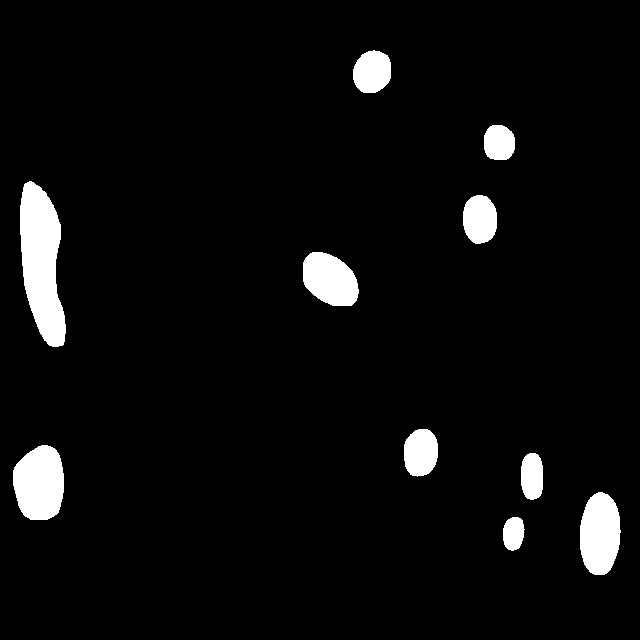

/content/gh-1/test/testing-102_jpg.rf.27497b8589d25da34db4cc44f0685ad8.jpg


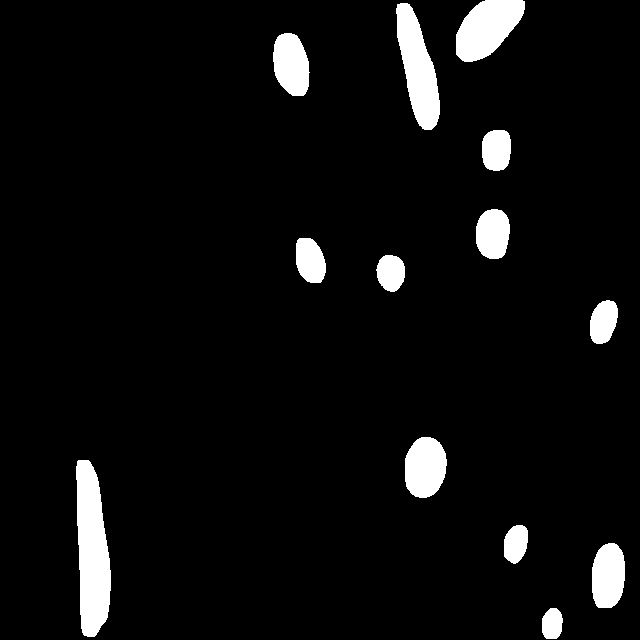

/content/gh-1/test/testing-005_jpg.rf.307e4554f175211881ae56fbe5c0d255.jpg


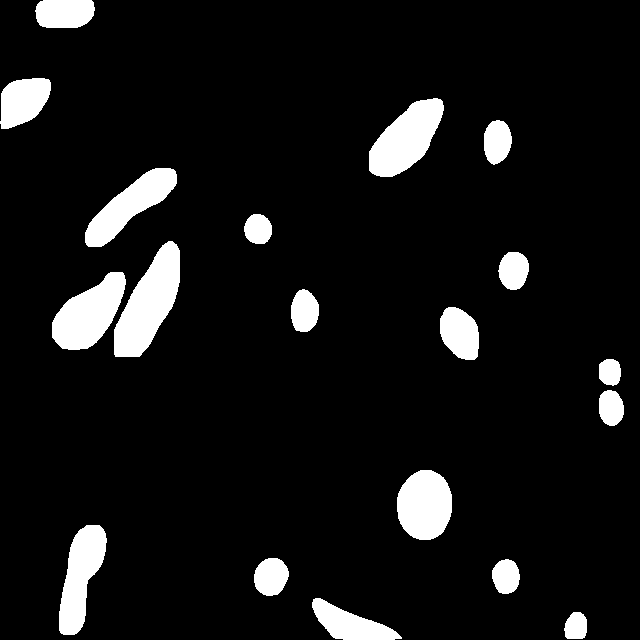

/content/gh-1/test/testing-078_jpg.rf.3f52efe7f2d947e5adb21ad3be135fa0.jpg


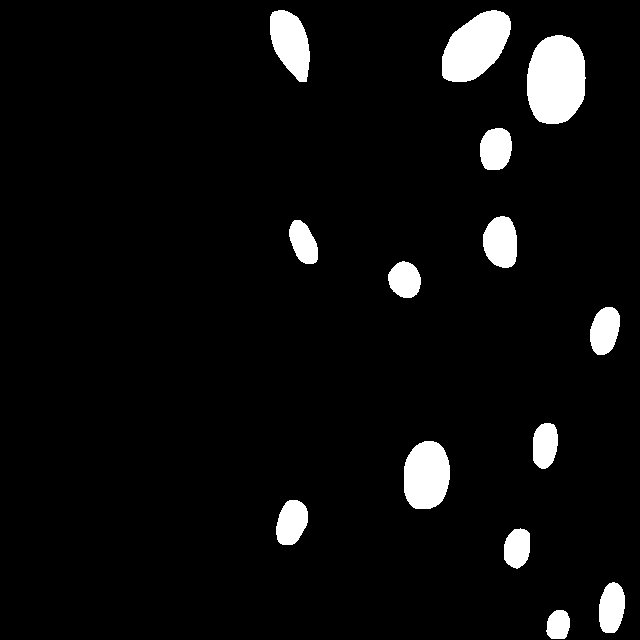

/content/gh-1/test/testing-069_jpg.rf.44273b303235e0085d0fd0d2b5dcc444.jpg


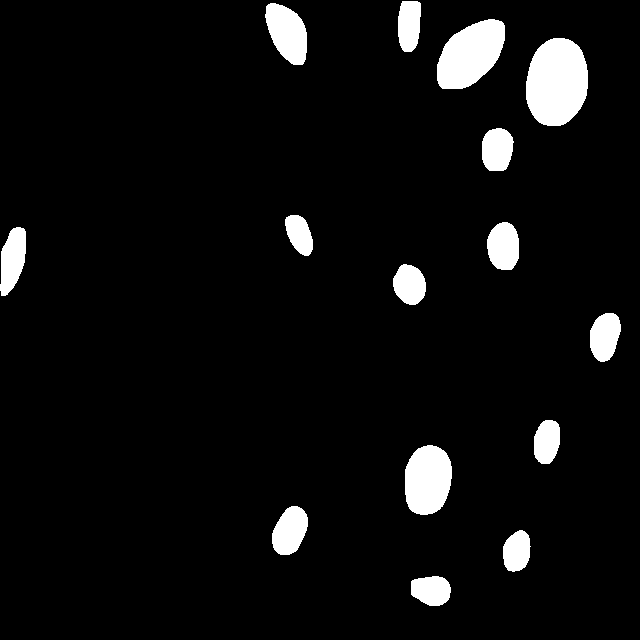

/content/gh-1/test/testing-070_jpg.rf.35bcec34ae1fe26920f95cb05ded9ac5.jpg


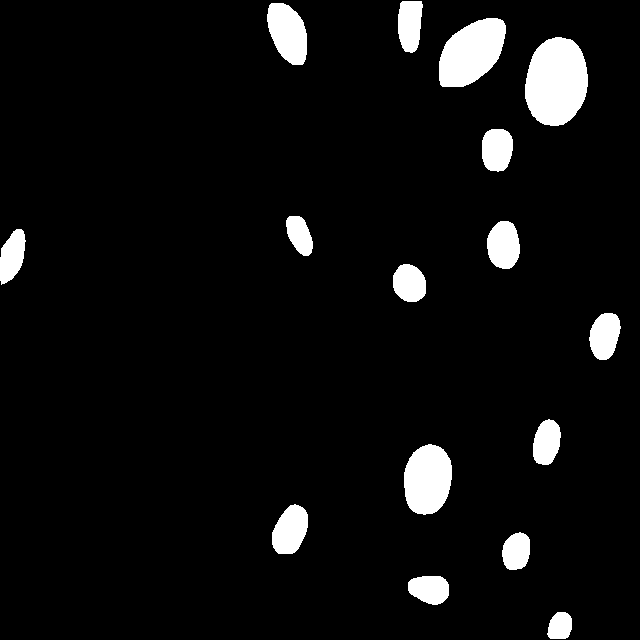

/content/gh-1/test/testing-026_jpg.rf.2e2c37982a8af4b89078c29f6dca7122.jpg


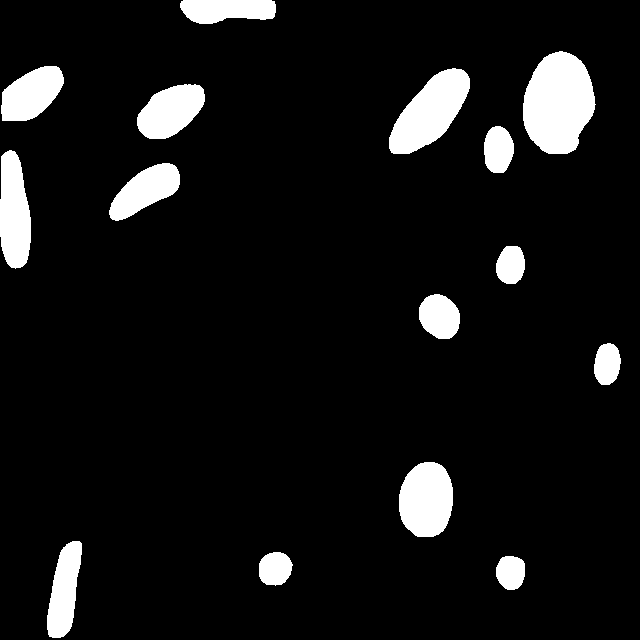

/content/gh-1/test/testing-099_jpg.rf.51882034ad6cd78c6e24d8651ad50c09.jpg


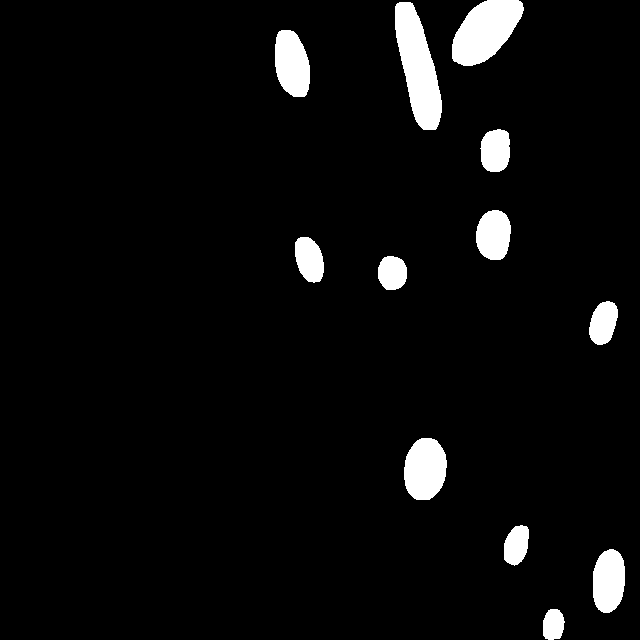

/content/gh-1/test/testing-008_jpg.rf.4907483bd081e0964849248345c97178.jpg


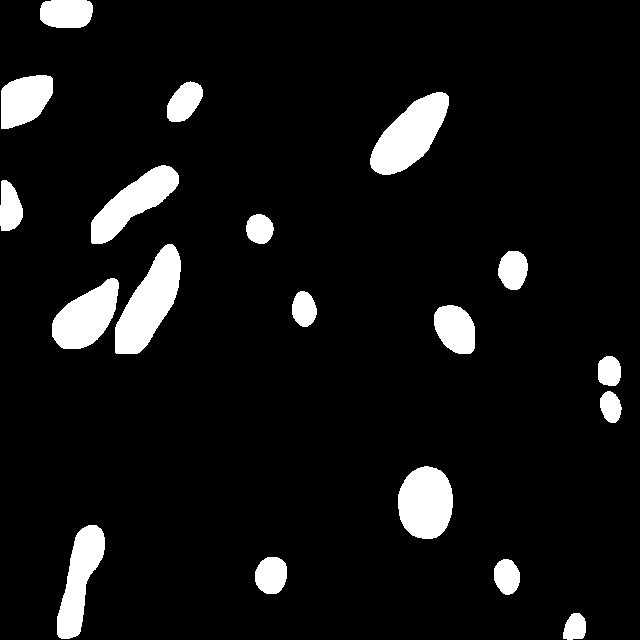

/content/gh-1/test/testing-040_jpg.rf.487e7458dfb8f647c994301503036824.jpg


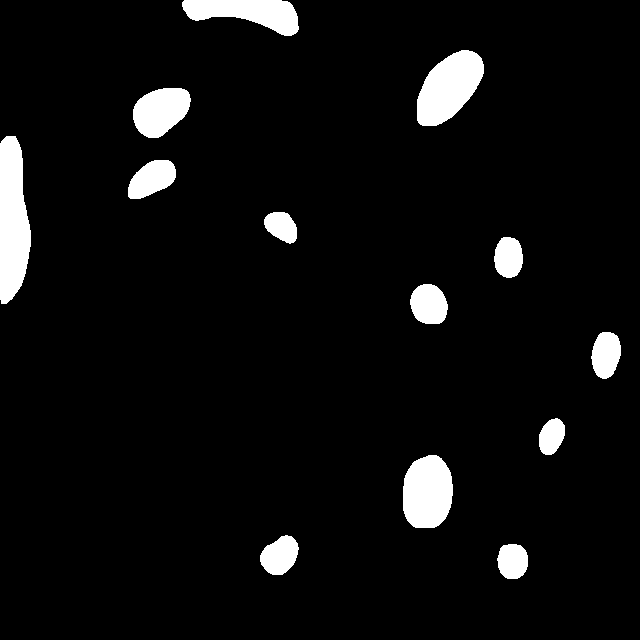

/content/gh-1/test/testing-136_jpg.rf.50d0b0c55d61f5025e5148884bfeb296.jpg


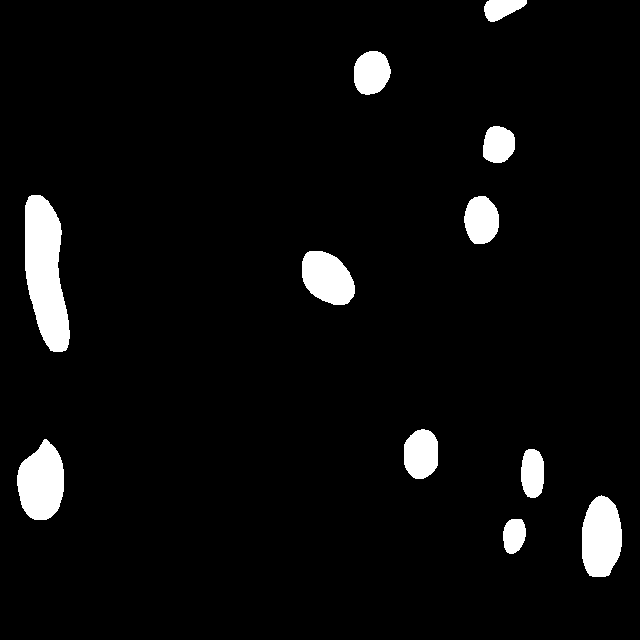

/content/gh-1/test/testing-009_jpg.rf.44c6498c1277144392fcb3c018428934.jpg


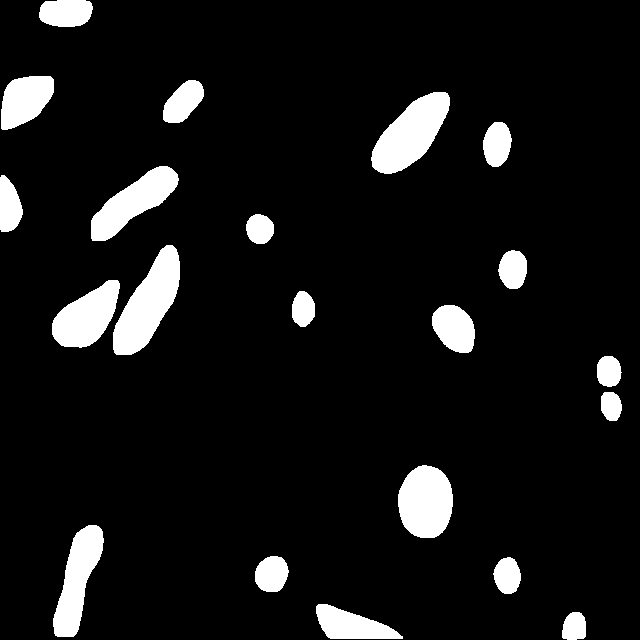

/content/gh-1/test/testing-142_jpg.rf.47c9d4a6b096033585b687697b9ed8aa.jpg


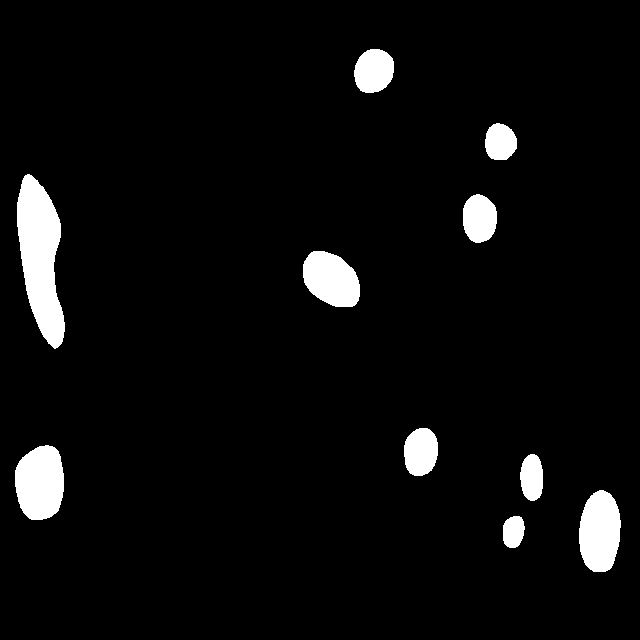

/content/gh-1/test/testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg


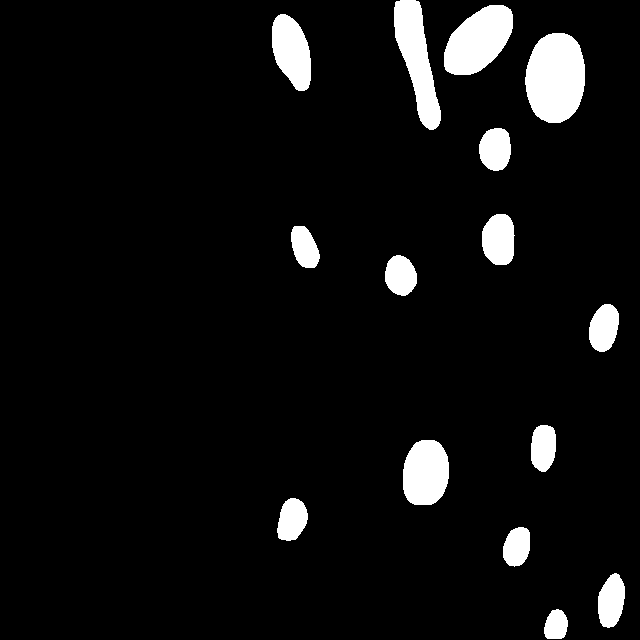

/content/gh-1/test/testing-002_jpg.rf.501d1cf77652a65b6b6ed907e8d93ebe.jpg


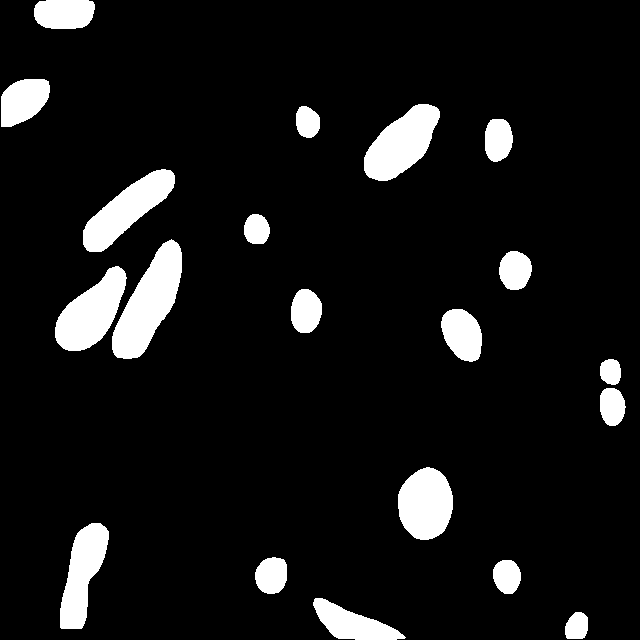

/content/gh-1/test/testing-004_jpg.rf.53b83771f4fa33df85e327af85bbcd74.jpg


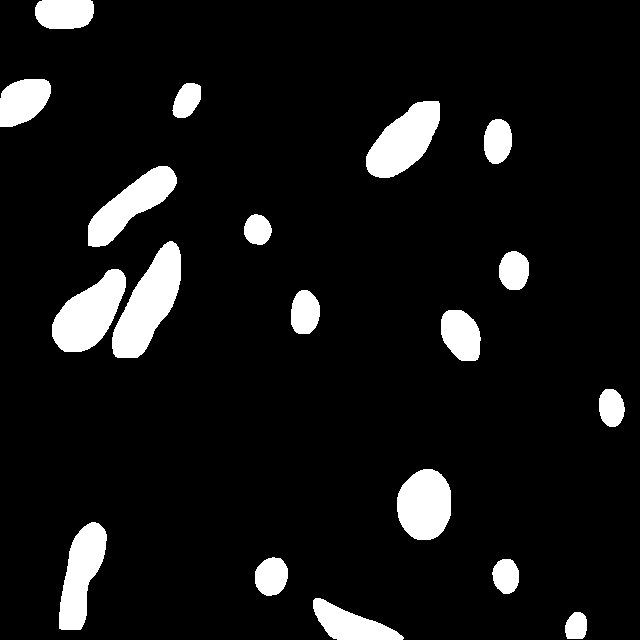

/content/gh-1/test/testing-091_jpg.rf.49751aaf120808fc516fd943e0962005.jpg


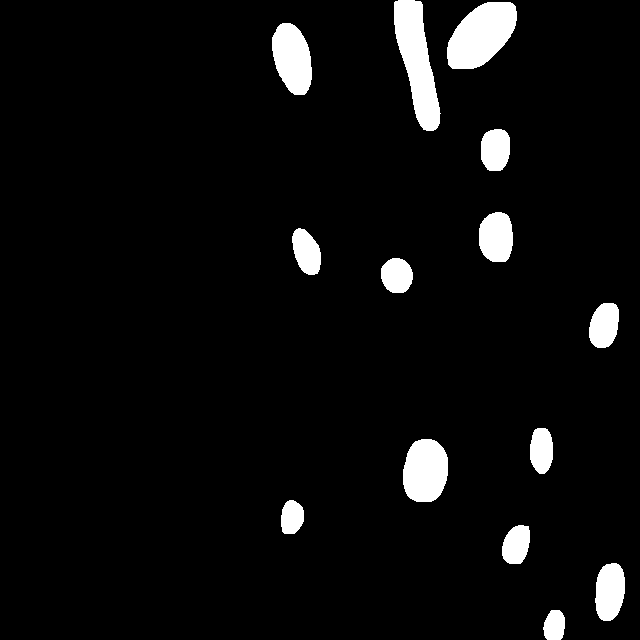

/content/gh-1/test/testing-081_jpg.rf.59576f4811721faff38c1ce9fa887feb.jpg


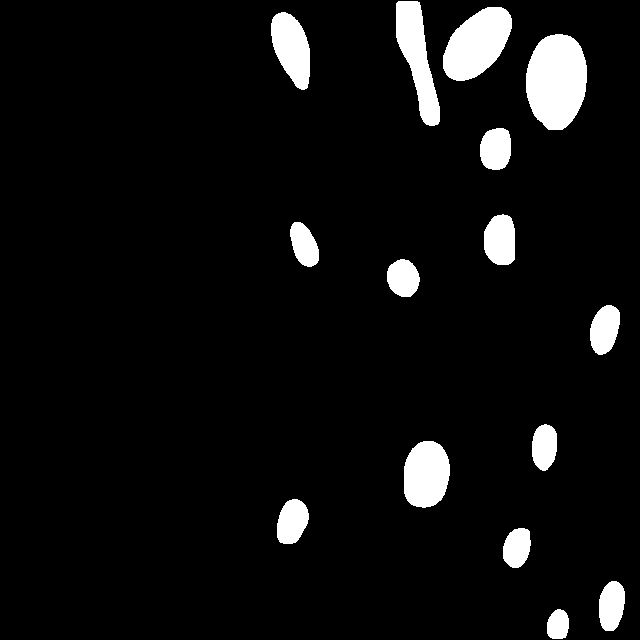

/content/gh-1/test/testing-107_jpg.rf.549633ea253046c12a70d8caffc16dc0.jpg


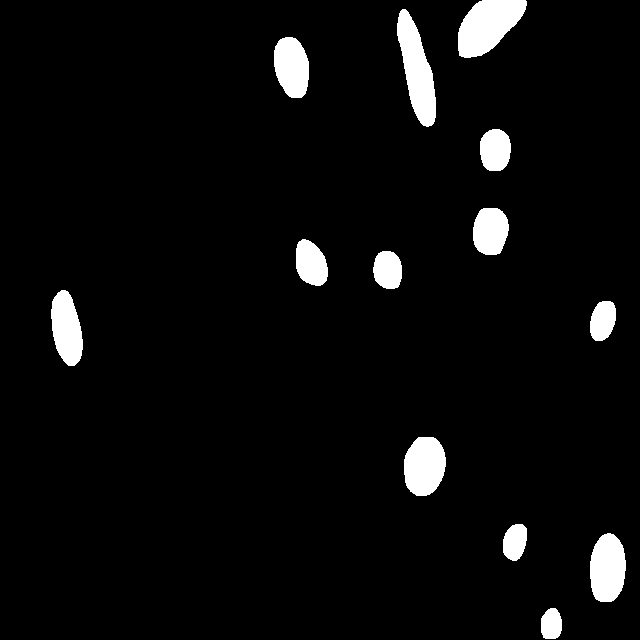

/content/gh-1/test/testing-057_jpg.rf.5af73ea3a0aa4b4be15f5e21f1c0d7db.jpg


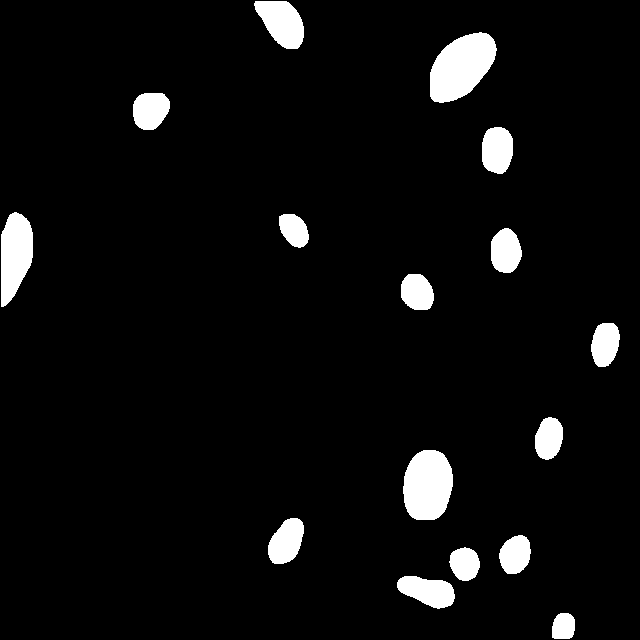

/content/gh-1/test/testing-106_jpg.rf.3d6ccd52fe92a28959775f85d64eed43.jpg


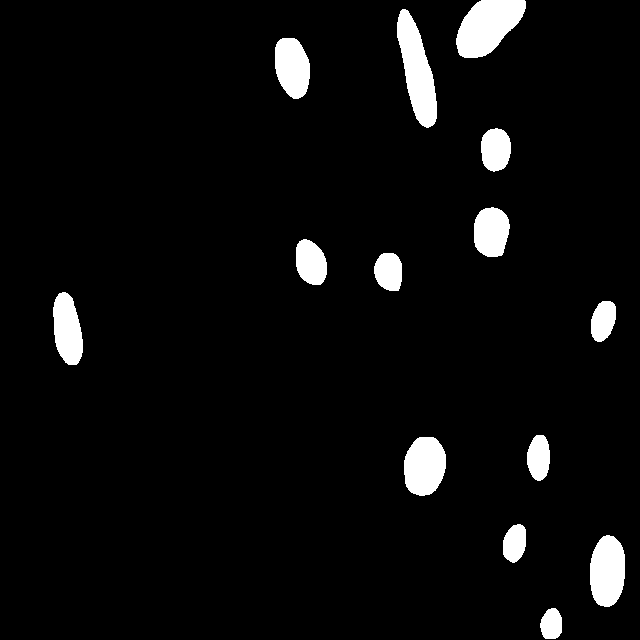

/content/gh-1/test/testing-015_jpg.rf.66075ac81a9be1e3b0f6388d3a27825f.jpg


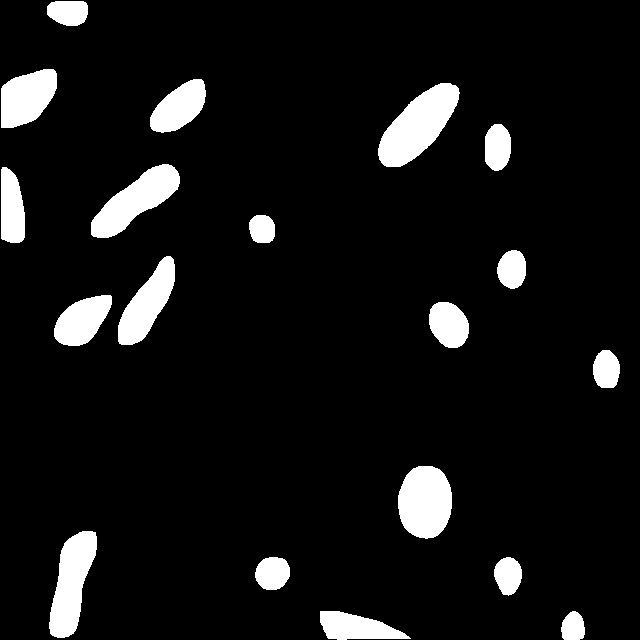

/content/gh-1/test/testing-101_jpg.rf.647de03f07d0ab2ce916994a7732a475.jpg


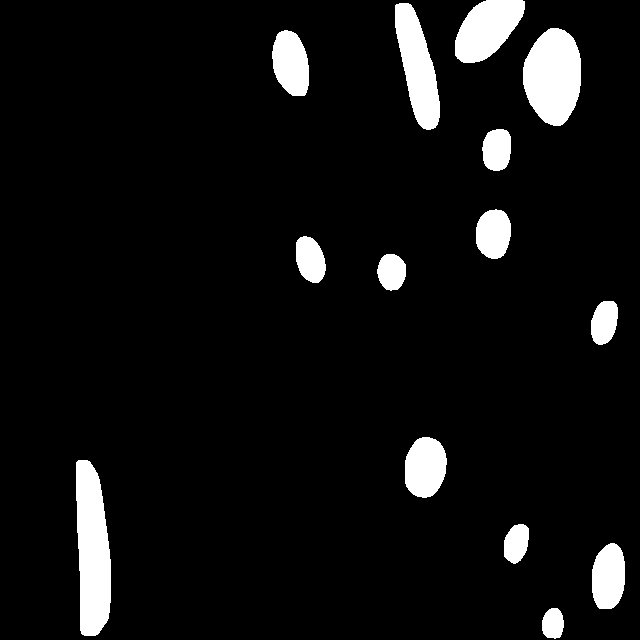

/content/gh-1/test/testing-164_jpg.rf.463f52dab00636f2747326b631223808.jpg


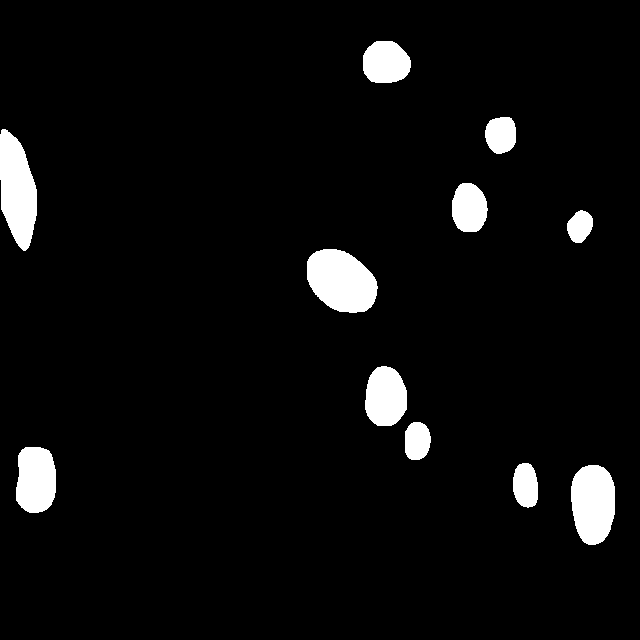

/content/gh-1/test/testing-119_jpg.rf.353dc0e54ee7a2876b1b240b27f80d98.jpg


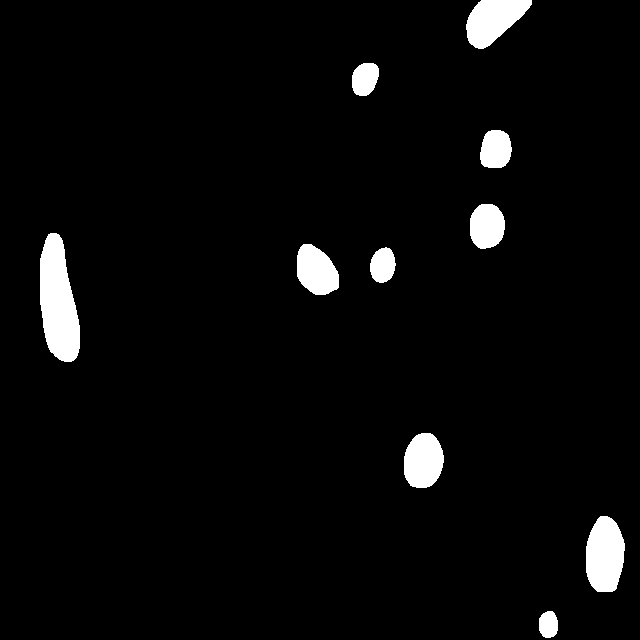

/content/gh-1/test/testing-029_jpg.rf.6650970335773cc82b5c0a029e6dcd29.jpg


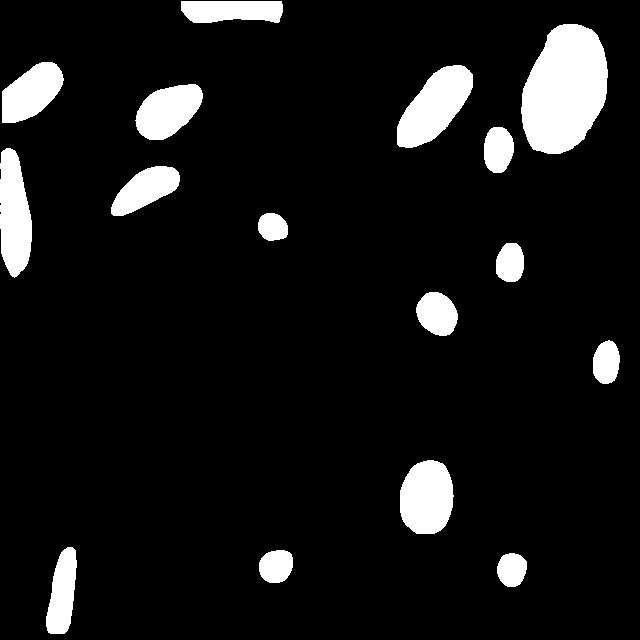

/content/gh-1/test/testing-147_jpg.rf.59f0c141a6c26a3775049d2521b85bbd.jpg


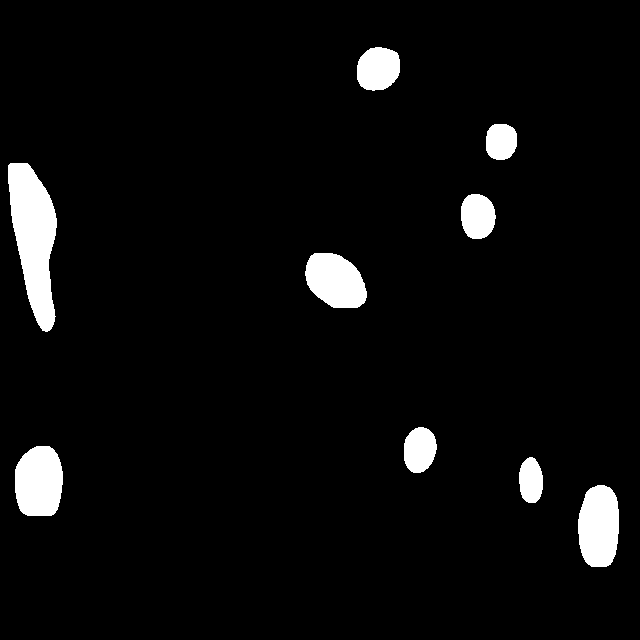

/content/gh-1/test/testing-019_jpg.rf.62eccfc1d07b32ddf2d672689ac9db1a.jpg


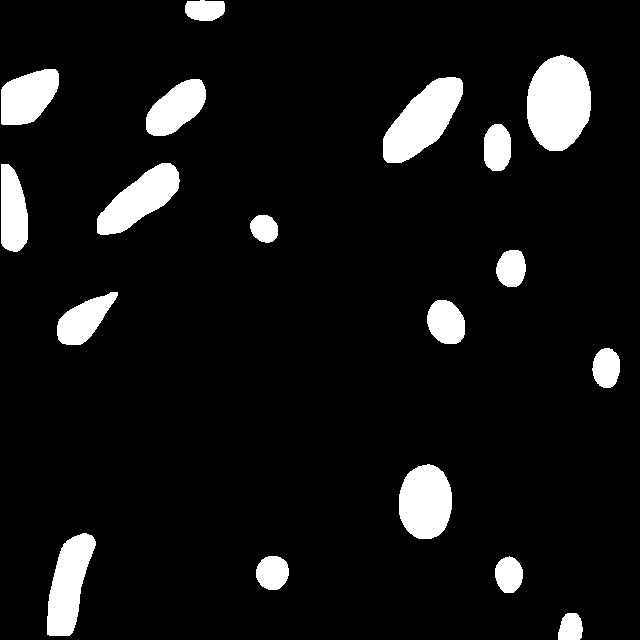

/content/gh-1/test/testing-022_jpg.rf.67d61a55755ce7aadae689e4591cd5c5.jpg


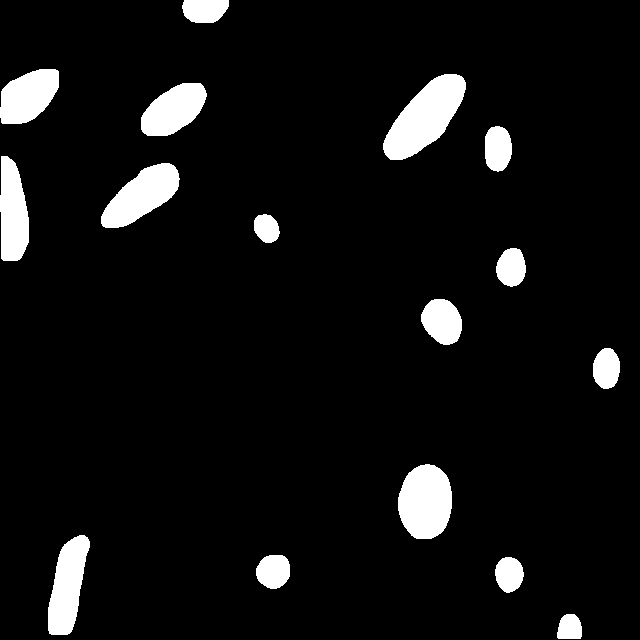

/content/gh-1/test/testing-018_jpg.rf.6b29c67a426ff96a4b05f980b3ac969e.jpg


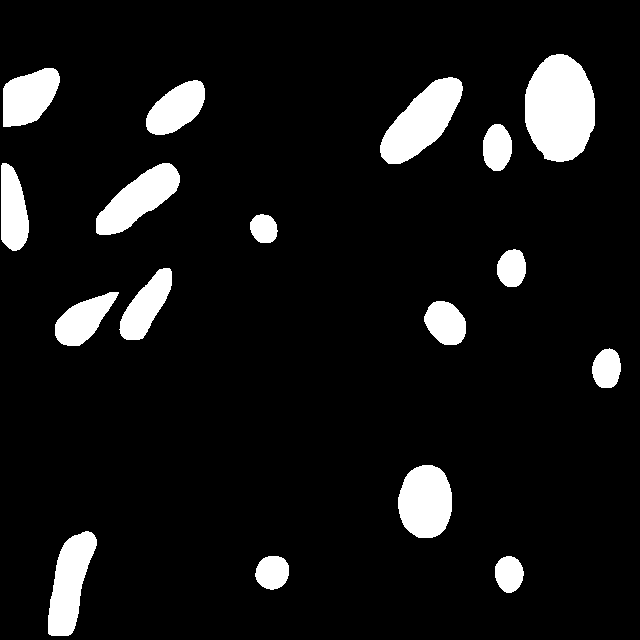

/content/gh-1/test/testing-013_jpg.rf.6d522cc0482f2154efea9c747f5a365f.jpg


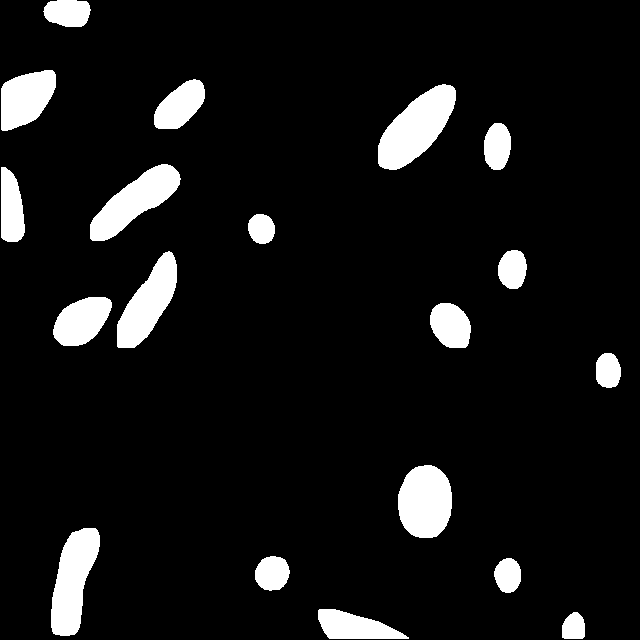

/content/gh-1/test/testing-096_jpg.rf.63da06b5c676b0869be8d0d23a6b369b.jpg


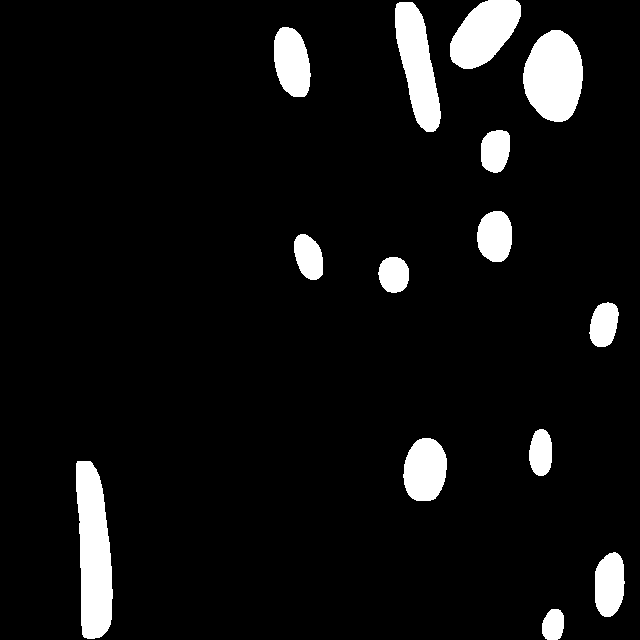

/content/gh-1/test/testing-073_jpg.rf.6d0030c998600a8402bcf9fbff84fd99.jpg


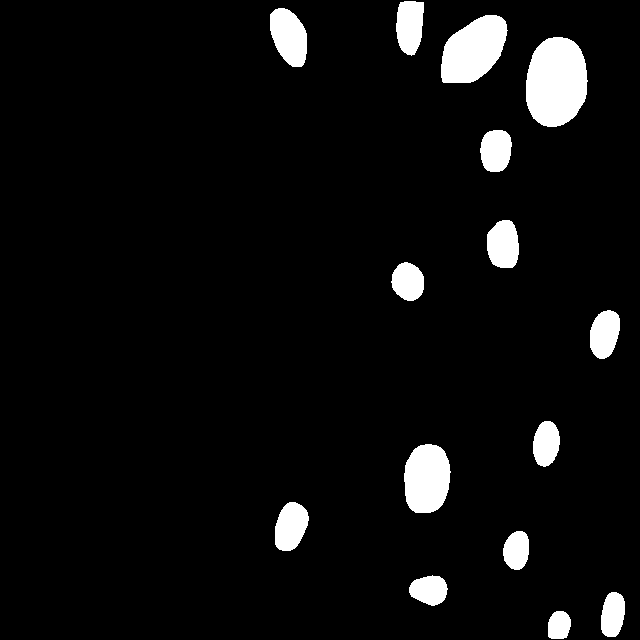

/content/gh-1/test/testing-112_jpg.rf.5a0bd04ba9aeaf34fec0309dbe702866.jpg


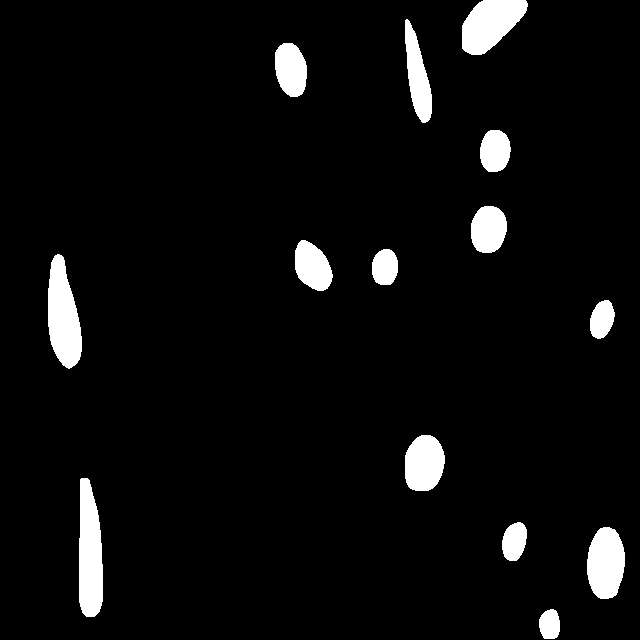

/content/gh-1/test/testing-049_jpg.rf.4bde6e50cc9b18184a2843304158531a.jpg


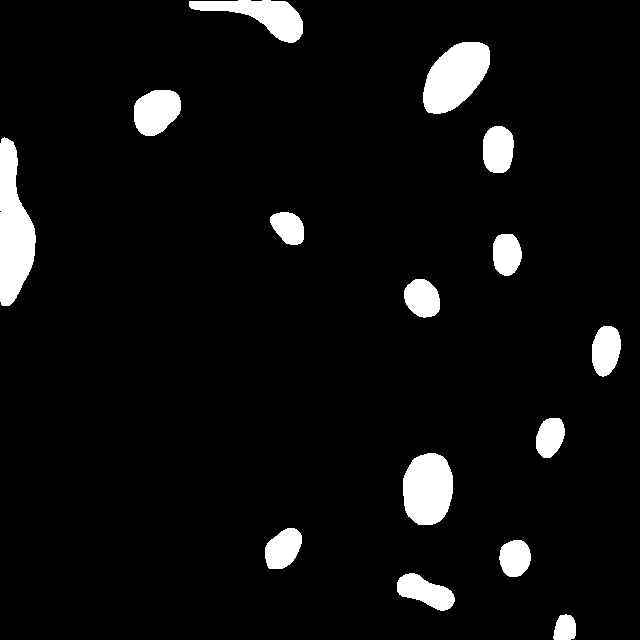

/content/gh-1/test/testing-134_jpg.rf.6d6b5bdc875cf5bba859362dd3190098.jpg


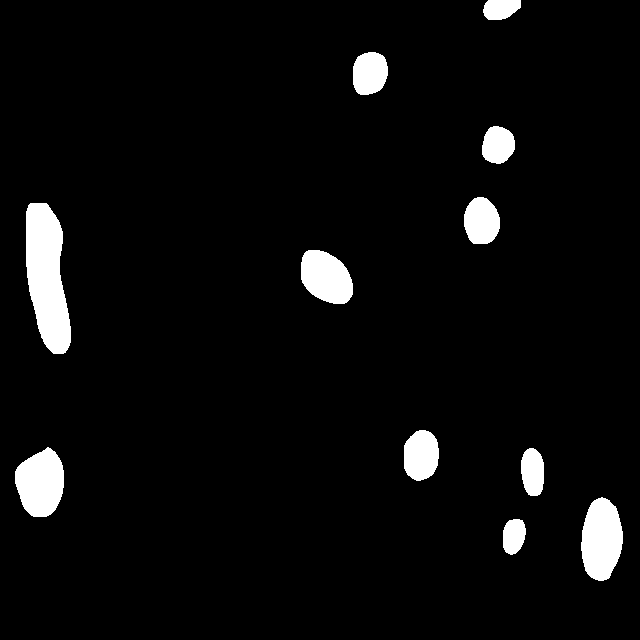

/content/gh-1/test/testing-135_jpg.rf.65613f5acf1c2b0e613b27380521d4c8.jpg


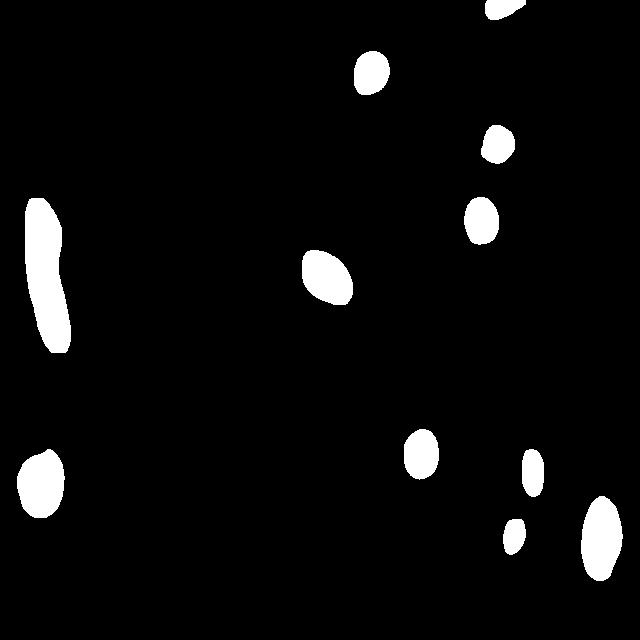

/content/gh-1/test/testing-163_jpg.rf.7d95c99444faa66e6d7a2556b2215338.jpg


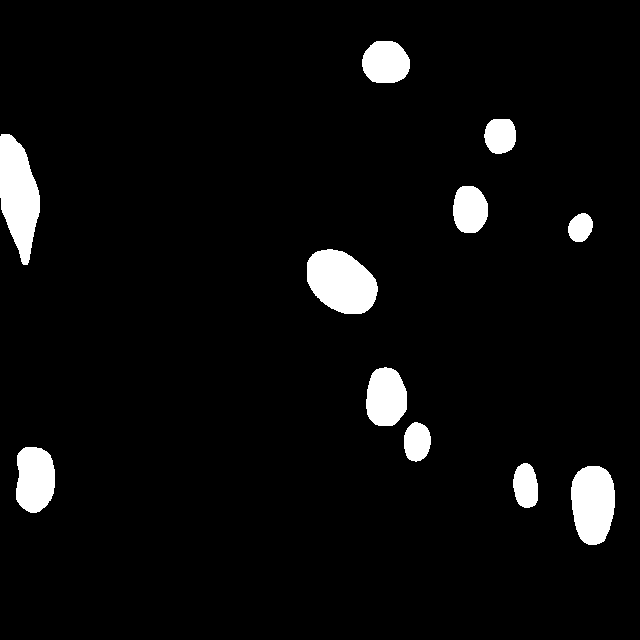

/content/gh-1/test/testing-130_jpg.rf.77adf7eb0f569fe67a3a9ae68dd9b645.jpg


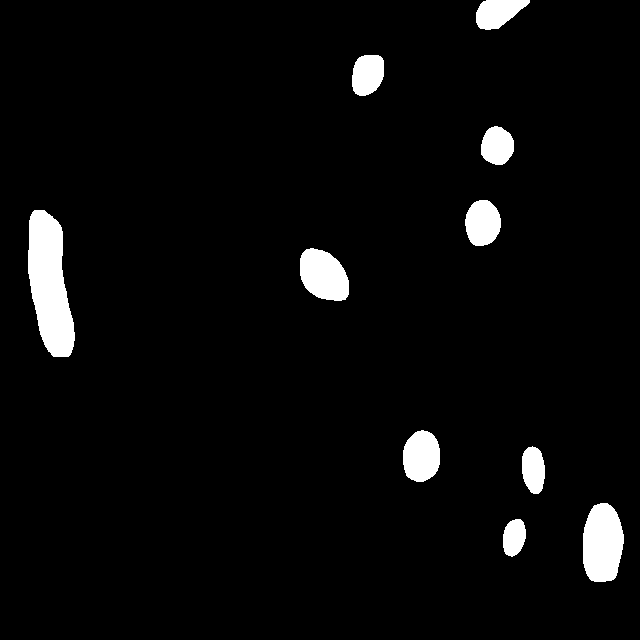

/content/gh-1/test/testing-104_jpg.rf.6ab8589112e6bf972b7f1c68d077755c.jpg


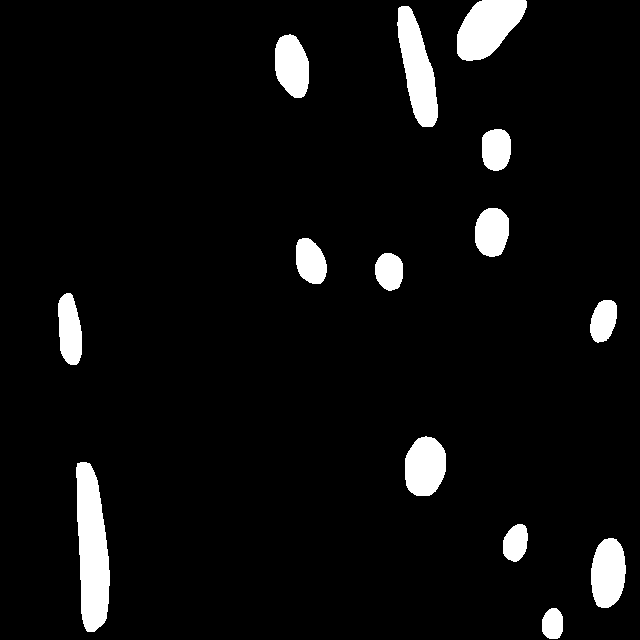

/content/gh-1/test/testing-058_jpg.rf.7bcff8fe3069aa378e955e1a95ee6028.jpg


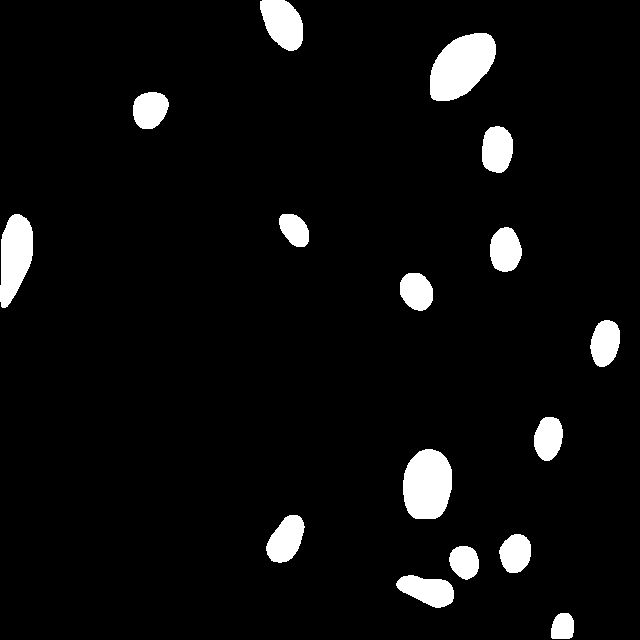

/content/gh-1/test/testing-052_jpg.rf.7dc5fc5d3581916a8404212cae1807fe.jpg


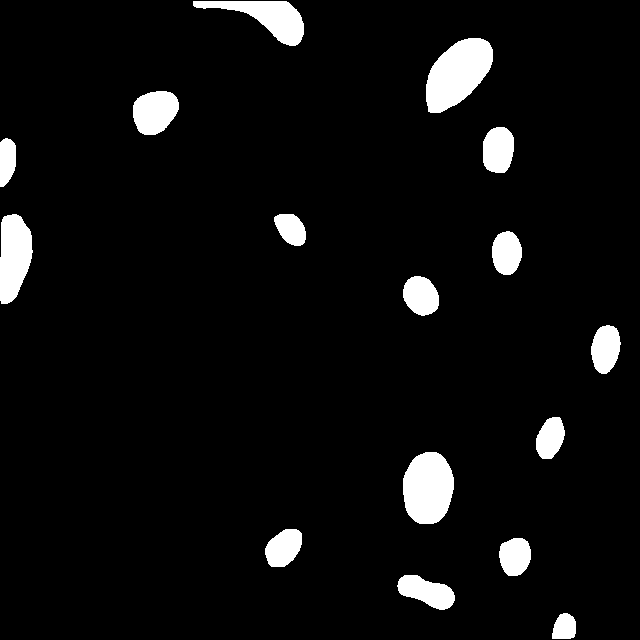

/content/gh-1/test/testing-060_jpg.rf.5bdd3d08187e3012155fab08bf588ca2.jpg


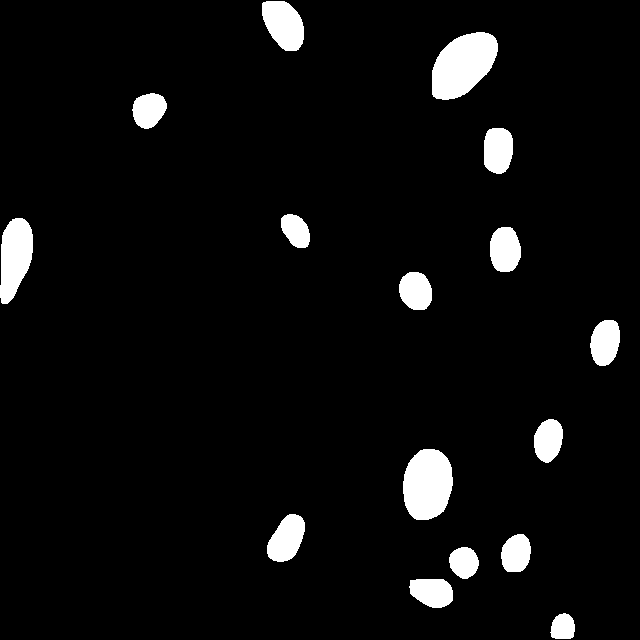

/content/gh-1/test/testing-137_jpg.rf.7f82804ad3bdcfe80a66afab5f816c12.jpg


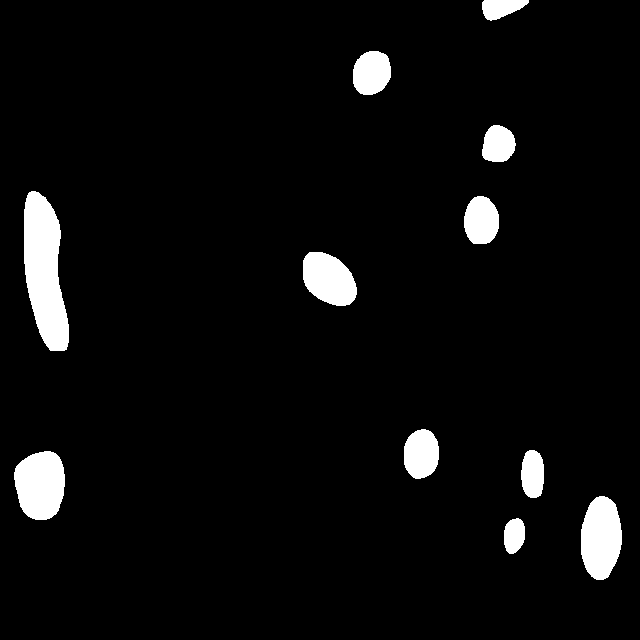

/content/gh-1/test/testing-138_jpg.rf.789c48bd9e9b587d788511395ea70ff0.jpg


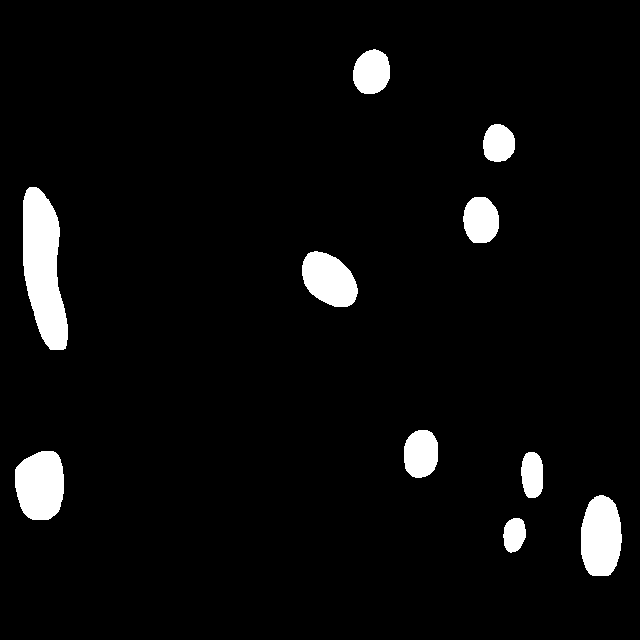

/content/gh-1/test/testing-035_jpg.rf.8a52c409da0d2d9866bc2b60d507fa5d.jpg


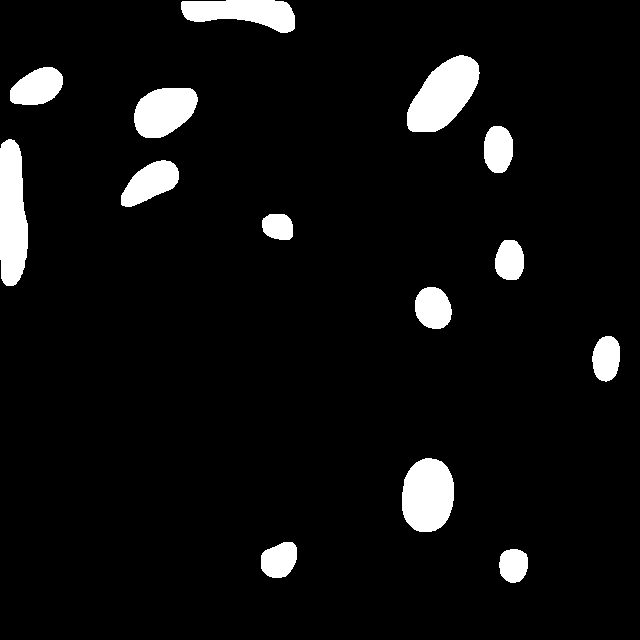

/content/gh-1/test/testing-132_jpg.rf.7843a9f8a2dd1db6548e2868ef76e758.jpg


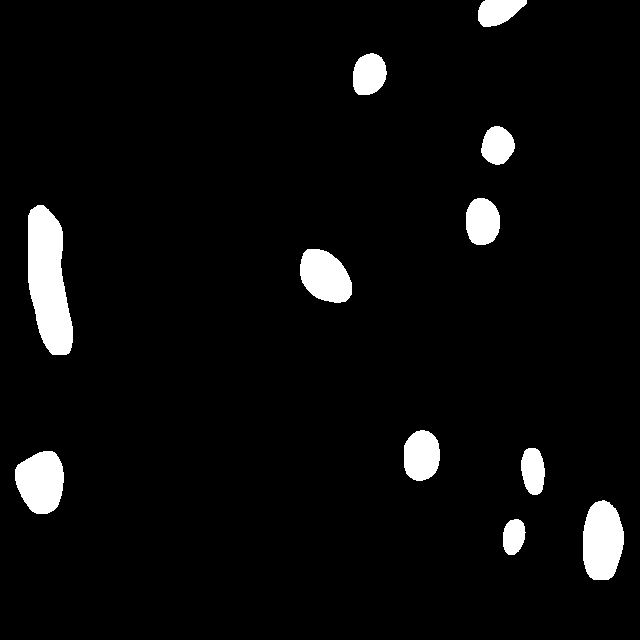

/content/gh-1/test/testing-108_jpg.rf.748aa76313b0e6b9e2c3c47a95293bc1.jpg


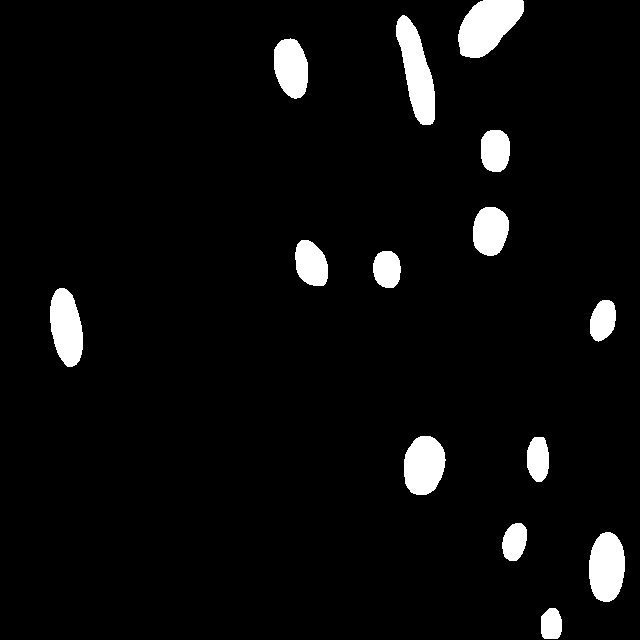

/content/gh-1/test/testing-017_jpg.rf.9160d7dac9a7a084f2e0b434074d049a.jpg


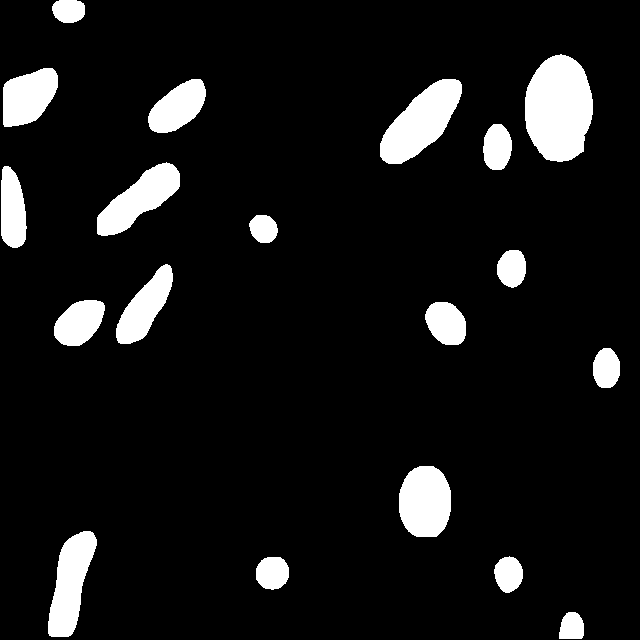

/content/gh-1/test/testing-036_jpg.rf.849c561135cb990d7f2b12fedf4cd081.jpg


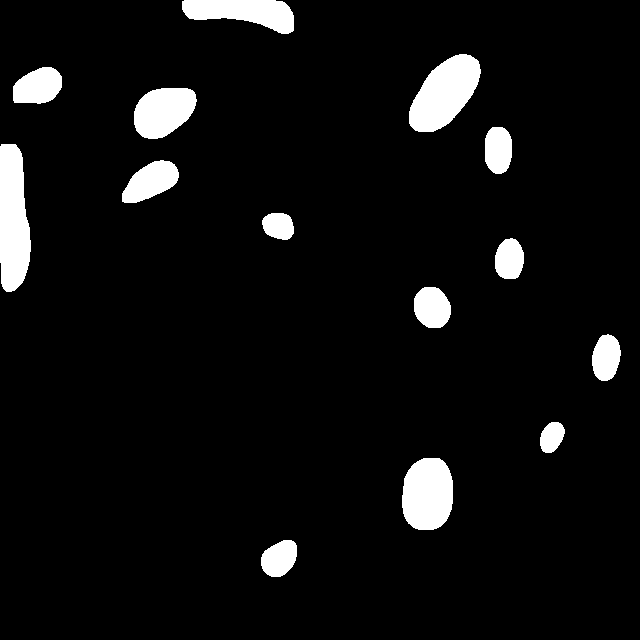

/content/gh-1/test/testing-097_jpg.rf.8468887e81de65fca5d6e5b4cccbd620.jpg


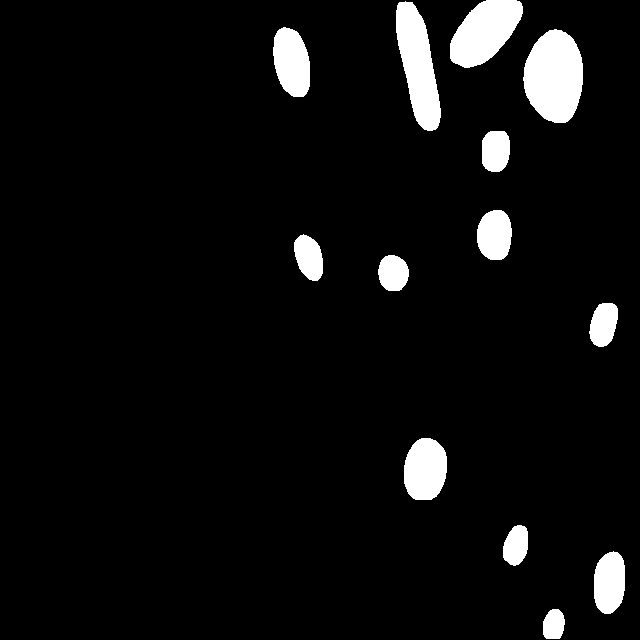

/content/gh-1/test/testing-131_jpg.rf.7df9a2688fd5d6fa282892878c748596.jpg


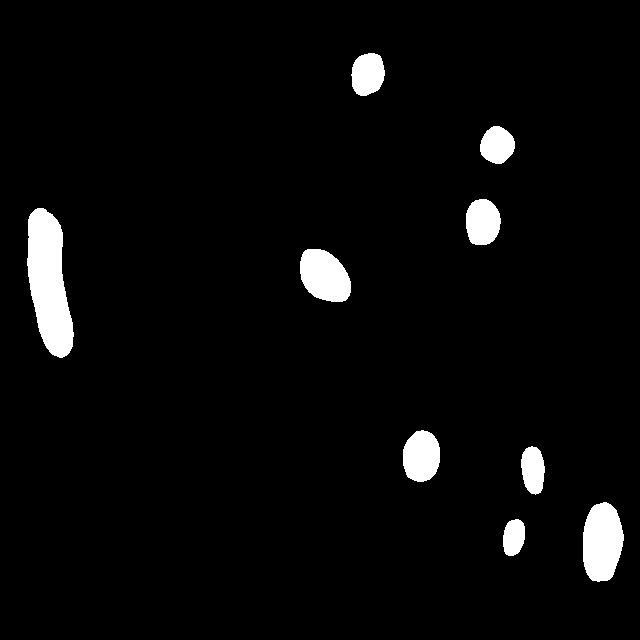

/content/gh-1/test/testing-050_jpg.rf.81903db665ba5d4e5dad387b3a0588a6.jpg


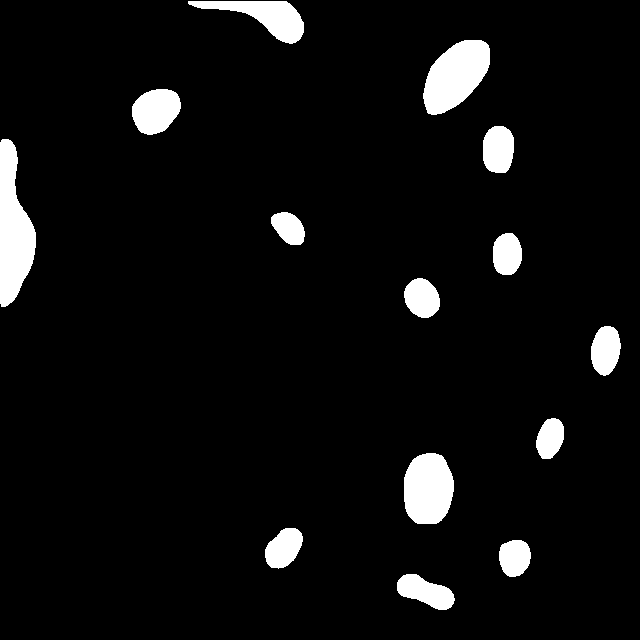

/content/gh-1/test/testing-151_jpg.rf.88860ddaafb4ac39ebc22d9b5a4042c3.jpg


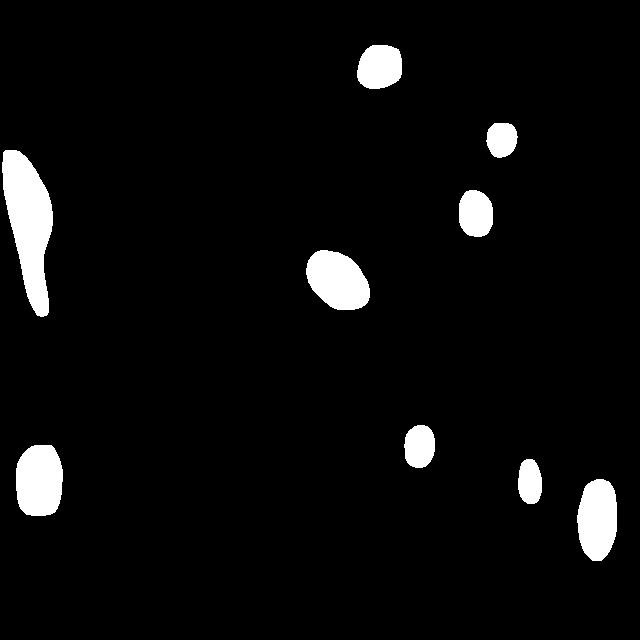

/content/gh-1/test/testing-093_jpg.rf.8f6a2c2fc48e526c268565c0600734c3.jpg


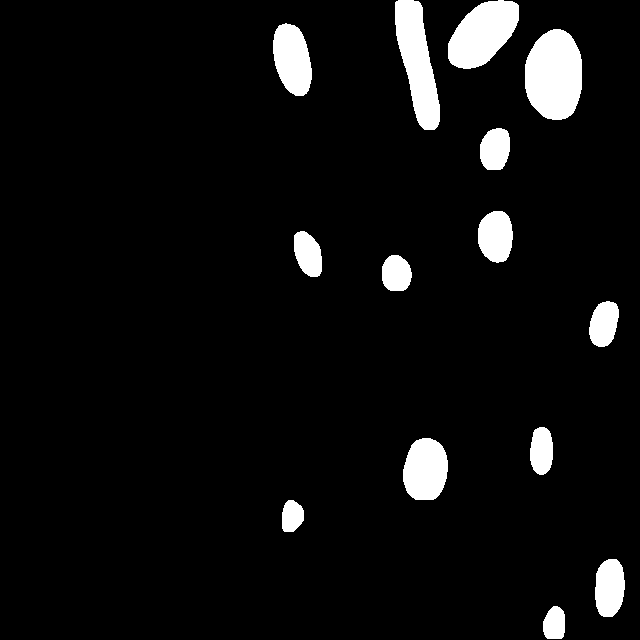

/content/gh-1/test/testing-072_jpg.rf.89eef6065db8f47d10a51ac7201250f8.jpg


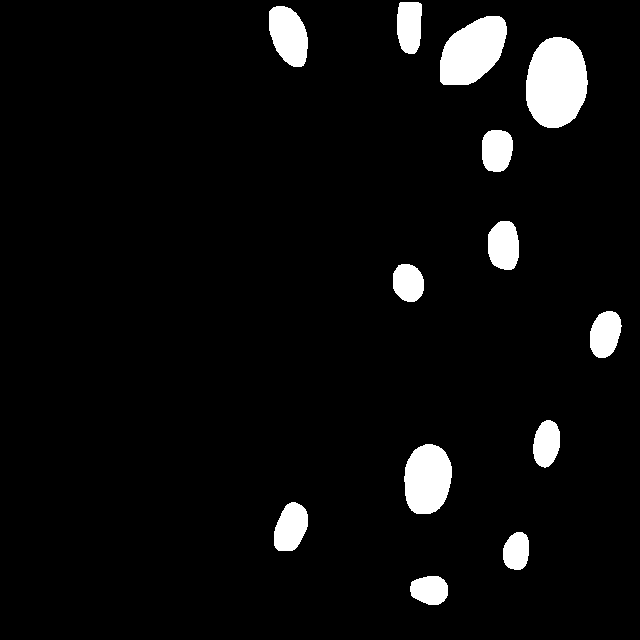

/content/gh-1/test/testing-067_jpg.rf.8335c9a21e91bab430c46acf09bb8987.jpg


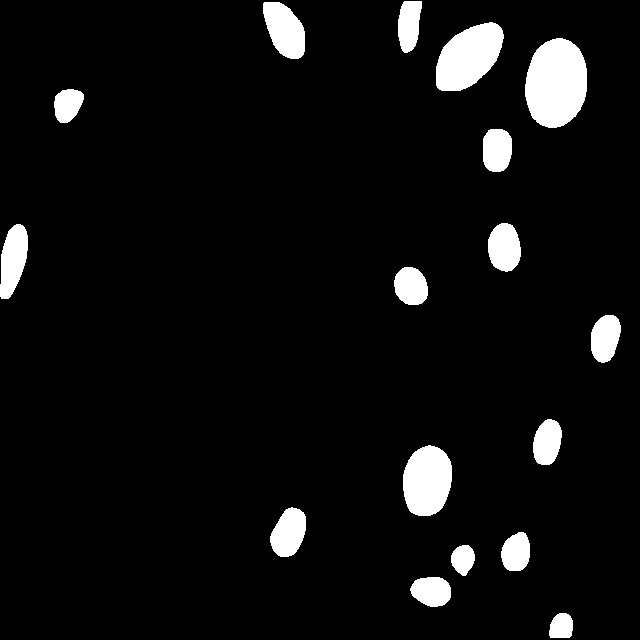

/content/gh-1/test/testing-080_jpg.rf.7f51bc38fbf7f81daea8a990fb038711.jpg


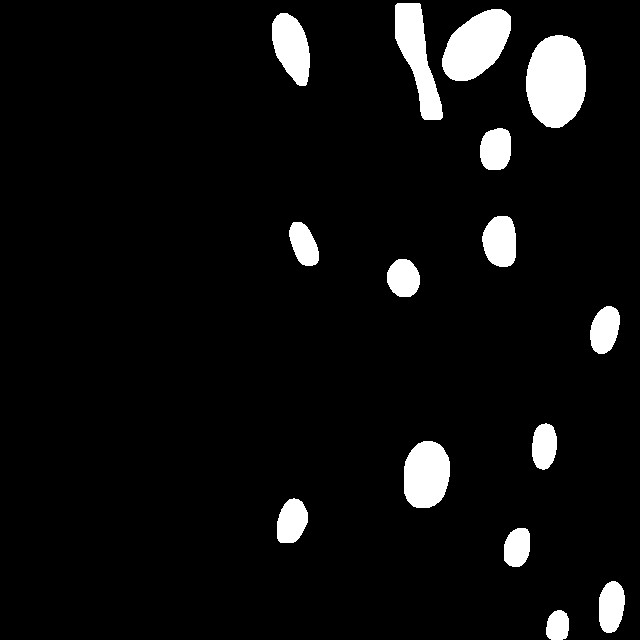

/content/gh-1/test/testing-034_jpg.rf.8a40fad78391c7a74aabe8818311b75a.jpg


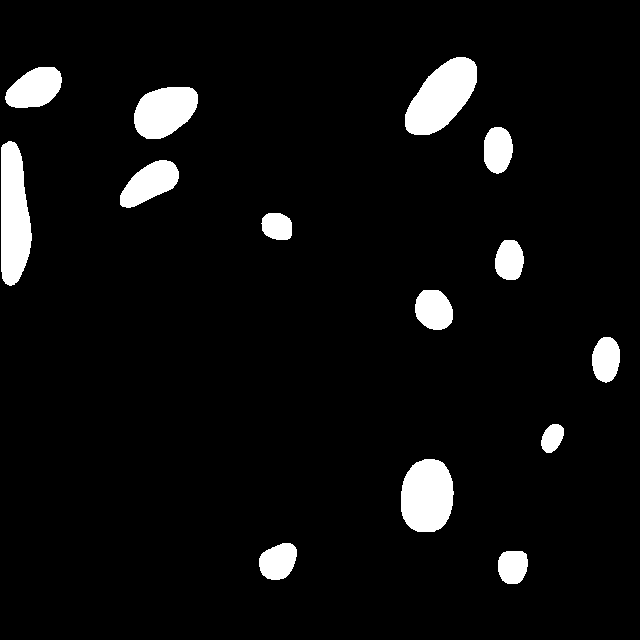

/content/gh-1/test/testing-028_jpg.rf.7b80742e98c2e359a1d60576c3a435f9.jpg


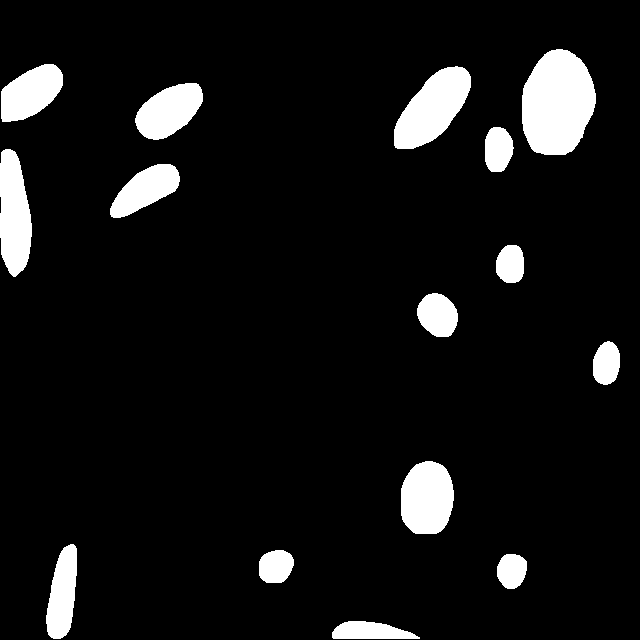

/content/gh-1/test/testing-146_jpg.rf.83c82417720e60d792b1100f68562a4e.jpg


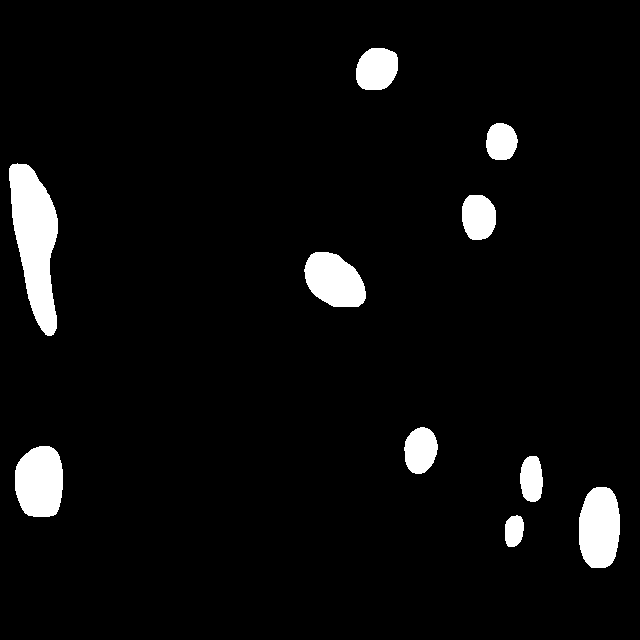

/content/gh-1/test/testing-162_jpg.rf.87fa0b4dcecf8fc9c049fa5b719c9839.jpg


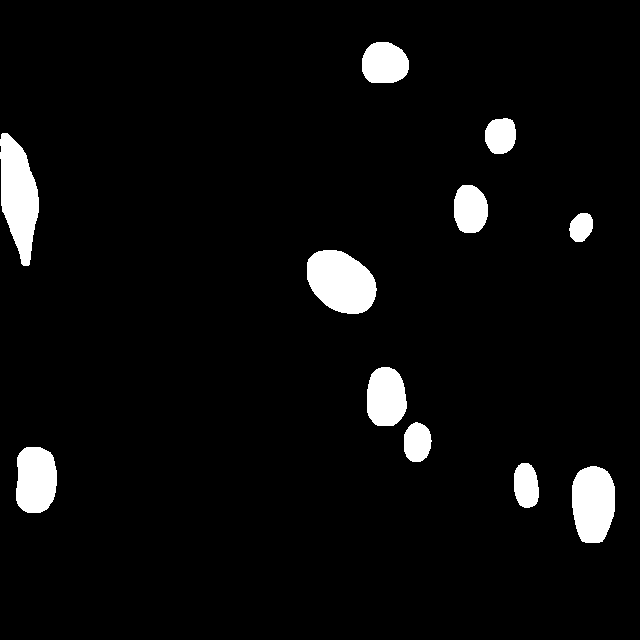

/content/gh-1/test/testing-016_jpg.rf.937e8980b1605808d931f0393f7099e3.jpg


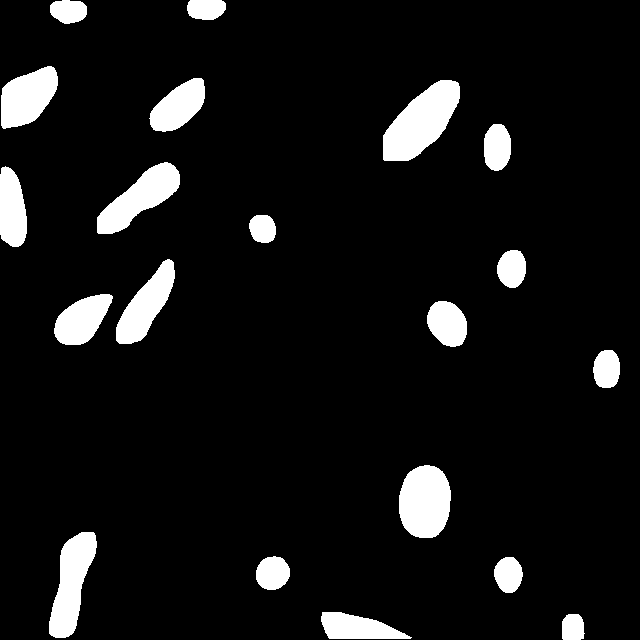

/content/gh-1/test/testing-042_jpg.rf.93704b89a367403e9cceb7c77e3939b3.jpg


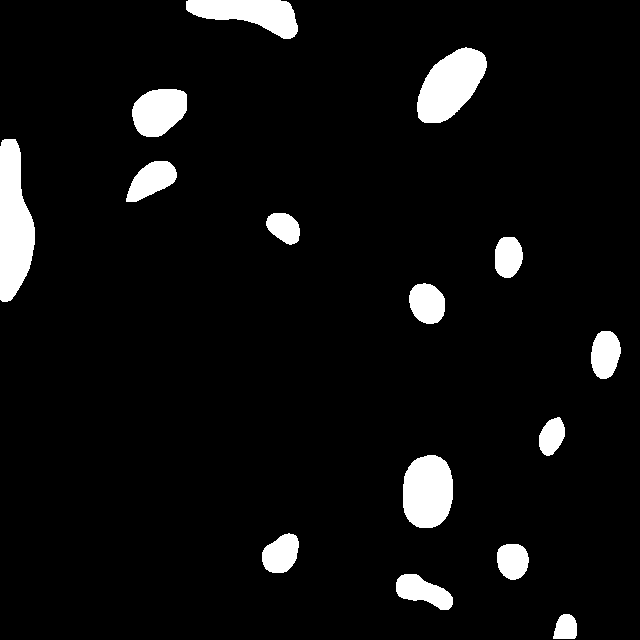

/content/gh-1/test/testing-103_jpg.rf.95289396ad0027324b552b29e8967918.jpg


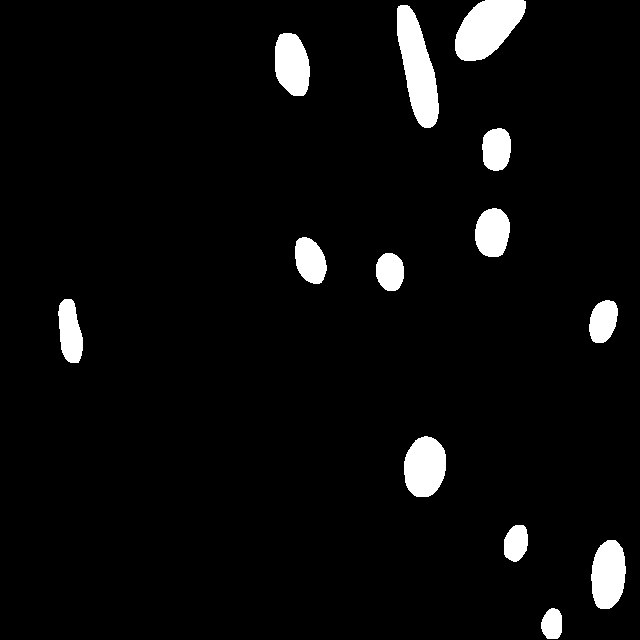

/content/gh-1/test/testing-083_jpg.rf.a4cfb7f1e4862a88aeed2982ced4392b.jpg


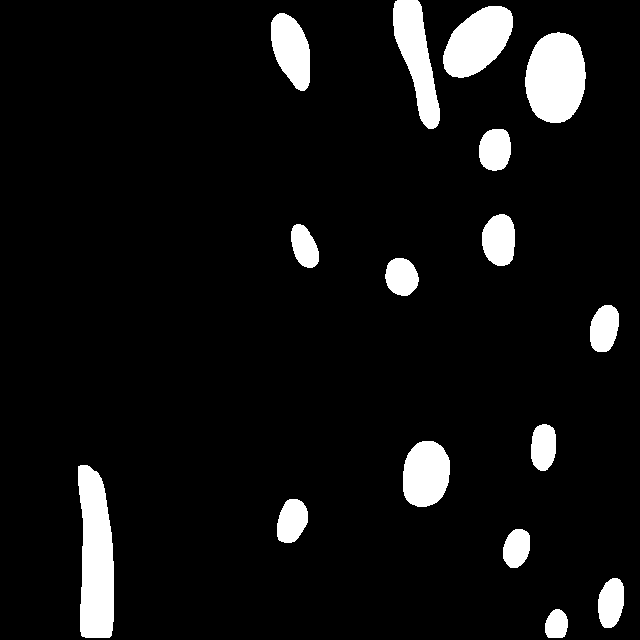

/content/gh-1/test/testing-025_jpg.rf.93a1fb45696c264f68b56caa305f684e.jpg


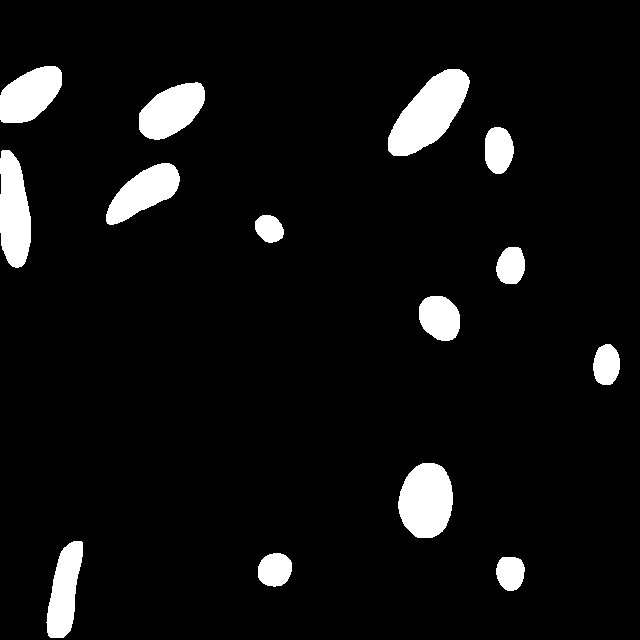

/content/gh-1/test/testing-092_jpg.rf.a9146079f19049fbe428de1e879a3ca0.jpg


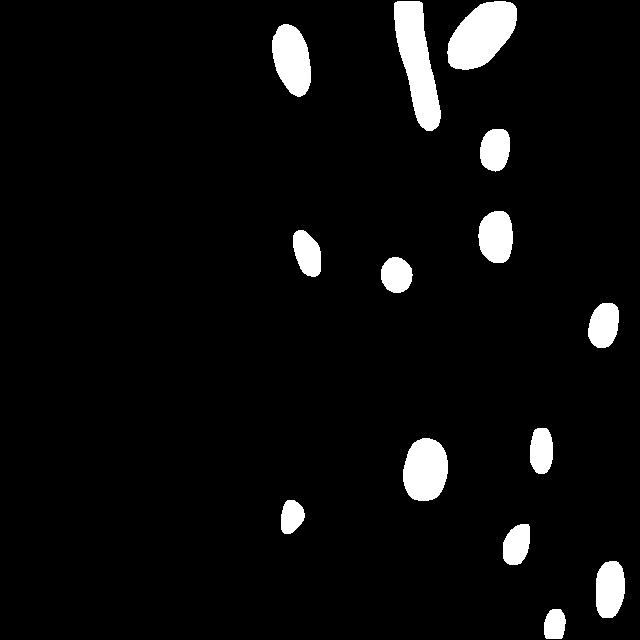

/content/gh-1/test/testing-048_jpg.rf.a2ae7d423ee3980416794517447b1a4b.jpg


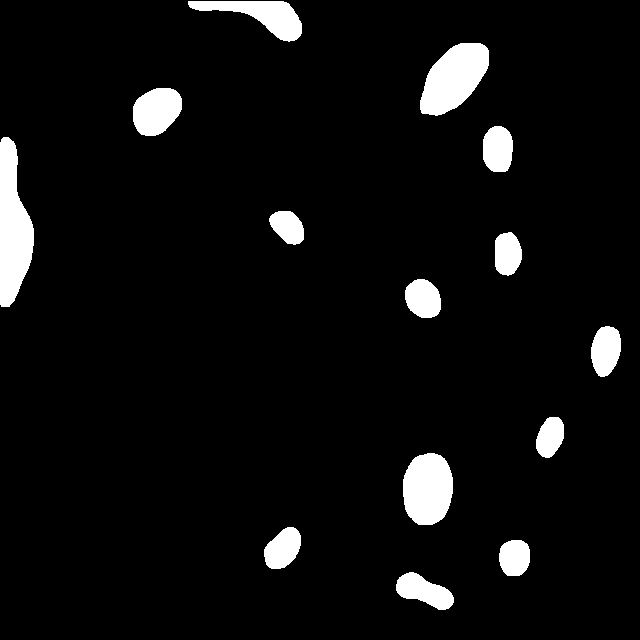

/content/gh-1/test/testing-126_jpg.rf.9bdedb6c8acc03c68c1fce5848ec7316.jpg


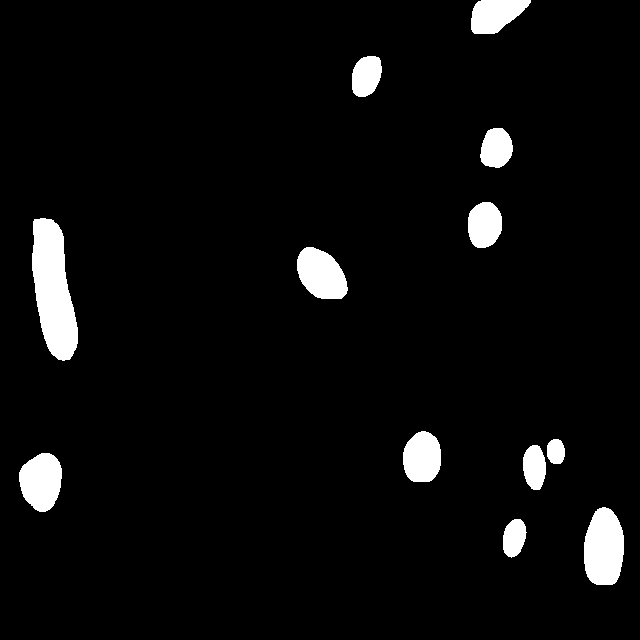

/content/gh-1/test/testing-054_jpg.rf.95a047d1190b37b412180c606b4e477e.jpg


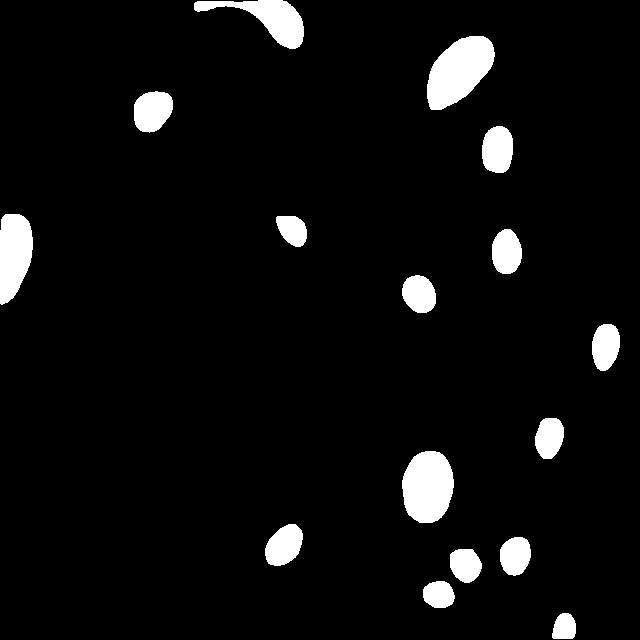

/content/gh-1/test/testing-030_jpg.rf.a64d11c045d834993c0fb74f11aaf79a.jpg


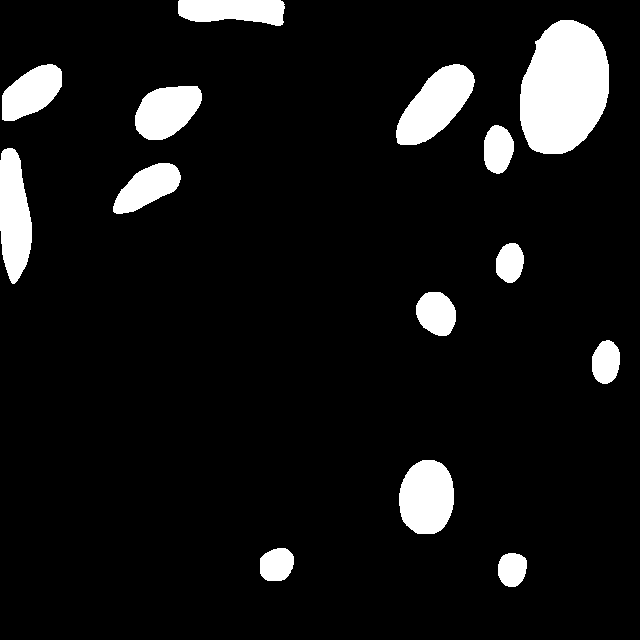

/content/gh-1/test/testing-165_jpg.rf.a37a63bd3d9d66ea6bc32b5040a91701.jpg


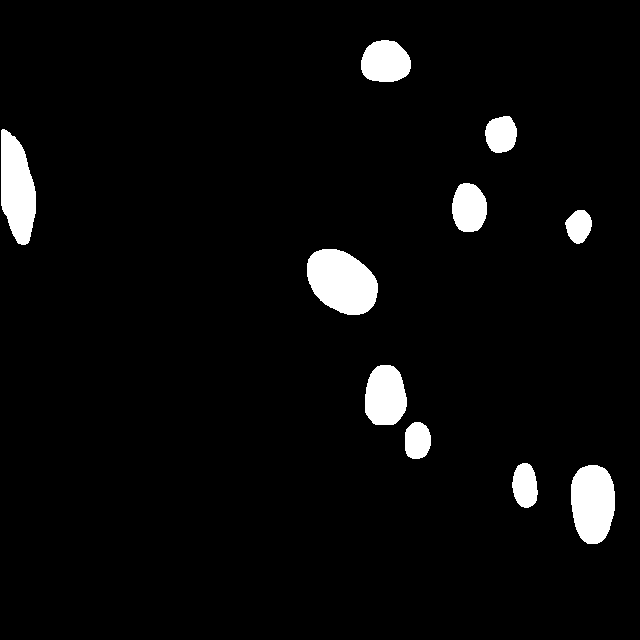

/content/gh-1/test/testing-109_jpg.rf.a371a42aed854661d0ddd98cff34d03f.jpg


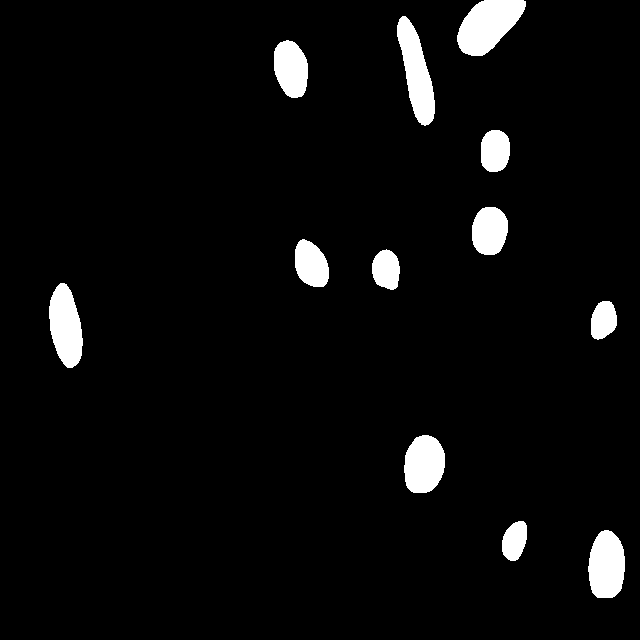

/content/gh-1/test/testing-139_jpg.rf.a84917e91c2c998ab6646643aefb4429.jpg


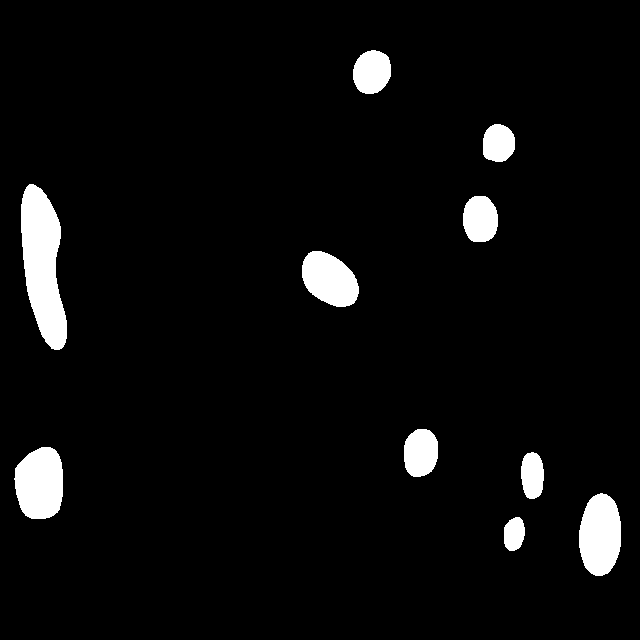

/content/gh-1/test/testing-161_jpg.rf.a7d3d4936db19175d561651da48d194b.jpg


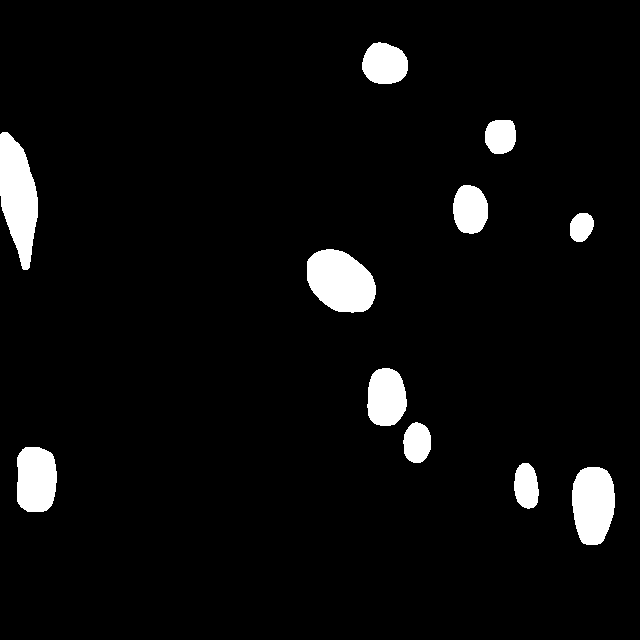

/content/gh-1/test/testing-059_jpg.rf.a896394c21879ebbc912d85f2e755bca.jpg


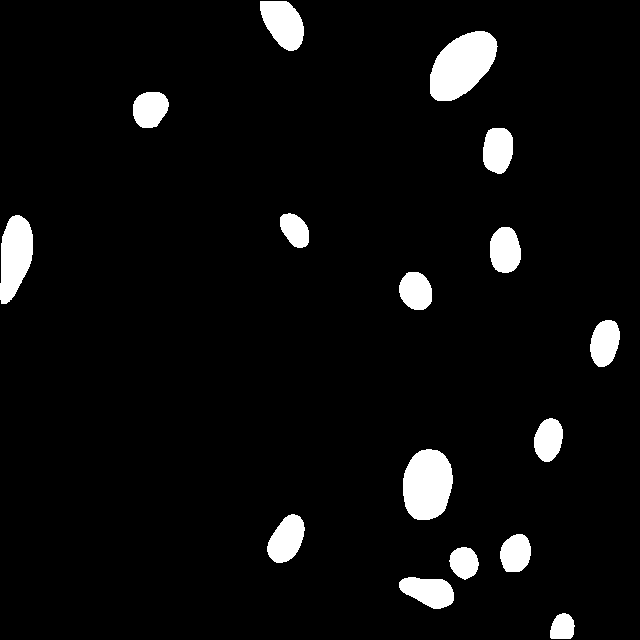

/content/gh-1/test/testing-098_jpg.rf.a61c343c18e7e2396ca9ccbbc5d70073.jpg


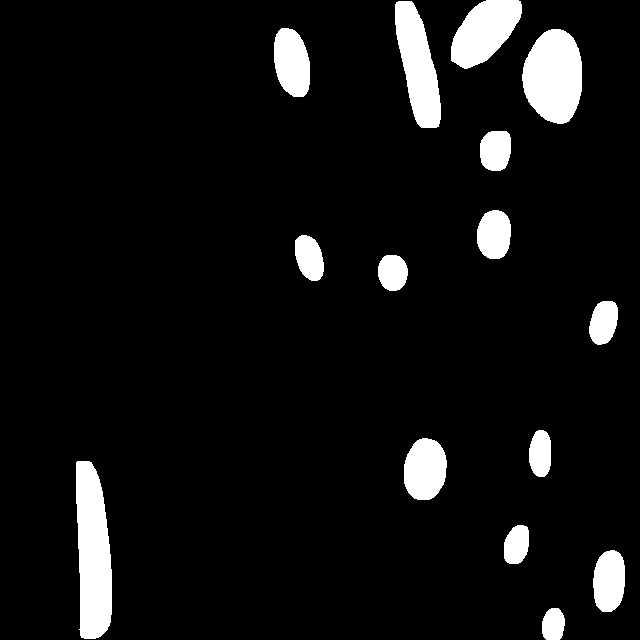

/content/gh-1/test/testing-051_jpg.rf.9cedf12d85e828f67728192854d2088c.jpg


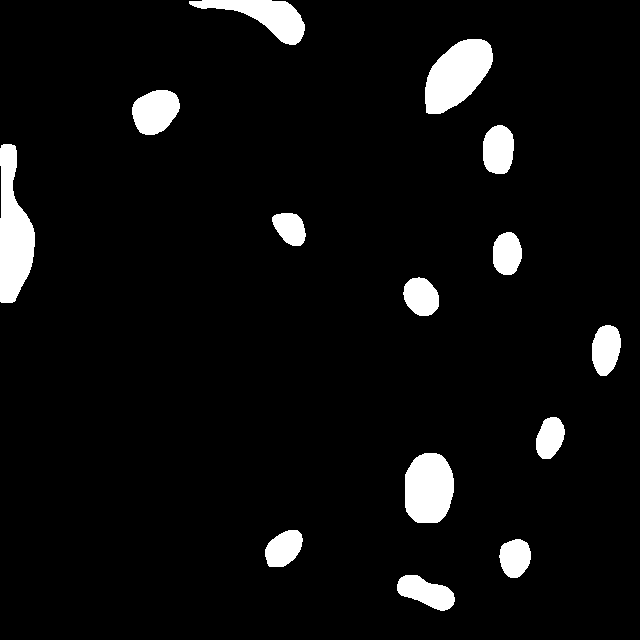

/content/gh-1/test/testing-027_jpg.rf.a05bb6c19d3a332134e88572374e8fa9.jpg


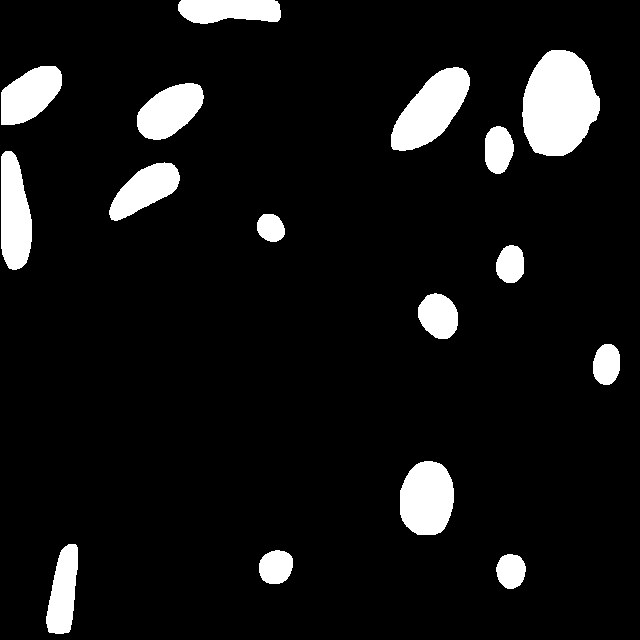

/content/gh-1/test/testing-087_jpg.rf.9f622ac10c903a99a7338fe7eb804cb3.jpg


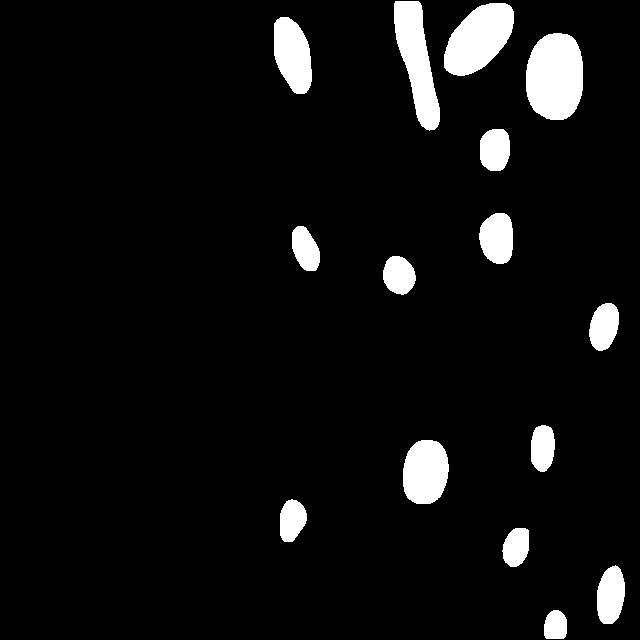

/content/gh-1/test/testing-133_jpg.rf.b0c8530c05dee16041839626441e6feb.jpg


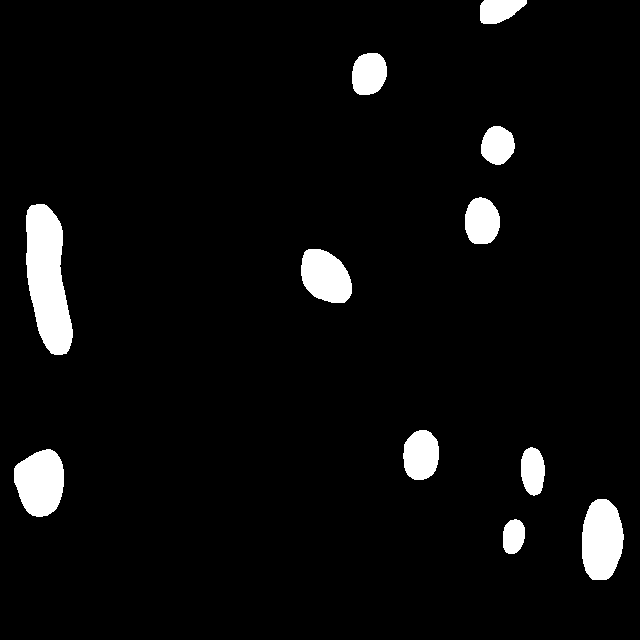

/content/gh-1/test/testing-090_jpg.rf.ab3ffd097bc7074cc04ff804b3f2db45.jpg


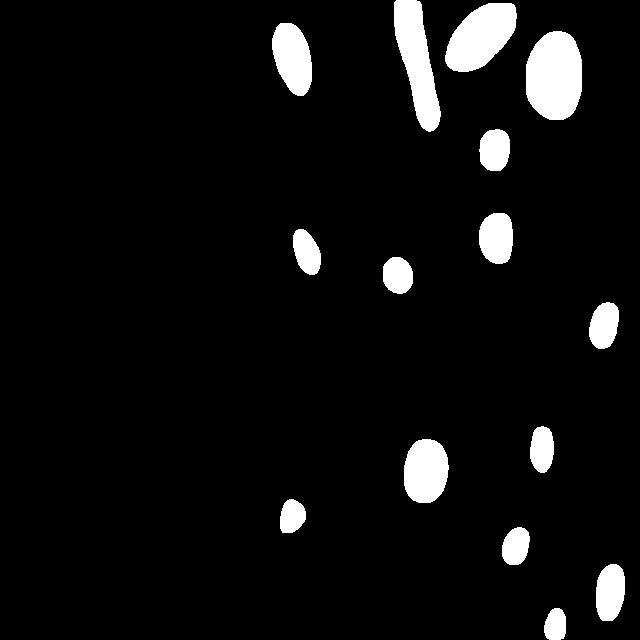

/content/gh-1/test/testing-077_jpg.rf.b29db7542e5e2111fffd463c2f3620dd.jpg


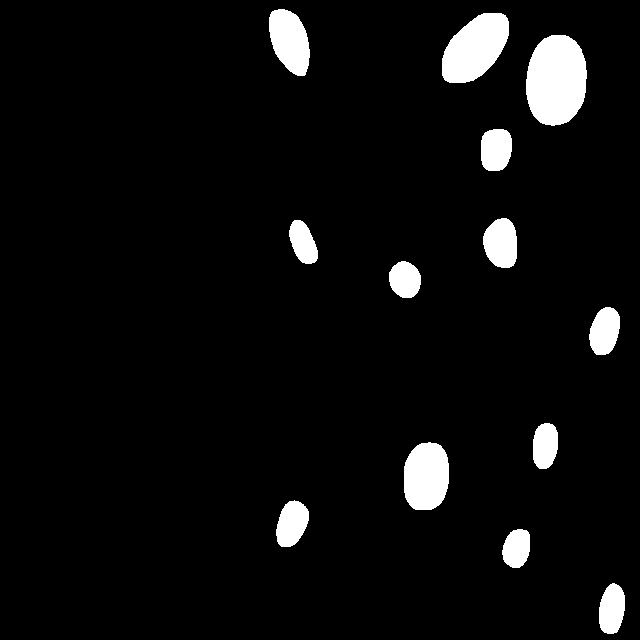

/content/gh-1/test/testing-149_jpg.rf.94881b7fbb73959208ea301f70af3b1a.jpg


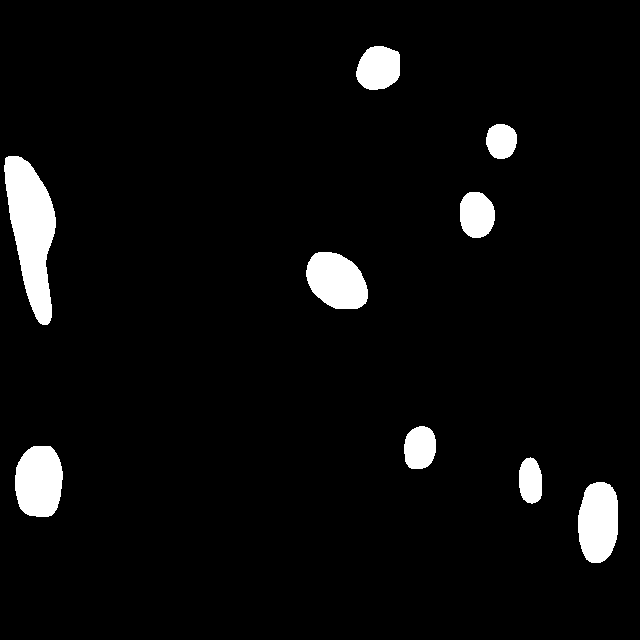

/content/gh-1/test/testing-044_jpg.rf.b5014b5870c7d38ccc5d9be7a6121934.jpg


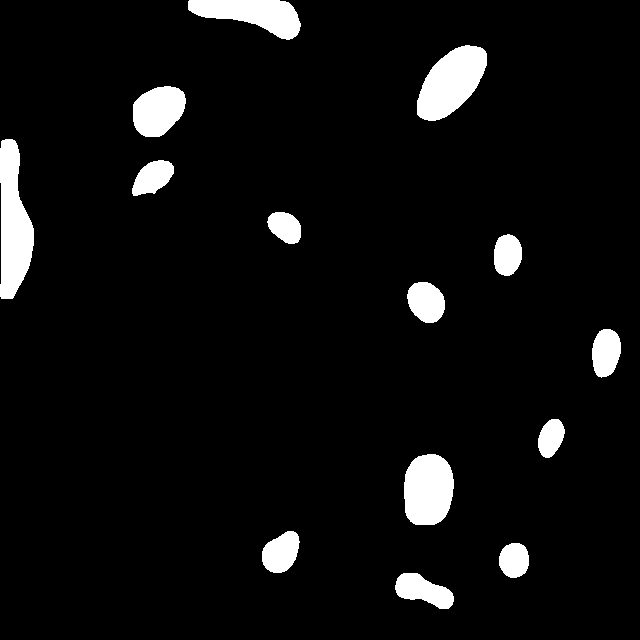

/content/gh-1/test/testing-012_jpg.rf.c16e516055fe3eb45a340537ae0d676f.jpg


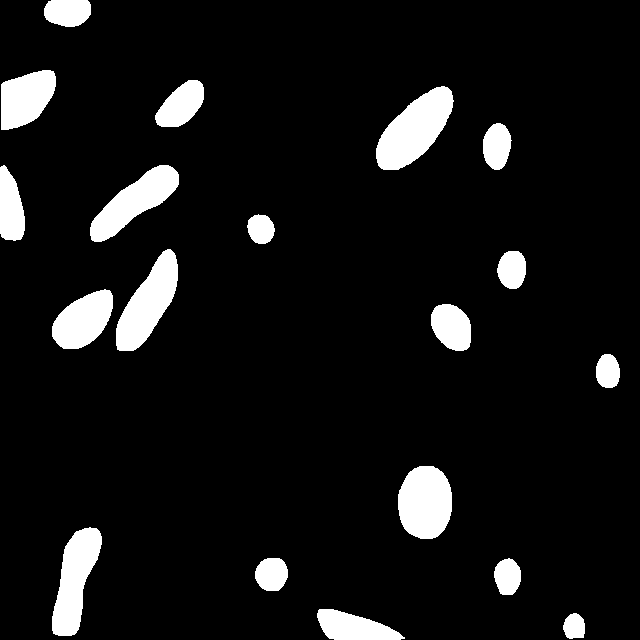

/content/gh-1/test/testing-003_jpg.rf.b2c7d03b2d2939a7569139f000c4f14f.jpg


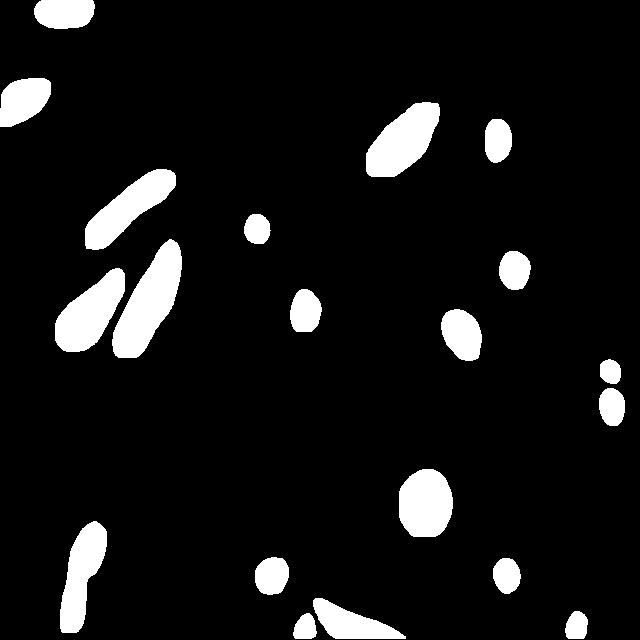

/content/gh-1/test/testing-100_jpg.rf.bf5646766735d7c3e28bbf0353656eee.jpg


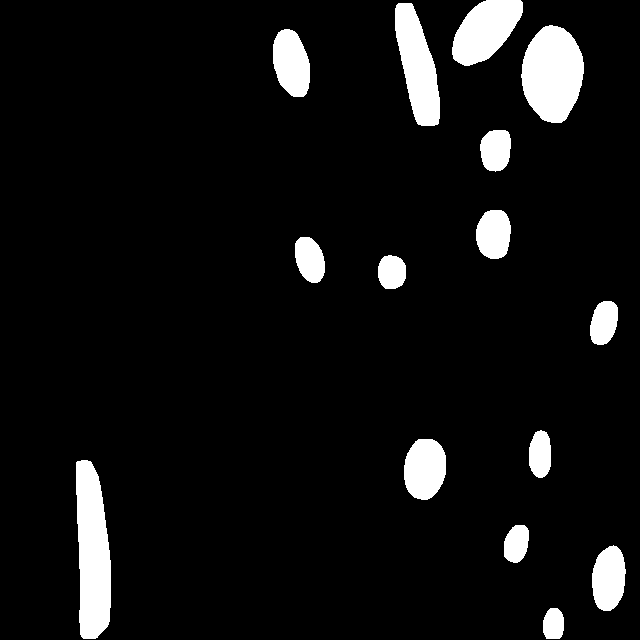

/content/gh-1/test/testing-110_jpg.rf.c065be2070462bdd5d2ff9eb296d2ae0.jpg


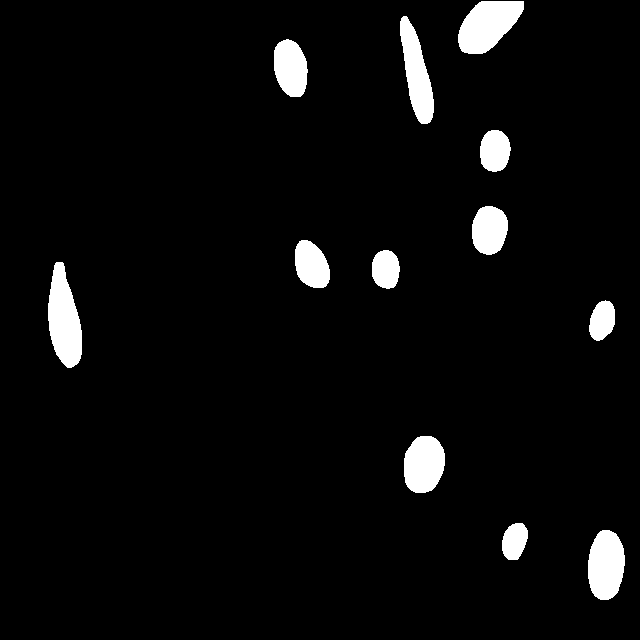

/content/gh-1/test/testing-001_jpg.rf.c51de1a41829bc967a28e6b8868aab9b.jpg


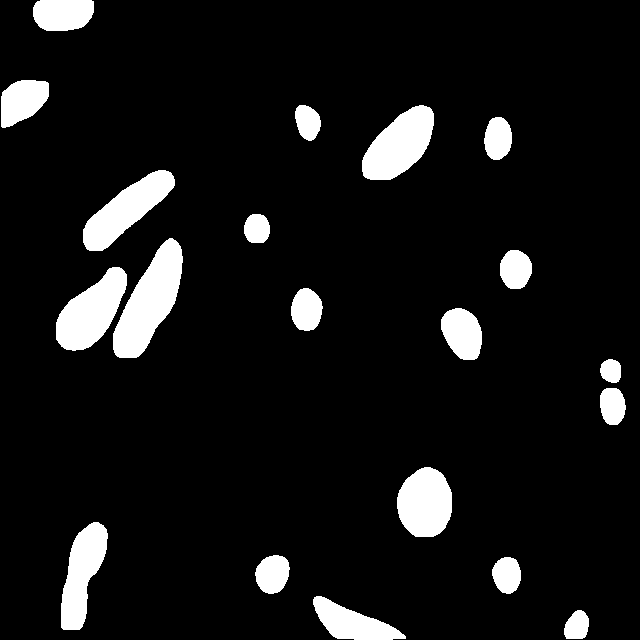

/content/gh-1/test/testing-153_jpg.rf.adf38310819e345f8c3e8ba2074544c5.jpg


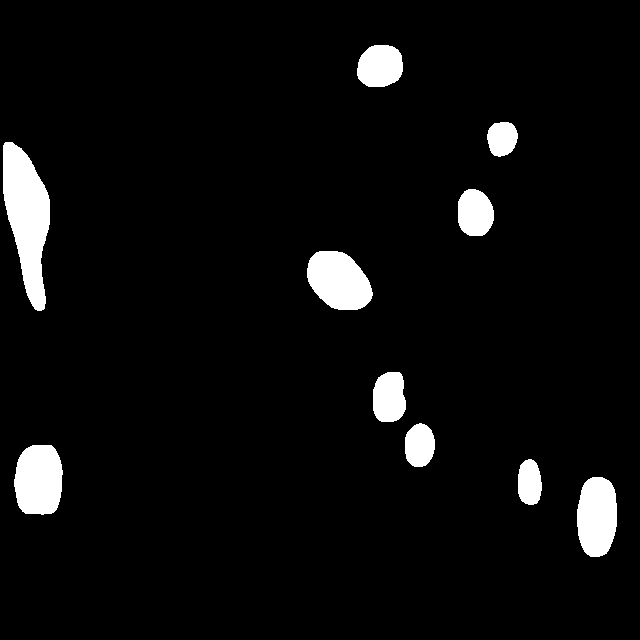

/content/gh-1/test/testing-129_jpg.rf.b13e7d64090ee8d1f8d71f4bdc4f1769.jpg


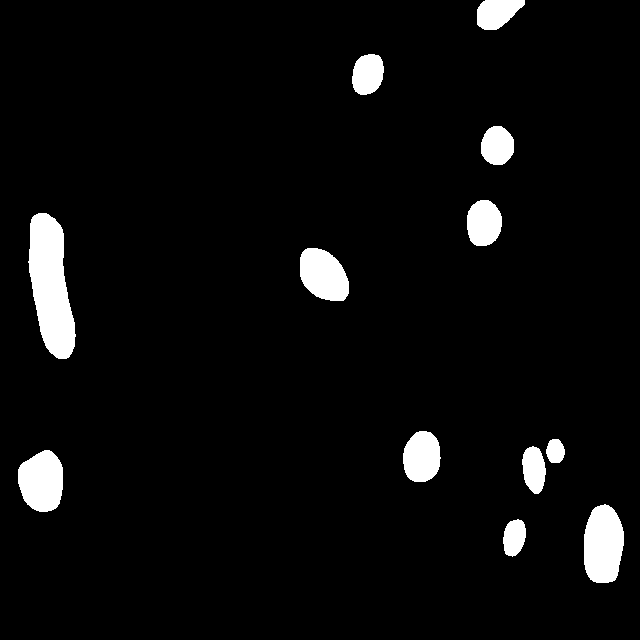

/content/gh-1/test/testing-047_jpg.rf.c66fbaed79fef8a8bd911420f0e71314.jpg


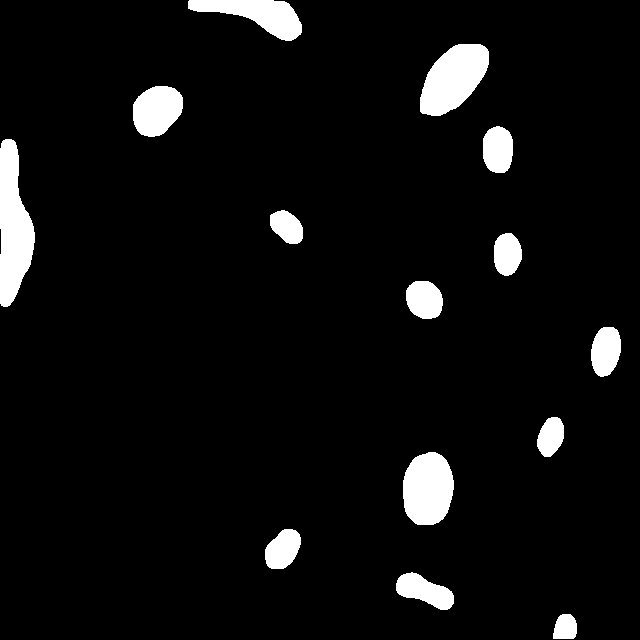

/content/gh-1/test/testing-156_jpg.rf.bd0643d7cabfd0592c9c356a86e8ddec.jpg


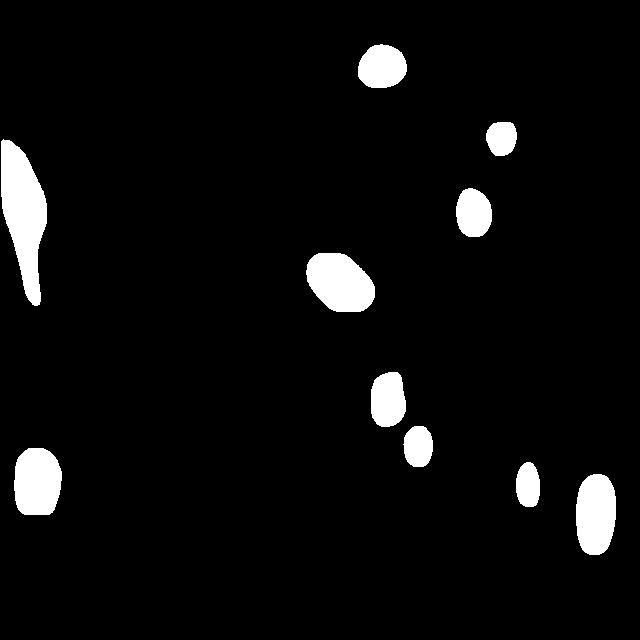

/content/gh-1/test/testing-086_jpg.rf.c9812111784fbc3c7ff7da186f52f20f.jpg


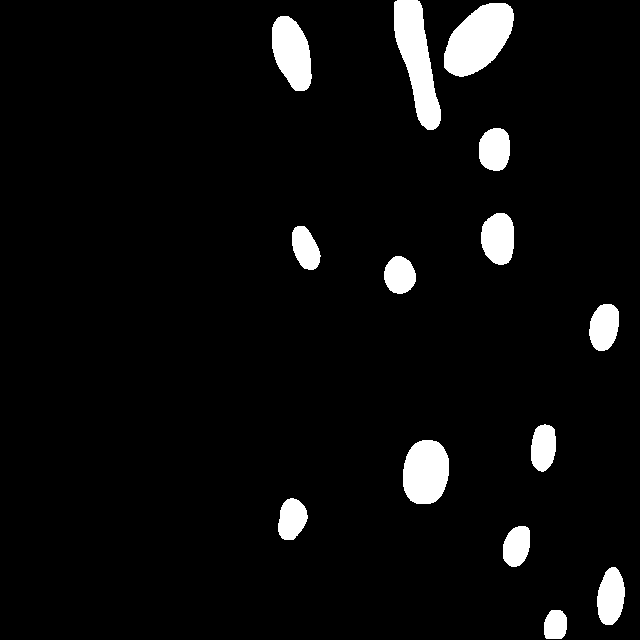

/content/gh-1/test/testing-031_jpg.rf.b8596238db82f0ca43aef48e4b2e2138.jpg


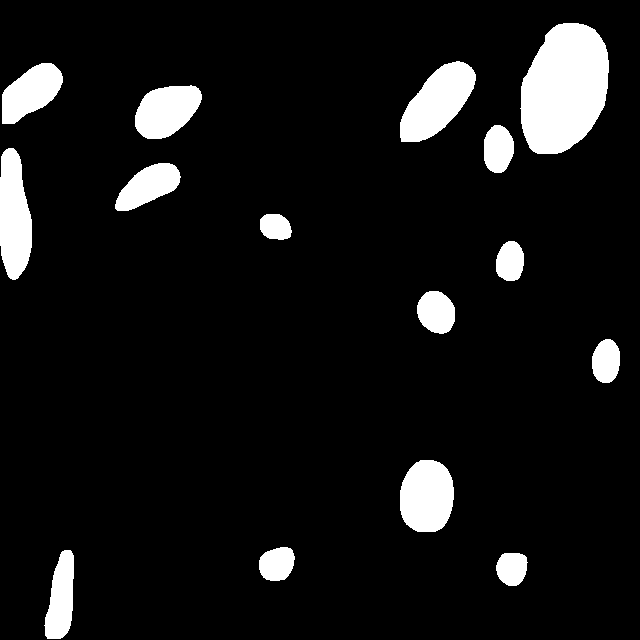

/content/gh-1/test/testing-125_jpg.rf.ccb55fe4d9418bce287e55052fe1f8cf.jpg


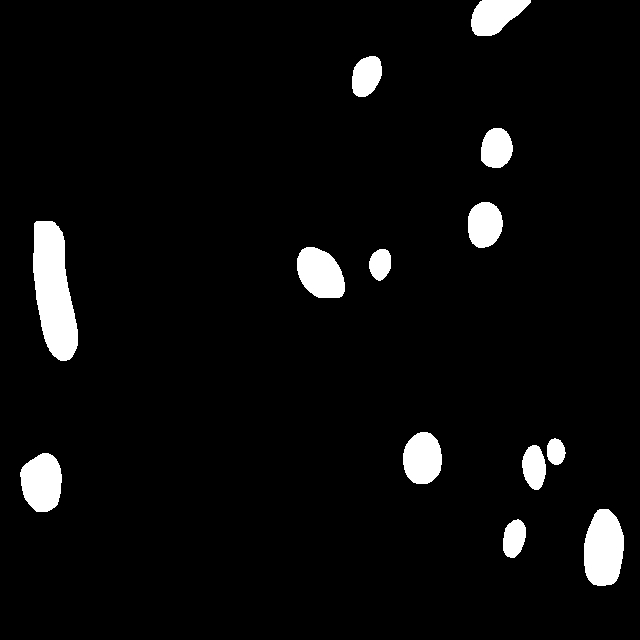

/content/gh-1/test/testing-105_jpg.rf.ca036ba50324553cdbc915ed96f38bfd.jpg


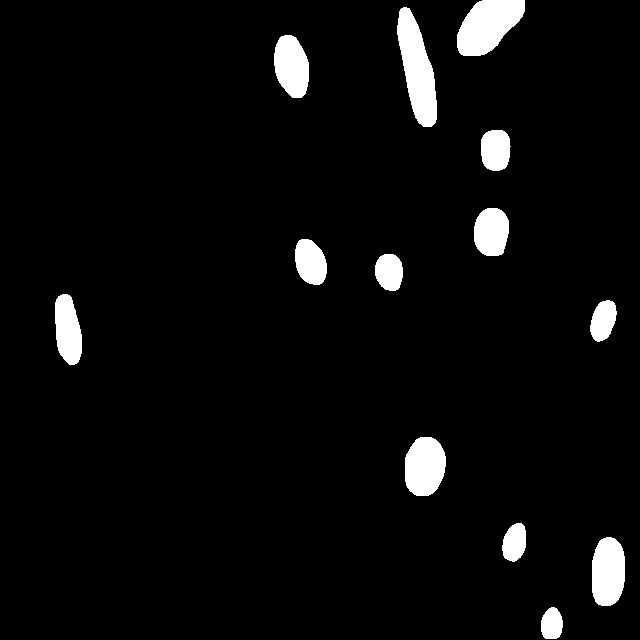

/content/gh-1/test/testing-037_jpg.rf.c5281919b7659575c1ed61c06fcfb82e.jpg


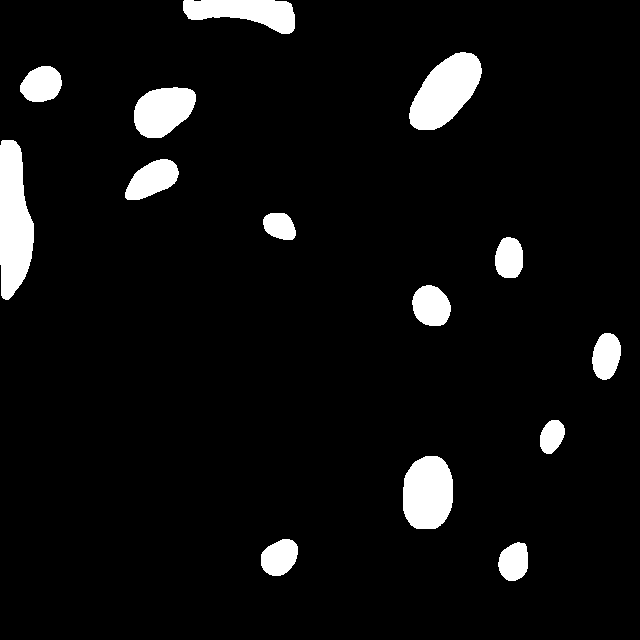

/content/gh-1/test/testing-053_jpg.rf.c15b75ad42d6afdf499a6e22742f0856.jpg


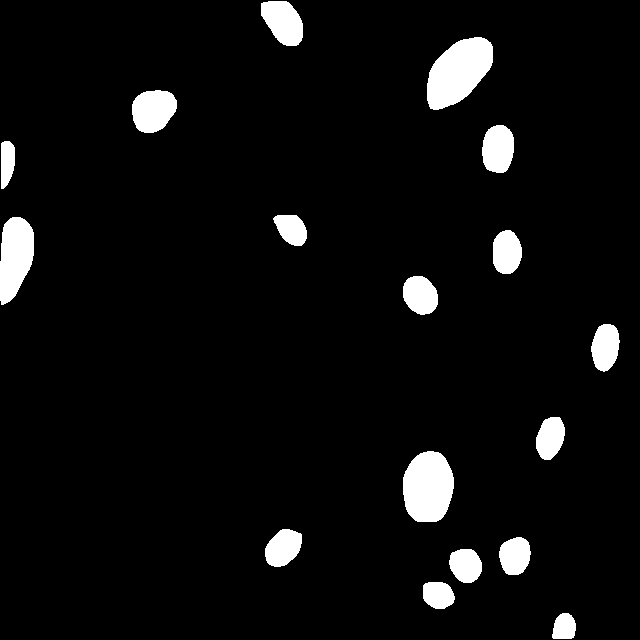

/content/gh-1/test/testing-039_jpg.rf.c56d50e41884bd9376089ae5df7a3925.jpg


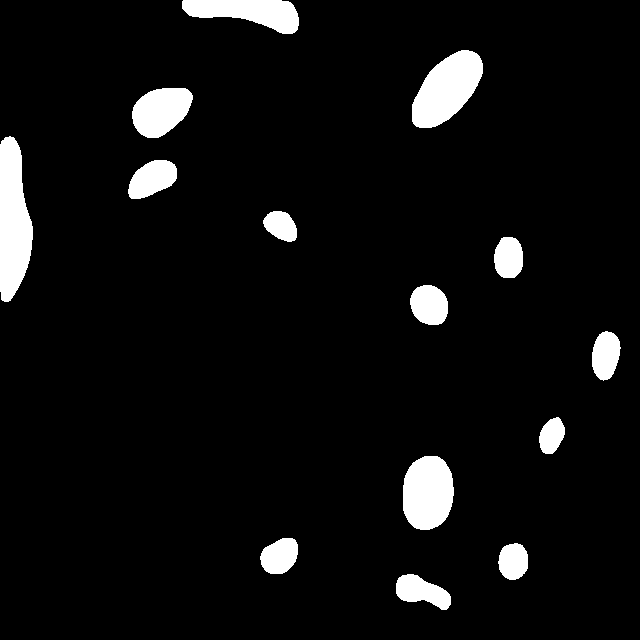

/content/gh-1/test/testing-152_jpg.rf.cca491ea8c4c6cfe1b7fbf5eed96ae3e.jpg


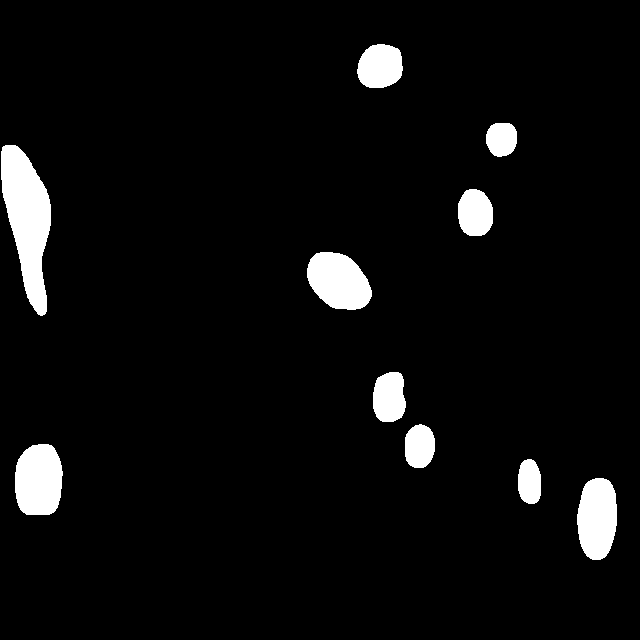

/content/gh-1/test/testing-121_jpg.rf.c51ac267dbcd15d1f8179629b12c0681.jpg


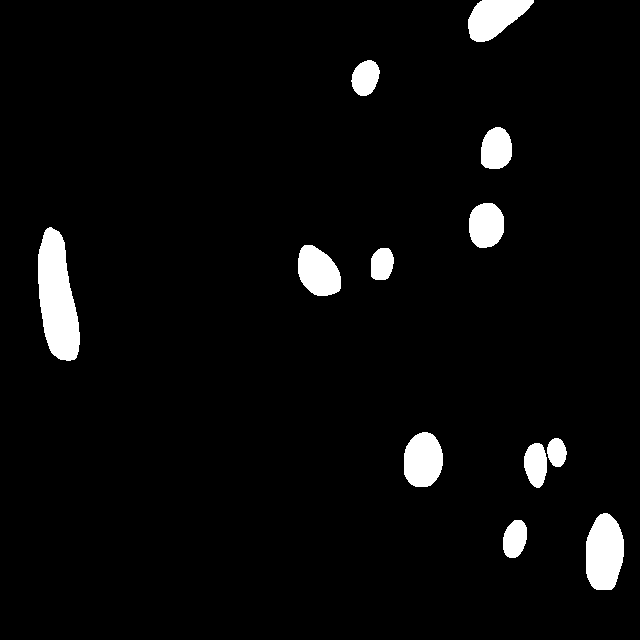

/content/gh-1/test/testing-157_jpg.rf.c57348a1333361b9fda9377807cf22b2.jpg


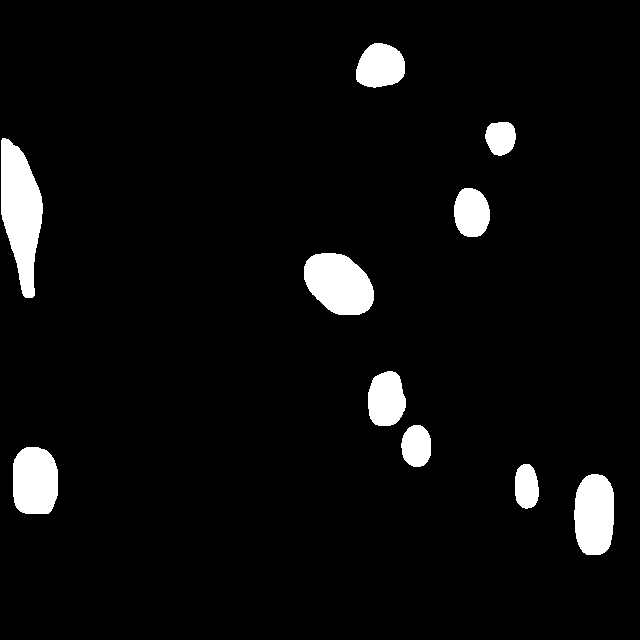

/content/gh-1/test/testing-055_jpg.rf.c4a993c091ae5ed2314cd1510c3c471e.jpg


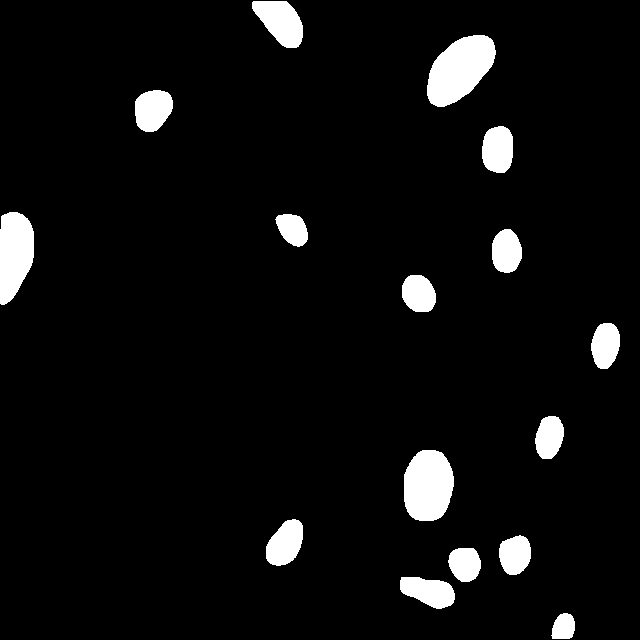

/content/gh-1/test/testing-155_jpg.rf.ca8c17b427f18f5d37988776ea185702.jpg


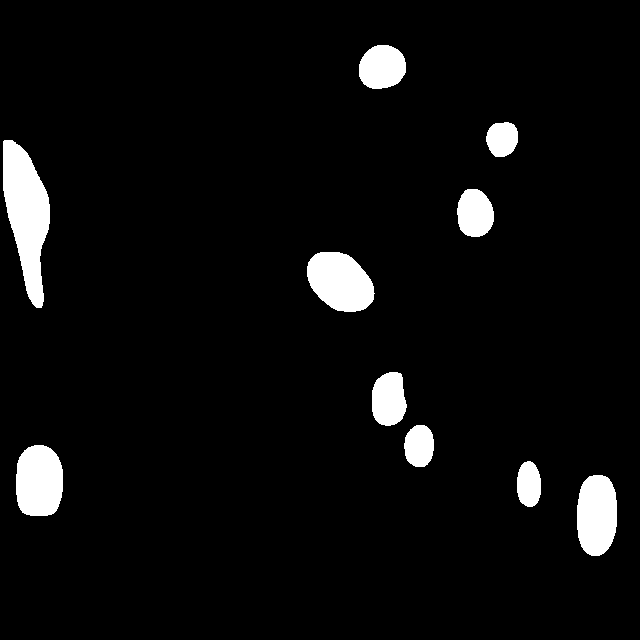

/content/gh-1/test/testing-021_jpg.rf.d98e43dfffd4a94396d8e56b5adeceb6.jpg


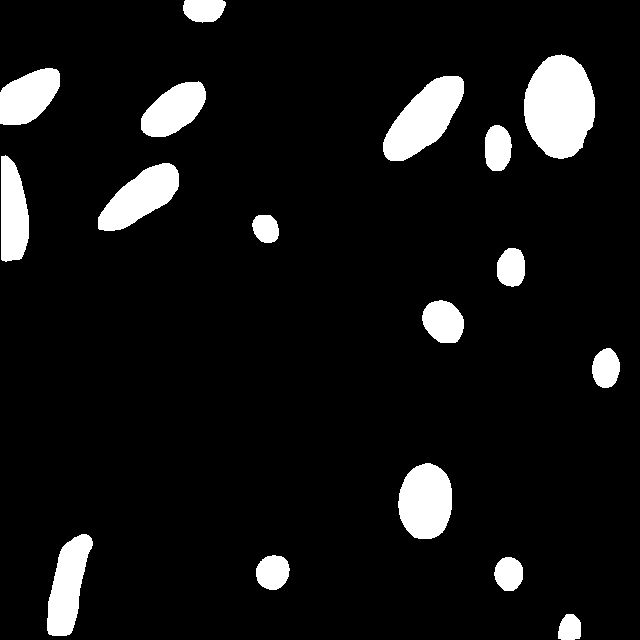

/content/gh-1/test/testing-143_jpg.rf.d8edcd310f0ed827f7e82fcaa4350bbc.jpg


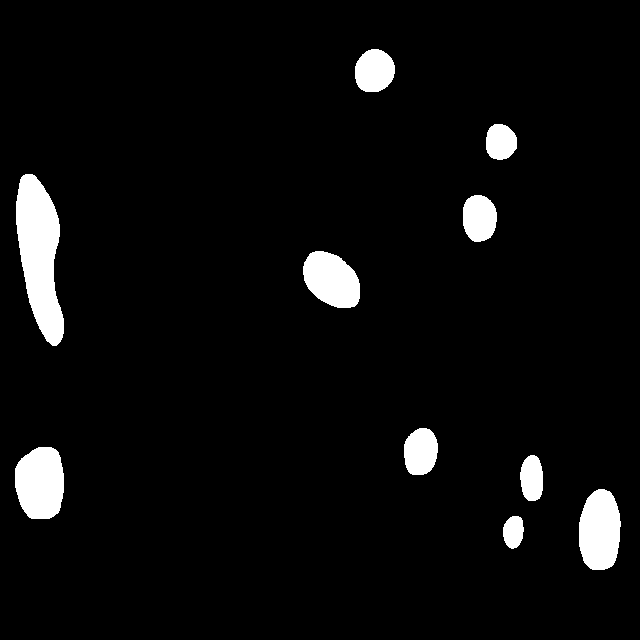

/content/gh-1/test/testing-158_jpg.rf.d05ffce9a9f2bdacbf052ad0a0ef18d0.jpg


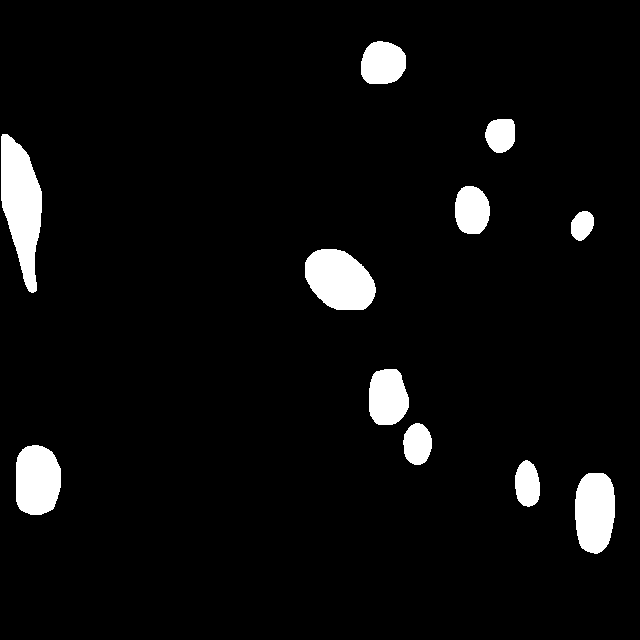

/content/gh-1/test/testing-114_jpg.rf.d7572a1372fd780cfaa066f20c38b67d.jpg


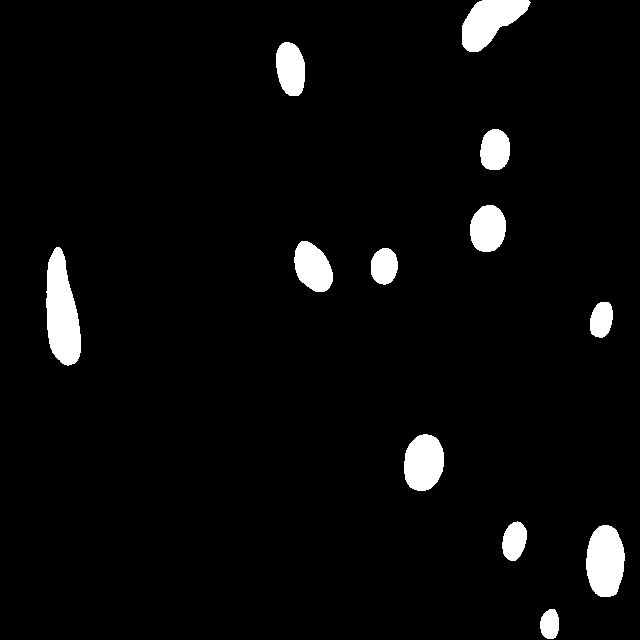

/content/gh-1/test/testing-088_jpg.rf.cacf3a68a99616663be5659a50a47c6b.jpg


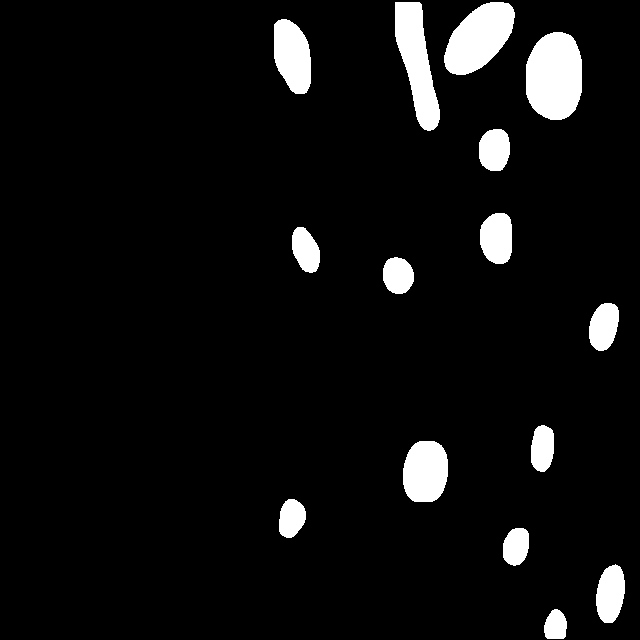

/content/gh-1/test/testing-061_jpg.rf.ceadf990a4b80c077451ad47a831326b.jpg


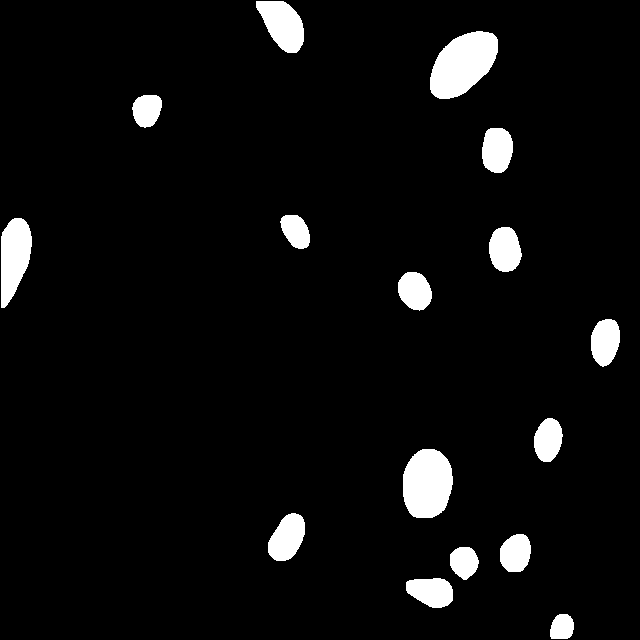

/content/gh-1/test/testing-094_jpg.rf.e15e3bbb45fc08528c115f4ff8fbd921.jpg


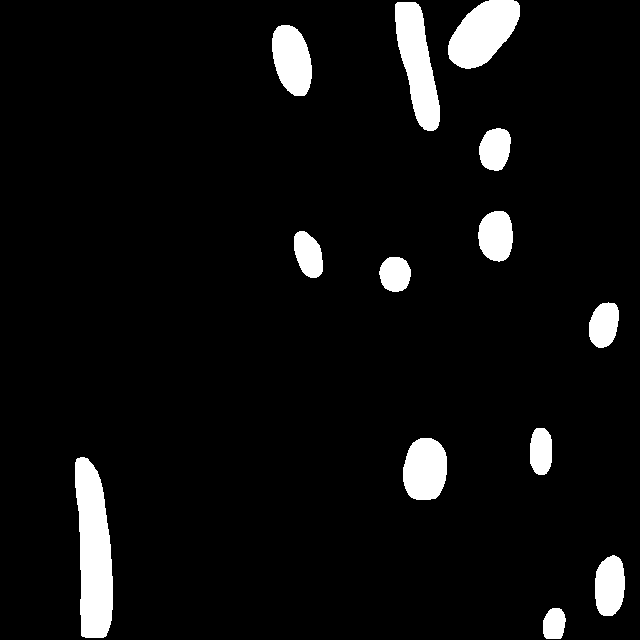

/content/gh-1/test/testing-154_jpg.rf.f6f44e5e6e603400810a05e46aa5d047.jpg


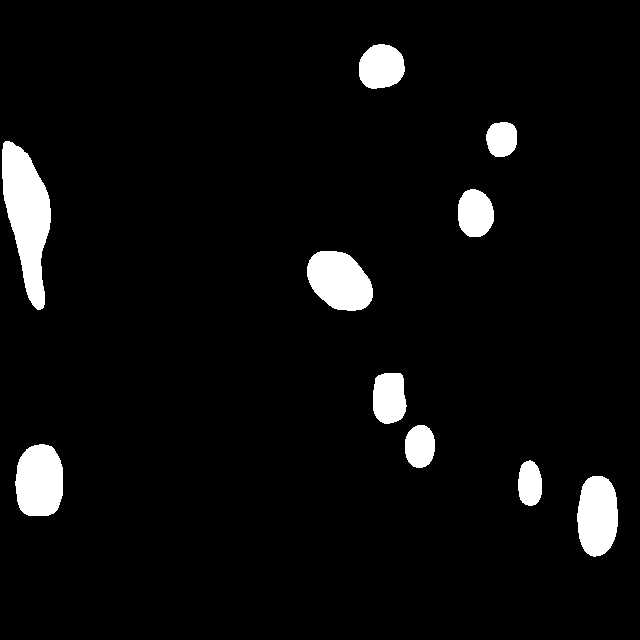

/content/gh-1/test/testing-065_jpg.rf.de5357d6f71e939be7a5bf1fddb569bf.jpg


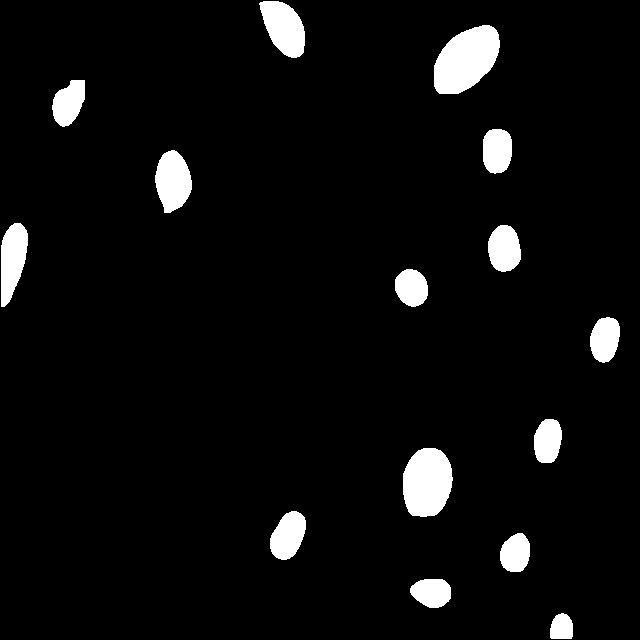

/content/gh-1/test/testing-079_jpg.rf.e3f6d2c8804818a5b2199b5003b7814f.jpg


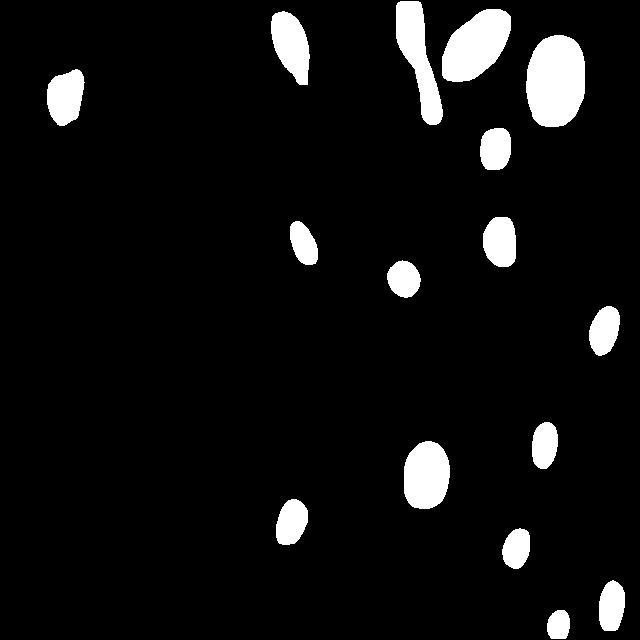

/content/gh-1/test/testing-116_jpg.rf.f2f0e78a2e0fc298b853e33192ce70b6.jpg


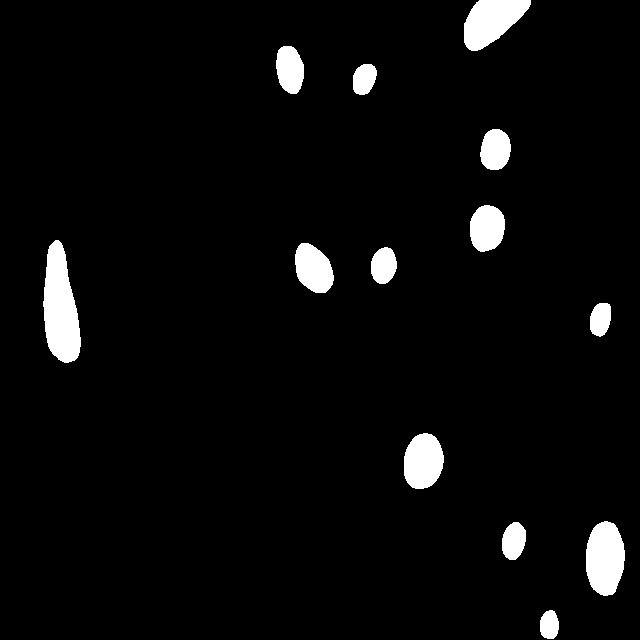

/content/gh-1/test/testing-124_jpg.rf.e4cc0eeb31d9d70ce06da524348ccf1e.jpg


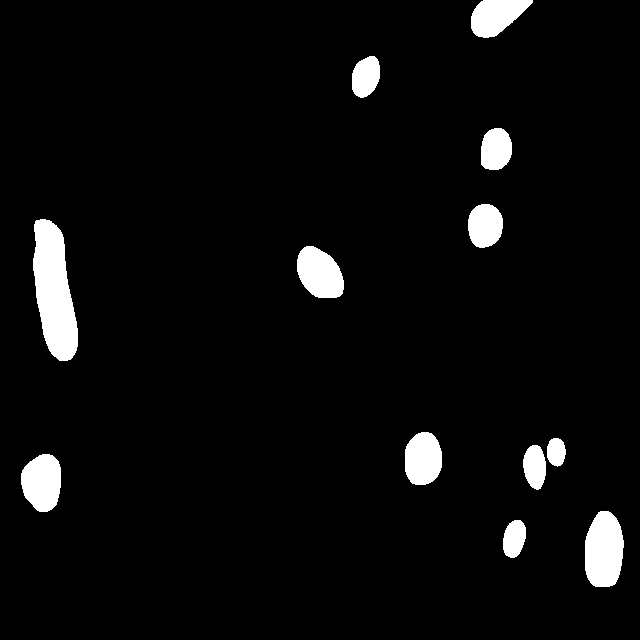

/content/gh-1/test/testing-111_jpg.rf.d516aee4d28225a4f40335d5ab23eb0a.jpg


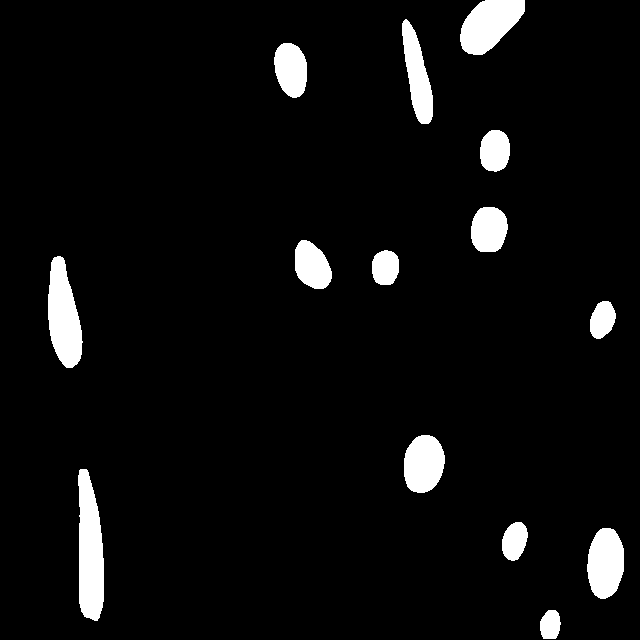

/content/gh-1/test/testing-123_jpg.rf.ed0a495bf2da4a520ce5c3b58e682479.jpg


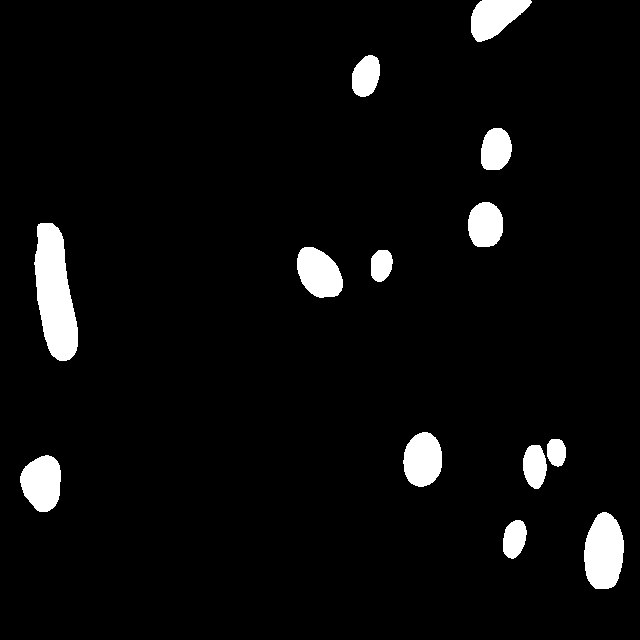

/content/gh-1/test/testing-144_jpg.rf.f80a605bdb29a84de1020777429acd09.jpg


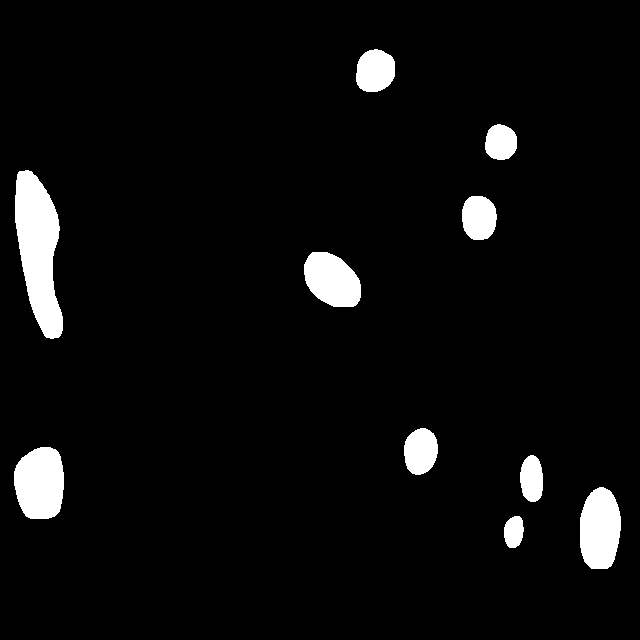

/content/gh-1/test/testing-089_jpg.rf.ecfd1a2f71aca3539a5b91a6af21b3fa.jpg


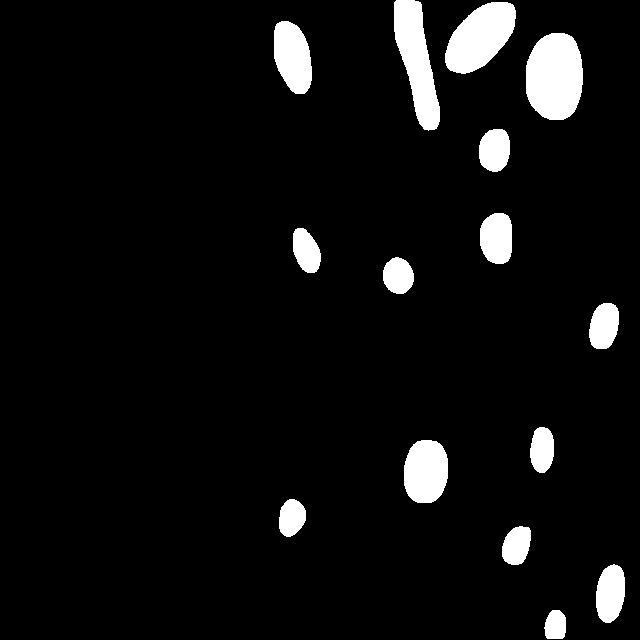

/content/gh-1/test/testing-085_jpg.rf.fff437c4be93a5a4fcfe9fd58684634f.jpg


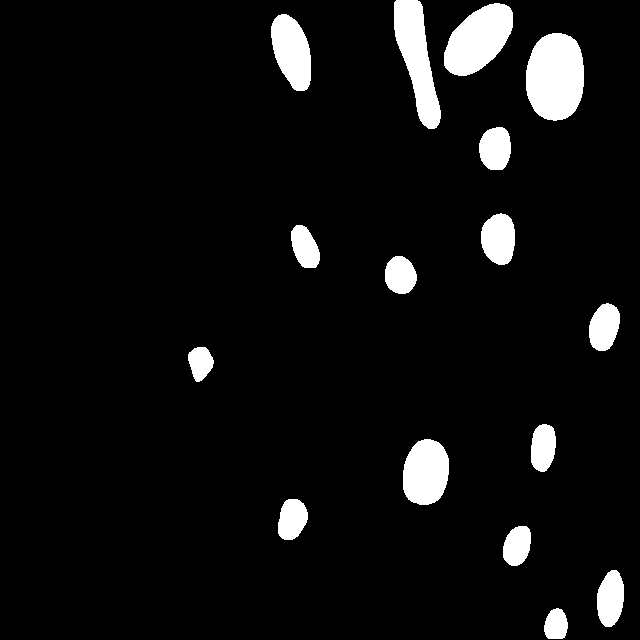

/content/gh-1/test/testing-118_jpg.rf.e3aaedda177287a8e4d297342ffc1c94.jpg


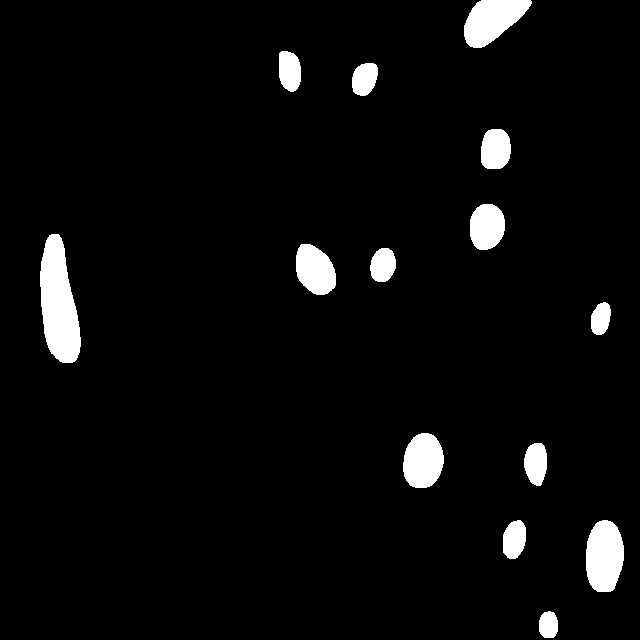

/content/gh-1/test/testing-032_jpg.rf.ff39c39124cfffd311e7bb12a40c71e6.jpg


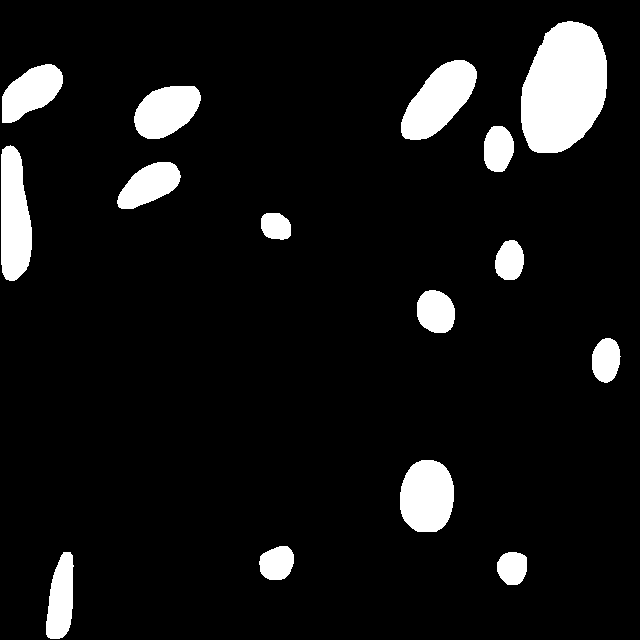

/content/gh-1/test/testing-074_jpg.rf.dd5b56b15e4f31be7e450703fc58c750.jpg


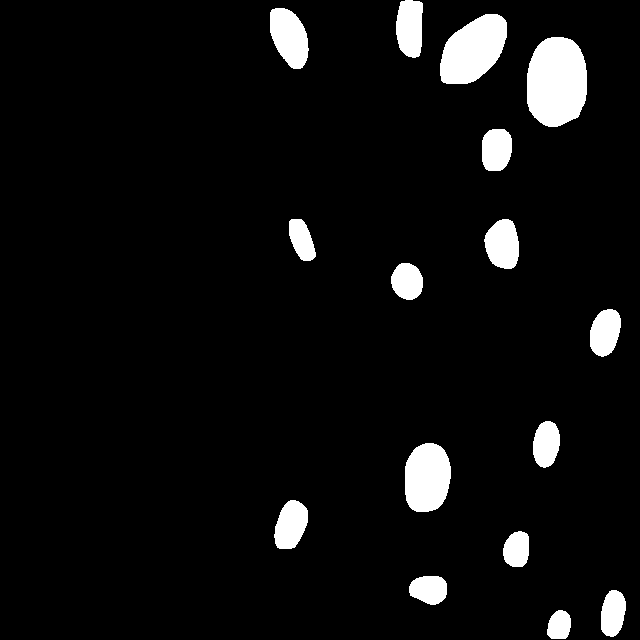

/content/gh-1/test/testing-075_jpg.rf.ff91ef1a9bf775c449b4c940def446d8.jpg


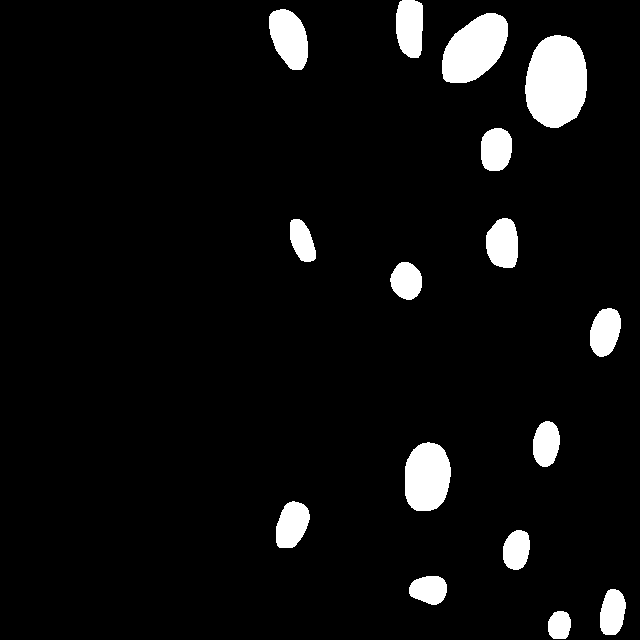

/content/gh-1/test/testing-160_jpg.rf.e1cca5382a93fb52ac769aa9b39db6d7.jpg


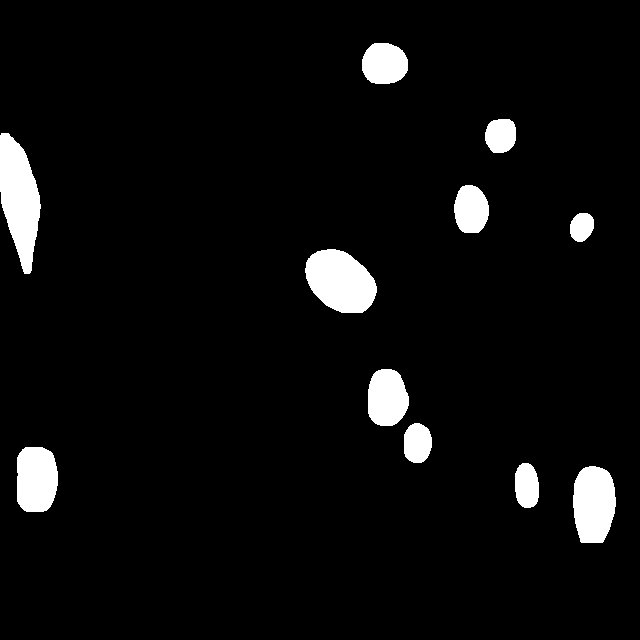

/content/gh-1/test/testing-141_jpg.rf.f4fd0a36eb027dba1ef78ae16281fbc5.jpg


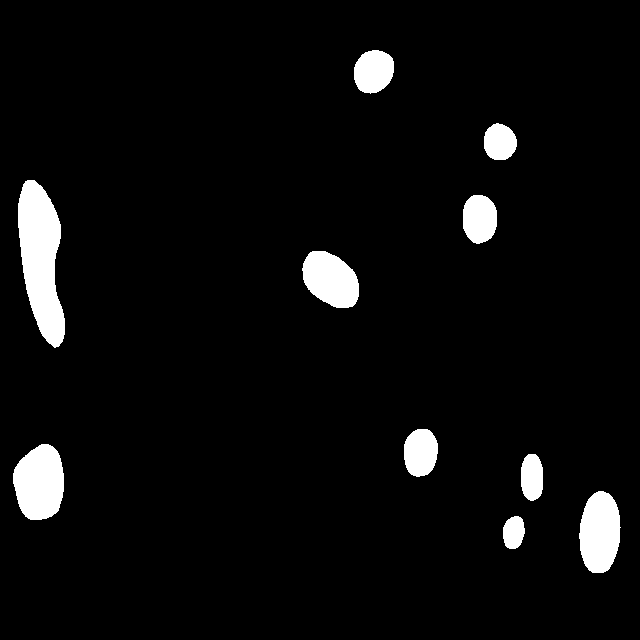

/content/gh-1/test/testing-045_jpg.rf.cdca01ffa0410cc253561b46ef65d173.jpg


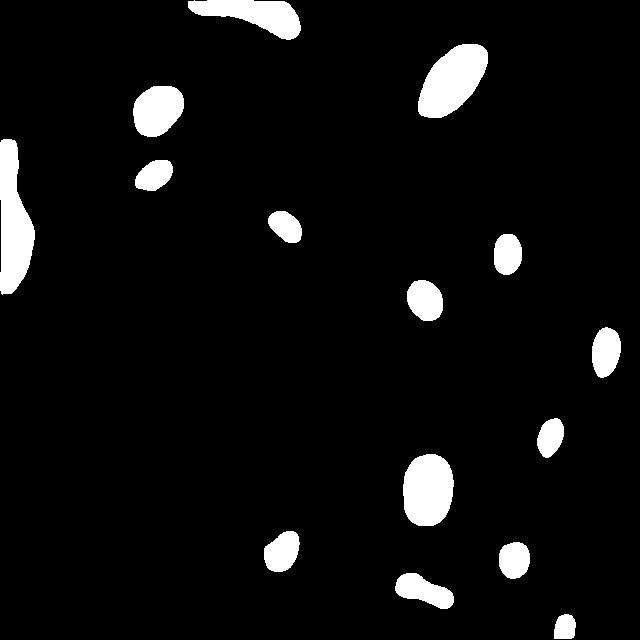

/content/gh-1/test/testing-020_jpg.rf.d2199d65743f85000f17031bed0f68fc.jpg


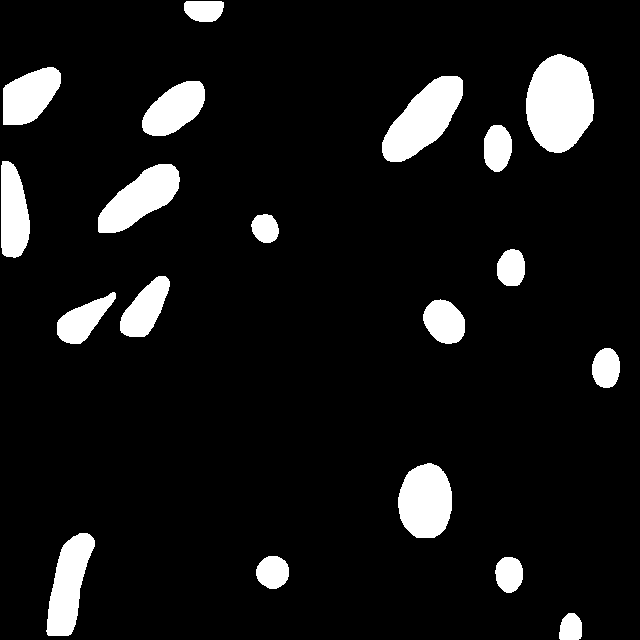

/content/gh-1/test/testing-023_jpg.rf.fd64c556d0a54eefce8a116acef0e031.jpg


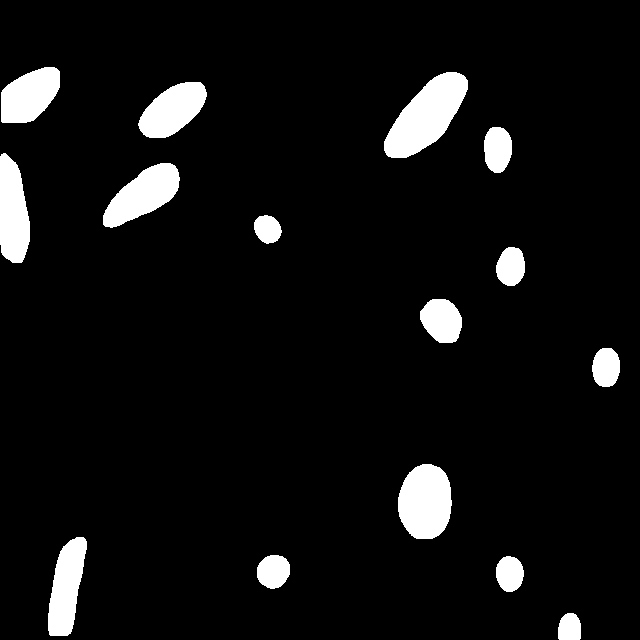

/content/gh-1/test/testing-145_jpg.rf.eacba5c596b1ba61f703c7326b3d5857.jpg


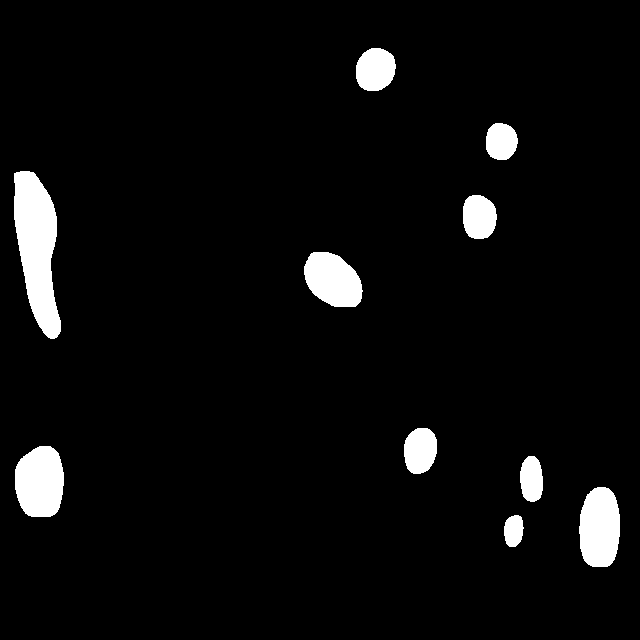

/content/gh-1/test/testing-056_jpg.rf.e97399df4c20881d1ba798e35bb46f56.jpg


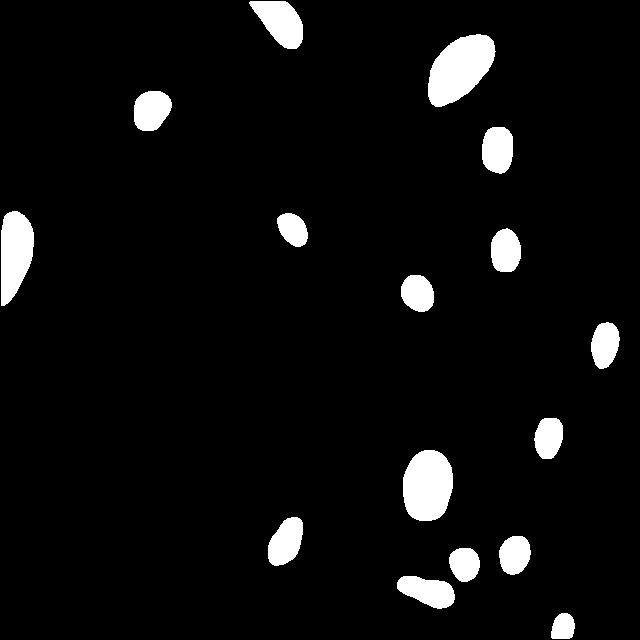

In [ ]:
new_predicted_mask = np.zeros_like(img)  # Boş bir maske oluştur
new_pd_mask_list=[]

for d in new_dataset_test:
  
    img = cv2.imread(d["file_name"])
    new_predicted_mask = np.zeros_like(img[:, :, 0])  # img ile aynı boyutta bir dizi oluştur
    outputs = predictor(img)
    instances = outputs["instances"]
    masks = instances.pred_masks.cpu().numpy()
    combined_mask = np.logical_or.reduce(masks).astype(np.uint8) * 255
    print(d["file_name"])
    new_pd_mask_list.append(combined_mask)
    cv2_imshow(combined_mask)
    # Her bir maskeyi birleştir

In [ ]:
toplam=0
sayac=0
for gt_mask, pd_mask in zip(new_gt_mask_list, new_pd_mask_list):
  intersection = np.logical_and(gt_mask, pd_mask)
  union = np.logical_or(gt_mask, pd_mask)
  iou = np.sum(intersection) / np.sum(union)
  toplam=toplam+iou
  sayac=sayac+1
sonuc=toplam/sayac
print("Test verisinden alınan görüntülerle ortalama jaccard değeri:",sonuc)

Test verisinden alınan görüntülerle ortalama jaccard değeri: 0.6876902653170146


In [ ]:
import os

# Maskelerin kaydedileceği klasörü belirtin
klasor_yolu = "/content/pd_masks"

# Klasörü oluştur
os.makedirs(klasor_yolu, exist_ok=True)
for i, mask in enumerate(new_pd_mask_list):
    # Maske dosya adını ve yolunu oluştur
    dosya_adi = f"mask_{i}.png"
    dosya_yolu = os.path.join(klasor_yolu, dosya_adi)

    # Maskeyi PNG formatında kaydet
    cv2.imwrite(dosya_yolu, mask)

In [ ]:
import shutil

# Dosyanın bulunduğu yol
klasor_yolu = "/content/pd_masks"

# Dosyayı belirtilen yere kopyala
shutil.make_archive("/content/pd_masks", 'zip', klasor_yolu)
from google.colab import files

# ZIP arşivini indir
files.download("/content/pd_masks.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os

# Maskelerin kaydedileceği klasörü belirtin
klasor_yolu = "/content/gt_masks"

# Klasörü oluştur
os.makedirs(klasor_yolu, exist_ok=True)
for i, mask in enumerate(new_gt_mask_list):
    # Maske dosya adını ve yolunu oluştur
    dosya_adi = f"mask_{i}.png"
    dosya_yolu = os.path.join(klasor_yolu, dosya_adi)

    # Maskeyi PNG formatında kaydet
    cv2.imwrite(dosya_yolu, mask)
import shutil

# Dosyanın bulunduğu yol
klasor_yolu = "/content/gt_masks"

# Dosyayı belirtilen yere kopyala
shutil.make_archive("/content/gt_masks", 'zip', klasor_yolu)
from google.colab import files

# ZIP arşivini indir
files.download("/content/gt_masks.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>